In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import collections

from keras.backend.tensorflow_backend import set_session
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.001
set_session(tf.Session(config=config))

C:\Users\user6\Anaconda3\envs\NP_for_test_JSD_tf13\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\user6\Anaconda3\envs\NP_for_test_JSD_tf13\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\user6\Anaconda3\envs\NP_for_test_JSD_tf13\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\user6\Anaconda3\env

In [2]:
# The (A)NP takes as input a `NPRegressionDescription` namedtuple with fields:
#   `query`: a tuple containing ((context_x, context_y), target_x)
#   `target_y`: a tensor containing the ground truth for the targets to be
#     predicted
#   `num_total_points`: A vector containing a scalar that describes the total
#     number of datapoints used (context + target)
#   `num_context_points`: A vector containing a scalar that describes the number
#     of datapoints used as context
# The GPCurvesReader returns the newly sampled data in this format at each
# iteration

NPRegressionDescription = collections.namedtuple(
    "NPRegressionDescription",
    ("query", "target_y", "num_total_points", "num_context_points", "l1", "sigma_f"))


class GPCurvesReader(object):
  """Generates curves using a Gaussian Process (GP).

  Supports vector inputs (x) and vector outputs (y). Kernel is
  mean-squared exponential, using the x-value l2 coordinate distance scaled by
  some factor chosen randomly in a range. Outputs are independent gaussian
  processes.
  """

  def __init__(self,
               batch_size,
               max_num_context,
               x_size=1,
               y_size=1,
               l1_scale=0.6,  # change the length scale to what you want
               sigma_scale=1.0,
               random_kernel_parameters=False,
               testing=False):
    """Creates a regression dataset of functions sampled from a GP.

    Args:
      batch_size: An integer.
      max_num_context: The max number of observations in the context.
      x_size: Integer >= 1 for length of "x values" vector.
      y_size: Integer >= 1 for length of "y values" vector.
      l1_scale: Float; typical scale for kernel distance function.
      sigma_scale: Float; typical scale for variance.
      random_kernel_parameters: If `True`, the kernel parameters (l1 and sigma) 
          will be sampled uniformly within [0.1, l1_scale] and [0.1, sigma_scale].
      testing: Boolean that indicates whether we are testing. If so there are
          more targets for visualization.
    """
    self._batch_size = batch_size
    self._max_num_context = max_num_context
    self._x_size = x_size
    self._y_size = y_size
    self._l1_scale = l1_scale
    self._sigma_scale = sigma_scale
    self._random_kernel_parameters = random_kernel_parameters
    self._testing = testing

  def _gaussian_kernel(self, xdata, l1, sigma_f, sigma_noise=2e-2):
    """Applies the Gaussian kernel to generate curve data.

    Args:
      xdata: Tensor of shape [B, num_total_points, x_size] with
          the values of the x-axis data.
      l1: Tensor of shape [B, y_size, x_size], the scale
          parameter of the Gaussian kernel.
      sigma_f: Tensor of shape [B, y_size], the magnitude
          of the std.
      sigma_noise: Float, std of the noise that we add for stability.

    Returns:
      The kernel, a float tensor of shape
      [B, y_size, num_total_points, num_total_points].
    """
    
    num_total_points = tf.shape(xdata)[1]

    # Expand and take the difference
    xdata1 = tf.expand_dims(xdata, axis=1)  # [B, 1, num_total_points, x_size]
    xdata2 = tf.expand_dims(xdata, axis=2)  # [B, num_total_points, 1, x_size]
    diff = xdata1 - xdata2  # [B, num_total_points, num_total_points, x_size]

    # [B, y_size, num_total_points, num_total_points, x_size]
    norm = tf.square(diff[:, None, :, :, :] / l1[:, :, None, None, :])

    norm = tf.reduce_sum(
        norm, -1)  # [B, data_size, num_total_points, num_total_points]

    # [B, y_size, num_total_points, num_total_points]
    kernel = tf.square(sigma_f)[:, :, None, None] * tf.exp(-0.5 * norm)

    # Add some noise to the diagonal to make the cholesky work.
    kernel += (sigma_noise**2) * tf.eye(num_total_points)

    return kernel

  def generate_curves(self):
    """Builds the op delivering the data.

    Generated functions are `float32` with x values between -2 and 2.
    
    Returns:
      A `NPRegressionDescription` namedtuple.
    """
    num_context = tf.random_uniform(
        shape=[], minval=3, maxval=self._max_num_context, dtype=tf.int32)

    # If we are testing we want to have more targets and have them evenly
    # distributed in order to plot the function.
    if self._testing:
      num_target = 400
      num_total_points = num_target
      x_values = tf.tile(
          tf.expand_dims(tf.range(-2., 2., 1. / 100, dtype=tf.float32), axis=0),
          [self._batch_size, 1])
      x_values = tf.expand_dims(x_values, axis=-1)
    # During training the number of target points and their x-positions are
    # selected at random
    else:
      num_target = tf.random_uniform(shape=(), minval=0, 
                                     maxval=self._max_num_context - num_context,
                                     dtype=tf.int32)
      num_total_points = num_context + num_target
      x_values = tf.random_uniform(
          [self._batch_size, num_total_points, self._x_size], -2, 2)

    # Set kernel parameters
    # Either choose a set of random parameters for the mini-batch
    if self._random_kernel_parameters:
        print('random parameters')
        l1 = tf.random_uniform([self._batch_size, self._y_size,
                              self._x_size], 0.1, self._l1_scale)
        sigma_f = tf.random_uniform([self._batch_size, self._y_size],
                                  0.1, self._sigma_scale)
    # Or use the same fixed parameters for all mini-batches
    else:
        print('fixed parameters')
        l1 = tf.ones(shape=[self._batch_size, self._y_size,
                          self._x_size]) * self._l1_scale
        sigma_f = tf.ones(shape=[self._batch_size,
                               self._y_size]) * self._sigma_scale

    # Pass the x_values through the Gaussian kernel
    # [batch_size, y_size, num_total_points, num_total_points]
    print('l1 = ', l1)
    print('sigma_f = ', sigma_f)
    kernel = self._gaussian_kernel(x_values, l1, sigma_f)

    # Calculate Cholesky, using double precision for better stability:
    cholesky = tf.cast(tf.cholesky(tf.cast(kernel, tf.float64)), tf.float32)

    # Sample a curve
    # [batch_size, y_size, num_total_points, 1]
    y_values = tf.matmul(
        cholesky,
        tf.random_normal([self._batch_size, self._y_size, num_total_points, 1]))

    # [batch_size, num_total_points, y_size]
    y_values = tf.transpose(tf.squeeze(y_values, 3), [0, 2, 1])

    if self._testing:
      # Select the targets
      target_x = x_values
      target_y = y_values

      # Select the observations
      idx = tf.random_shuffle(tf.range(num_target))
      context_x = tf.gather(x_values, idx[:num_context], axis=1)
      context_y = tf.gather(y_values, idx[:num_context], axis=1)

    else:
      # Select the targets which will consist of the context points as well as
      # some new target points
      target_x = x_values[:, :num_target + num_context, :]
      target_y = y_values[:, :num_target + num_context, :]

      # Select the observations
      context_x = x_values[:, :num_context, :]
      context_y = y_values[:, :num_context, :]

    query = ((context_x, context_y), target_x)

    return NPRegressionDescription(
        query=query,
        target_y=target_y,
        num_total_points=tf.shape(target_x)[1],
        num_context_points=num_context,
        l1=l1,
        sigma_f=sigma_f)

In [3]:
TRAINING_ITERATIONS = 100000 #@param {type:"number"}
MAX_CONTEXT_POINTS = 100
PLOT_AFTER = 10000 #@param {type:"number"}
HIDDEN_SIZE = 128 #@param {type:"number"}
MODEL_TYPE = 'ANP' #@param ['NP','ANP']
ATTENTION_TYPE = 'multihead' #@param ['uniform','laplace','dot_product','multihead']
random_kernel_parameters=False #@param {type:"boolean"}

tf.reset_default_graph()
# Train dataset
dataset_train = GPCurvesReader(
    batch_size=1, max_num_context=MAX_CONTEXT_POINTS)
data_train = dataset_train.generate_curves()

# Test dataset
dataset_test = GPCurvesReader(batch_size=1, max_num_context=MAX_CONTEXT_POINTS, random_kernel_parameters=random_kernel_parameters, testing=True)
data_test = dataset_test.generate_curves()

fixed parameters
l1 =  Tensor("mul:0", shape=(1, 1, 1), dtype=float32)
sigma_f =  Tensor("mul_1:0", shape=(1, 1), dtype=float32)
fixed parameters
l1 =  Tensor("mul_5:0", shape=(1, 1, 1), dtype=float32)
sigma_f =  Tensor("mul_6:0", shape=(1, 1), dtype=float32)


In [4]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
# from sklearn.gaussian_process.kernels import RBF, Matern
from scipy.interpolate import interp1d
import random

### true function numbers
# TRUEF_NUM = 100
TRUEF_NUM = 500


context_x =  (1, 36, 1)
context_y =  (1, 36, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


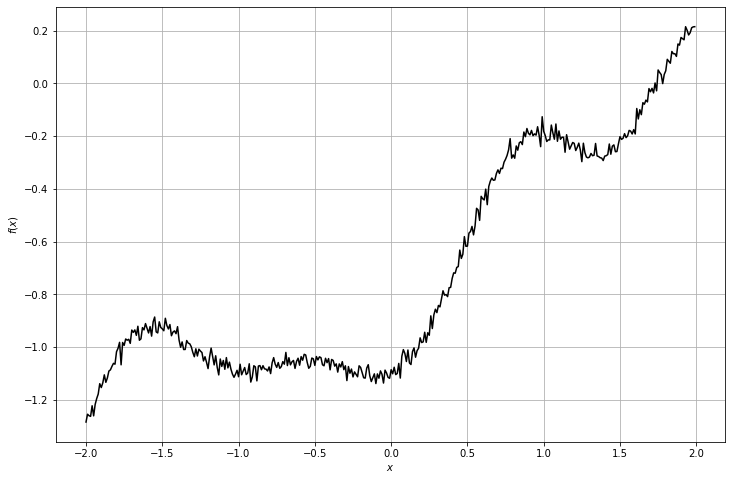

context_x =  (1, 10, 1)
context_y =  (1, 10, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


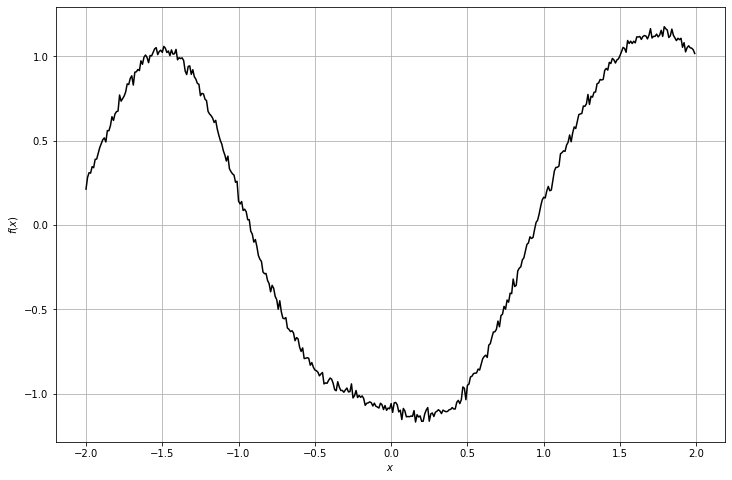

context_x =  (1, 4, 1)
context_y =  (1, 4, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


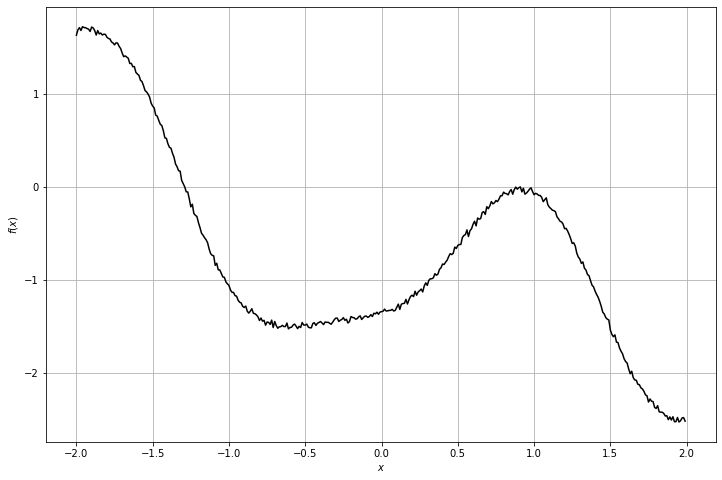

context_x =  (1, 23, 1)
context_y =  (1, 23, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


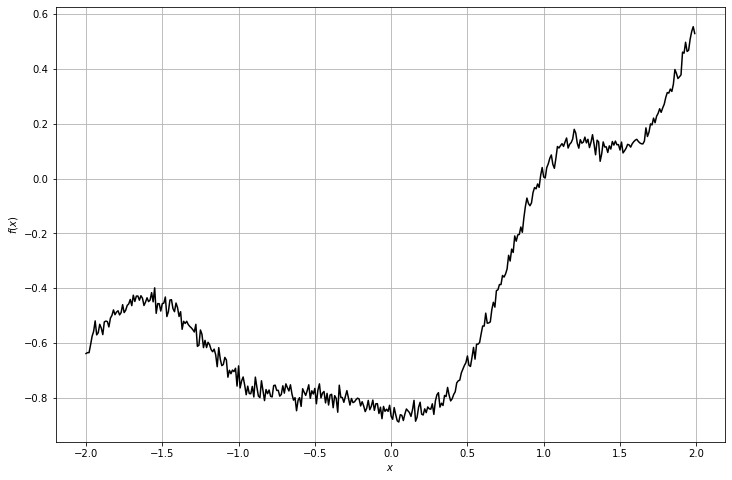

context_x =  (1, 12, 1)
context_y =  (1, 12, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


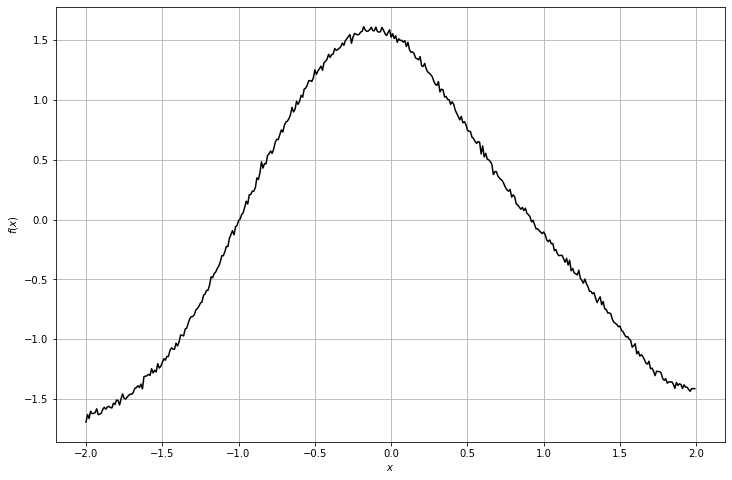

context_x =  (1, 49, 1)
context_y =  (1, 49, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


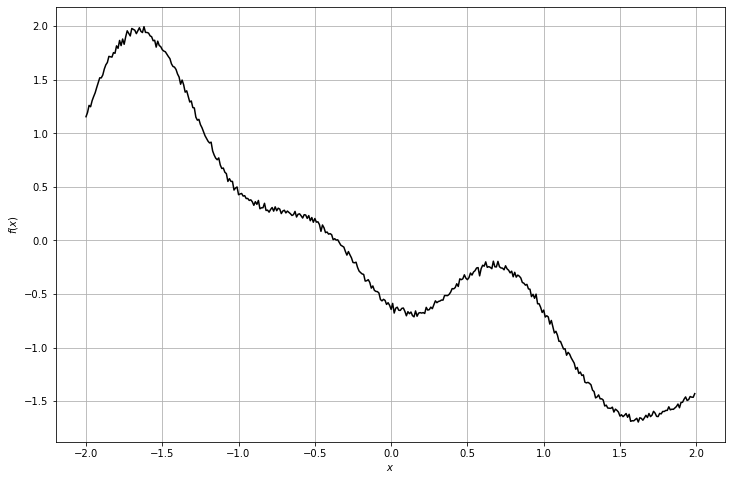

context_x =  (1, 5, 1)
context_y =  (1, 5, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


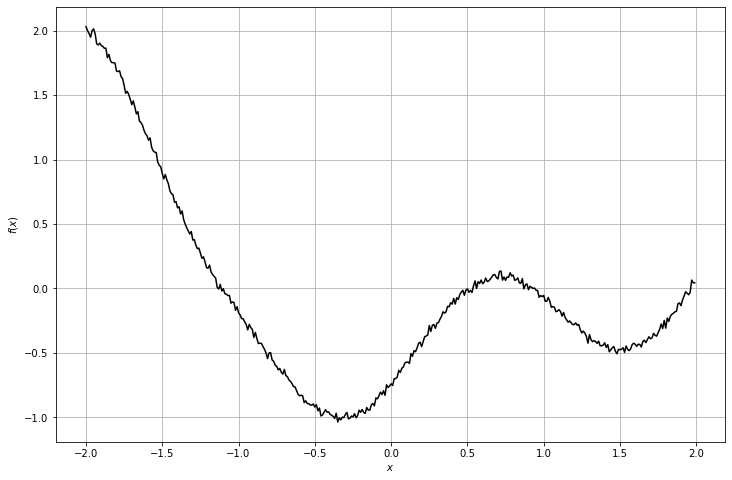

context_x =  (1, 90, 1)
context_y =  (1, 90, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


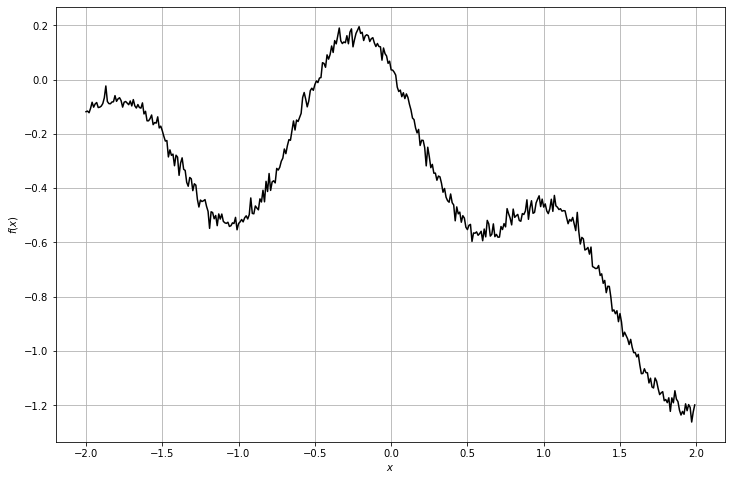

context_x =  (1, 11, 1)
context_y =  (1, 11, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


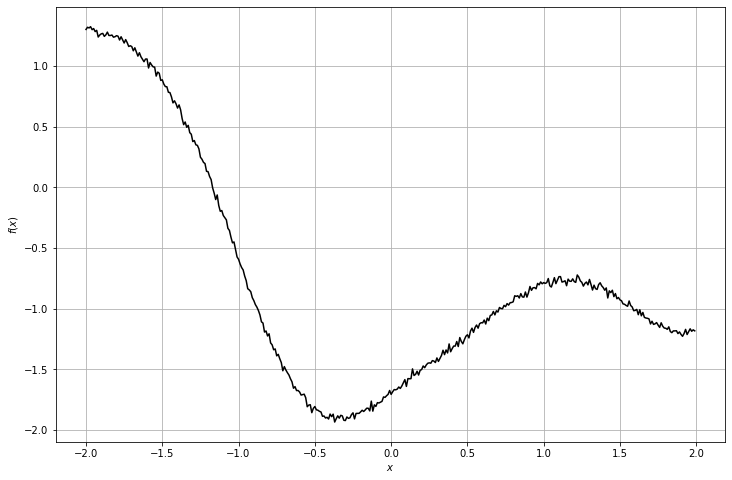

context_x =  (1, 73, 1)
context_y =  (1, 73, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


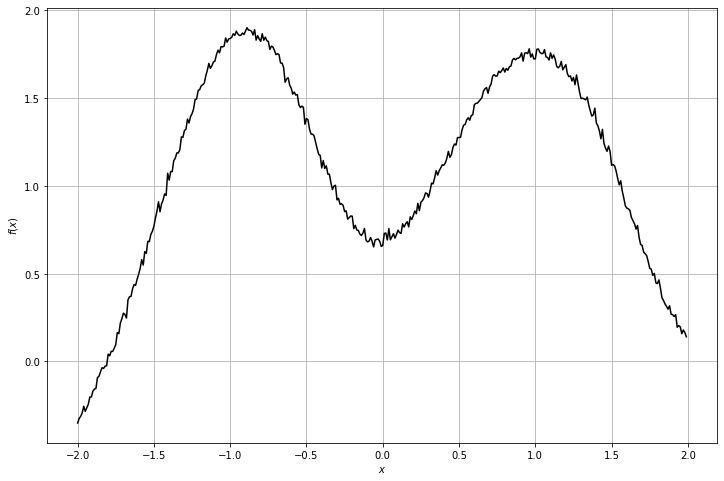

context_x =  (1, 61, 1)
context_y =  (1, 61, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


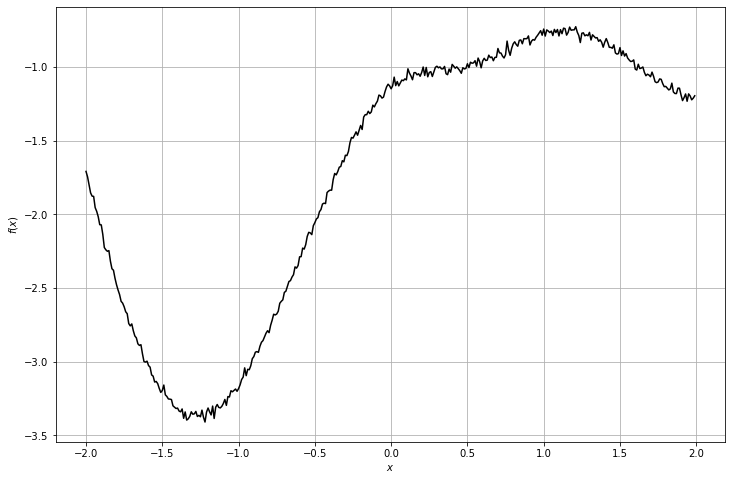

context_x =  (1, 7, 1)
context_y =  (1, 7, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


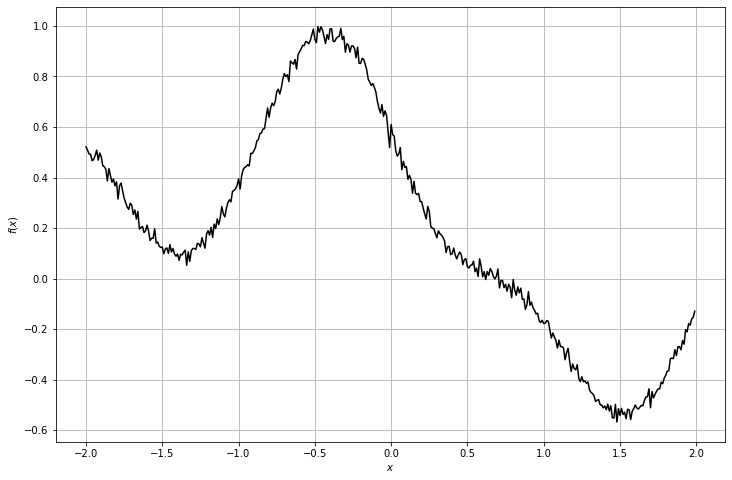

context_x =  (1, 44, 1)
context_y =  (1, 44, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


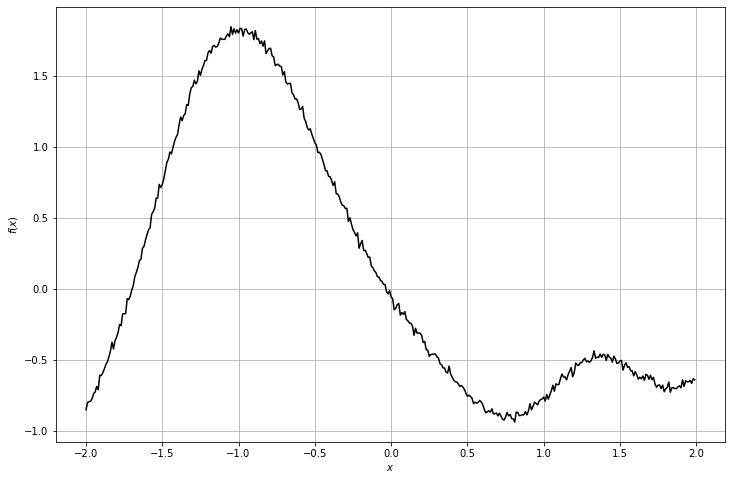

context_x =  (1, 51, 1)
context_y =  (1, 51, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


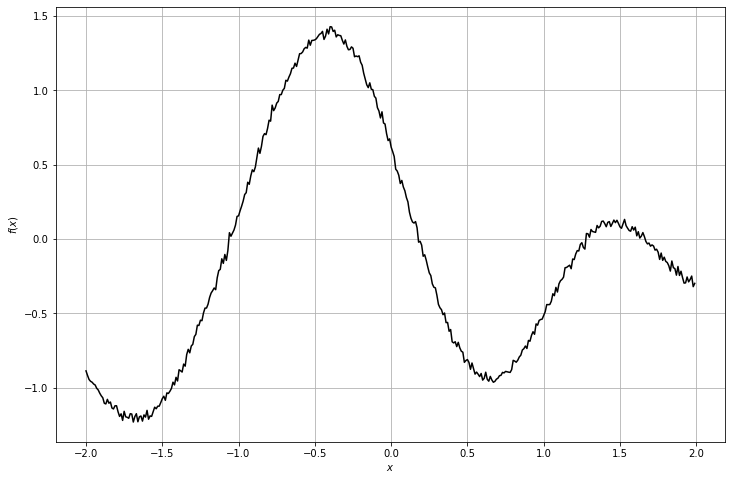

context_x =  (1, 85, 1)
context_y =  (1, 85, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


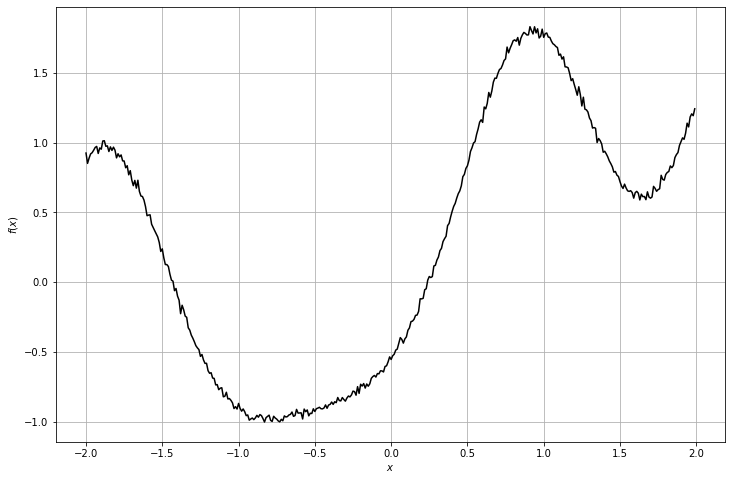

context_x =  (1, 82, 1)
context_y =  (1, 82, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


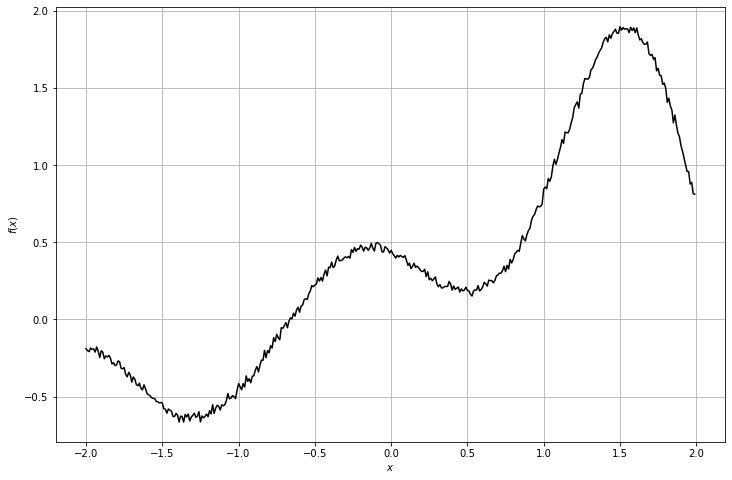

context_x =  (1, 40, 1)
context_y =  (1, 40, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


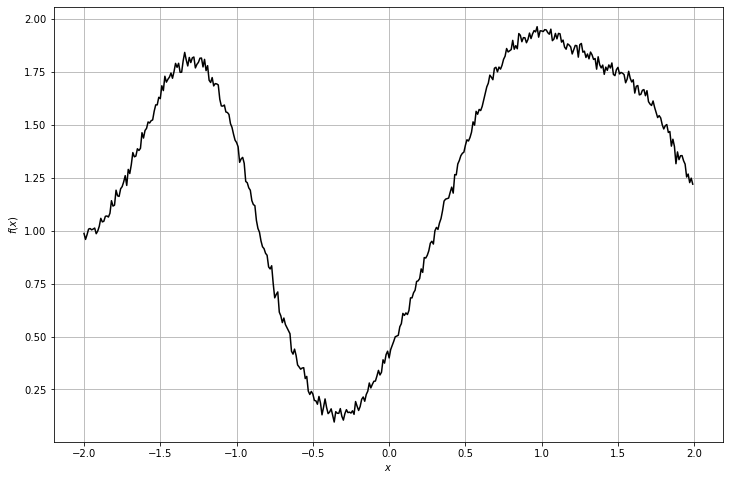

context_x =  (1, 29, 1)
context_y =  (1, 29, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


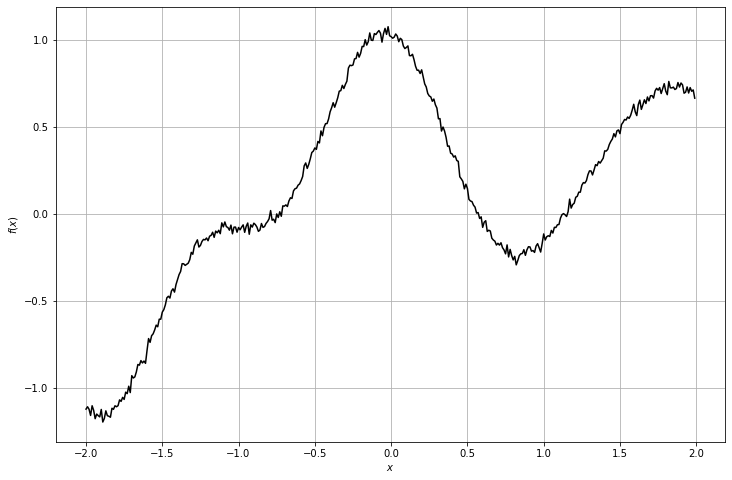

context_x =  (1, 18, 1)
context_y =  (1, 18, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


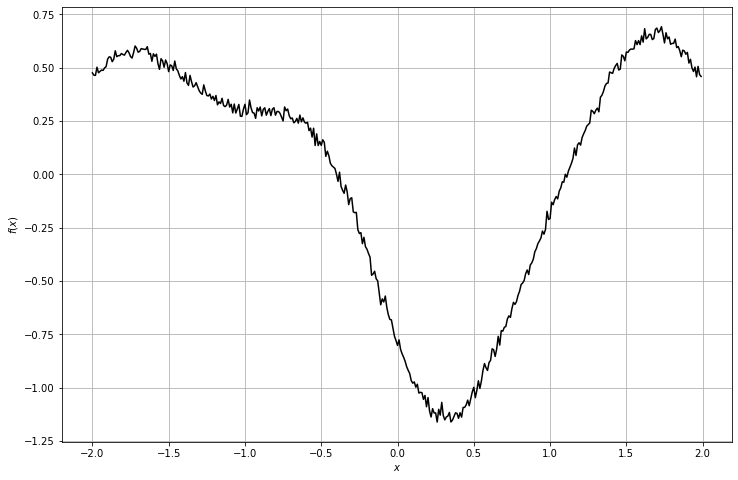

context_x =  (1, 10, 1)
context_y =  (1, 10, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


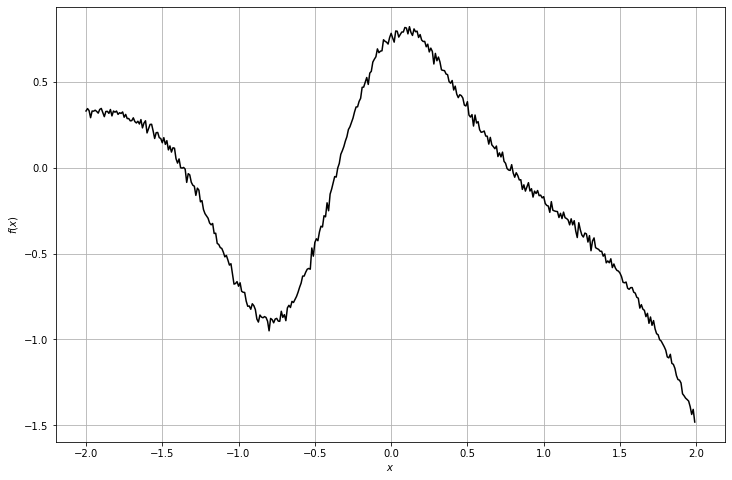

context_x =  (1, 78, 1)
context_y =  (1, 78, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


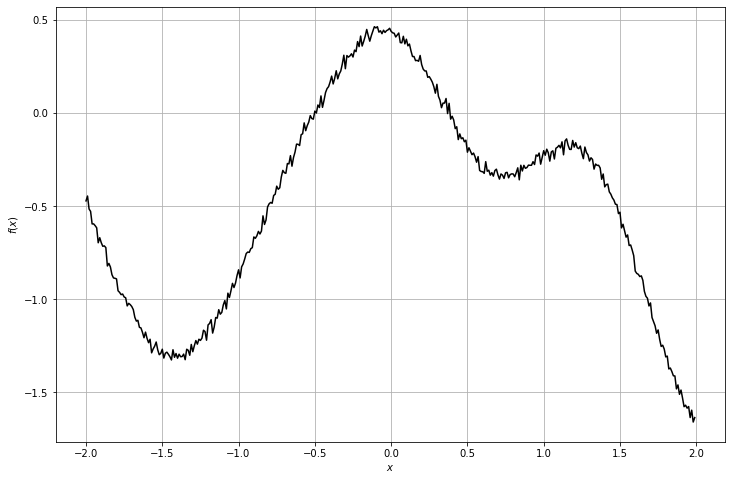

context_x =  (1, 52, 1)
context_y =  (1, 52, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


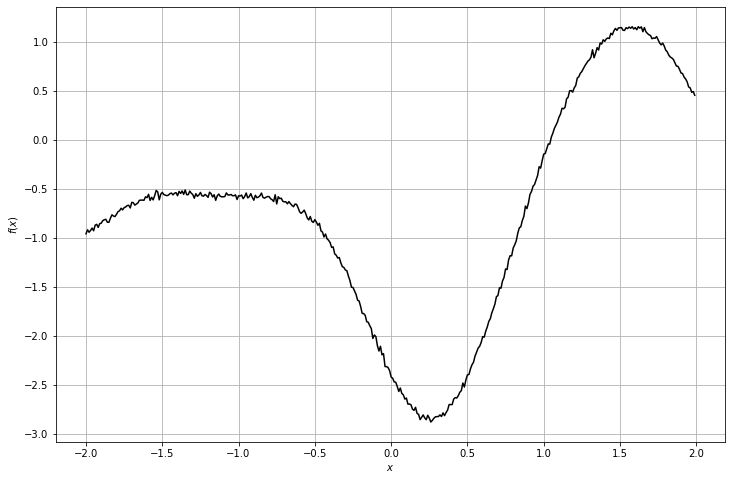

context_x =  (1, 85, 1)
context_y =  (1, 85, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


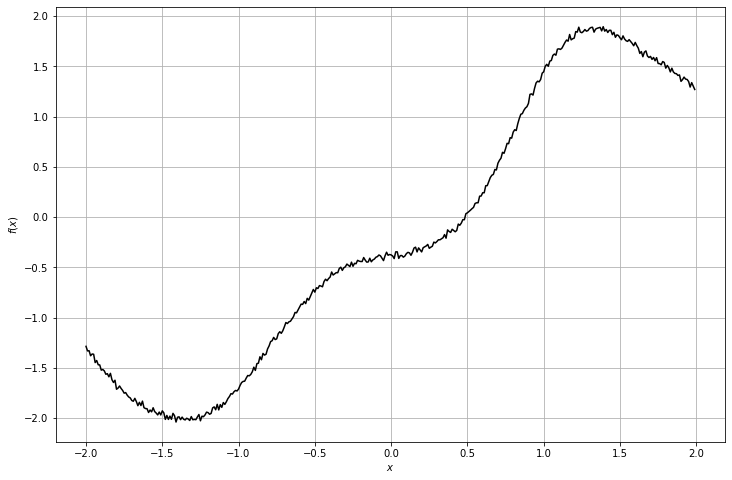

context_x =  (1, 4, 1)
context_y =  (1, 4, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


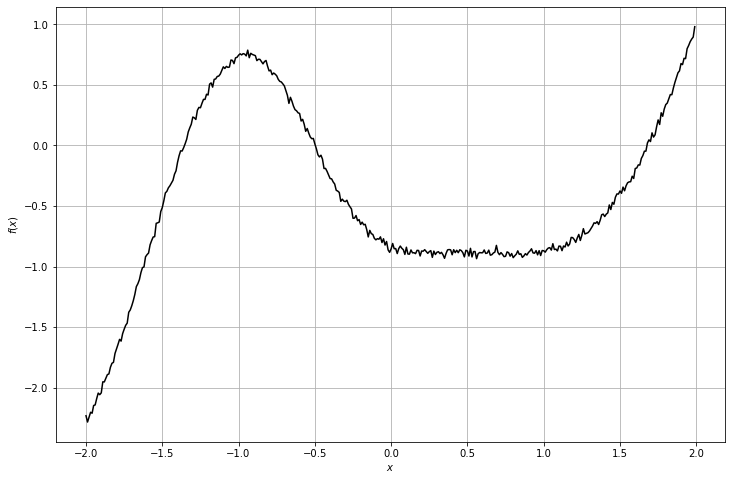

context_x =  (1, 51, 1)
context_y =  (1, 51, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


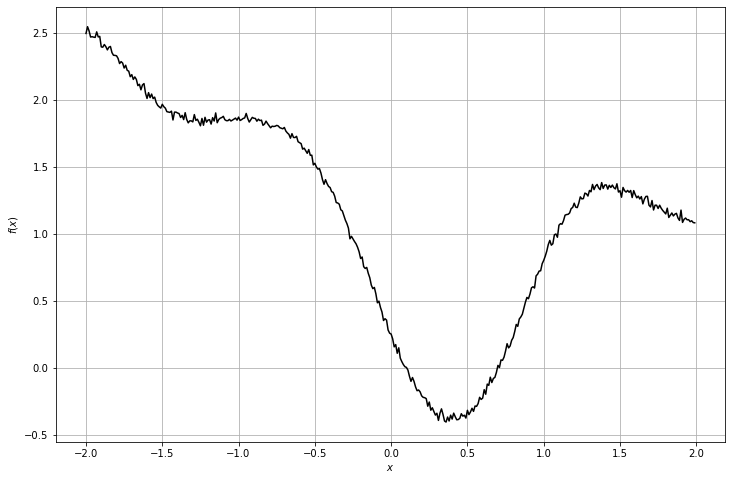

context_x =  (1, 38, 1)
context_y =  (1, 38, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


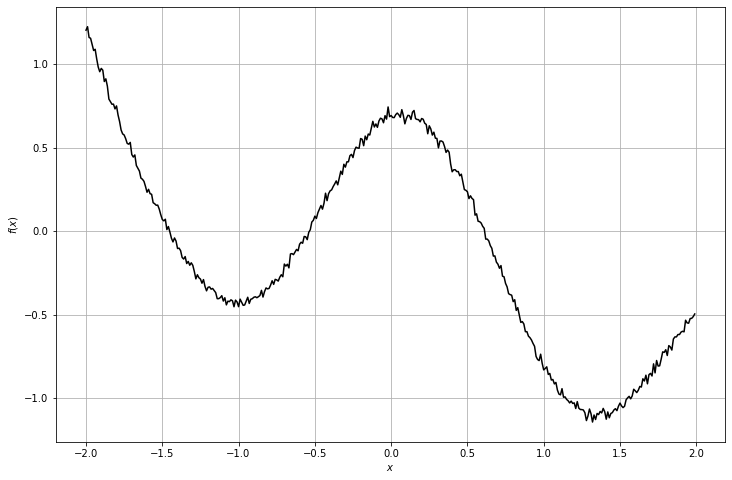

context_x =  (1, 83, 1)
context_y =  (1, 83, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


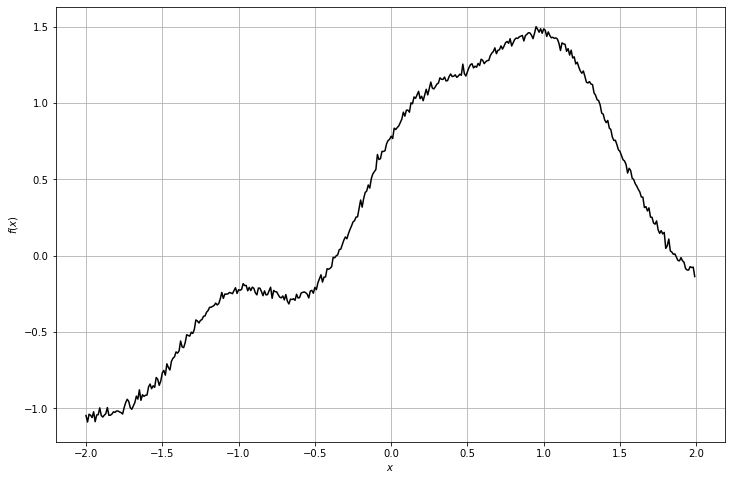

context_x =  (1, 97, 1)
context_y =  (1, 97, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


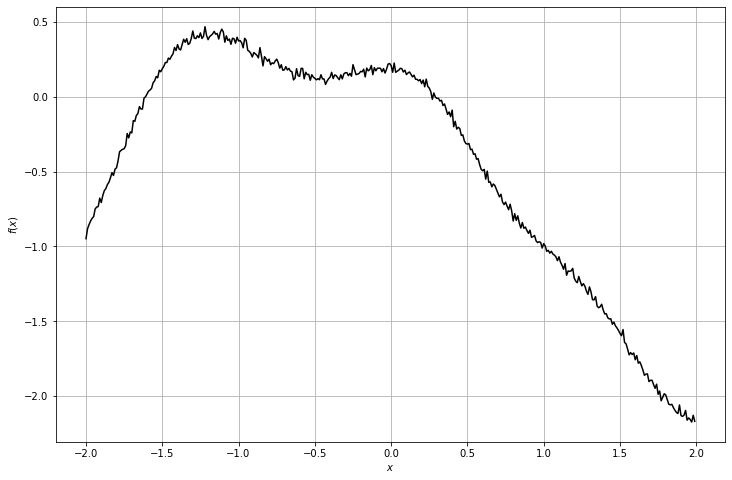

context_x =  (1, 56, 1)
context_y =  (1, 56, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


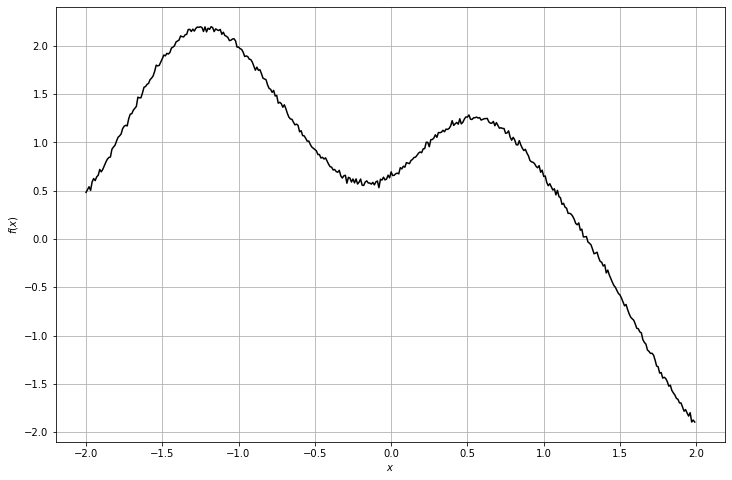

context_x =  (1, 8, 1)
context_y =  (1, 8, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


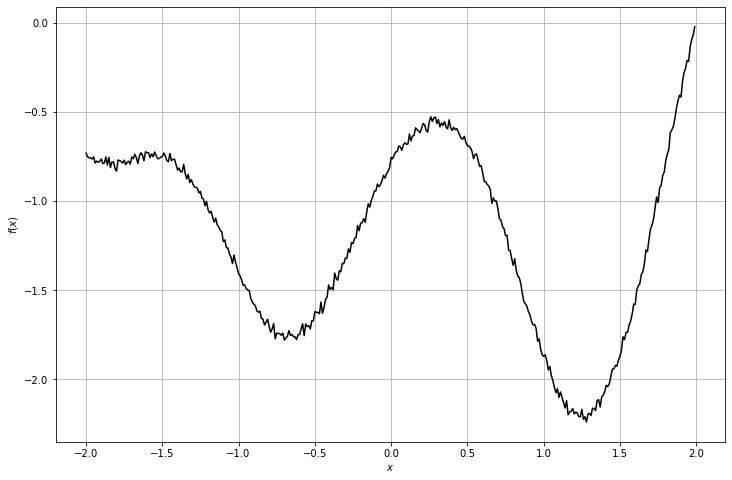

context_x =  (1, 19, 1)
context_y =  (1, 19, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


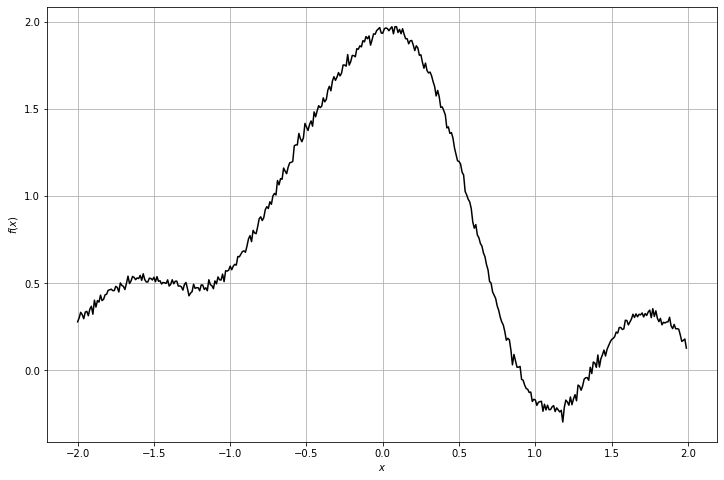

context_x =  (1, 57, 1)
context_y =  (1, 57, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


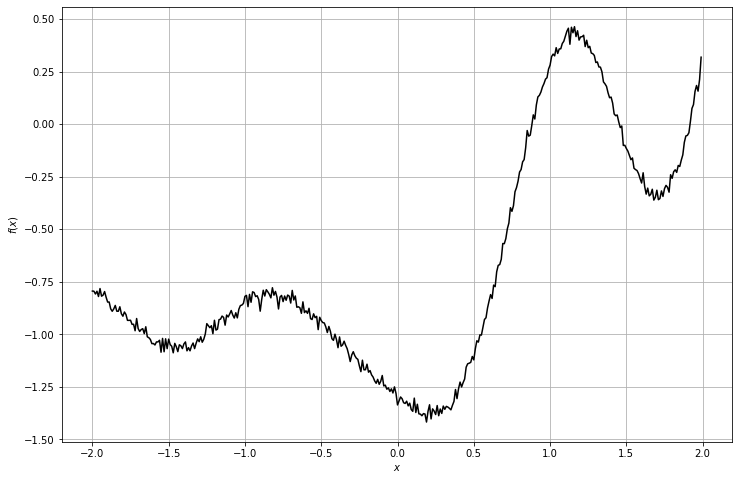

context_x =  (1, 7, 1)
context_y =  (1, 7, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


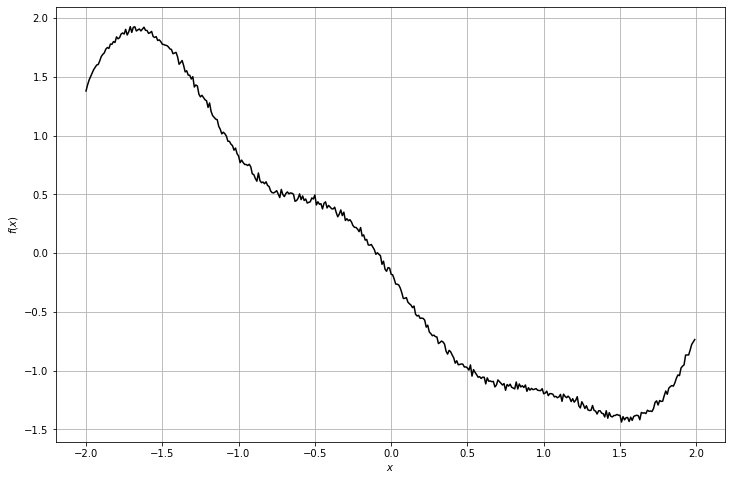

context_x =  (1, 32, 1)
context_y =  (1, 32, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


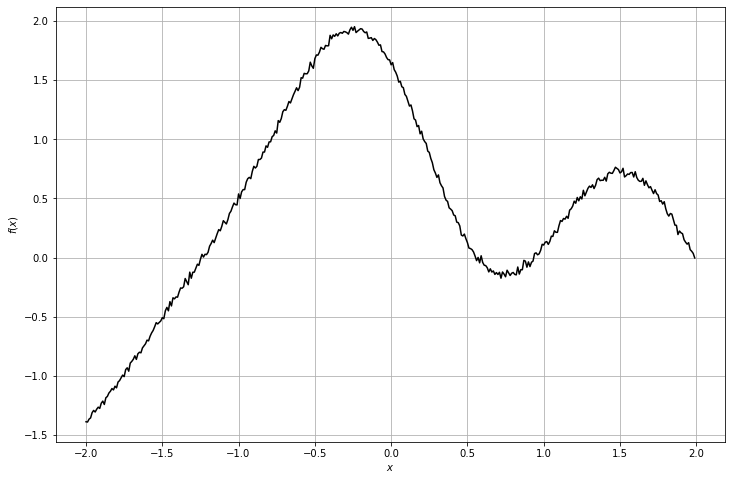

context_x =  (1, 89, 1)
context_y =  (1, 89, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


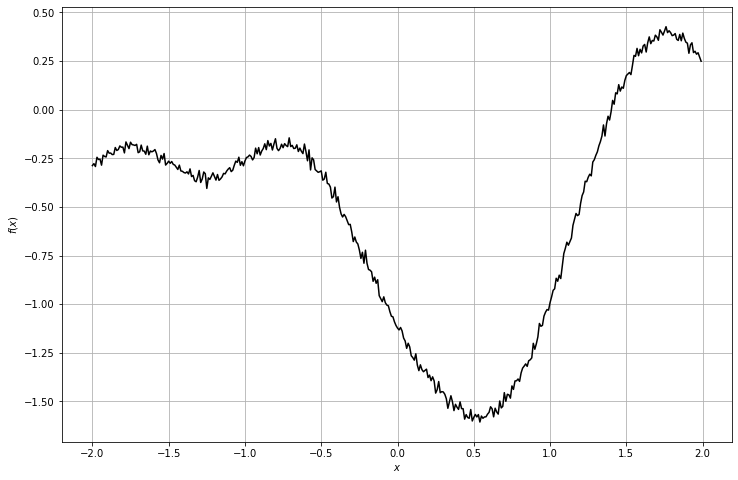

context_x =  (1, 84, 1)
context_y =  (1, 84, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


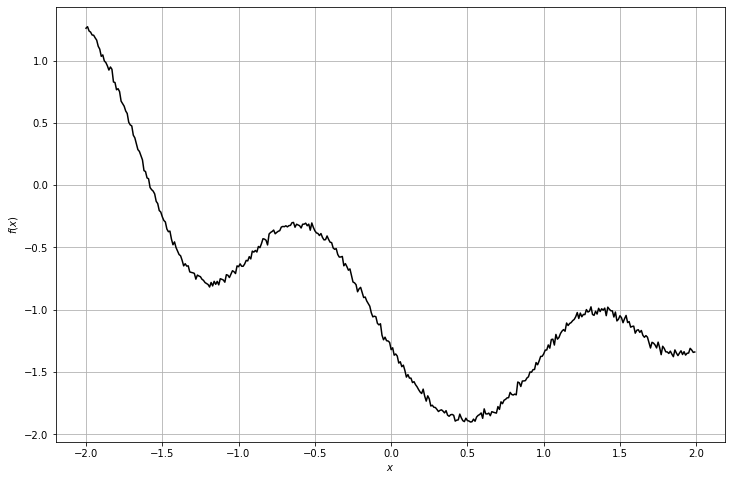

context_x =  (1, 96, 1)
context_y =  (1, 96, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


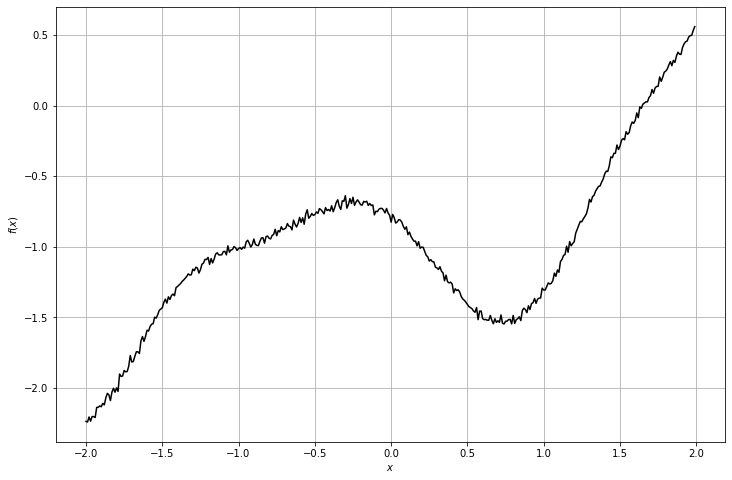

context_x =  (1, 99, 1)
context_y =  (1, 99, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


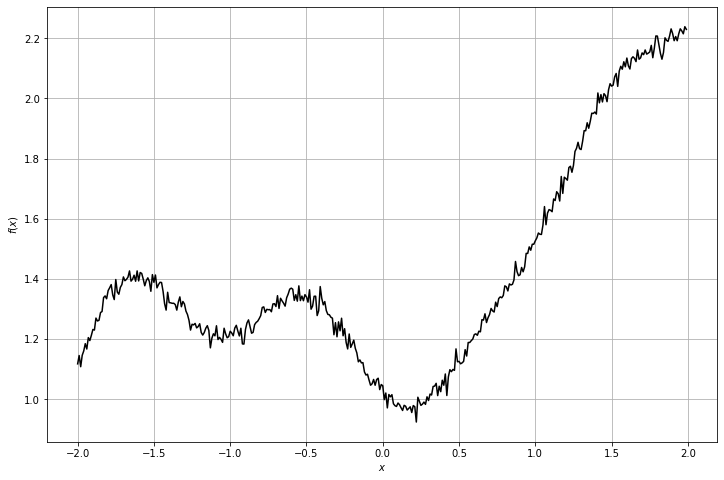

context_x =  (1, 12, 1)
context_y =  (1, 12, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


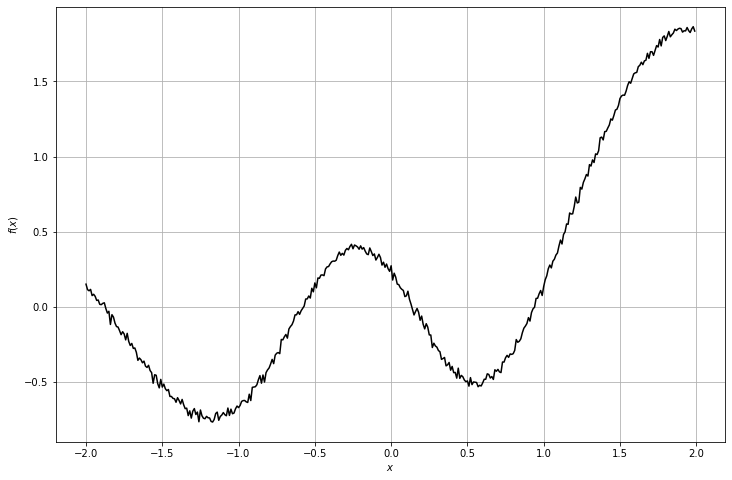

context_x =  (1, 12, 1)
context_y =  (1, 12, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


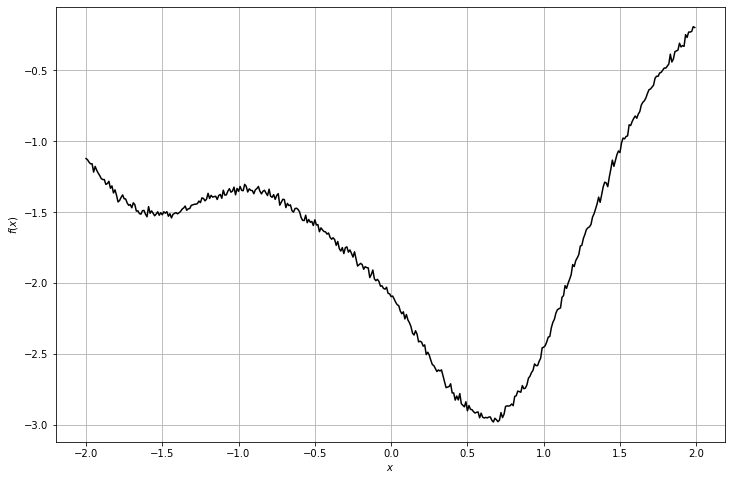

context_x =  (1, 6, 1)
context_y =  (1, 6, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


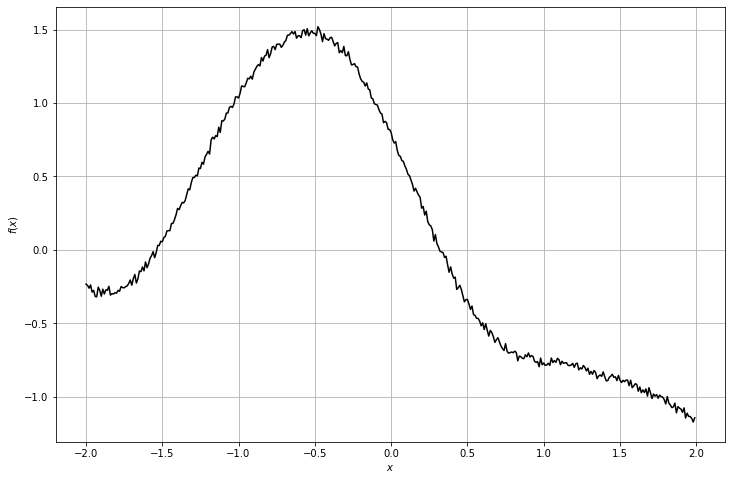

context_x =  (1, 41, 1)
context_y =  (1, 41, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


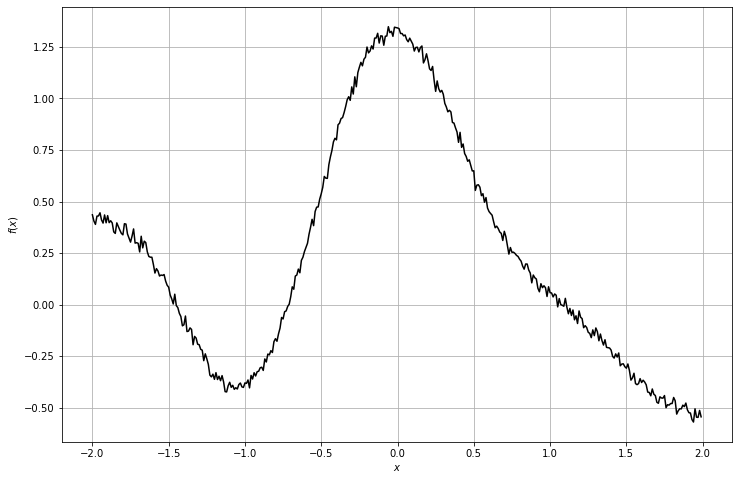

context_x =  (1, 71, 1)
context_y =  (1, 71, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


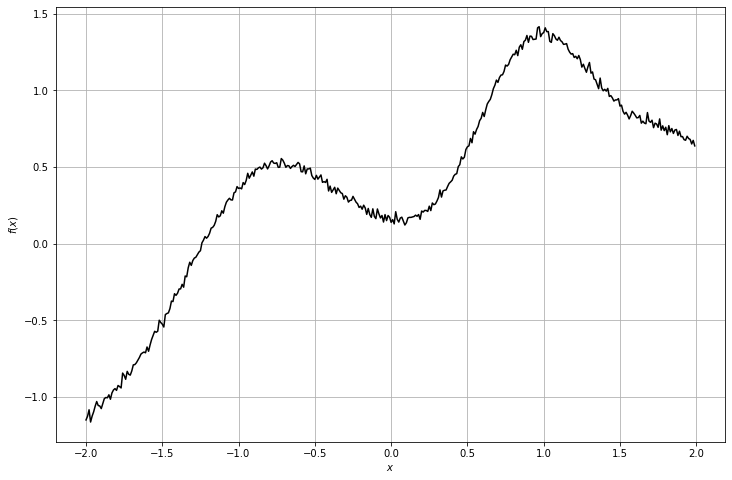

context_x =  (1, 72, 1)
context_y =  (1, 72, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


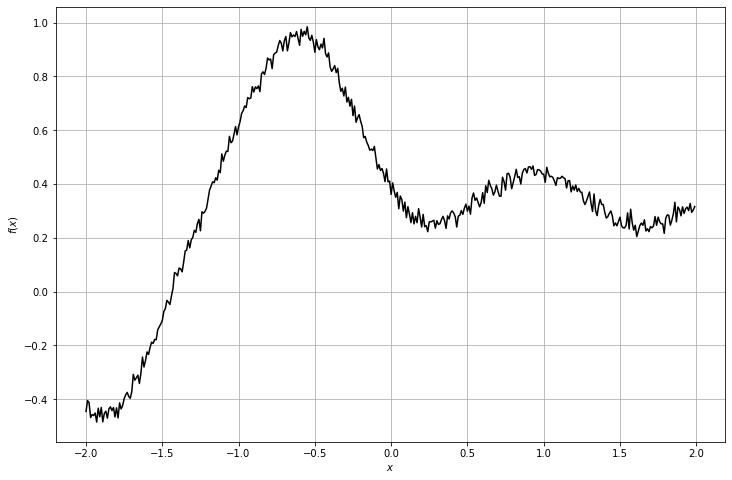

context_x =  (1, 81, 1)
context_y =  (1, 81, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


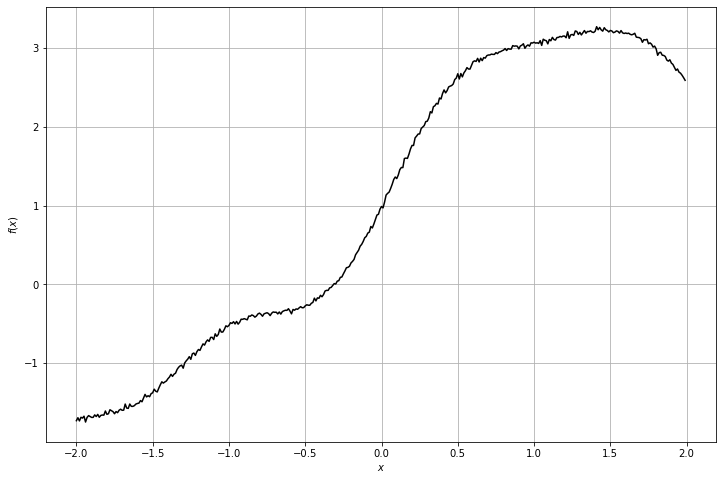

context_x =  (1, 27, 1)
context_y =  (1, 27, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


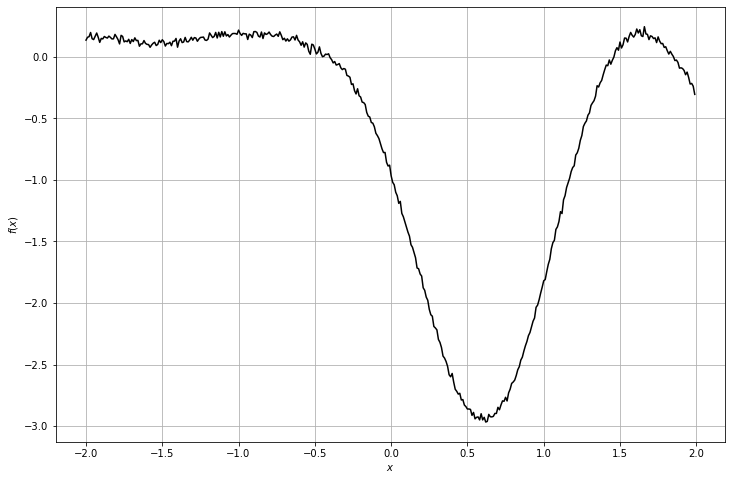

context_x =  (1, 31, 1)
context_y =  (1, 31, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


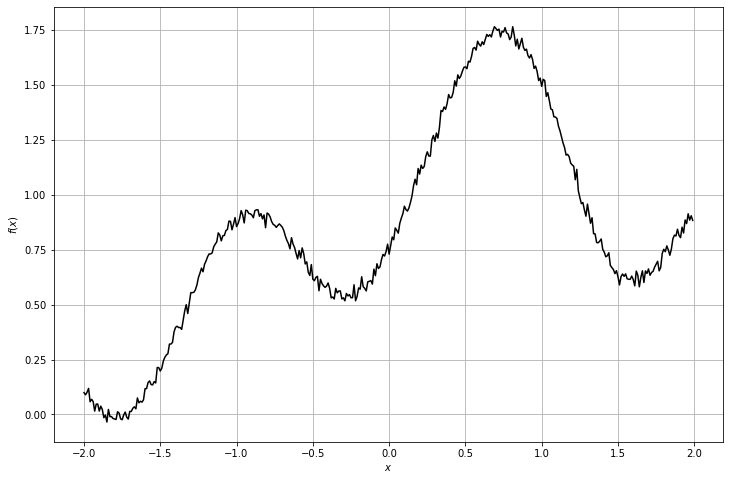

context_x =  (1, 3, 1)
context_y =  (1, 3, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


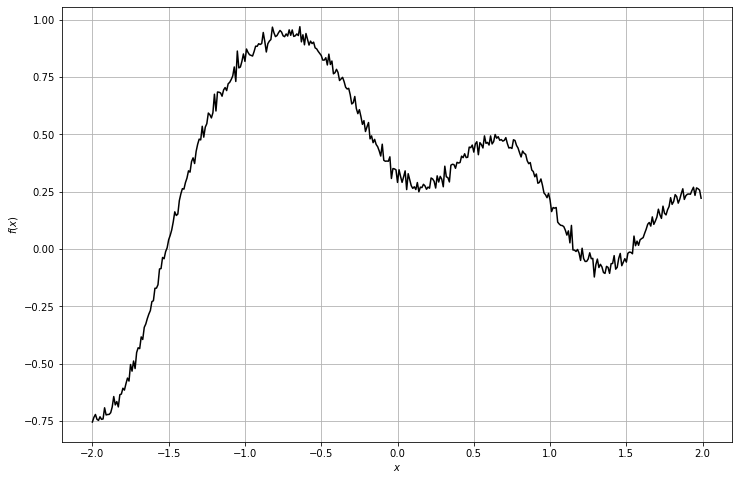

context_x =  (1, 62, 1)
context_y =  (1, 62, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


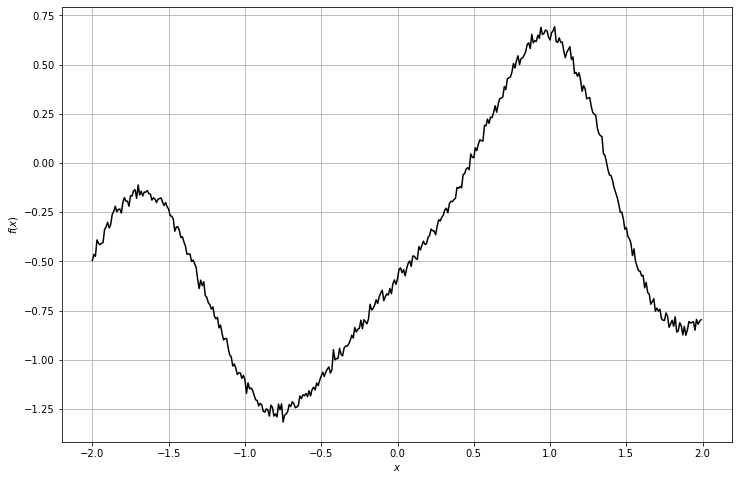

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


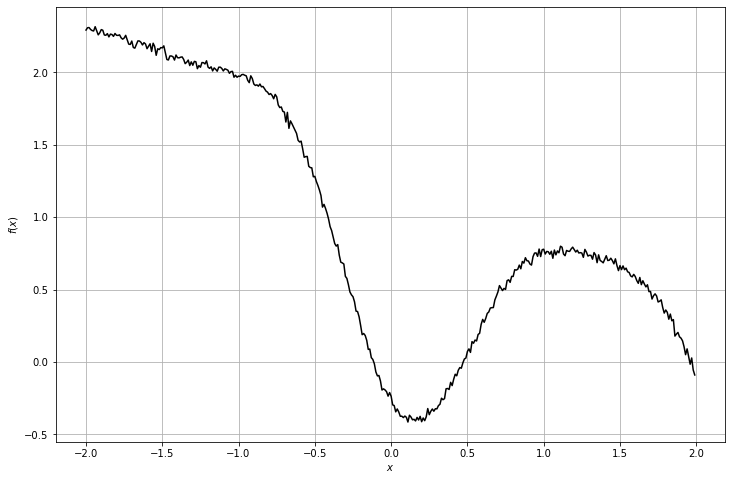

context_x =  (1, 67, 1)
context_y =  (1, 67, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


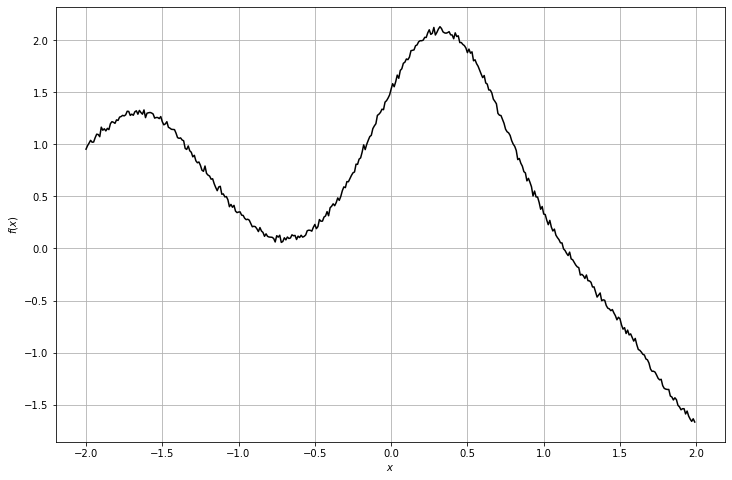

context_x =  (1, 32, 1)
context_y =  (1, 32, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


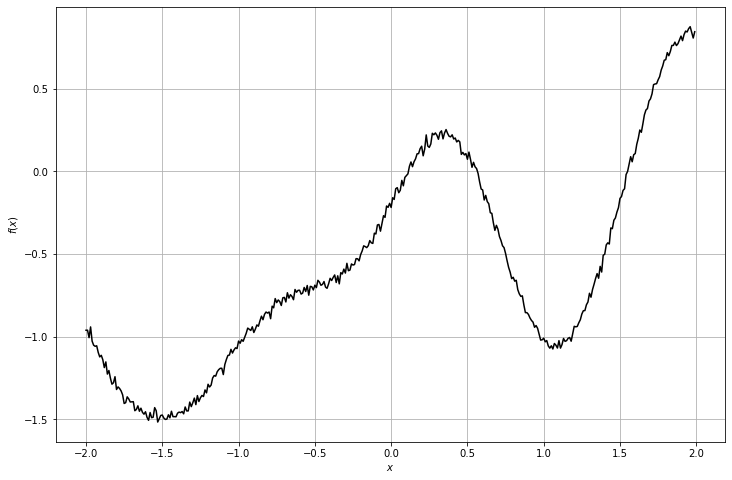

context_x =  (1, 74, 1)
context_y =  (1, 74, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


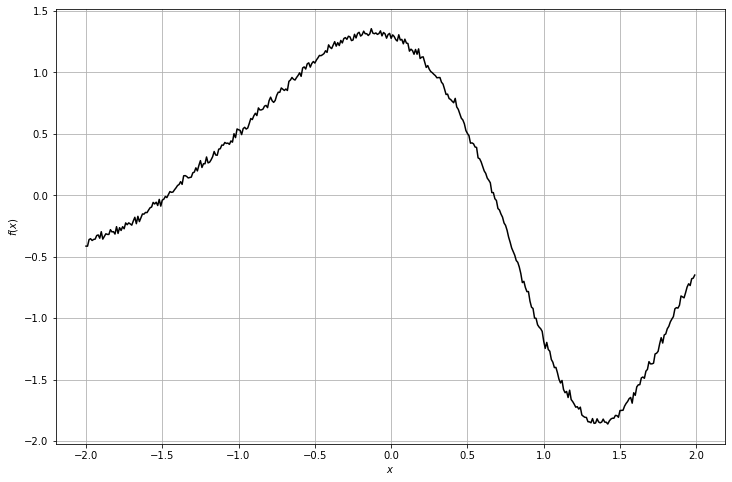

context_x =  (1, 83, 1)
context_y =  (1, 83, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


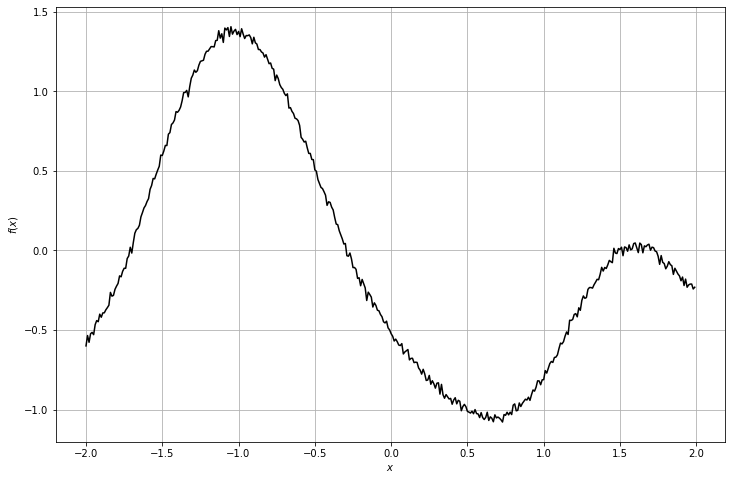

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


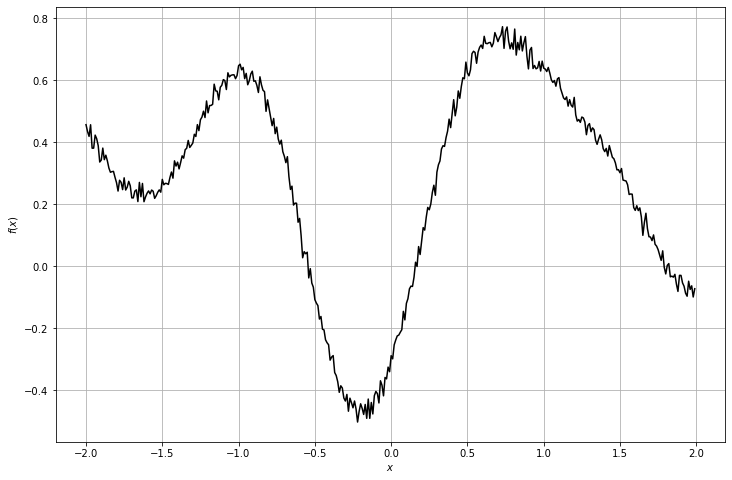

context_x =  (1, 96, 1)
context_y =  (1, 96, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


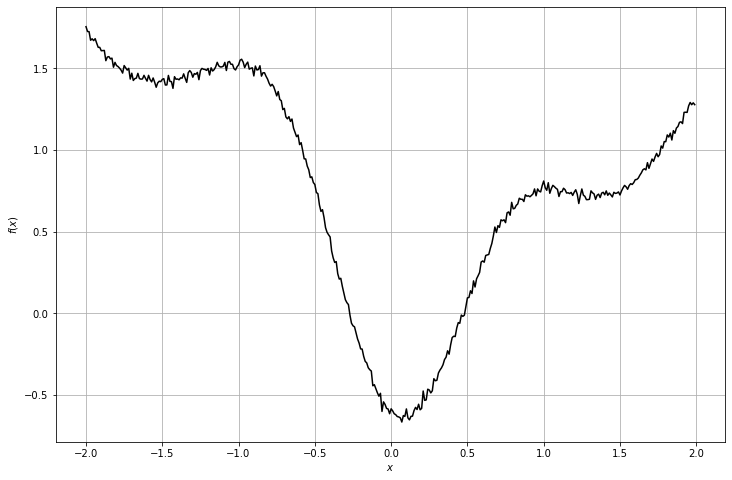

context_x =  (1, 42, 1)
context_y =  (1, 42, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


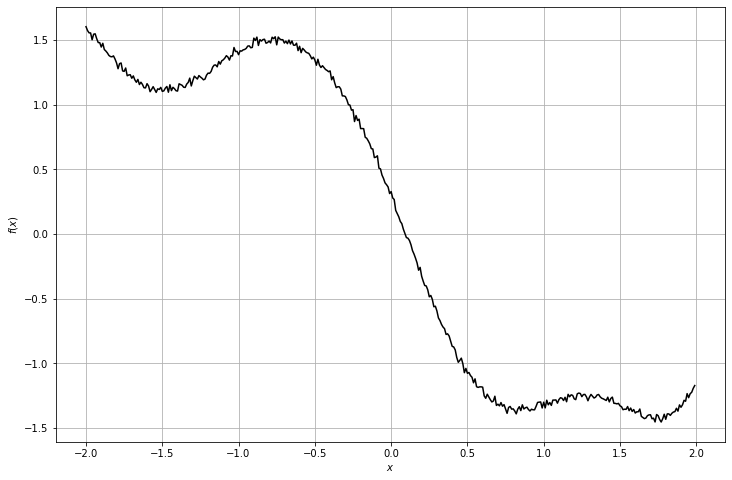

context_x =  (1, 20, 1)
context_y =  (1, 20, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


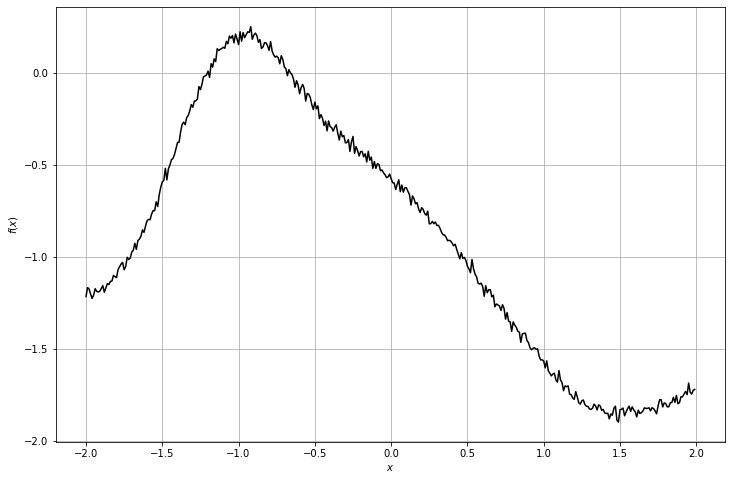

context_x =  (1, 41, 1)
context_y =  (1, 41, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


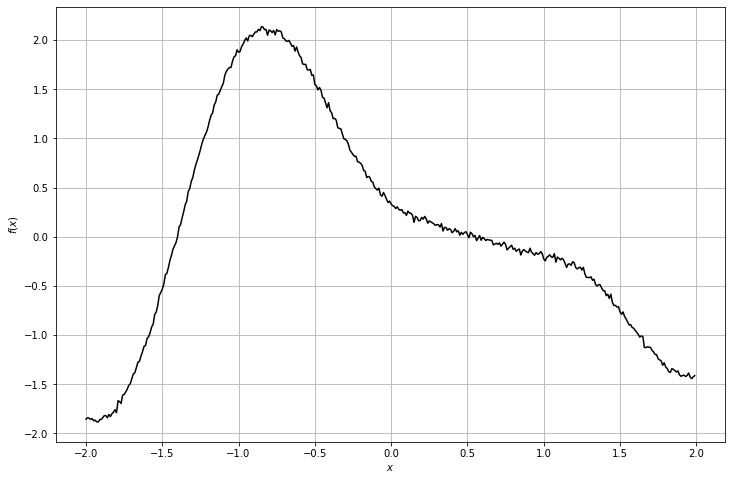

context_x =  (1, 7, 1)
context_y =  (1, 7, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


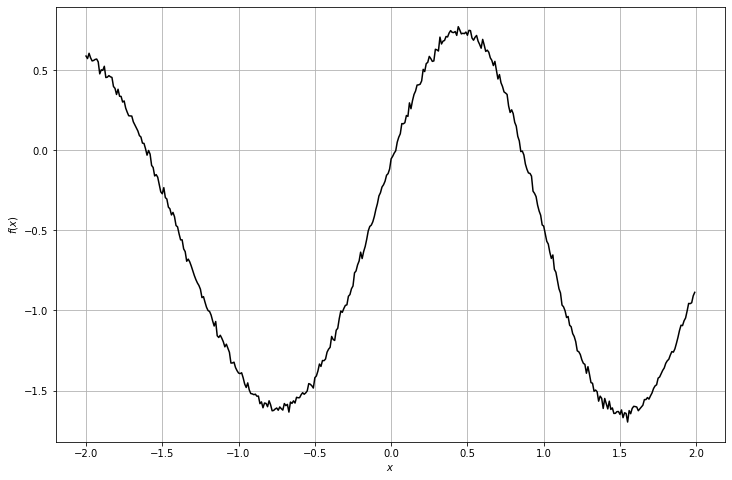

context_x =  (1, 29, 1)
context_y =  (1, 29, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


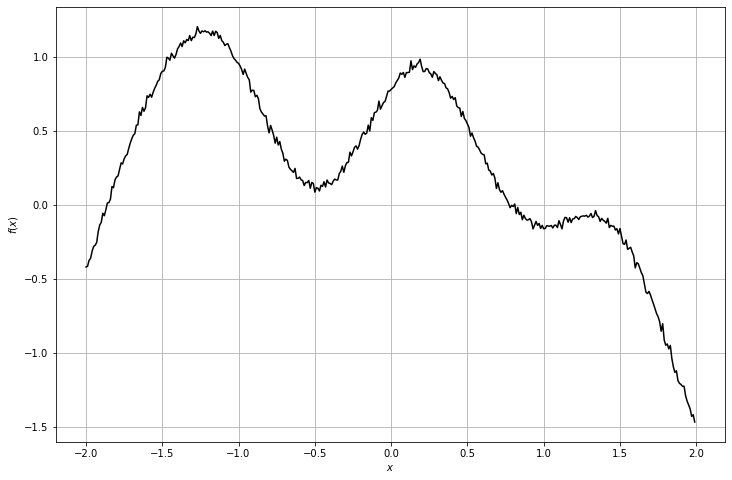

context_x =  (1, 41, 1)
context_y =  (1, 41, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


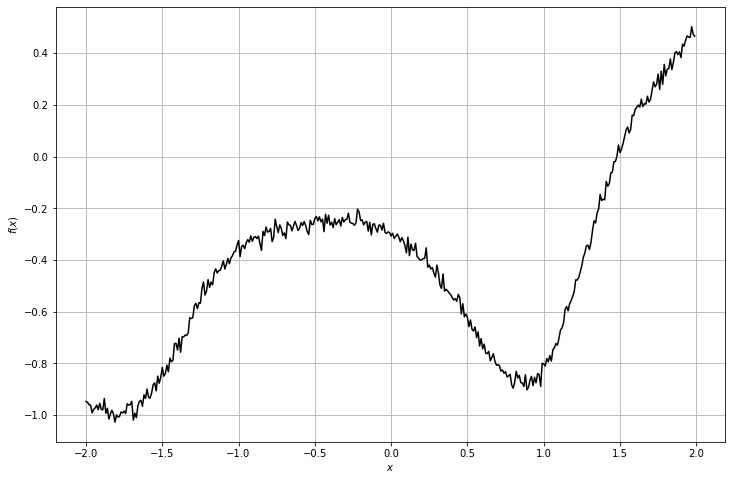

context_x =  (1, 88, 1)
context_y =  (1, 88, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


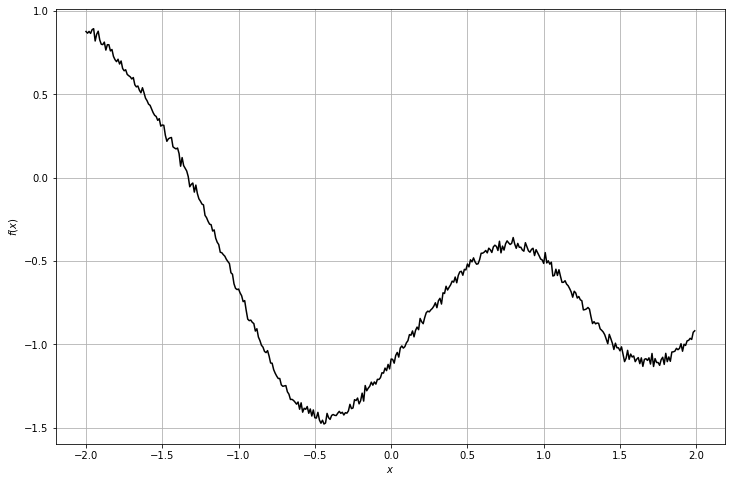

context_x =  (1, 41, 1)
context_y =  (1, 41, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


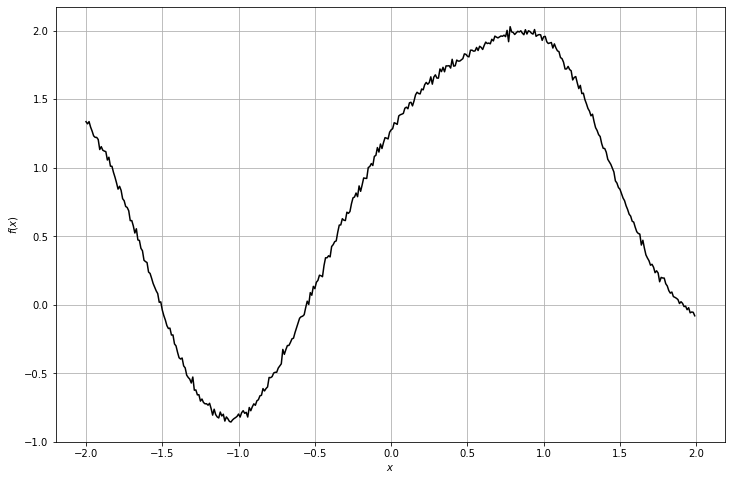

context_x =  (1, 74, 1)
context_y =  (1, 74, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


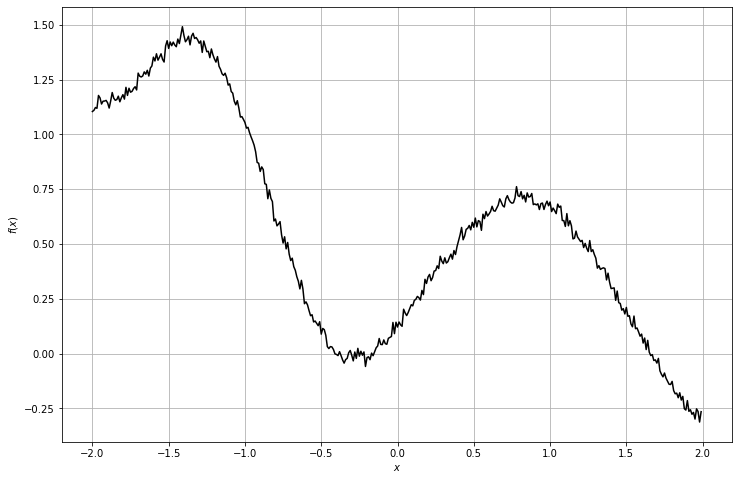

context_x =  (1, 6, 1)
context_y =  (1, 6, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


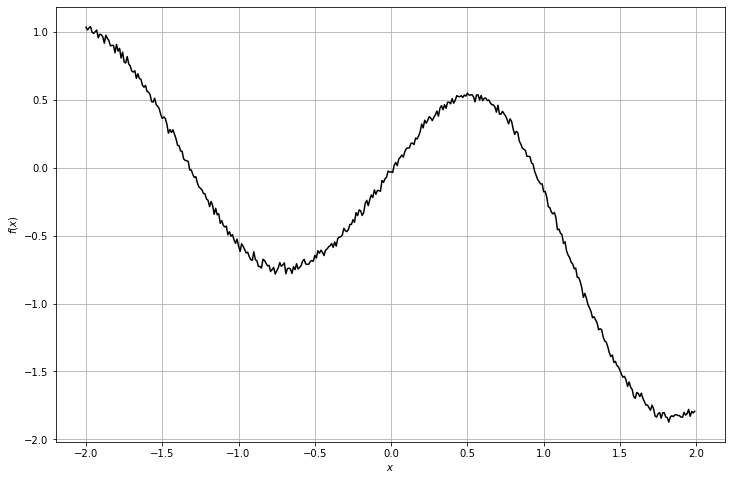

context_x =  (1, 31, 1)
context_y =  (1, 31, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


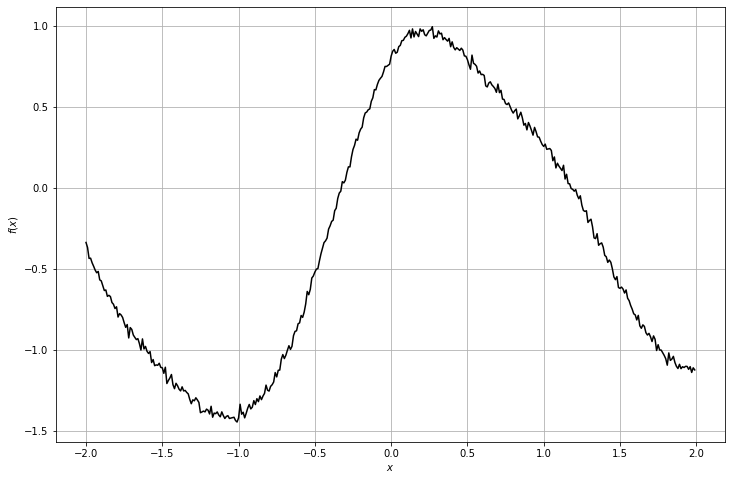

context_x =  (1, 70, 1)
context_y =  (1, 70, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


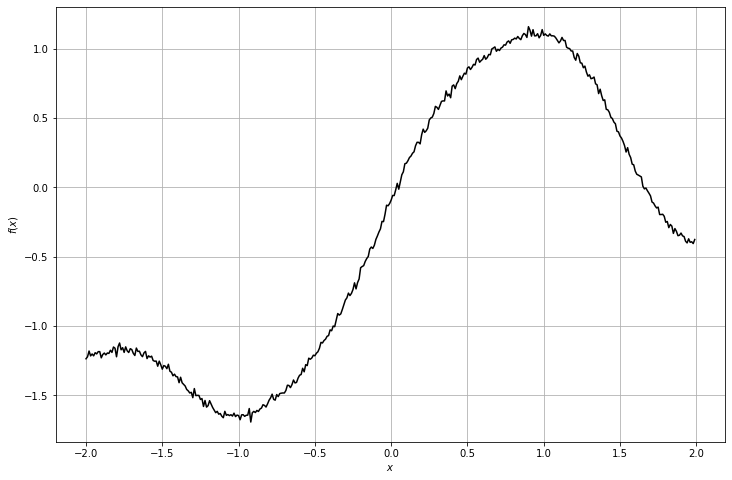

context_x =  (1, 44, 1)
context_y =  (1, 44, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


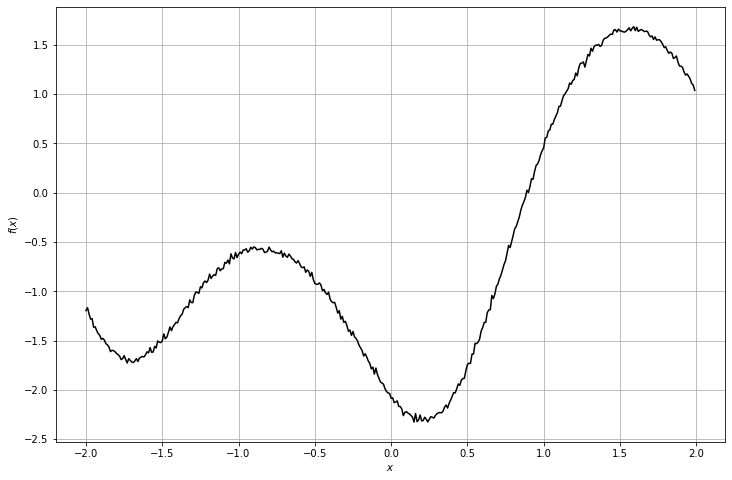

context_x =  (1, 18, 1)
context_y =  (1, 18, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


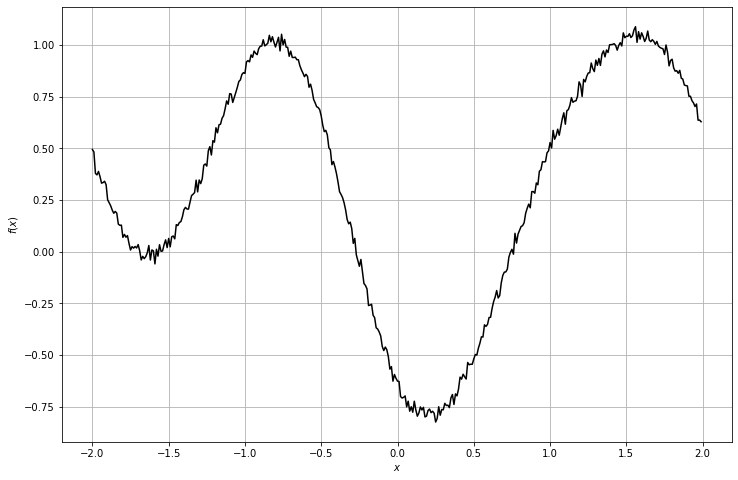

context_x =  (1, 15, 1)
context_y =  (1, 15, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


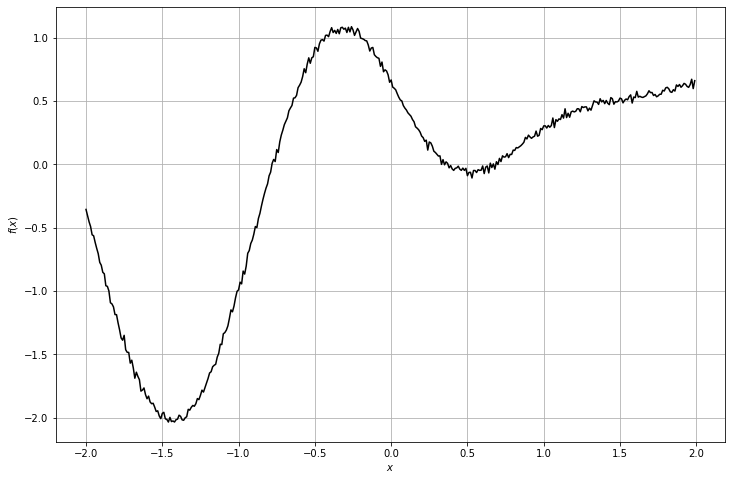

context_x =  (1, 18, 1)
context_y =  (1, 18, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


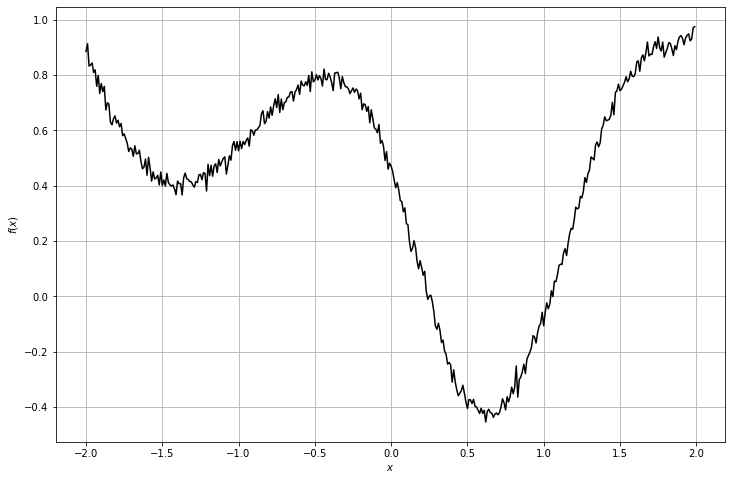

context_x =  (1, 67, 1)
context_y =  (1, 67, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


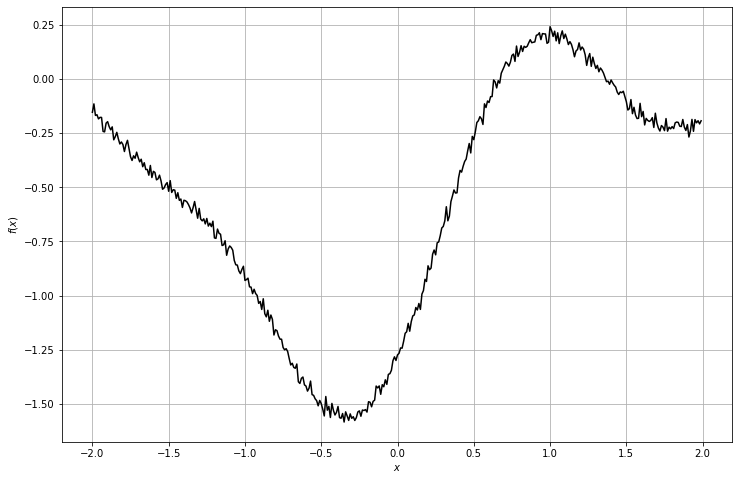

context_x =  (1, 88, 1)
context_y =  (1, 88, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


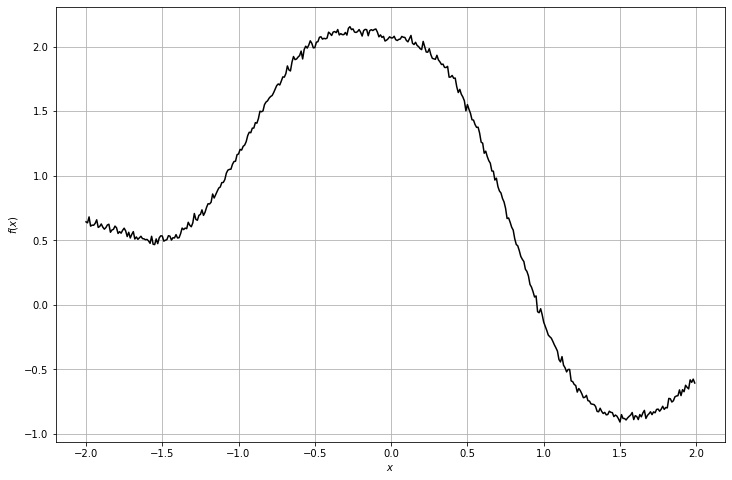

context_x =  (1, 33, 1)
context_y =  (1, 33, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


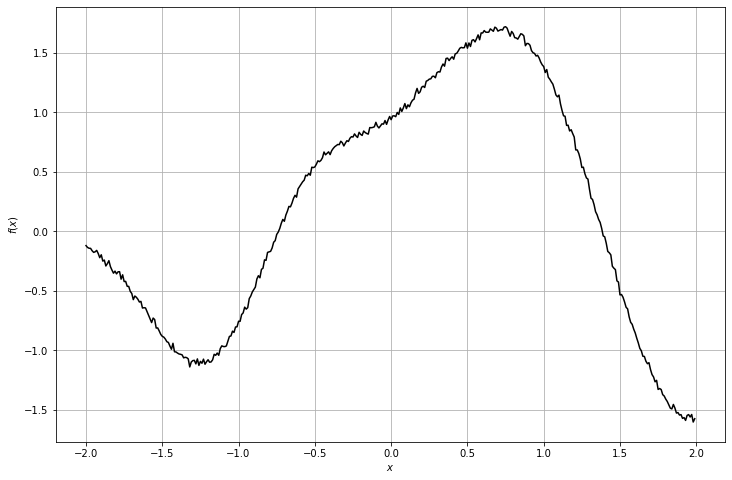

context_x =  (1, 22, 1)
context_y =  (1, 22, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


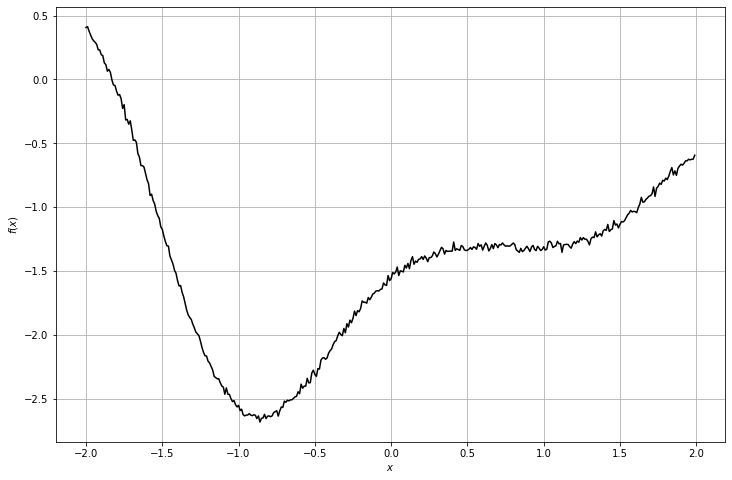

context_x =  (1, 32, 1)
context_y =  (1, 32, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


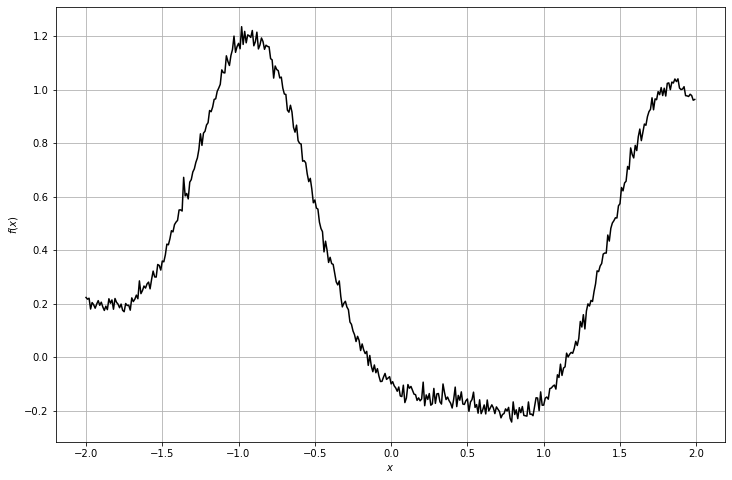

context_x =  (1, 57, 1)
context_y =  (1, 57, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


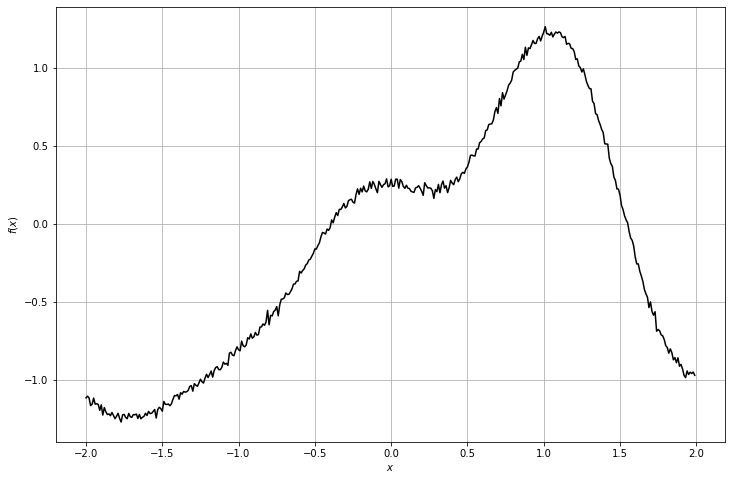

context_x =  (1, 37, 1)
context_y =  (1, 37, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


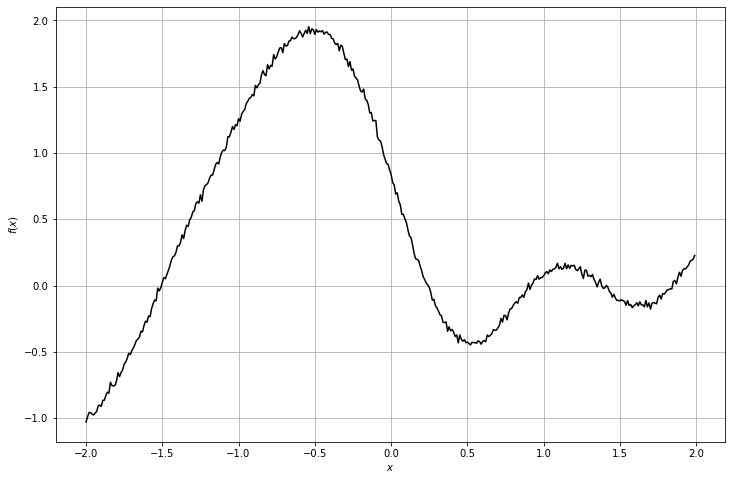

context_x =  (1, 75, 1)
context_y =  (1, 75, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


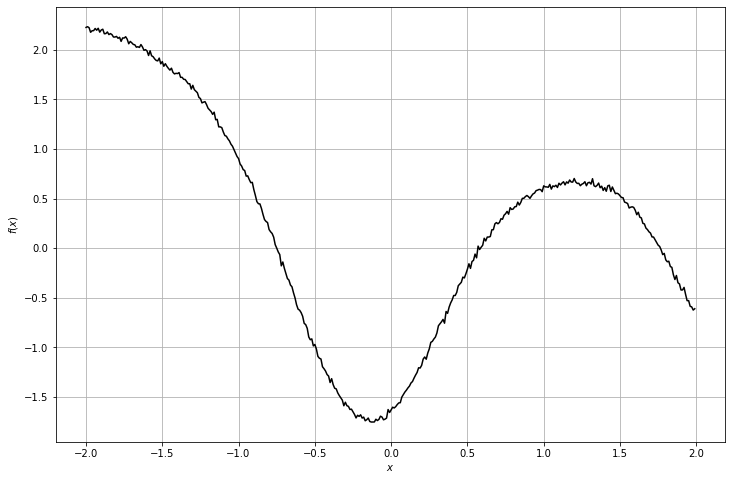

context_x =  (1, 16, 1)
context_y =  (1, 16, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


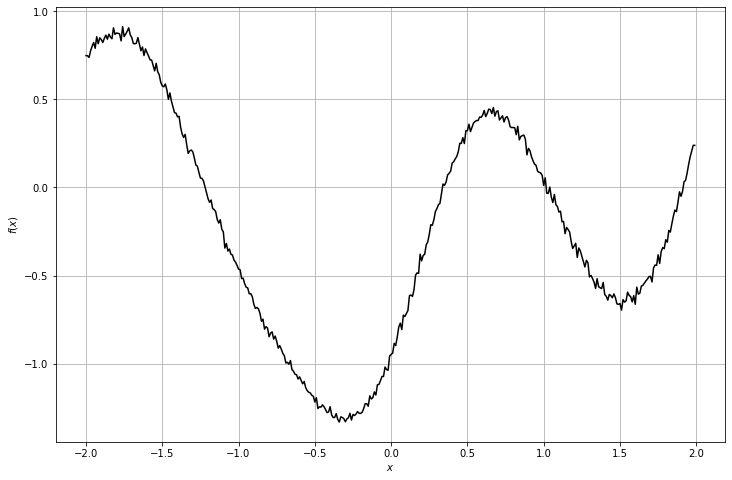

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


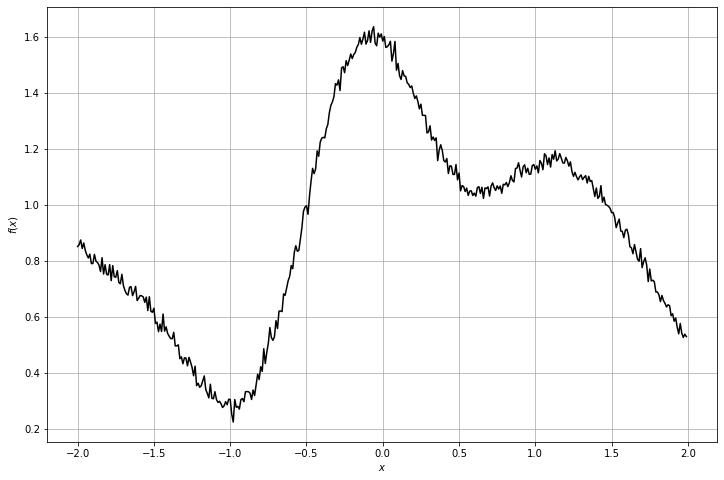

context_x =  (1, 40, 1)
context_y =  (1, 40, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


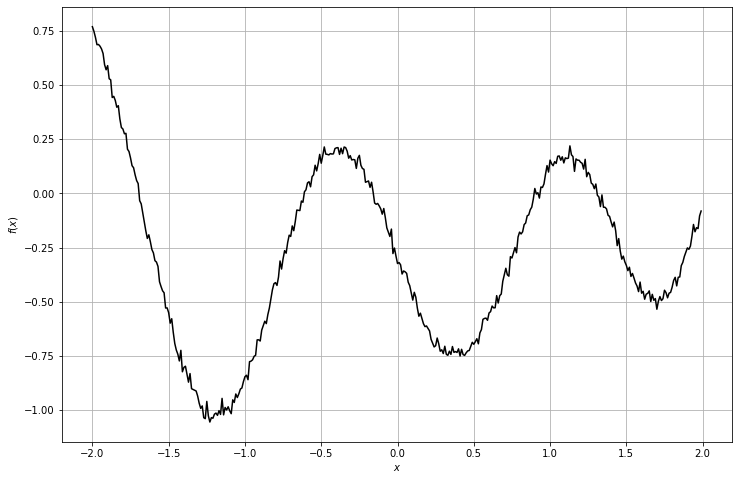

context_x =  (1, 35, 1)
context_y =  (1, 35, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


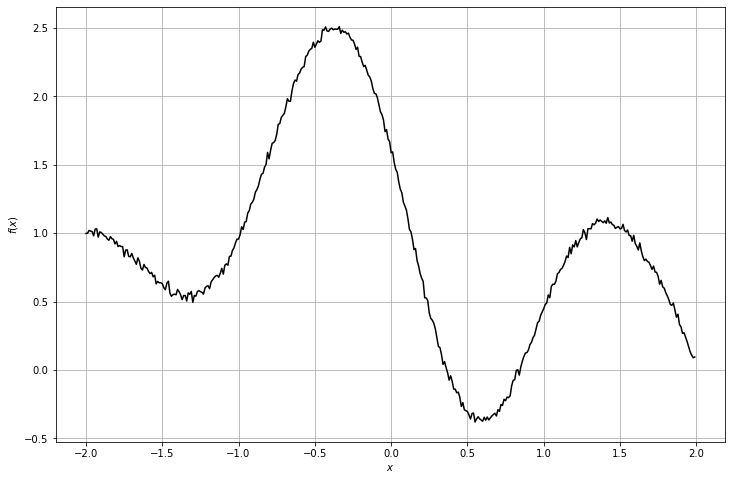

context_x =  (1, 38, 1)
context_y =  (1, 38, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


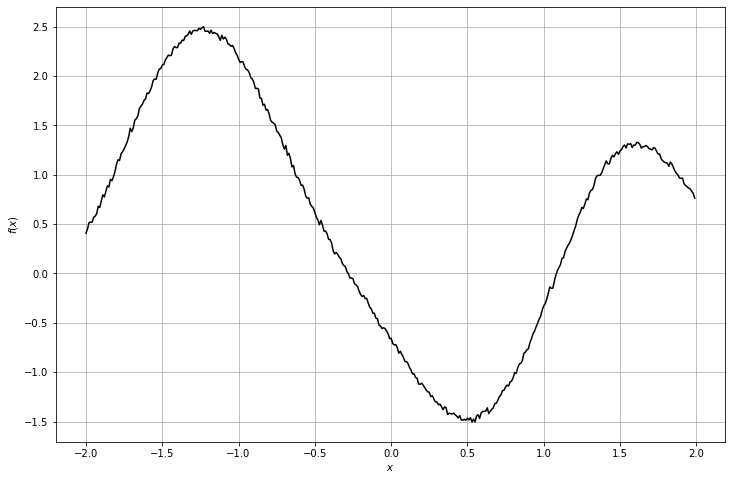

context_x =  (1, 73, 1)
context_y =  (1, 73, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


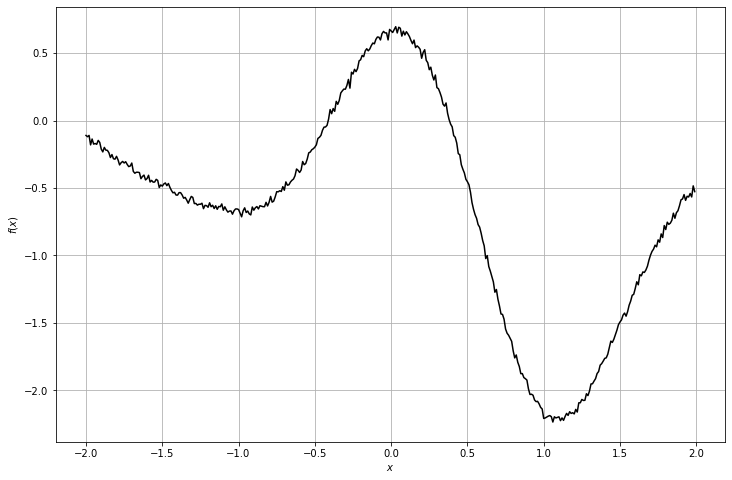

context_x =  (1, 74, 1)
context_y =  (1, 74, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


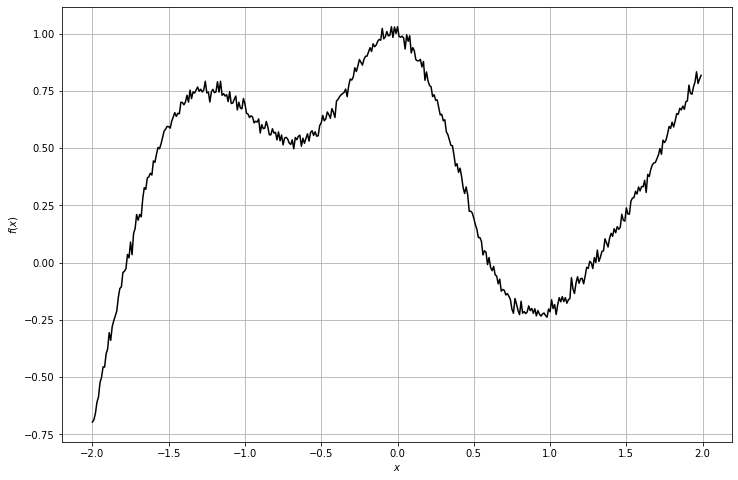

context_x =  (1, 46, 1)
context_y =  (1, 46, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


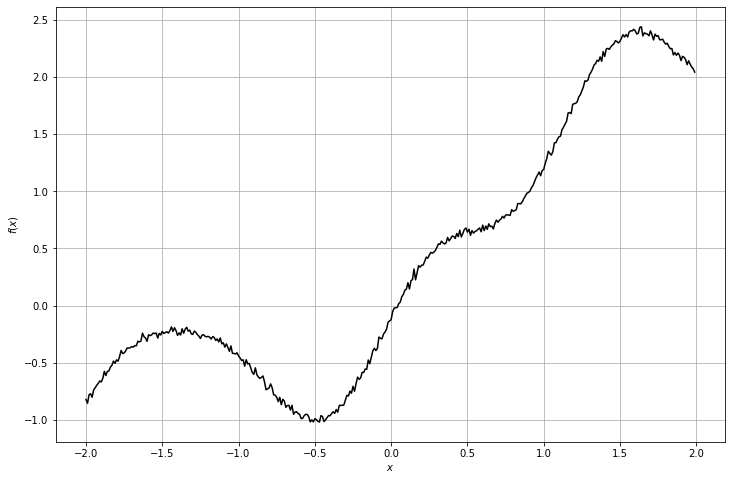

context_x =  (1, 52, 1)
context_y =  (1, 52, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


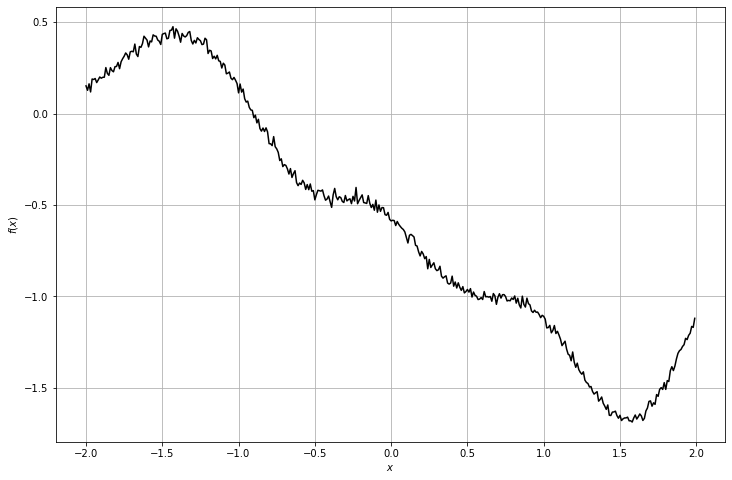

context_x =  (1, 91, 1)
context_y =  (1, 91, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


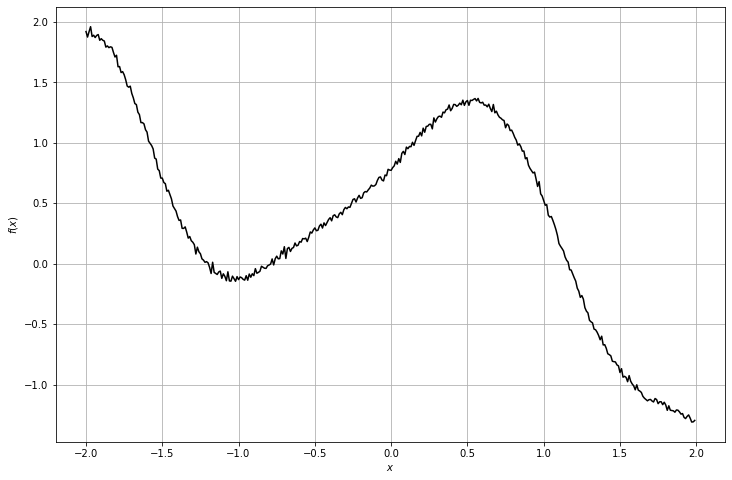

context_x =  (1, 41, 1)
context_y =  (1, 41, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


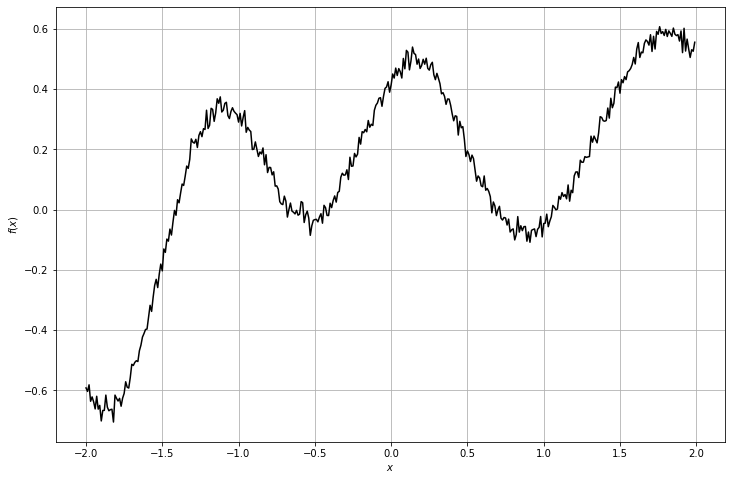

context_x =  (1, 19, 1)
context_y =  (1, 19, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


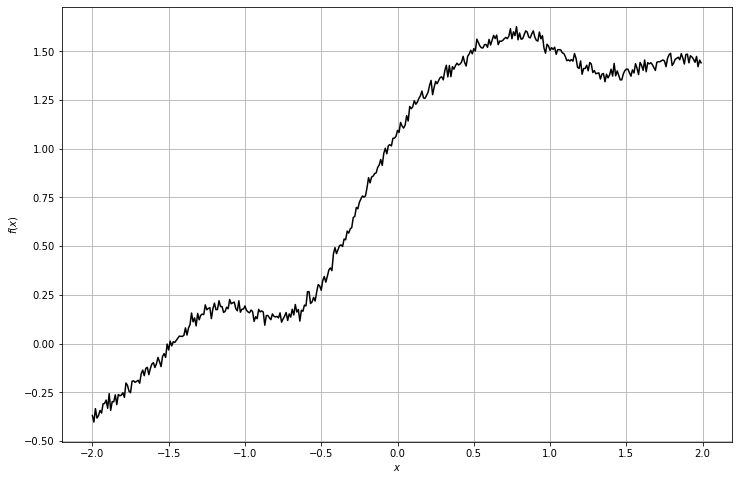

context_x =  (1, 53, 1)
context_y =  (1, 53, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


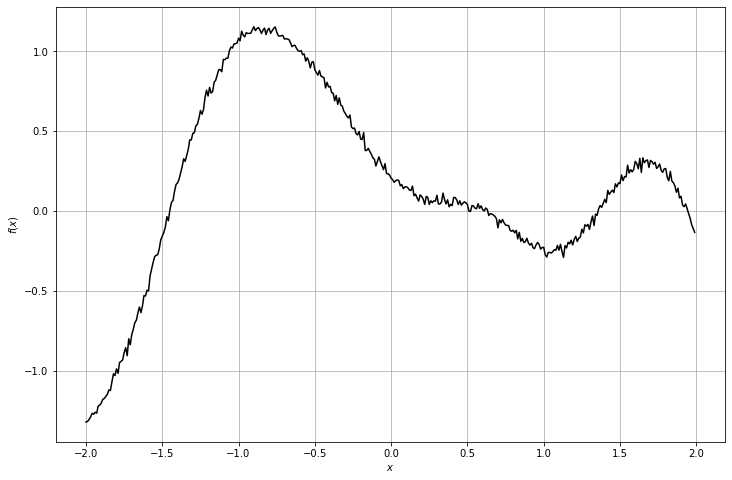

context_x =  (1, 54, 1)
context_y =  (1, 54, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


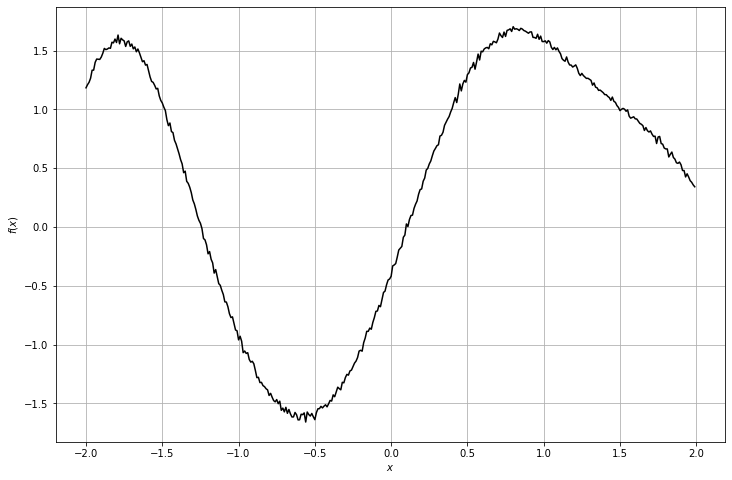

context_x =  (1, 77, 1)
context_y =  (1, 77, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


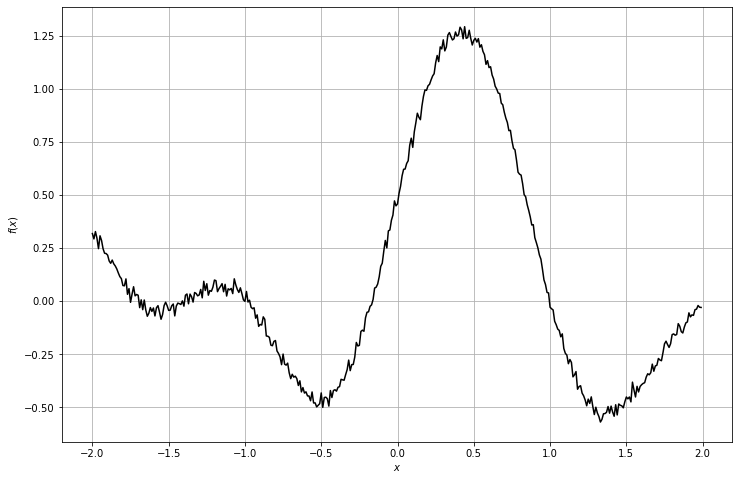

context_x =  (1, 76, 1)
context_y =  (1, 76, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


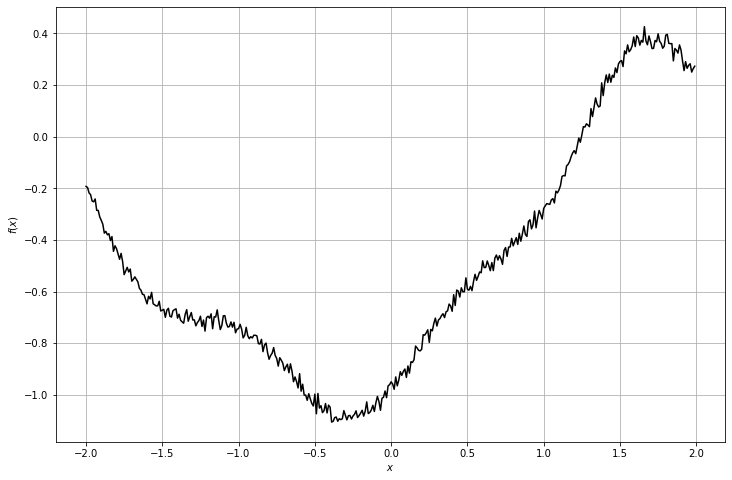

context_x =  (1, 70, 1)
context_y =  (1, 70, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


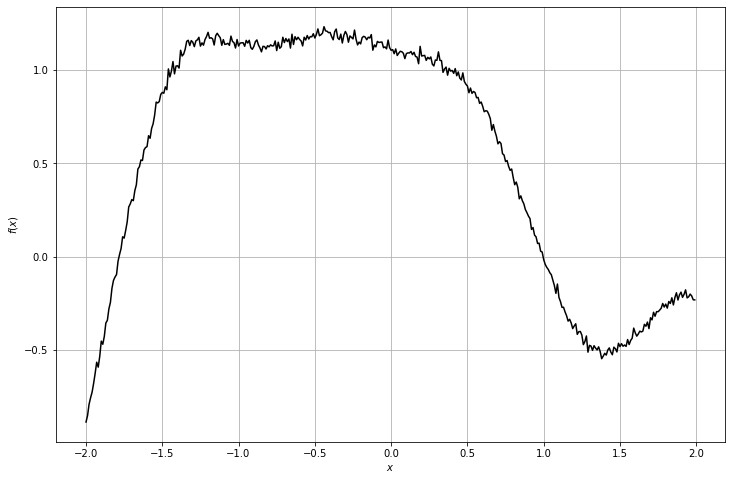

context_x =  (1, 16, 1)
context_y =  (1, 16, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


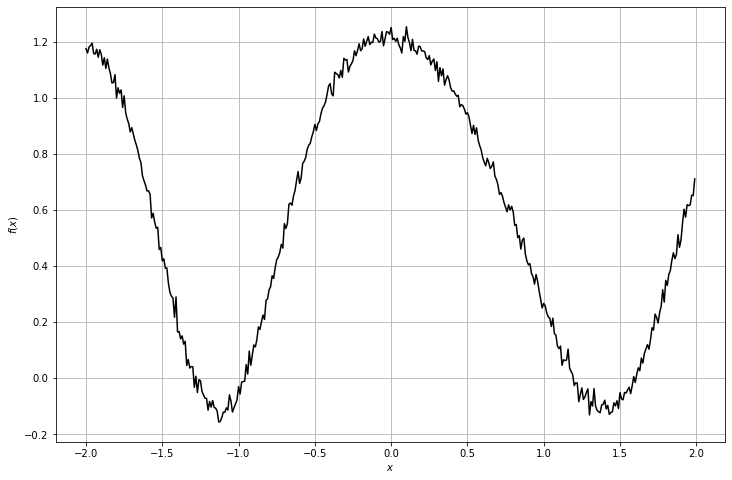

context_x =  (1, 93, 1)
context_y =  (1, 93, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


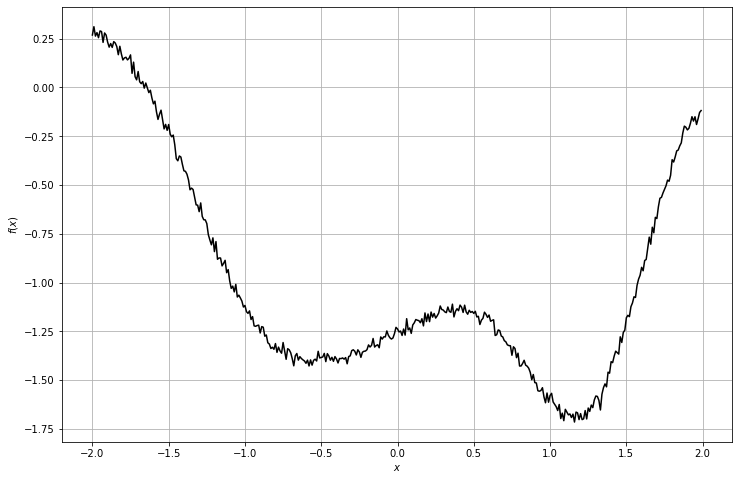

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


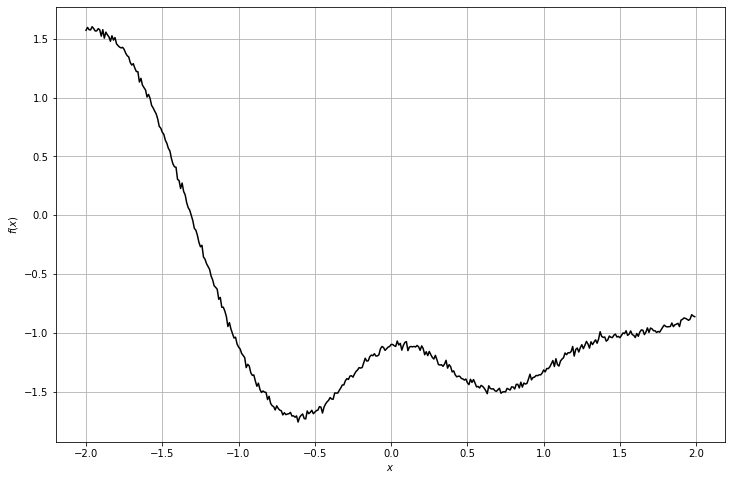

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


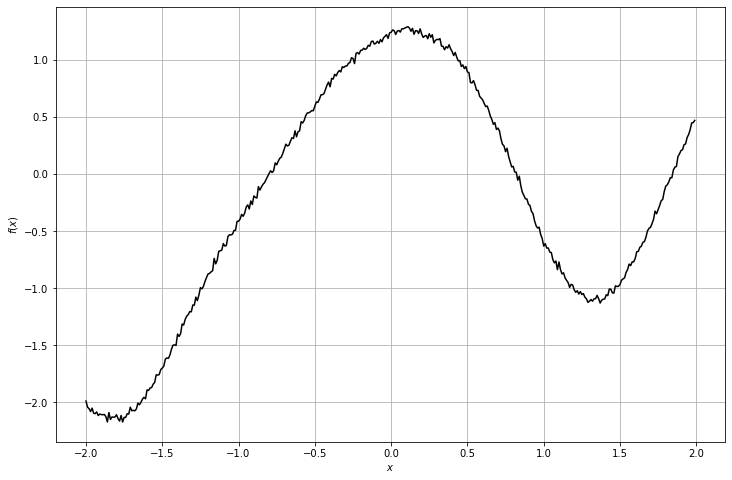

context_x =  (1, 21, 1)
context_y =  (1, 21, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


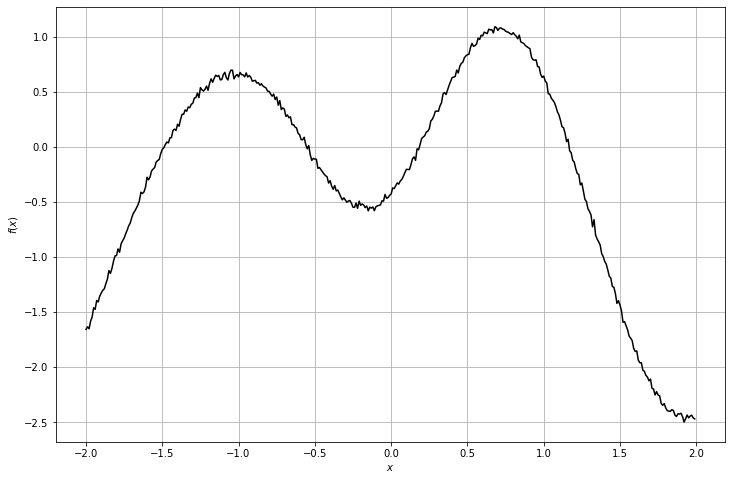

context_x =  (1, 43, 1)
context_y =  (1, 43, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


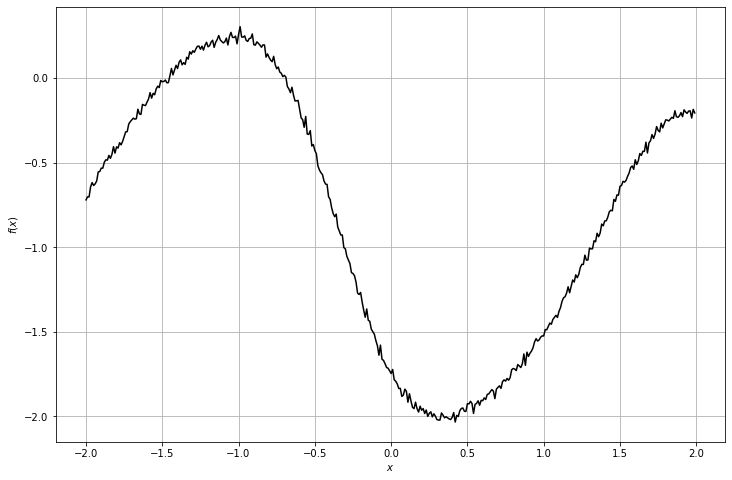

context_x =  (1, 98, 1)
context_y =  (1, 98, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


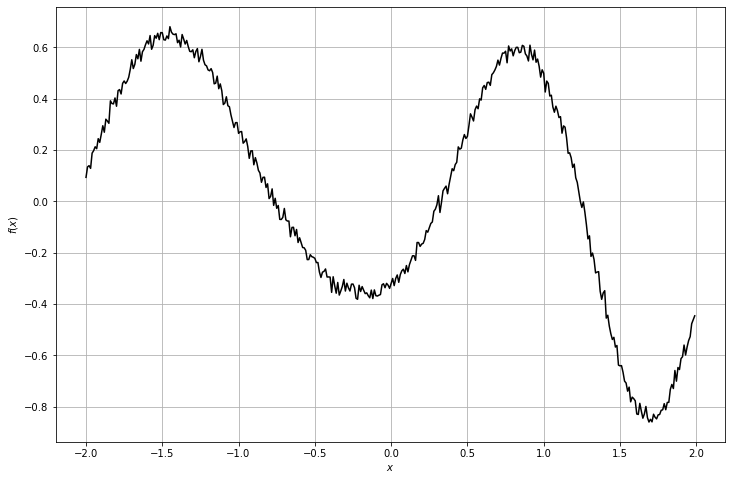

context_x =  (1, 3, 1)
context_y =  (1, 3, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


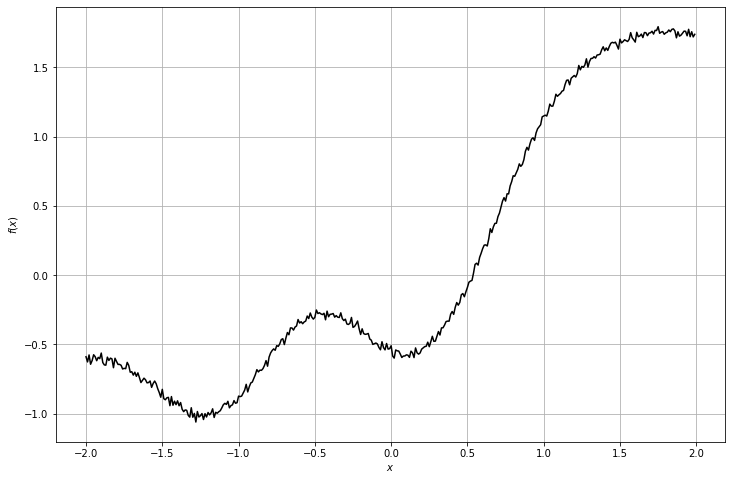

context_x =  (1, 62, 1)
context_y =  (1, 62, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


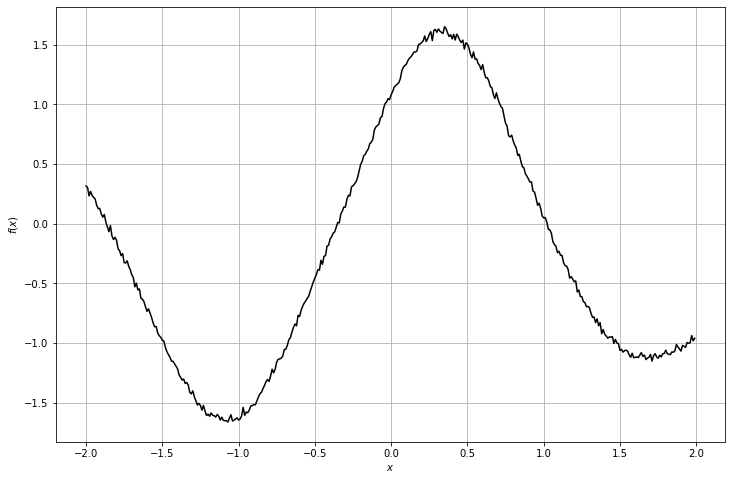

context_x =  (1, 17, 1)
context_y =  (1, 17, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


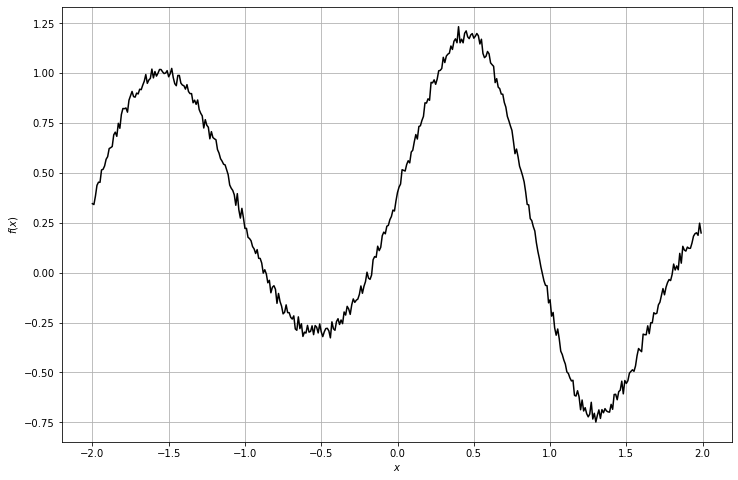

context_x =  (1, 37, 1)
context_y =  (1, 37, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


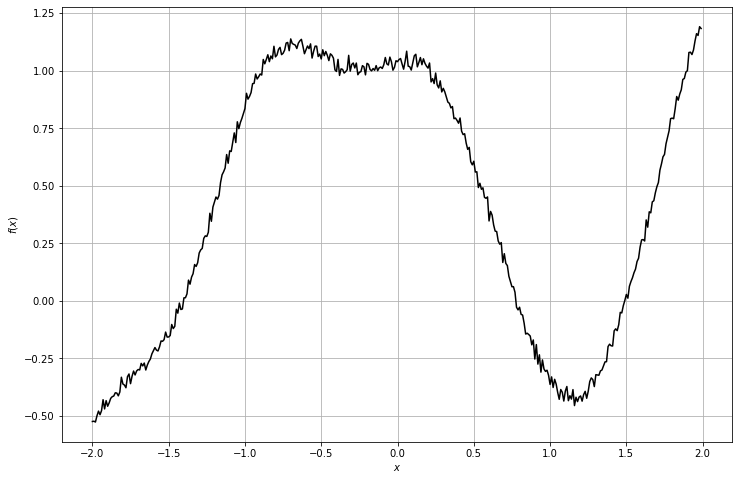

context_x =  (1, 80, 1)
context_y =  (1, 80, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


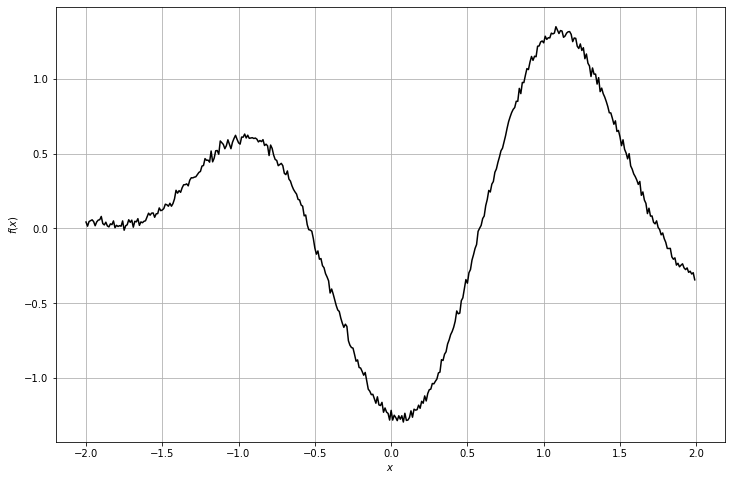

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


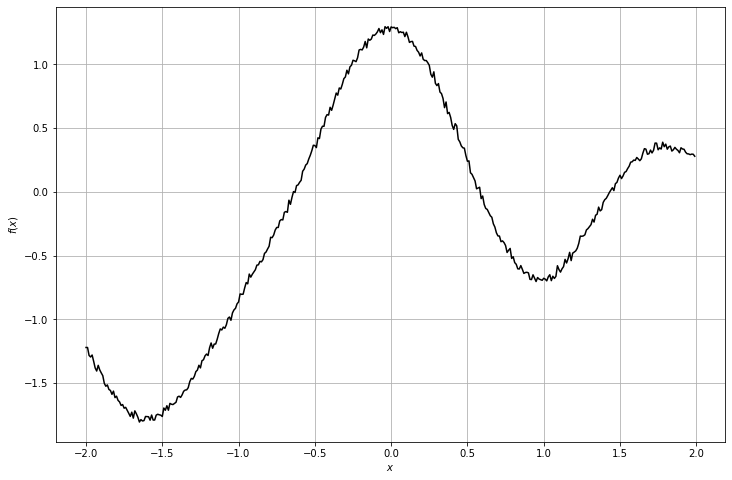

context_x =  (1, 45, 1)
context_y =  (1, 45, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


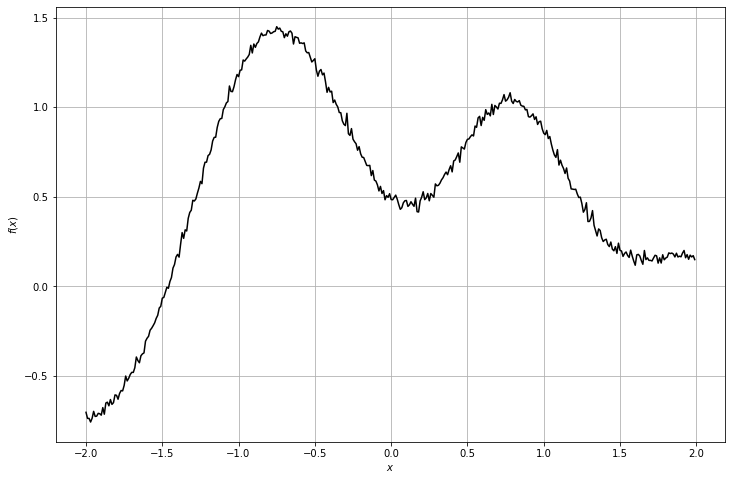

context_x =  (1, 98, 1)
context_y =  (1, 98, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


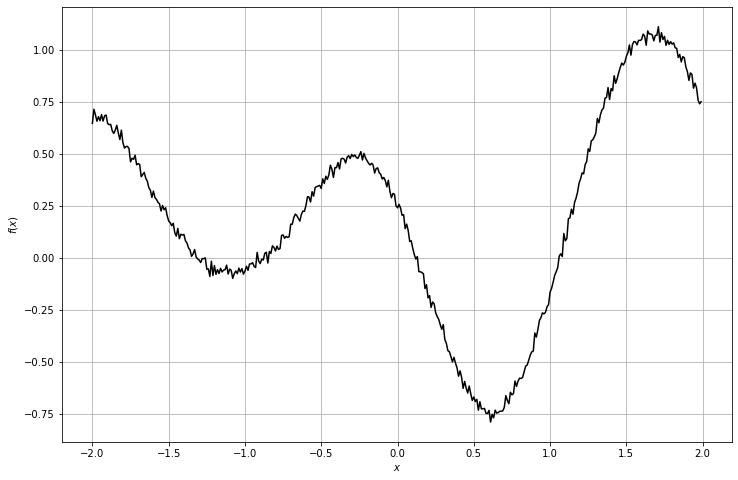

context_x =  (1, 66, 1)
context_y =  (1, 66, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


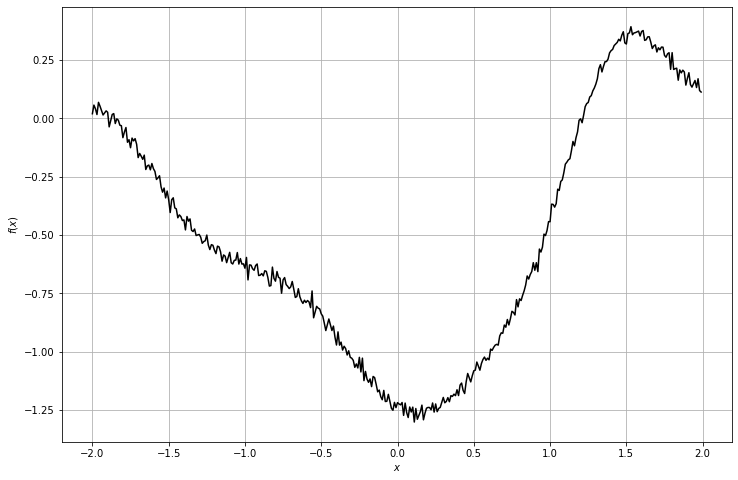

context_x =  (1, 56, 1)
context_y =  (1, 56, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


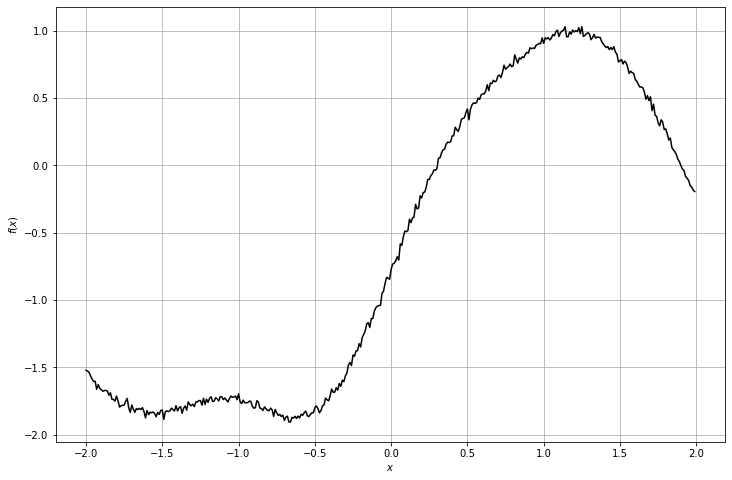

context_x =  (1, 88, 1)
context_y =  (1, 88, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


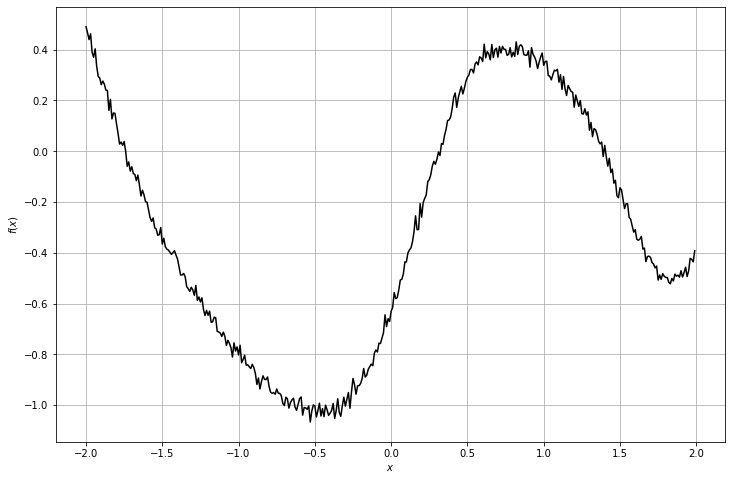

context_x =  (1, 28, 1)
context_y =  (1, 28, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


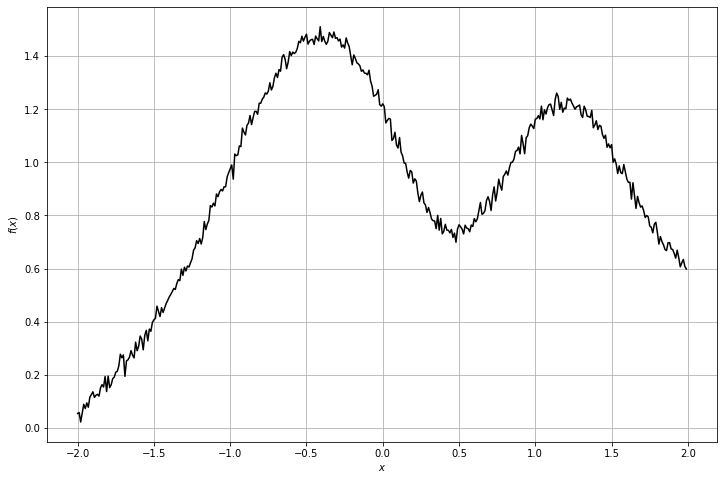

context_x =  (1, 30, 1)
context_y =  (1, 30, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


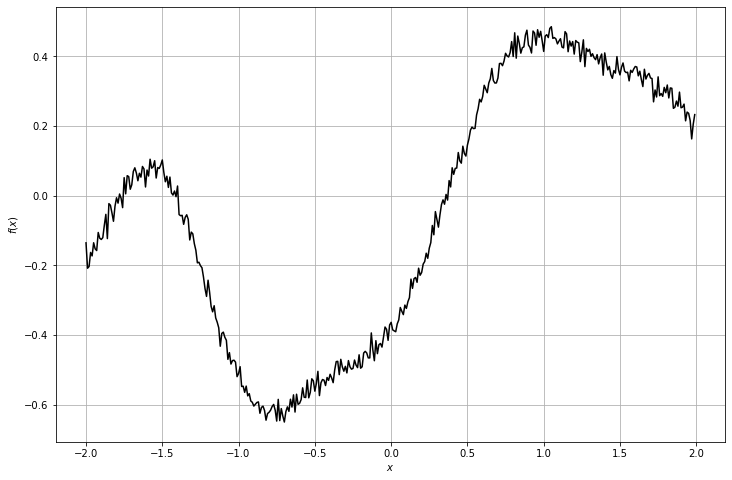

context_x =  (1, 83, 1)
context_y =  (1, 83, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


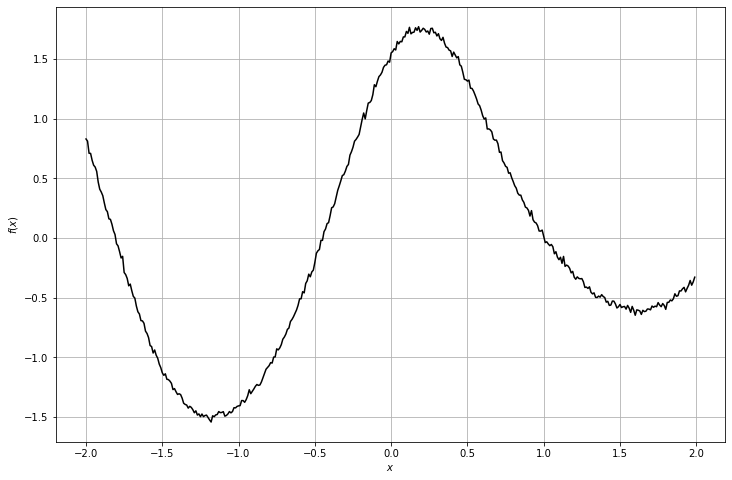

context_x =  (1, 42, 1)
context_y =  (1, 42, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


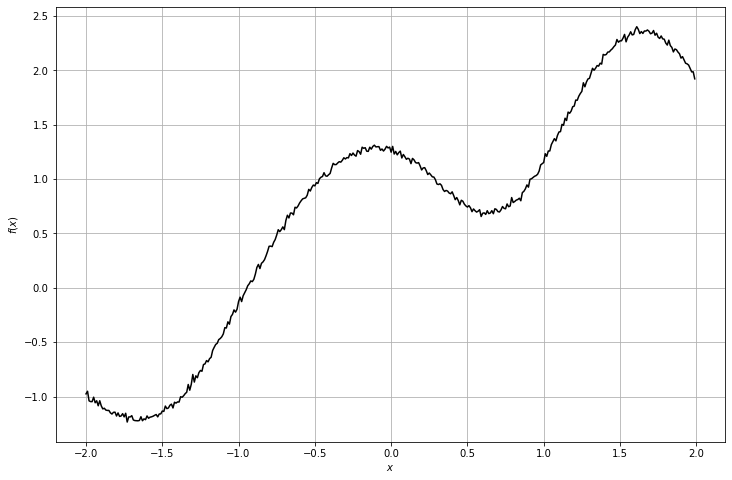

context_x =  (1, 60, 1)
context_y =  (1, 60, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


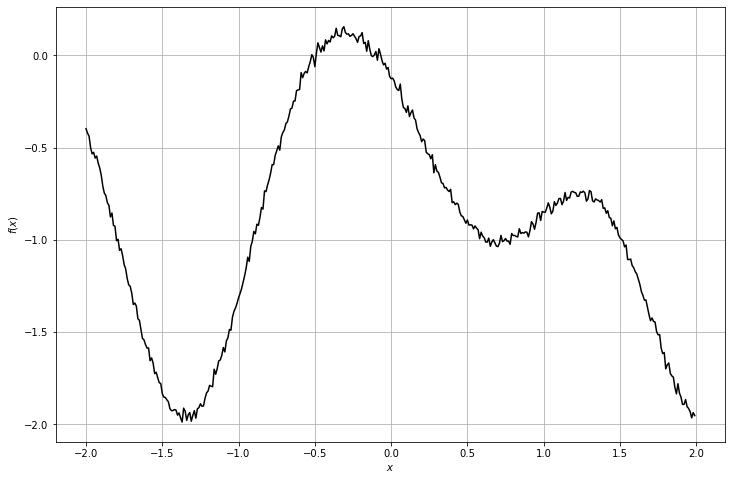

context_x =  (1, 14, 1)
context_y =  (1, 14, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


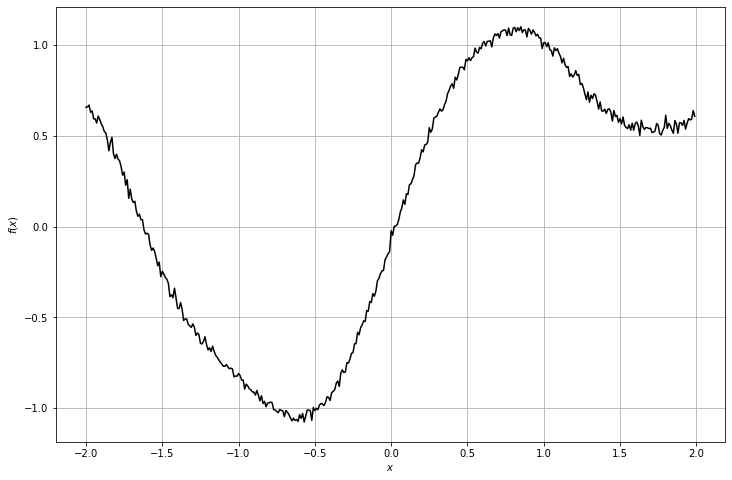

context_x =  (1, 95, 1)
context_y =  (1, 95, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


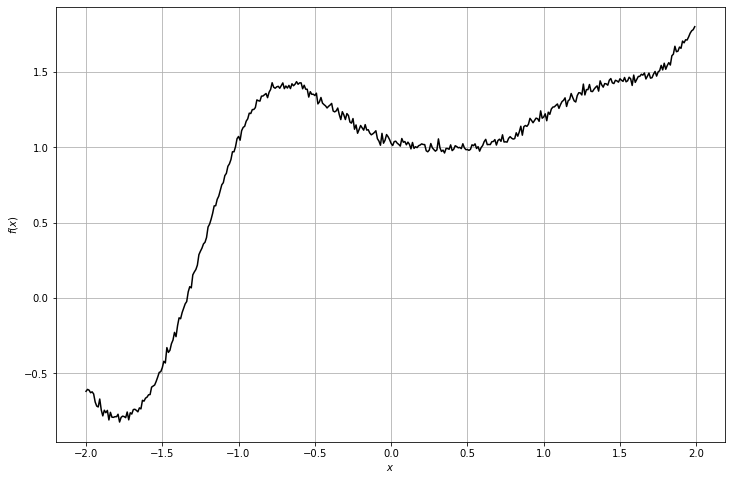

context_x =  (1, 64, 1)
context_y =  (1, 64, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


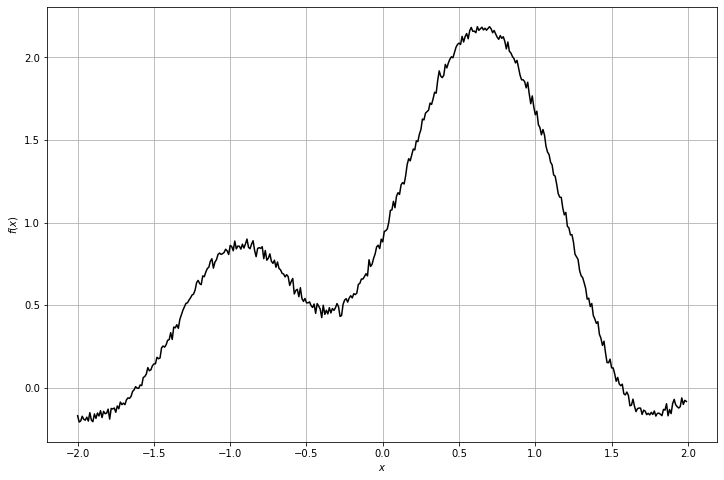

context_x =  (1, 36, 1)
context_y =  (1, 36, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


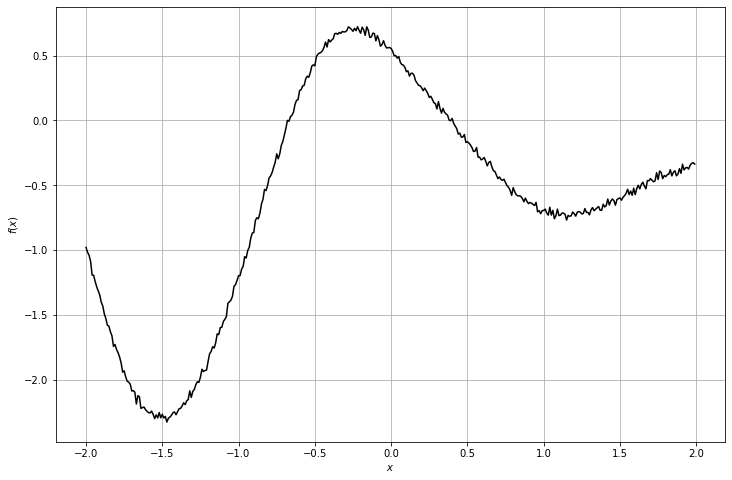

context_x =  (1, 13, 1)
context_y =  (1, 13, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


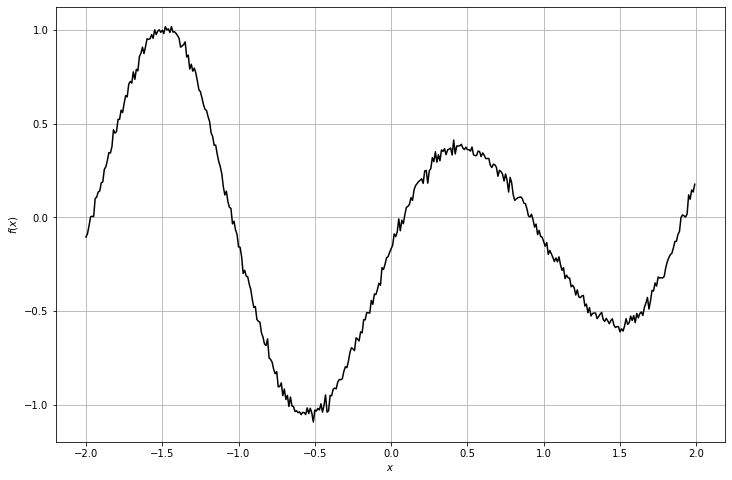

context_x =  (1, 45, 1)
context_y =  (1, 45, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


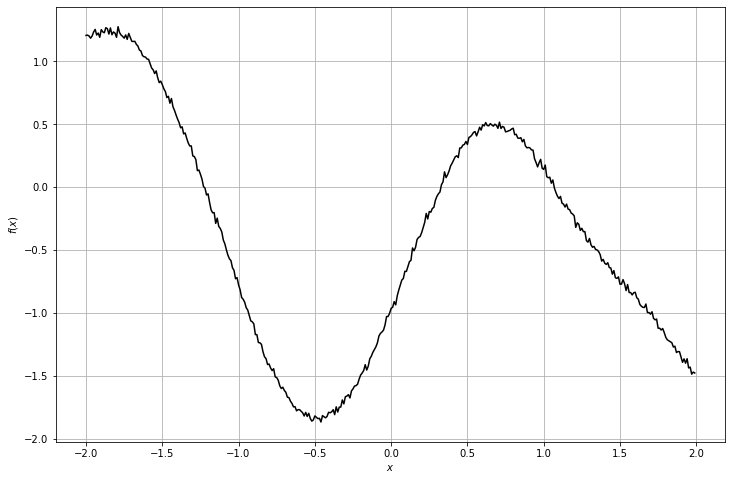

context_x =  (1, 27, 1)
context_y =  (1, 27, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


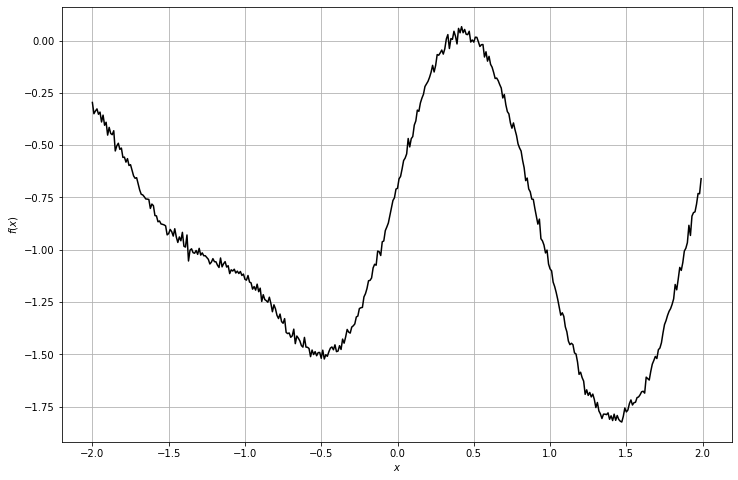

context_x =  (1, 18, 1)
context_y =  (1, 18, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


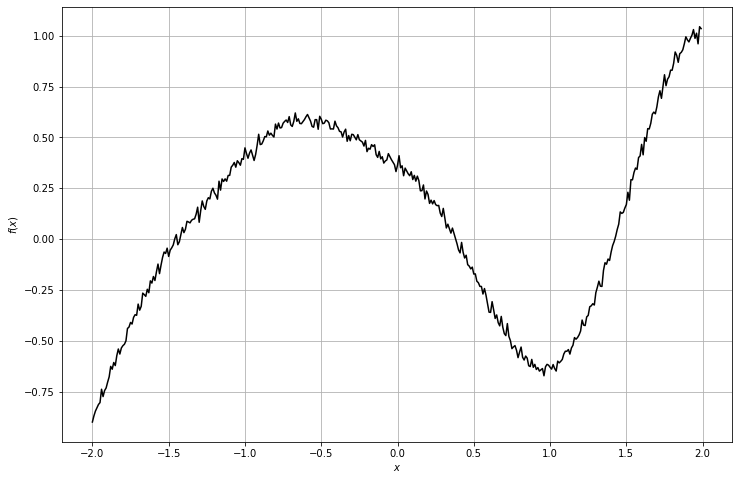

context_x =  (1, 10, 1)
context_y =  (1, 10, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


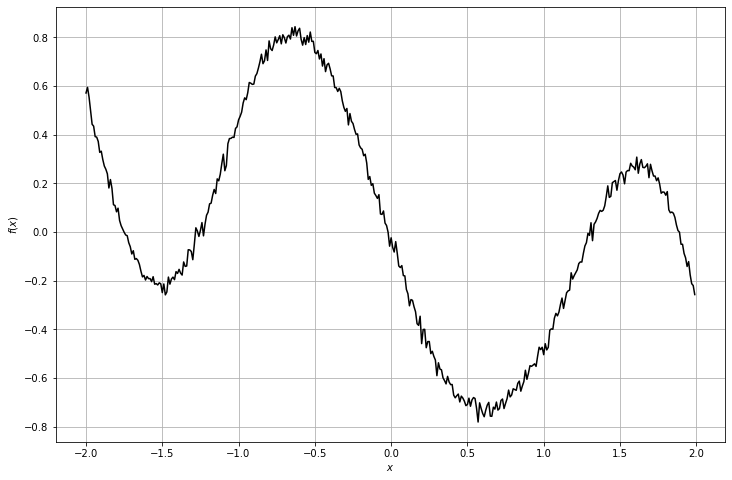

context_x =  (1, 94, 1)
context_y =  (1, 94, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


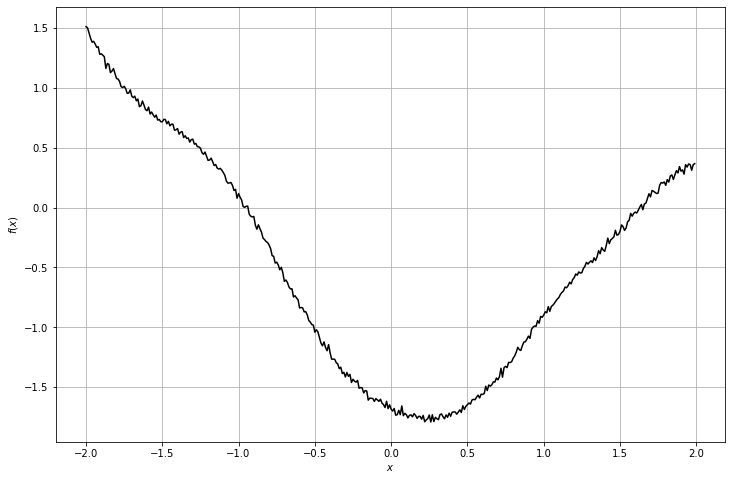

context_x =  (1, 36, 1)
context_y =  (1, 36, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


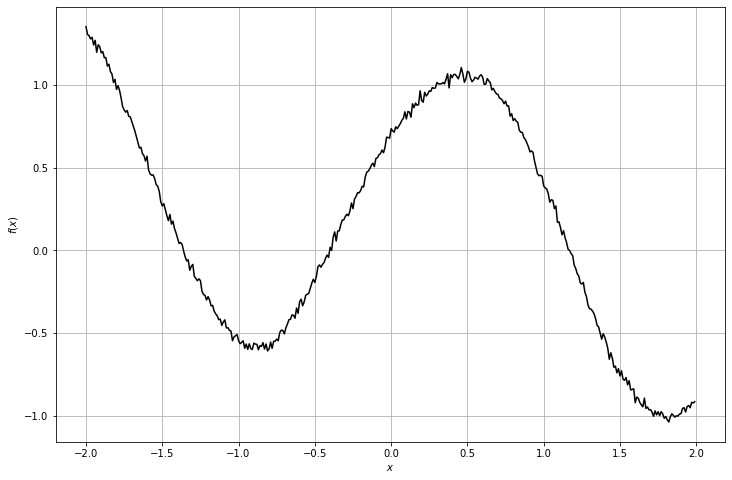

context_x =  (1, 93, 1)
context_y =  (1, 93, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


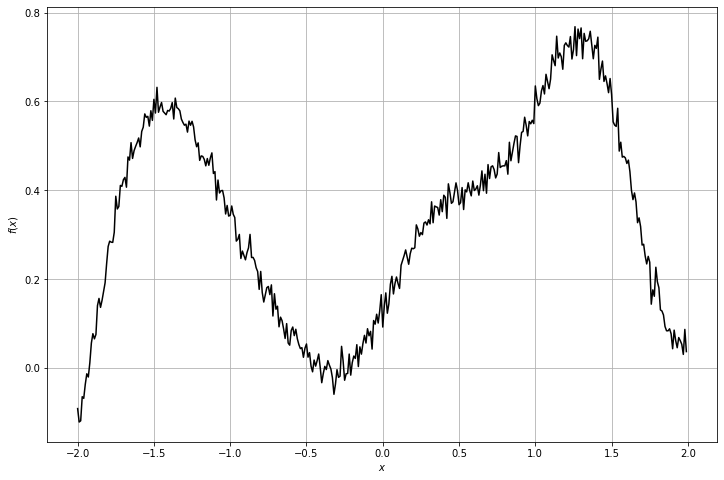

context_x =  (1, 10, 1)
context_y =  (1, 10, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


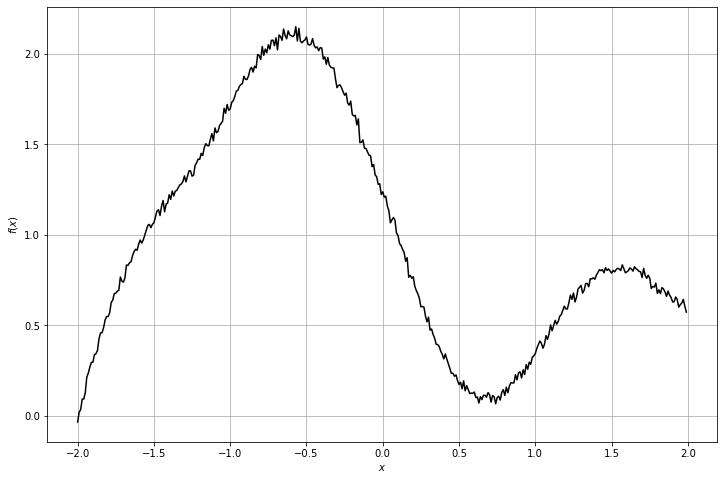

context_x =  (1, 4, 1)
context_y =  (1, 4, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


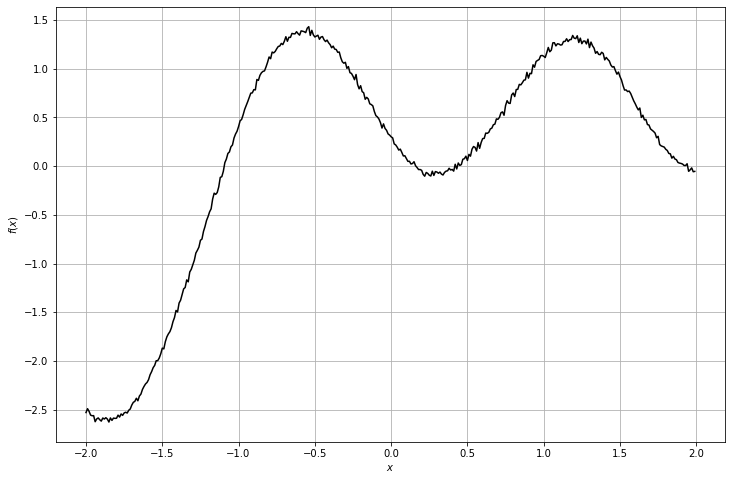

context_x =  (1, 71, 1)
context_y =  (1, 71, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


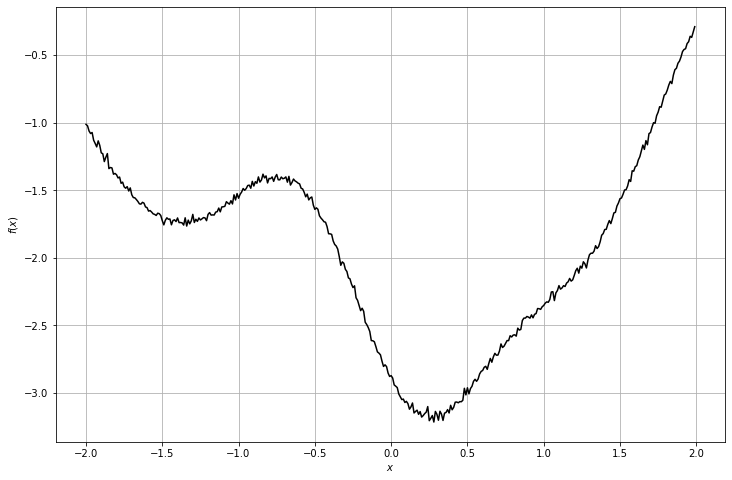

context_x =  (1, 44, 1)
context_y =  (1, 44, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


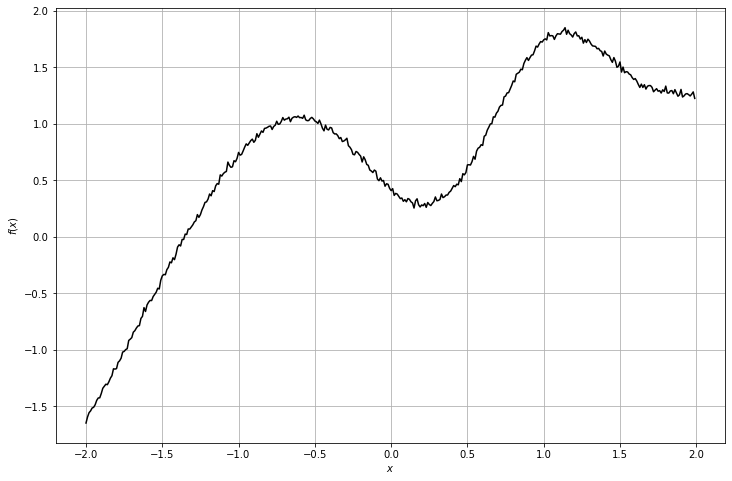

context_x =  (1, 68, 1)
context_y =  (1, 68, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


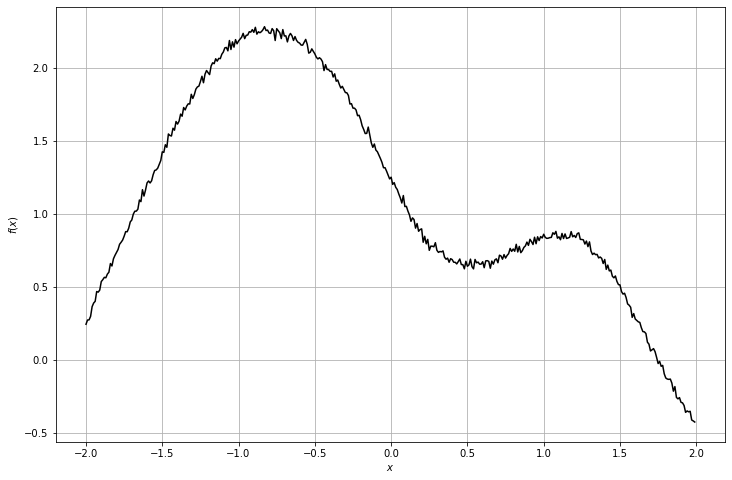

context_x =  (1, 34, 1)
context_y =  (1, 34, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


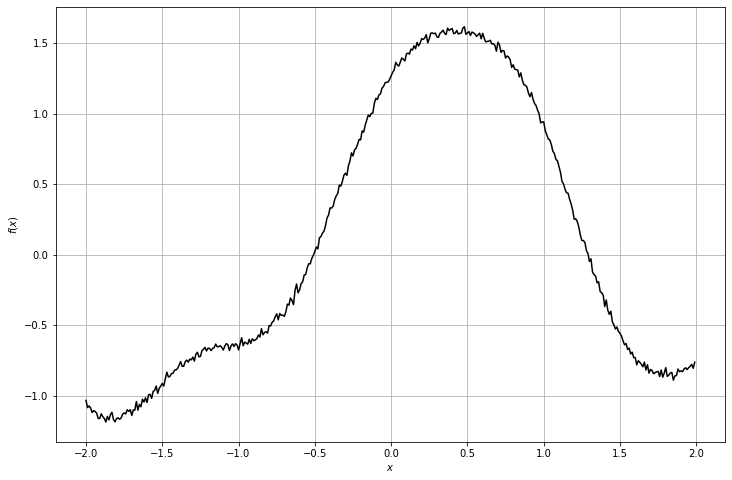

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


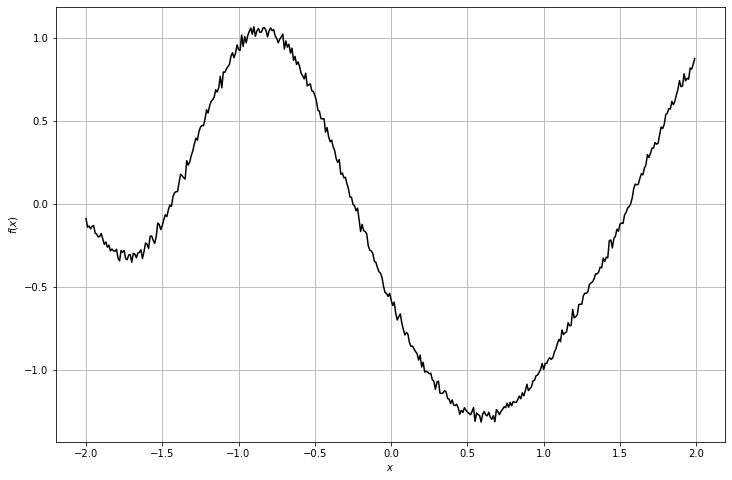

context_x =  (1, 97, 1)
context_y =  (1, 97, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


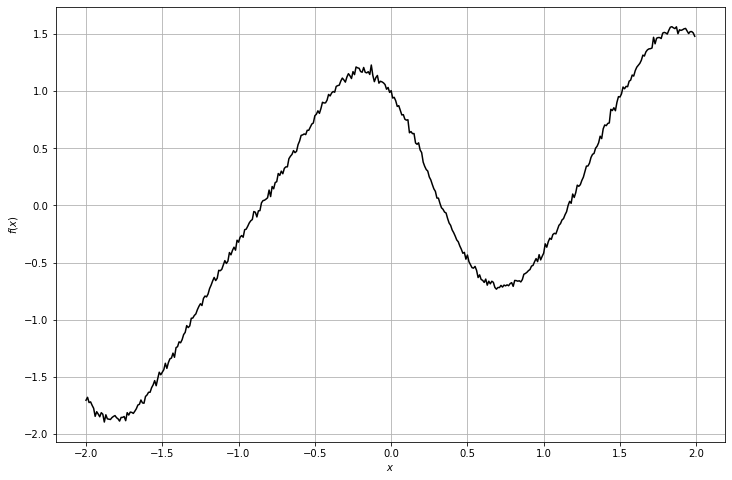

context_x =  (1, 54, 1)
context_y =  (1, 54, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


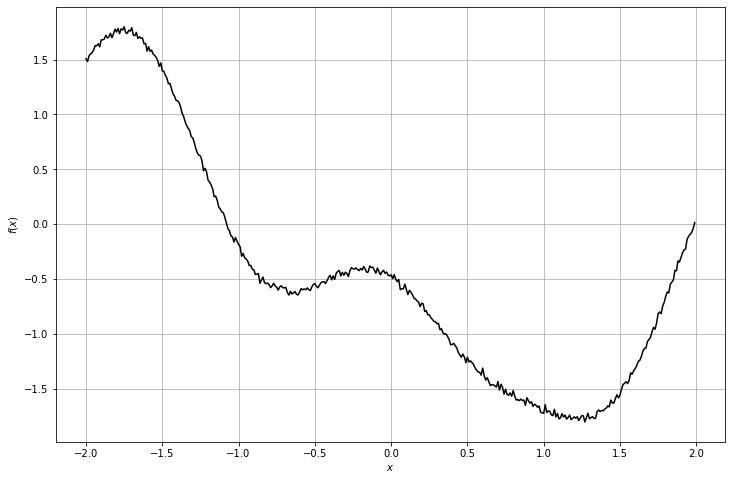

context_x =  (1, 35, 1)
context_y =  (1, 35, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


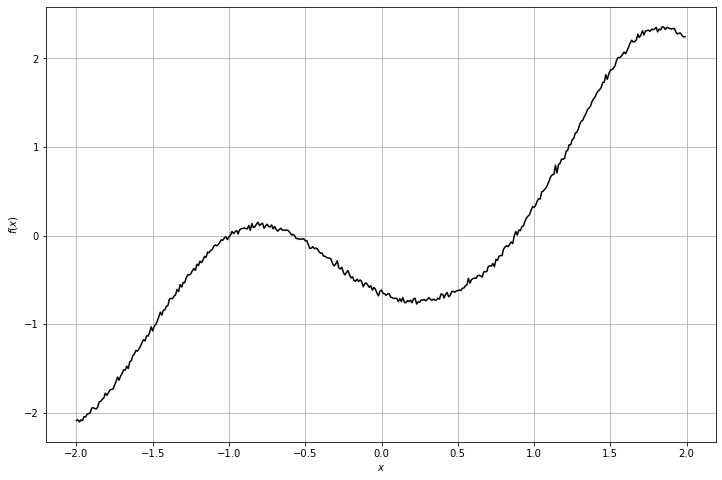

context_x =  (1, 52, 1)
context_y =  (1, 52, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


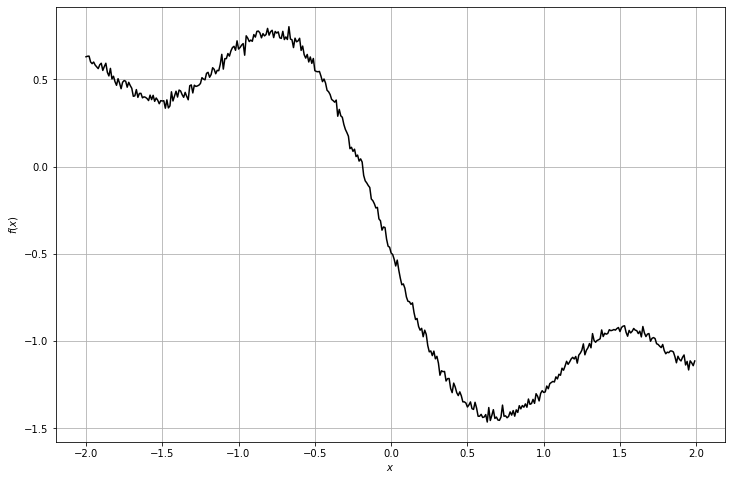

context_x =  (1, 67, 1)
context_y =  (1, 67, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


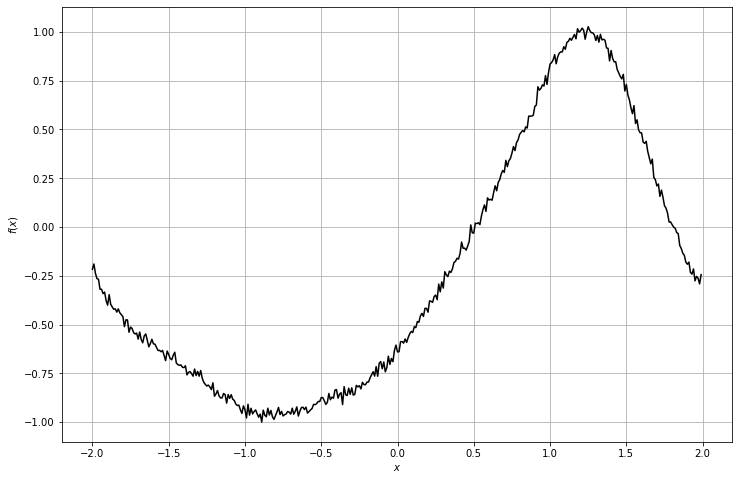

context_x =  (1, 50, 1)
context_y =  (1, 50, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


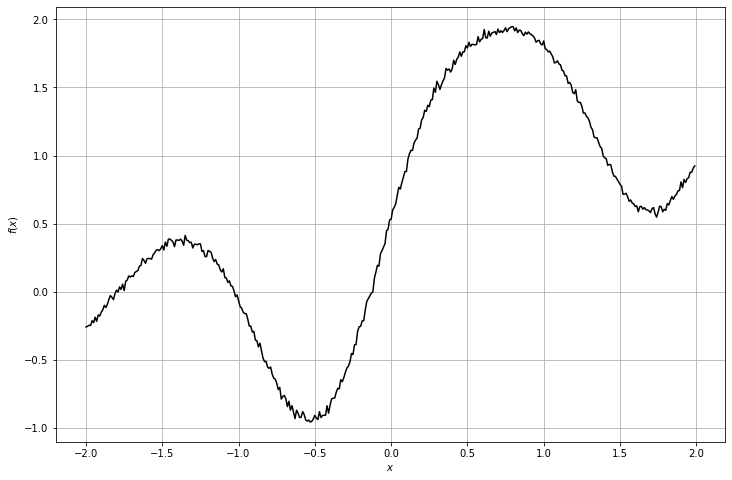

context_x =  (1, 12, 1)
context_y =  (1, 12, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


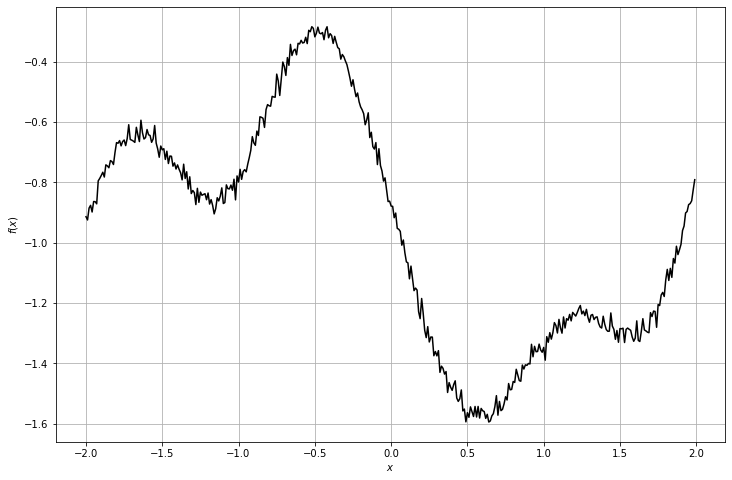

context_x =  (1, 98, 1)
context_y =  (1, 98, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


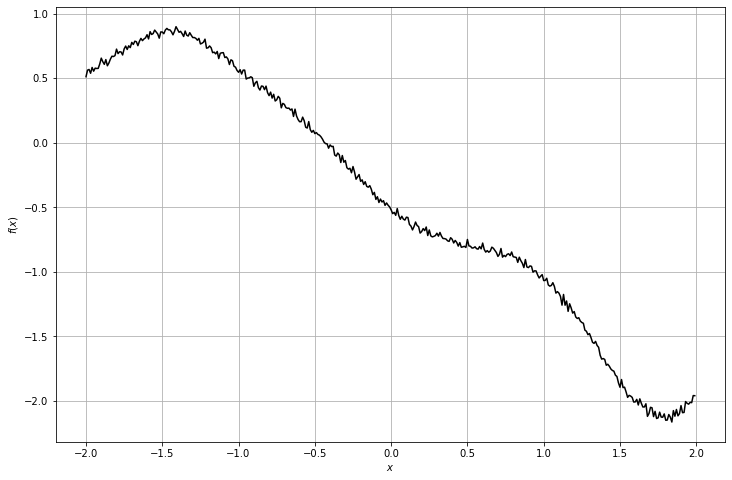

context_x =  (1, 25, 1)
context_y =  (1, 25, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


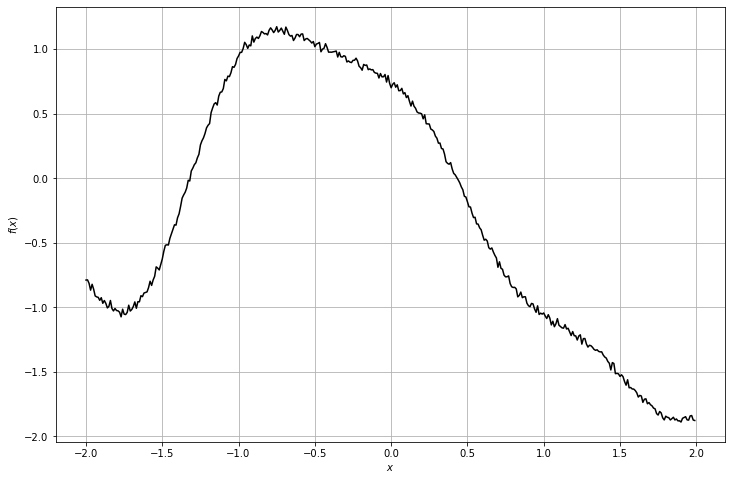

context_x =  (1, 90, 1)
context_y =  (1, 90, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


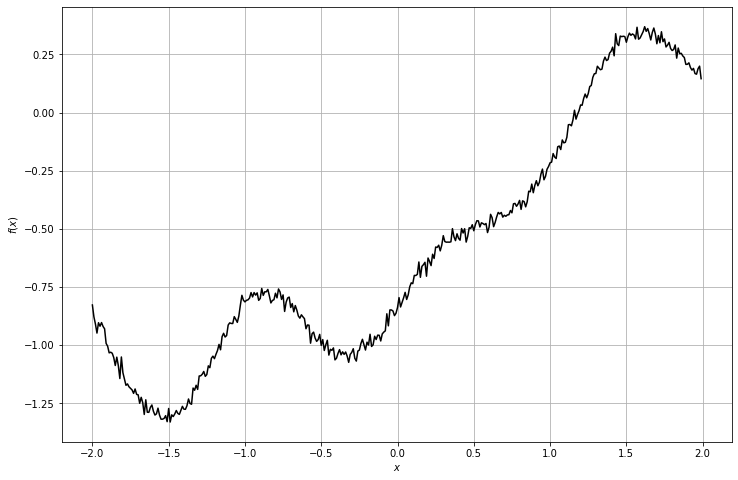

context_x =  (1, 55, 1)
context_y =  (1, 55, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


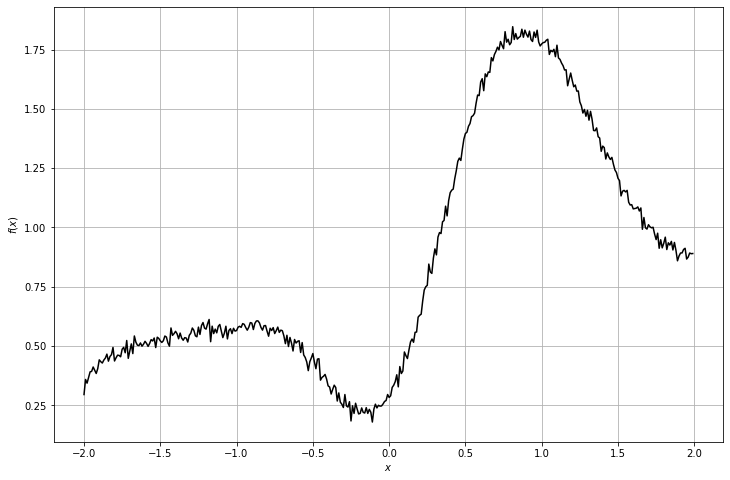

context_x =  (1, 38, 1)
context_y =  (1, 38, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


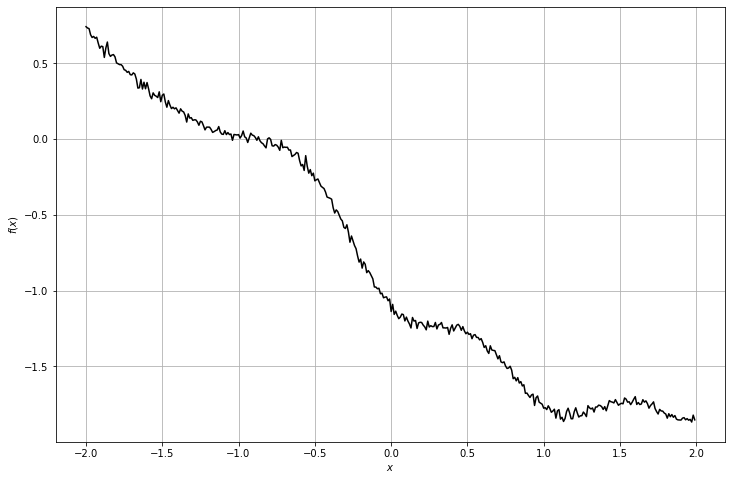

context_x =  (1, 62, 1)
context_y =  (1, 62, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


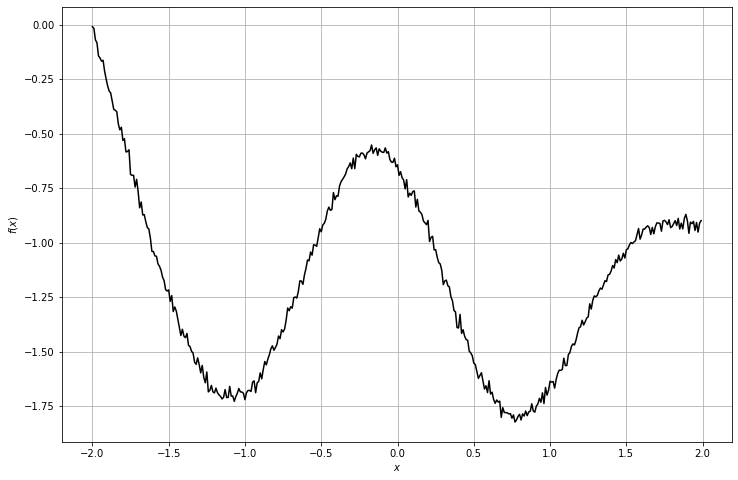

context_x =  (1, 72, 1)
context_y =  (1, 72, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


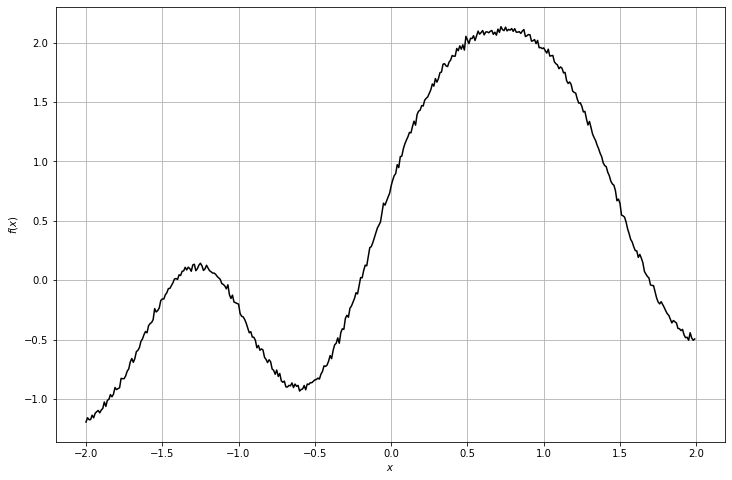

context_x =  (1, 88, 1)
context_y =  (1, 88, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


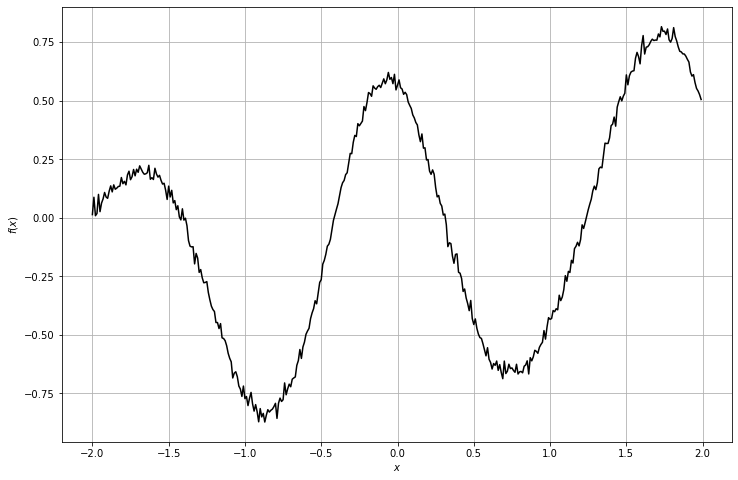

context_x =  (1, 29, 1)
context_y =  (1, 29, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


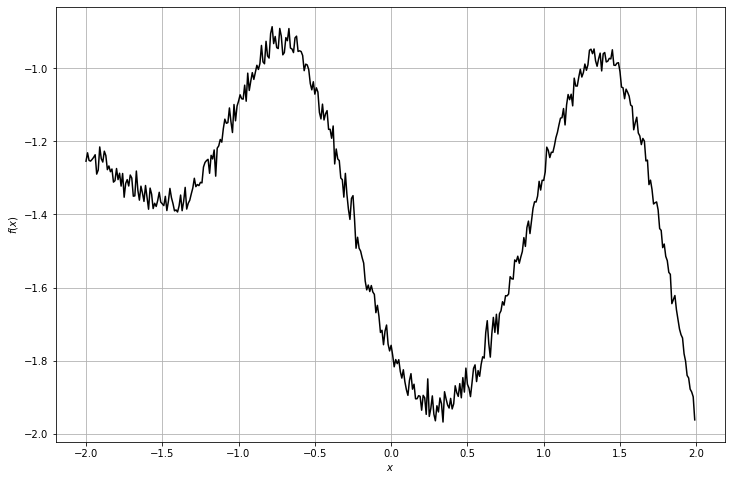

context_x =  (1, 86, 1)
context_y =  (1, 86, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


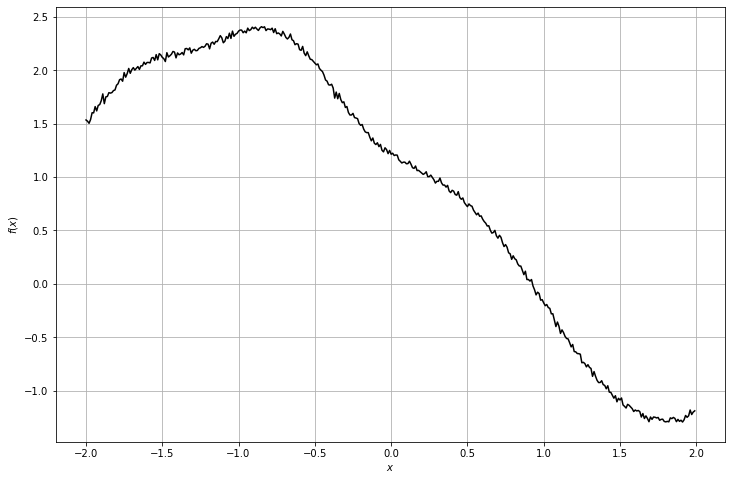

context_x =  (1, 83, 1)
context_y =  (1, 83, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


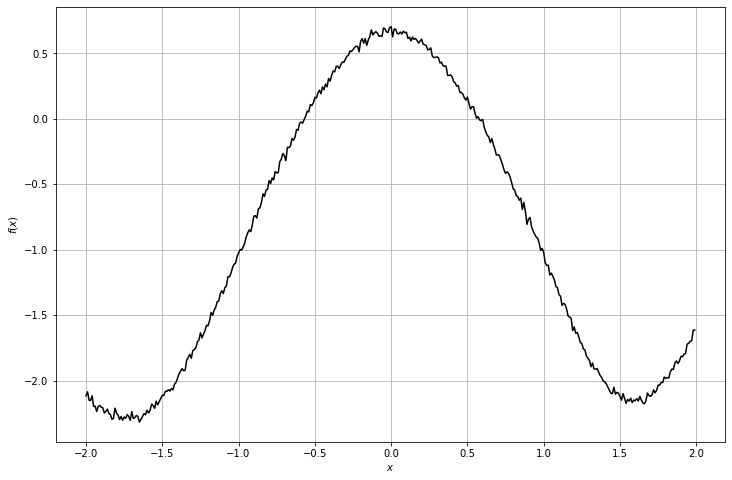

context_x =  (1, 60, 1)
context_y =  (1, 60, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


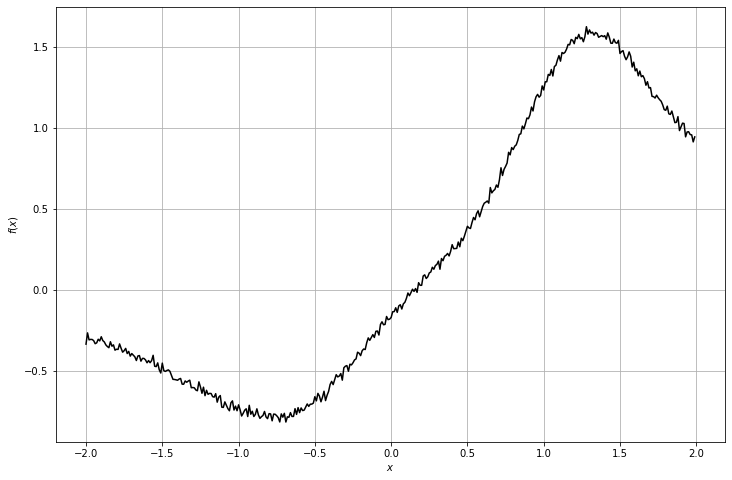

context_x =  (1, 18, 1)
context_y =  (1, 18, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


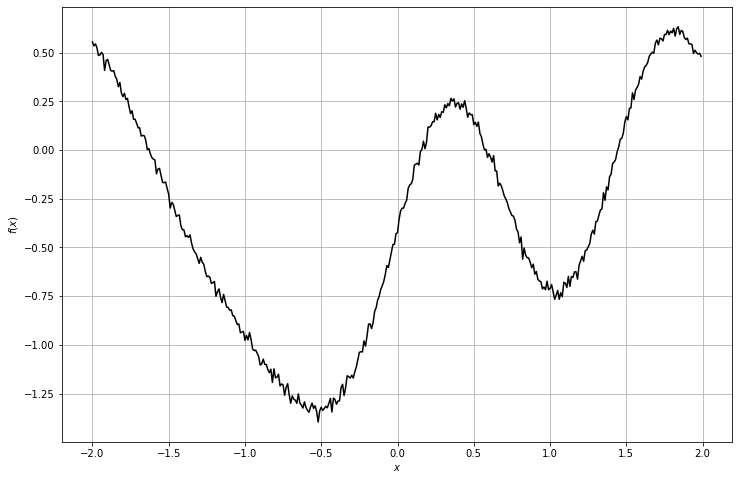

context_x =  (1, 76, 1)
context_y =  (1, 76, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


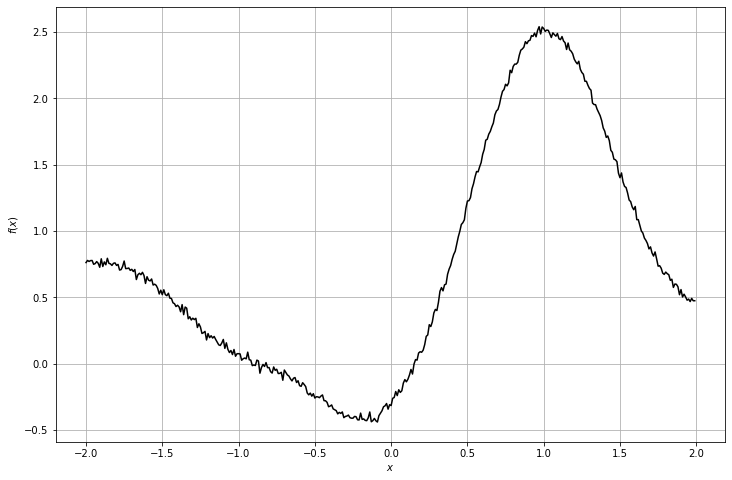

context_x =  (1, 11, 1)
context_y =  (1, 11, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


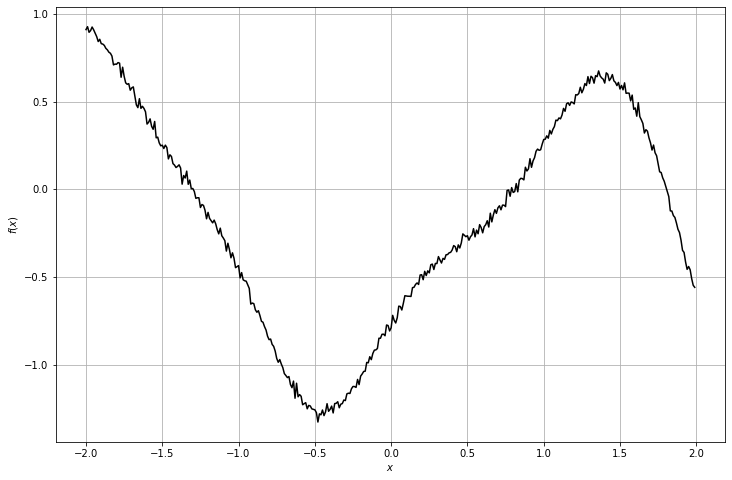

context_x =  (1, 95, 1)
context_y =  (1, 95, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


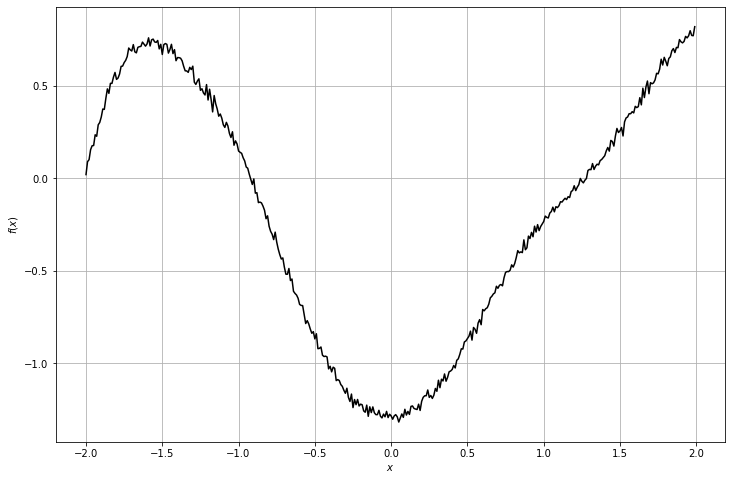

context_x =  (1, 69, 1)
context_y =  (1, 69, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


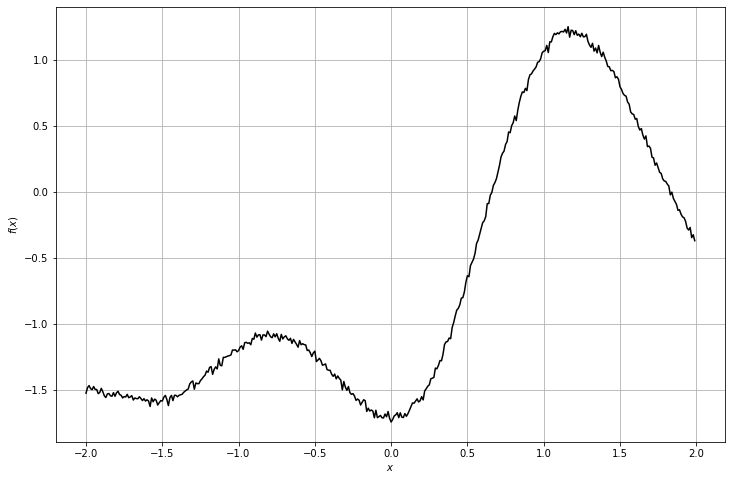

context_x =  (1, 24, 1)
context_y =  (1, 24, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


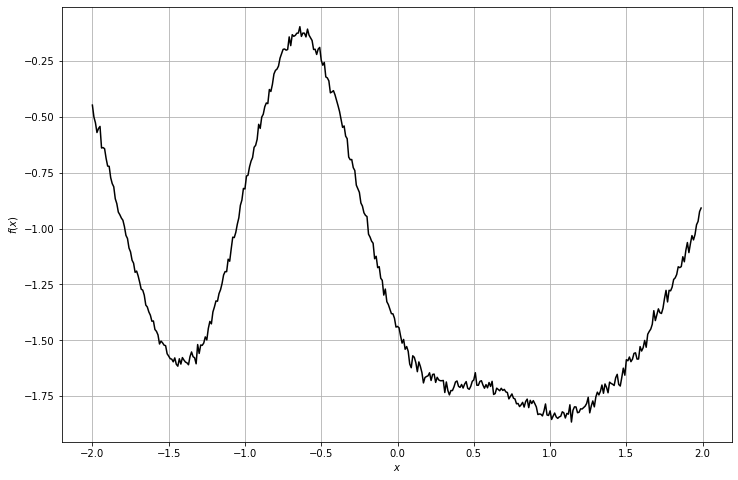

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


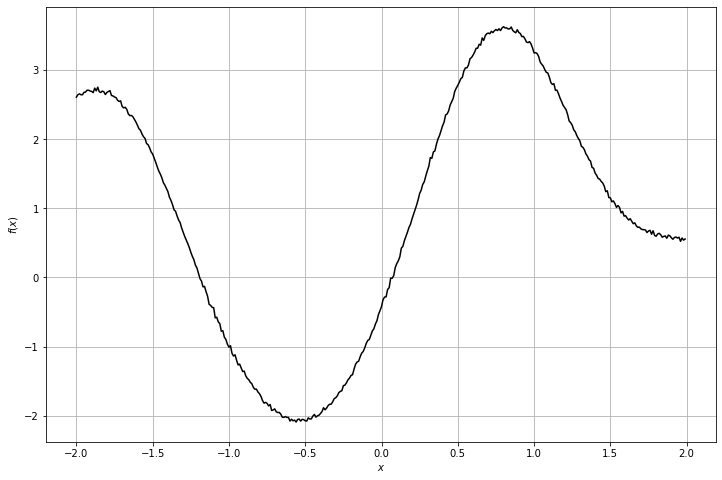

context_x =  (1, 18, 1)
context_y =  (1, 18, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


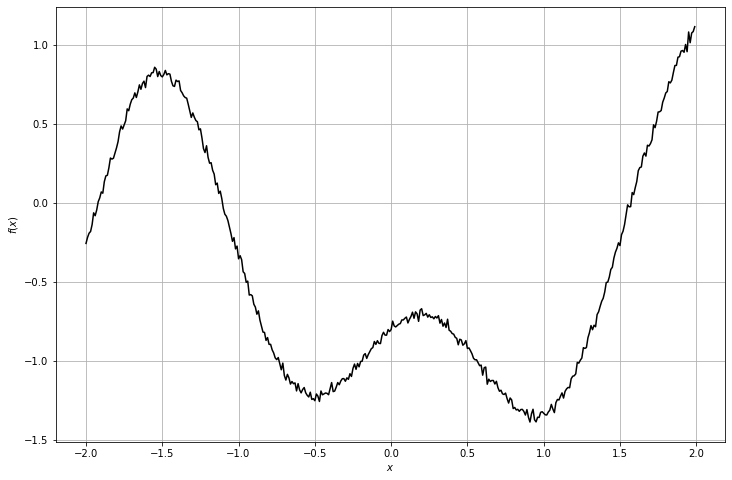

context_x =  (1, 33, 1)
context_y =  (1, 33, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


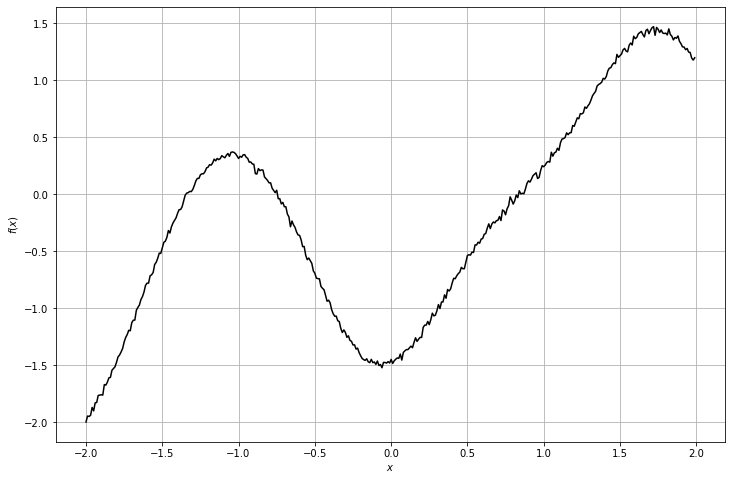

context_x =  (1, 58, 1)
context_y =  (1, 58, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


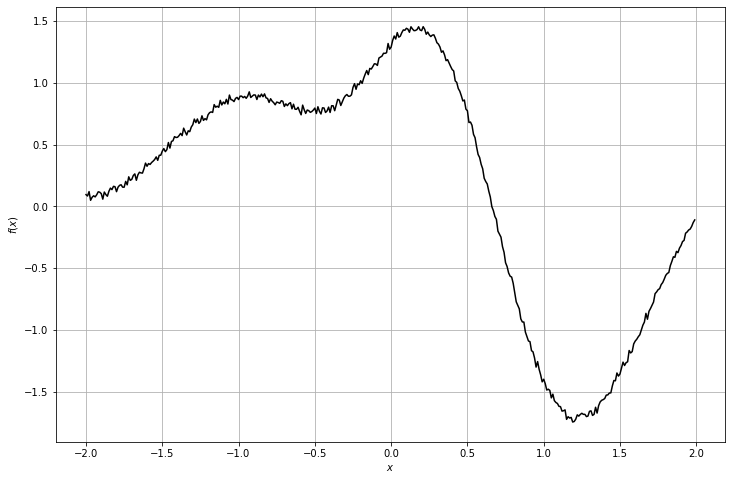

context_x =  (1, 92, 1)
context_y =  (1, 92, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


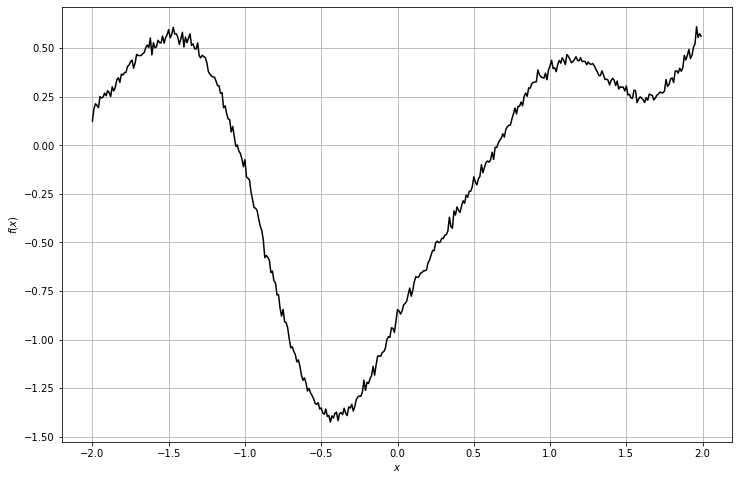

context_x =  (1, 49, 1)
context_y =  (1, 49, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


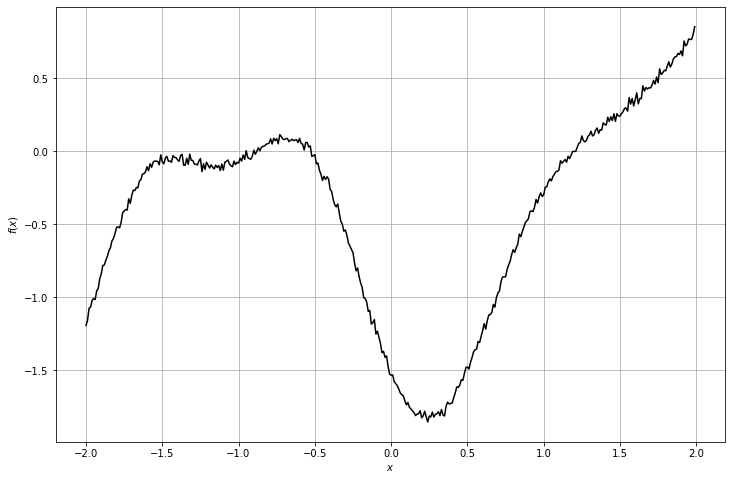

context_x =  (1, 99, 1)
context_y =  (1, 99, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


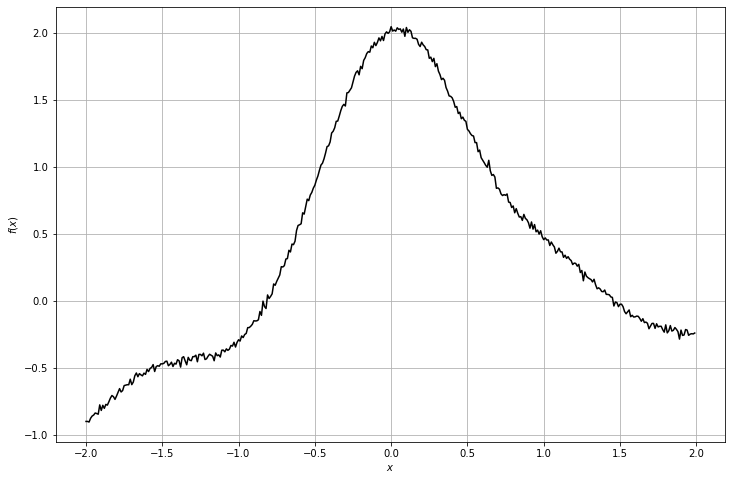

context_x =  (1, 12, 1)
context_y =  (1, 12, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


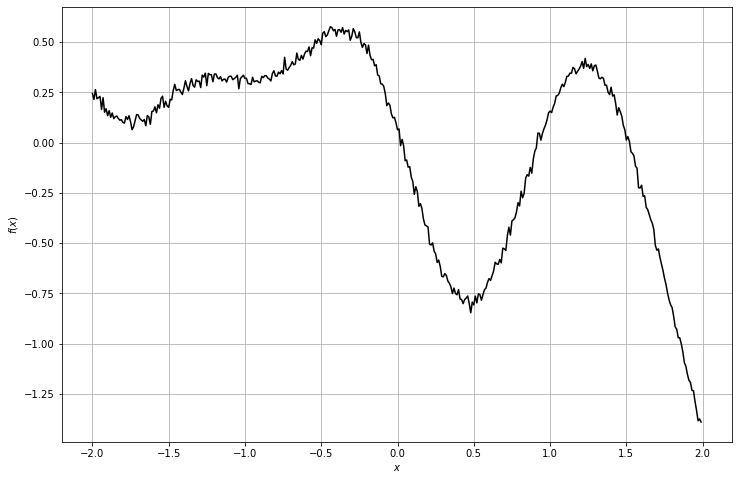

context_x =  (1, 45, 1)
context_y =  (1, 45, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


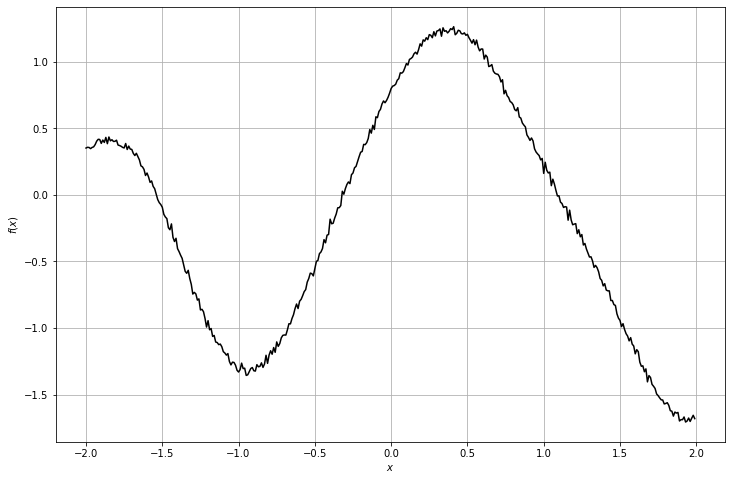

context_x =  (1, 53, 1)
context_y =  (1, 53, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


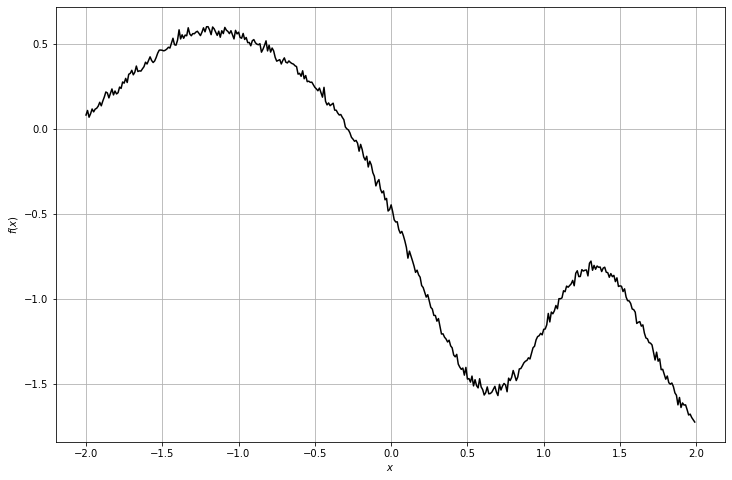

context_x =  (1, 11, 1)
context_y =  (1, 11, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


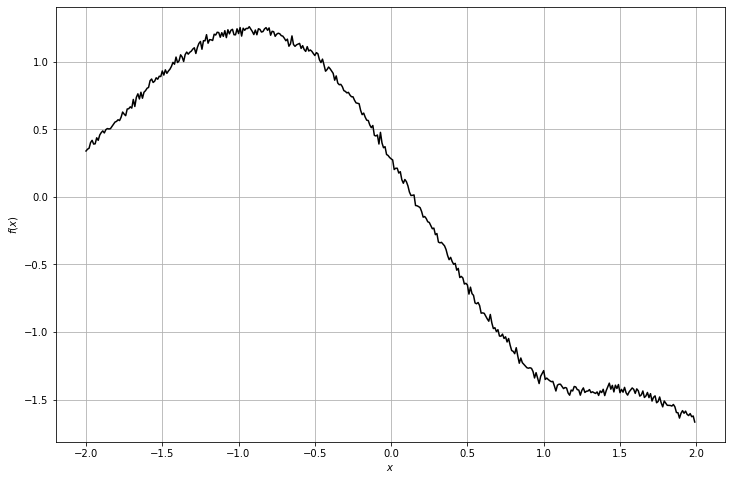

context_x =  (1, 28, 1)
context_y =  (1, 28, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


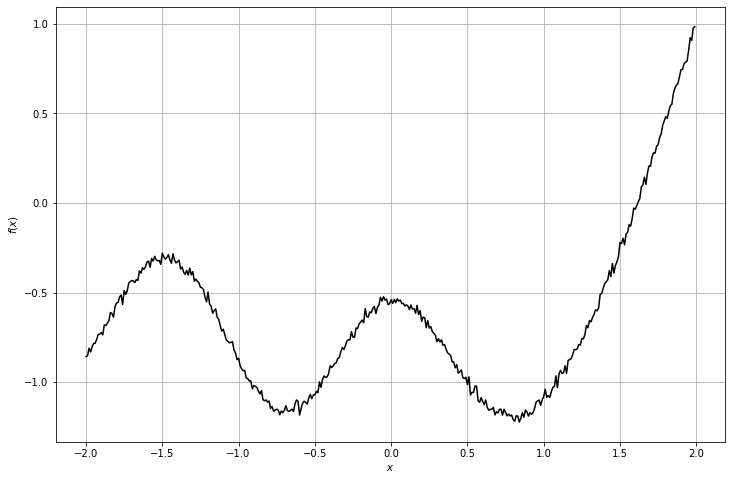

context_x =  (1, 61, 1)
context_y =  (1, 61, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


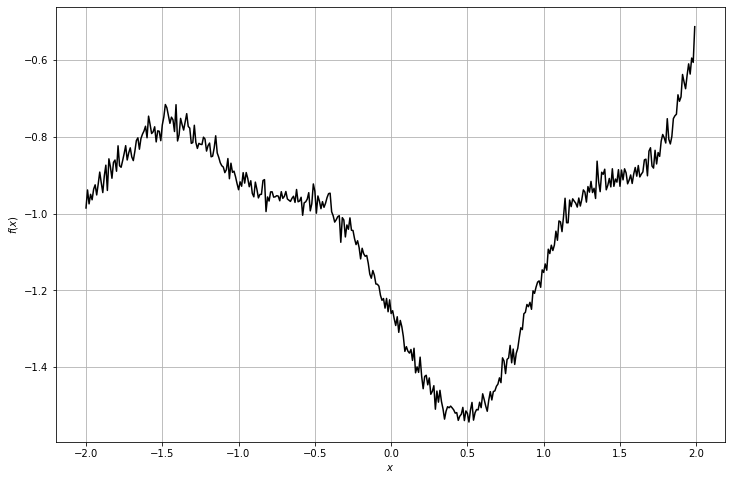

context_x =  (1, 17, 1)
context_y =  (1, 17, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


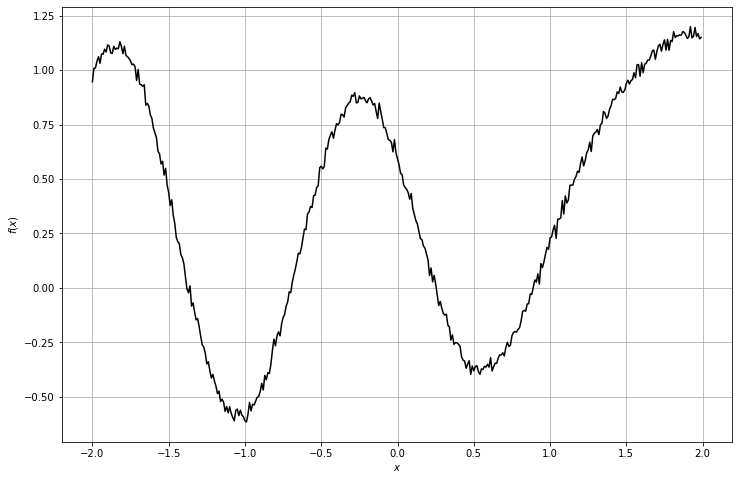

context_x =  (1, 78, 1)
context_y =  (1, 78, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


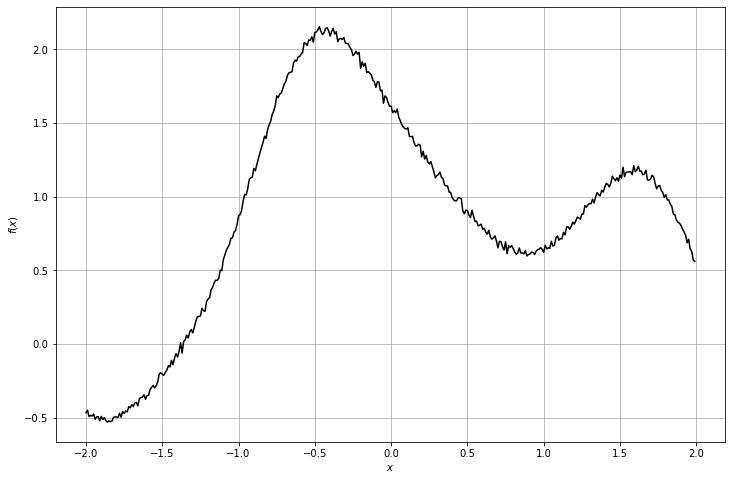

context_x =  (1, 34, 1)
context_y =  (1, 34, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


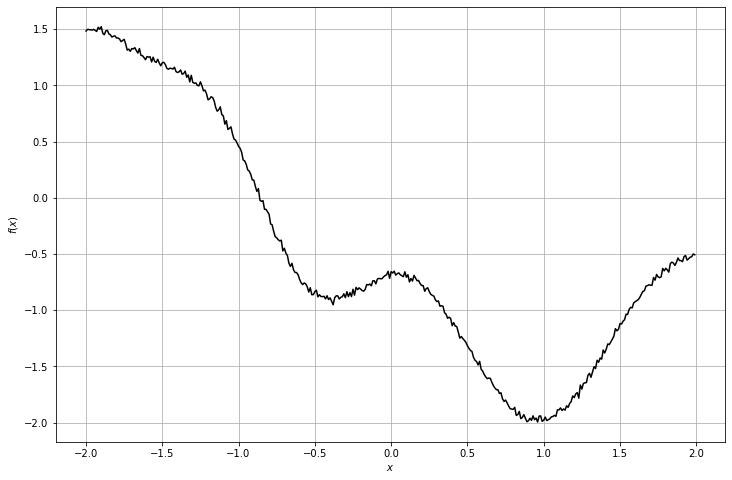

context_x =  (1, 77, 1)
context_y =  (1, 77, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


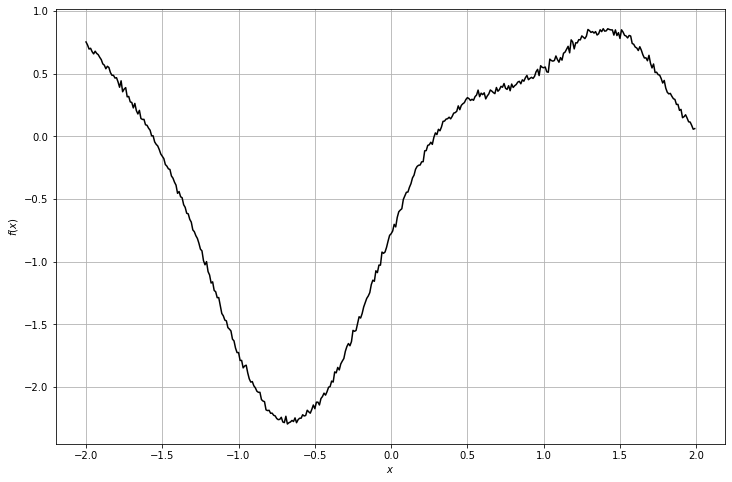

context_x =  (1, 80, 1)
context_y =  (1, 80, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


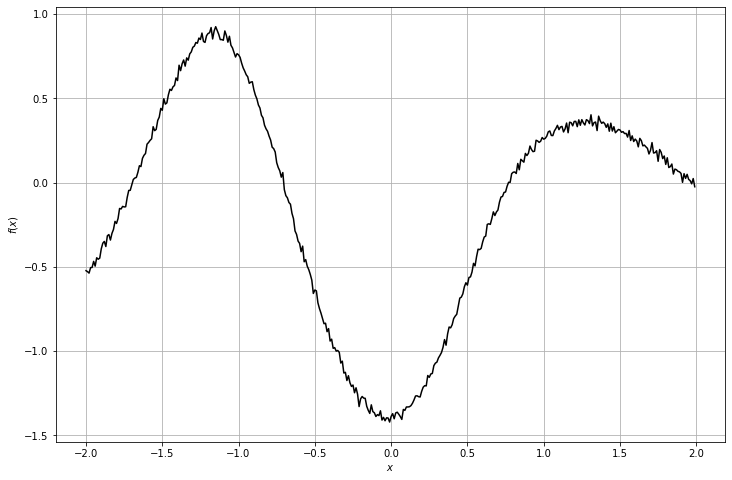

context_x =  (1, 75, 1)
context_y =  (1, 75, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


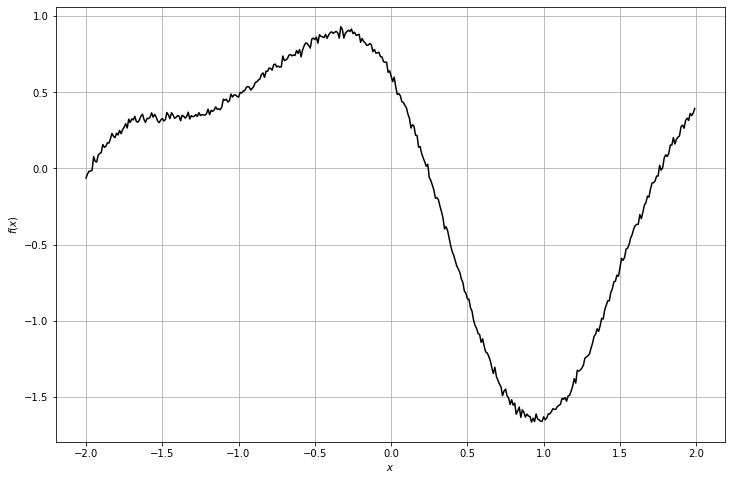

context_x =  (1, 42, 1)
context_y =  (1, 42, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


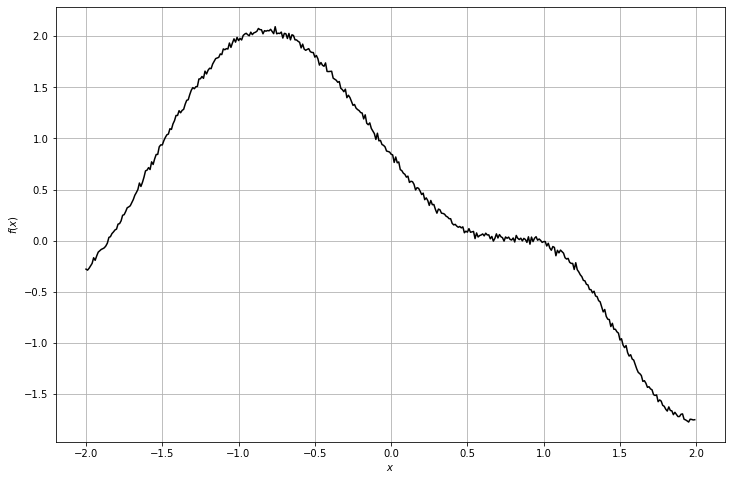

context_x =  (1, 60, 1)
context_y =  (1, 60, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


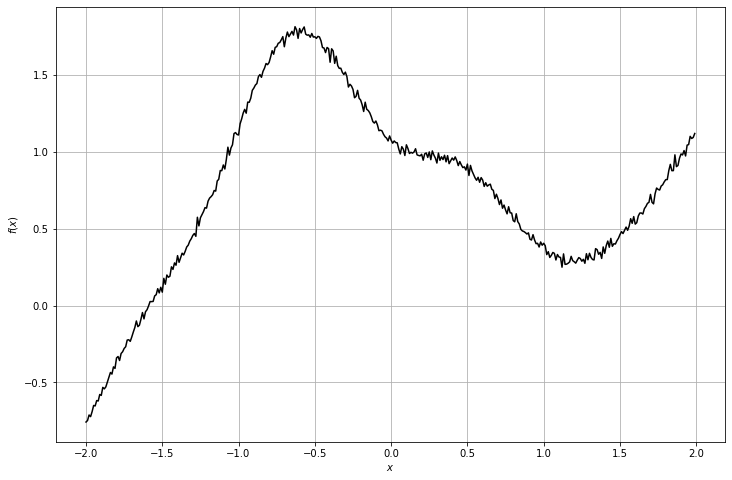

context_x =  (1, 66, 1)
context_y =  (1, 66, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


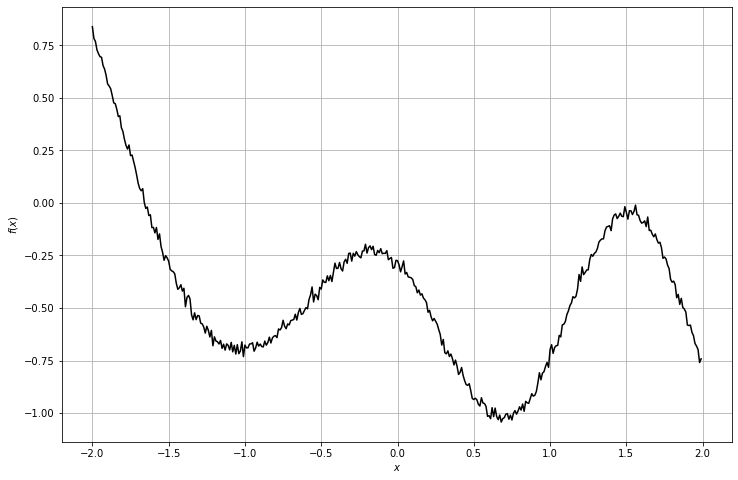

context_x =  (1, 44, 1)
context_y =  (1, 44, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


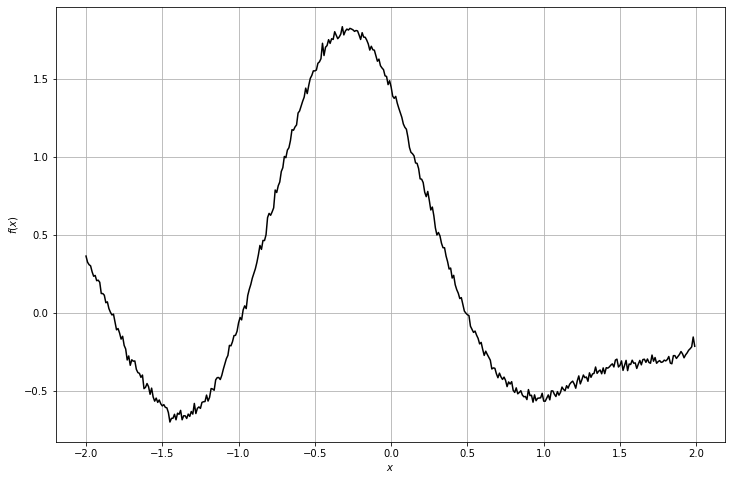

context_x =  (1, 3, 1)
context_y =  (1, 3, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


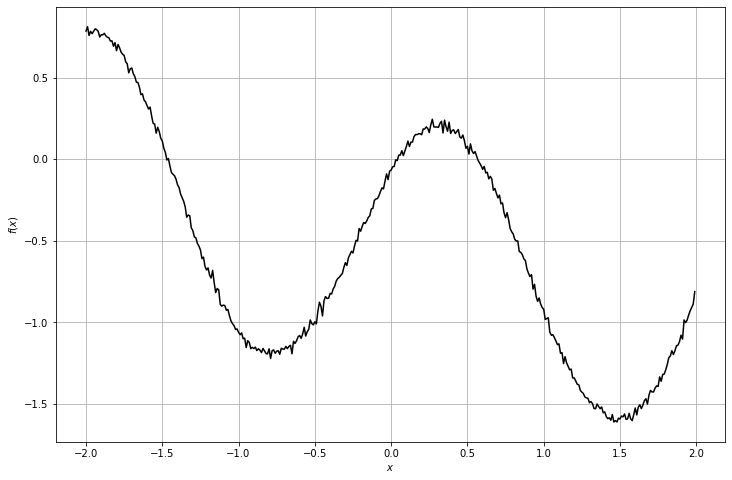

context_x =  (1, 70, 1)
context_y =  (1, 70, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


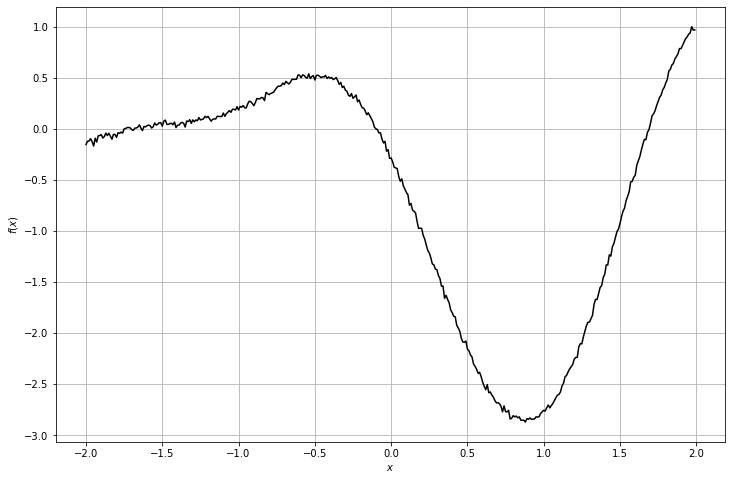

context_x =  (1, 9, 1)
context_y =  (1, 9, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


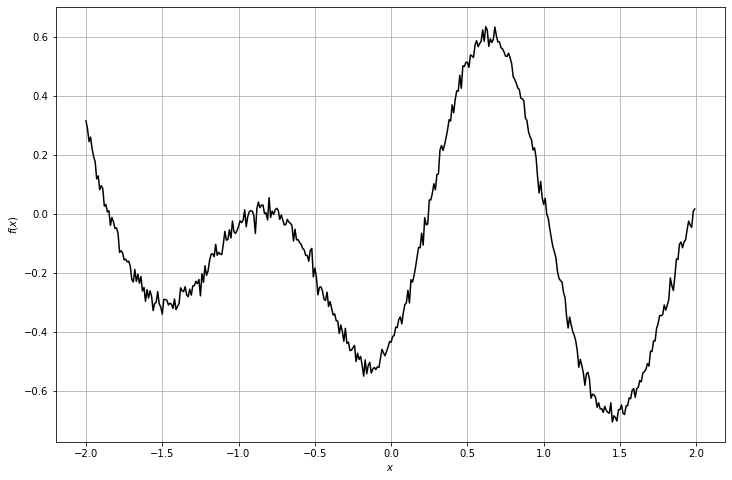

context_x =  (1, 99, 1)
context_y =  (1, 99, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


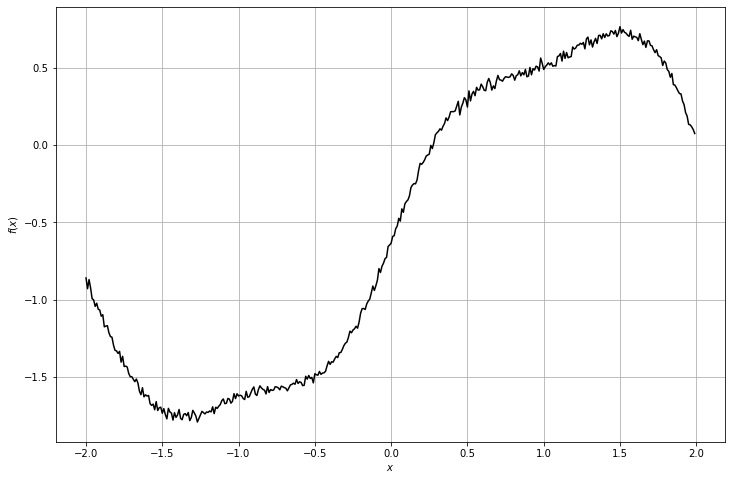

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


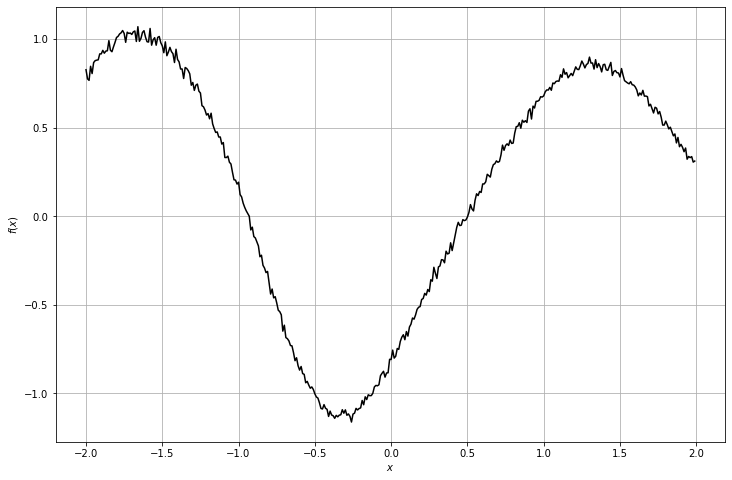

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


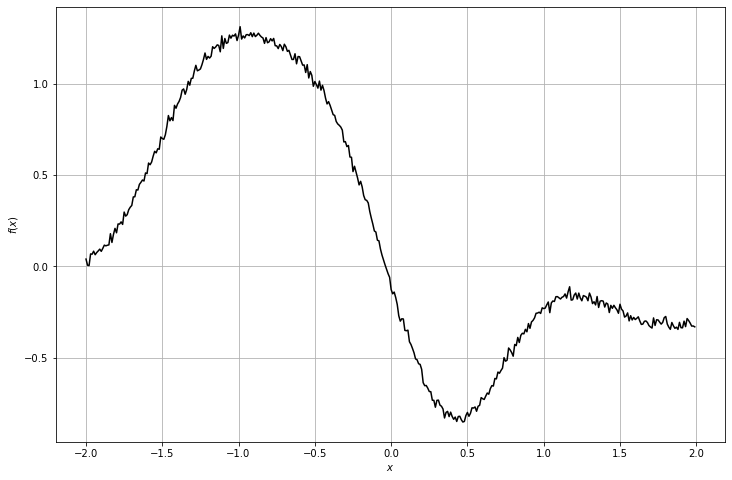

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


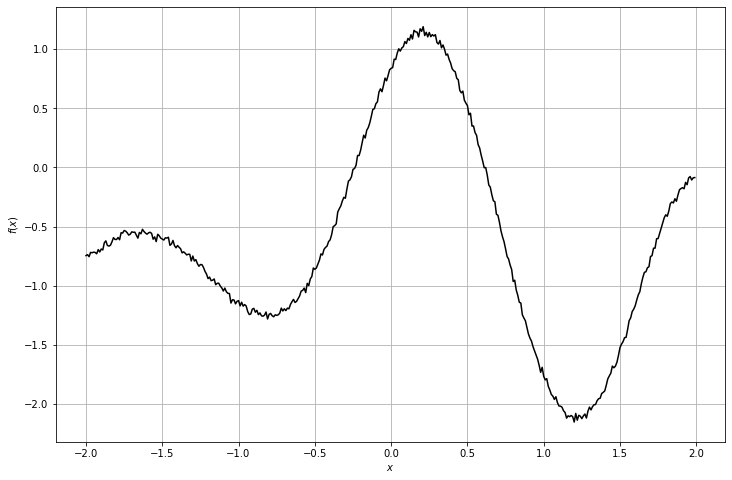

context_x =  (1, 43, 1)
context_y =  (1, 43, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


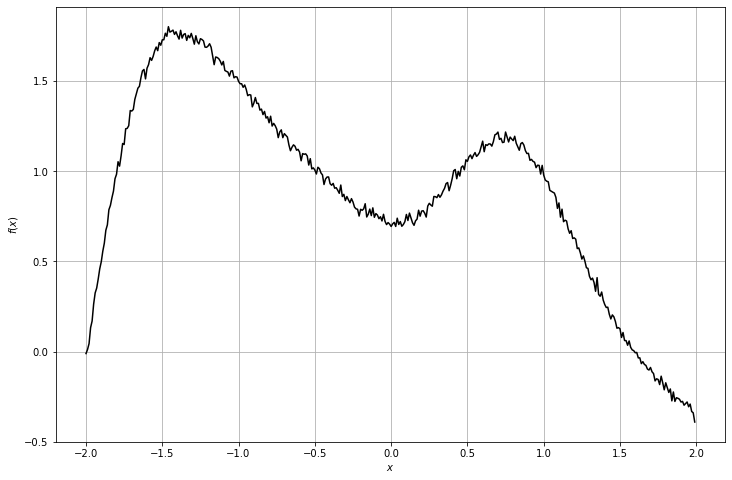

context_x =  (1, 32, 1)
context_y =  (1, 32, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


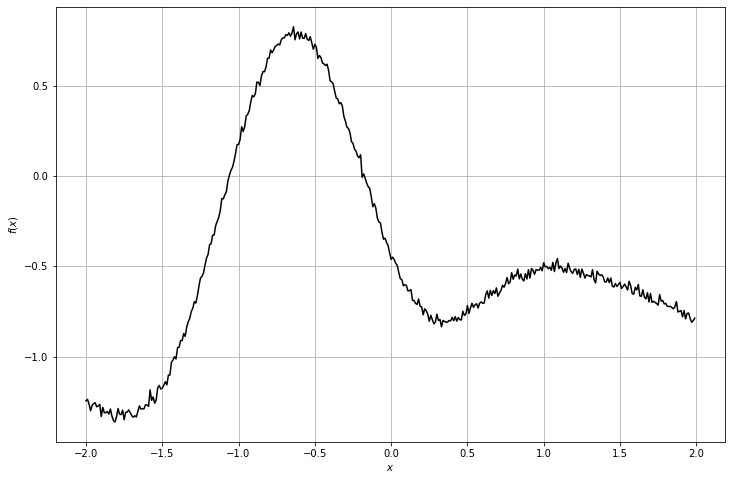

context_x =  (1, 41, 1)
context_y =  (1, 41, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


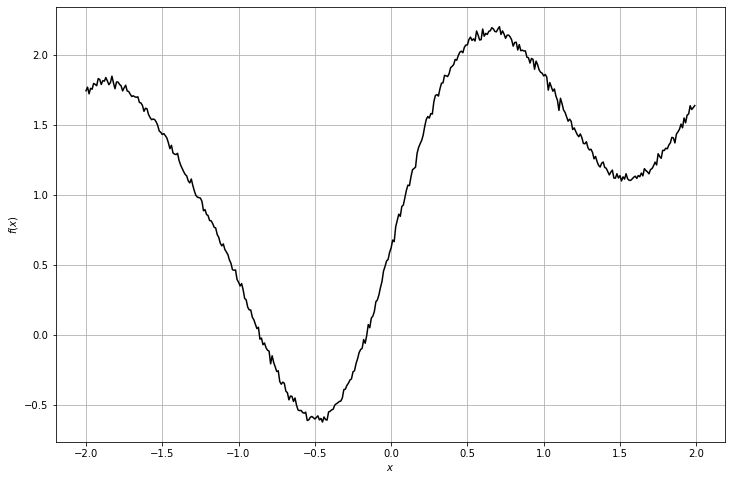

context_x =  (1, 36, 1)
context_y =  (1, 36, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


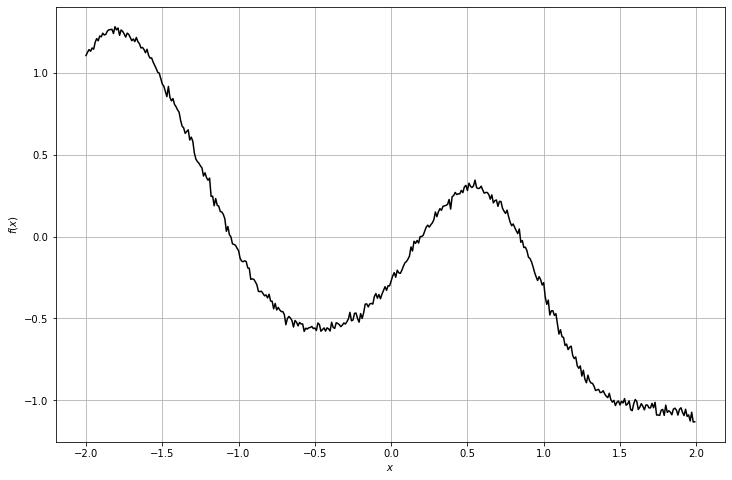

context_x =  (1, 3, 1)
context_y =  (1, 3, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


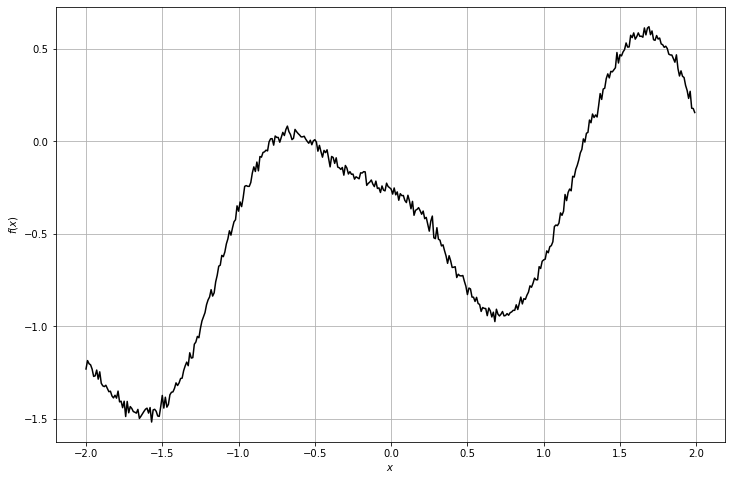

context_x =  (1, 32, 1)
context_y =  (1, 32, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


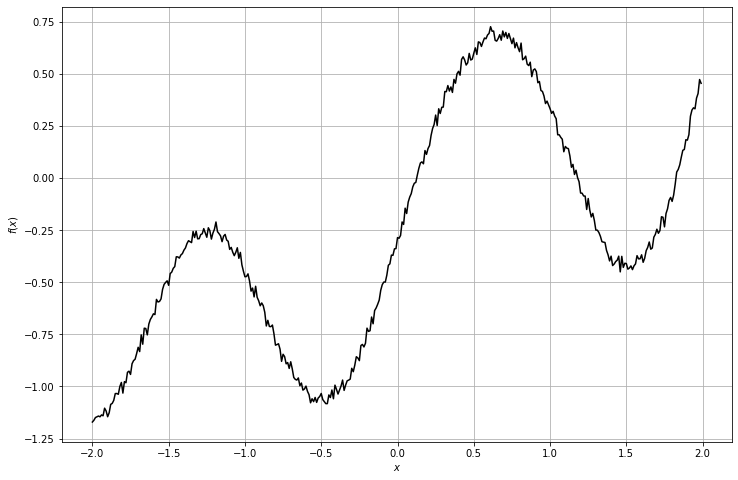

context_x =  (1, 12, 1)
context_y =  (1, 12, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


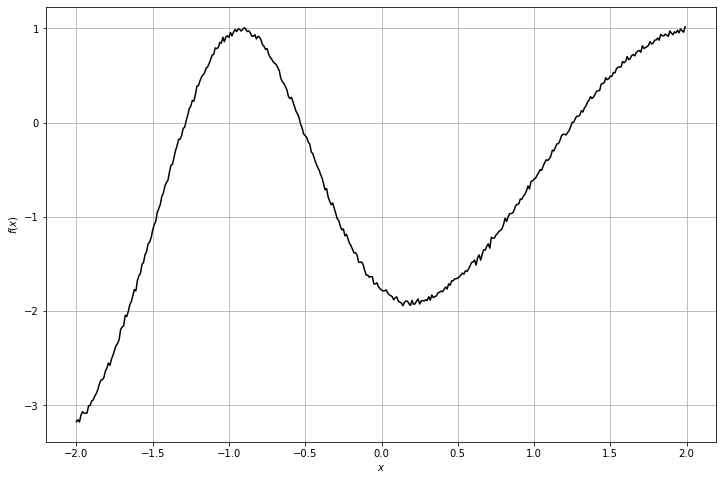

context_x =  (1, 85, 1)
context_y =  (1, 85, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


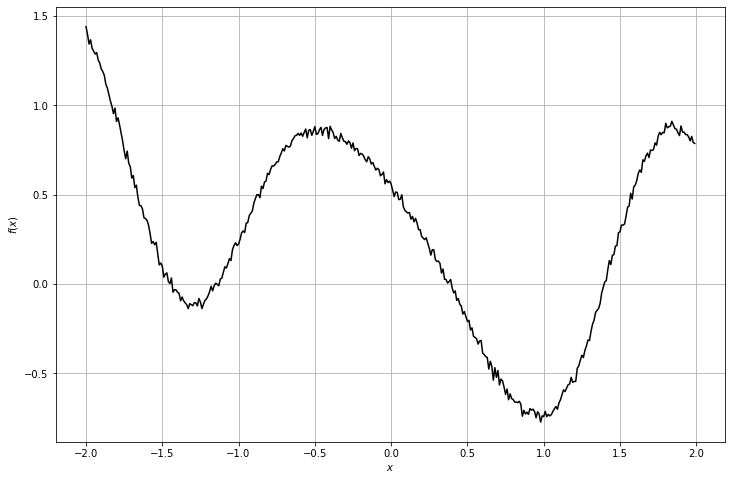

context_x =  (1, 86, 1)
context_y =  (1, 86, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


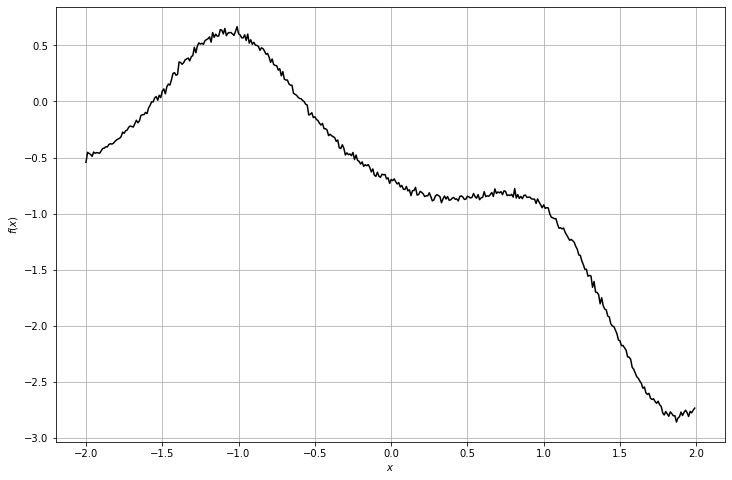

context_x =  (1, 59, 1)
context_y =  (1, 59, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


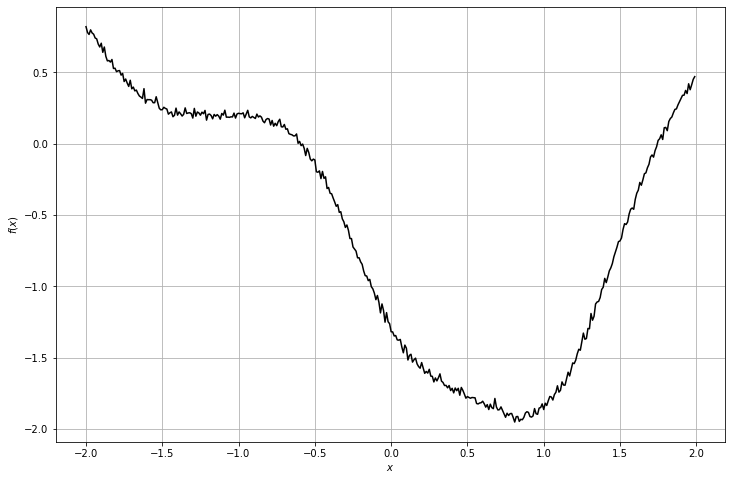

context_x =  (1, 81, 1)
context_y =  (1, 81, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


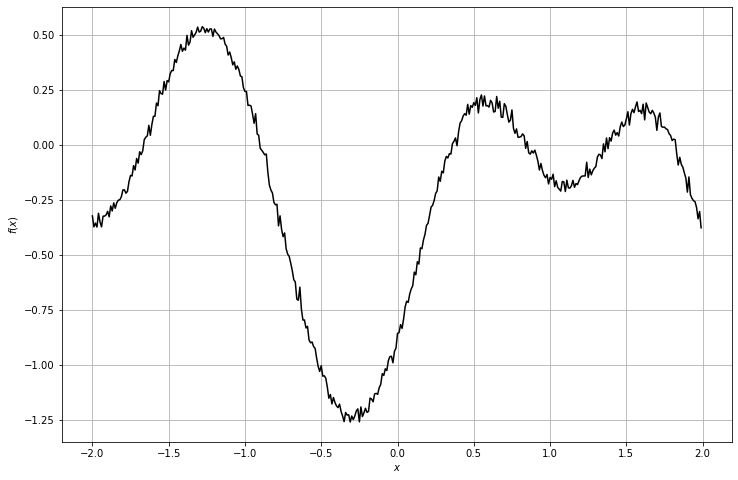

context_x =  (1, 77, 1)
context_y =  (1, 77, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


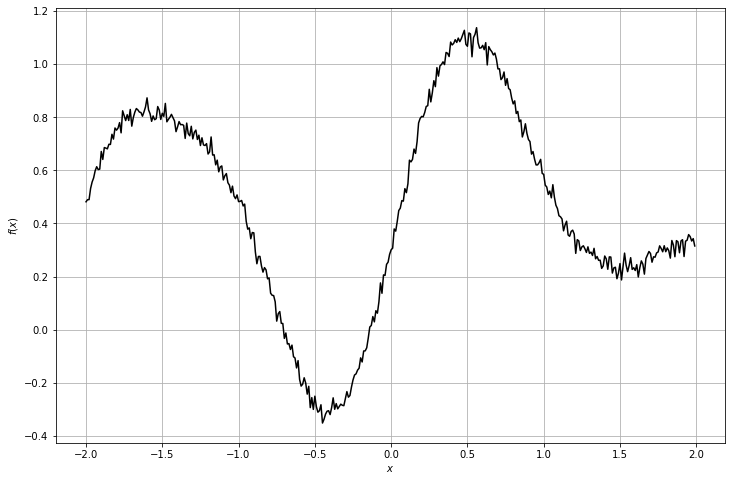

context_x =  (1, 4, 1)
context_y =  (1, 4, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


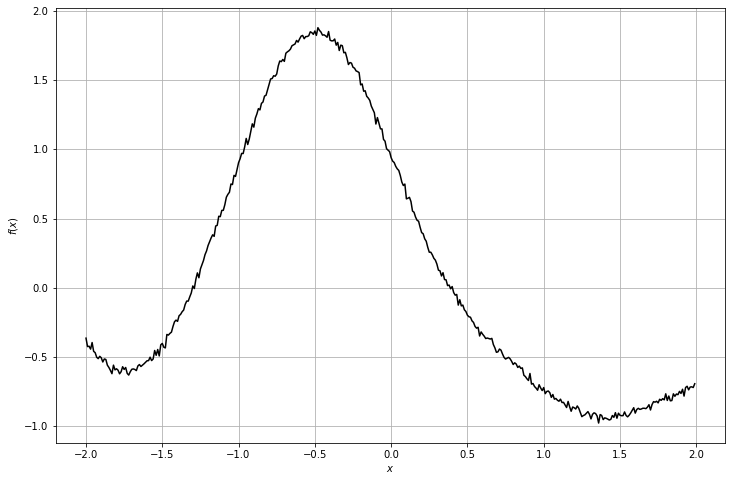

context_x =  (1, 30, 1)
context_y =  (1, 30, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


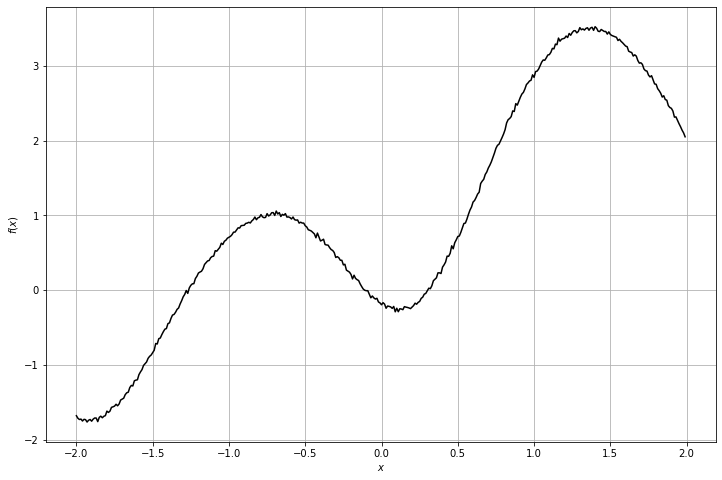

context_x =  (1, 40, 1)
context_y =  (1, 40, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


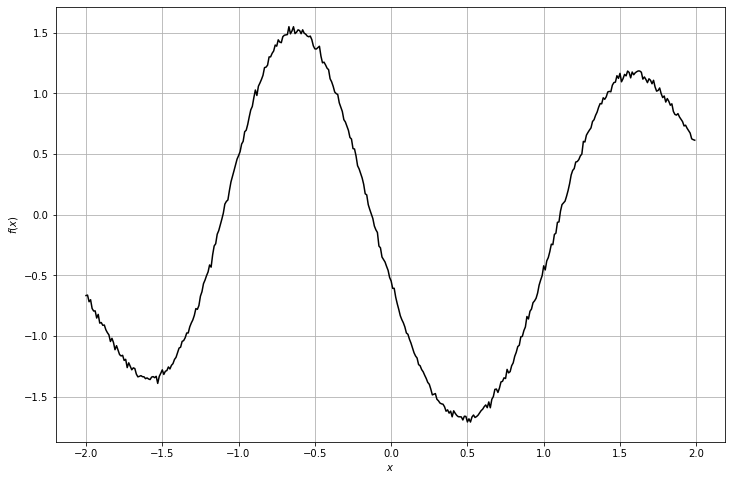

context_x =  (1, 15, 1)
context_y =  (1, 15, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


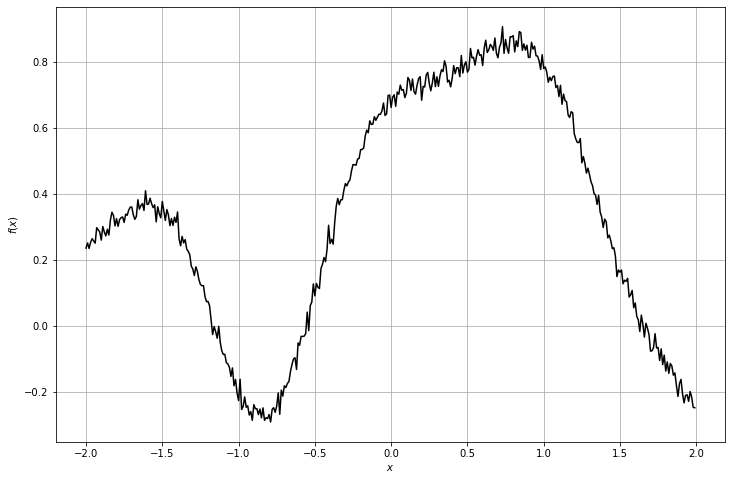

context_x =  (1, 21, 1)
context_y =  (1, 21, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


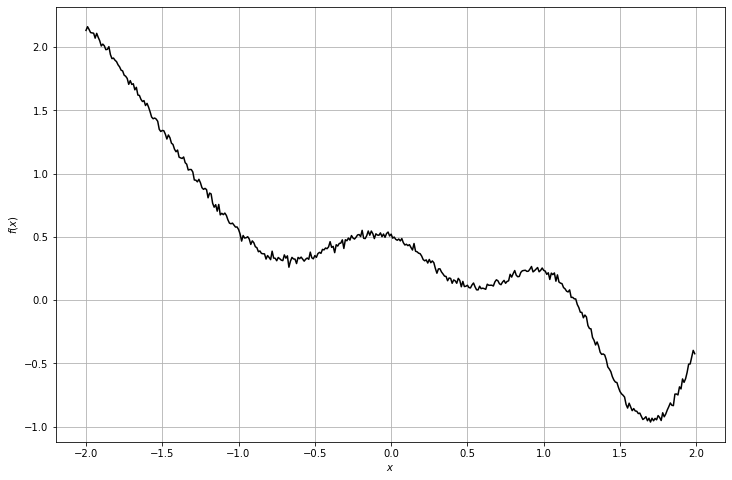

context_x =  (1, 72, 1)
context_y =  (1, 72, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


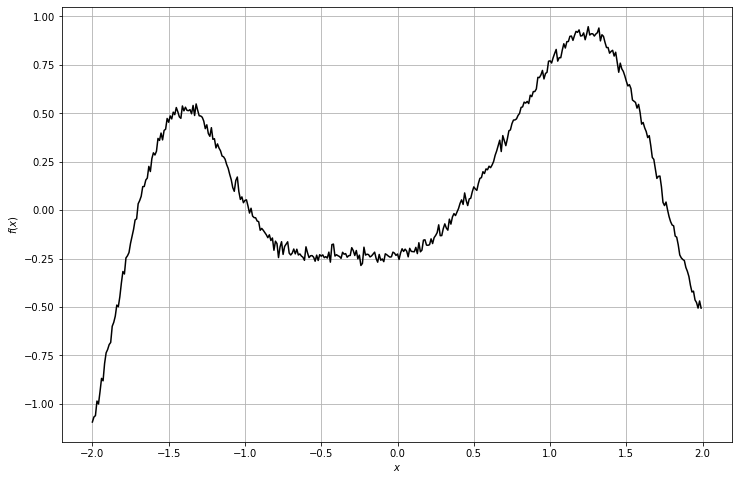

context_x =  (1, 15, 1)
context_y =  (1, 15, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


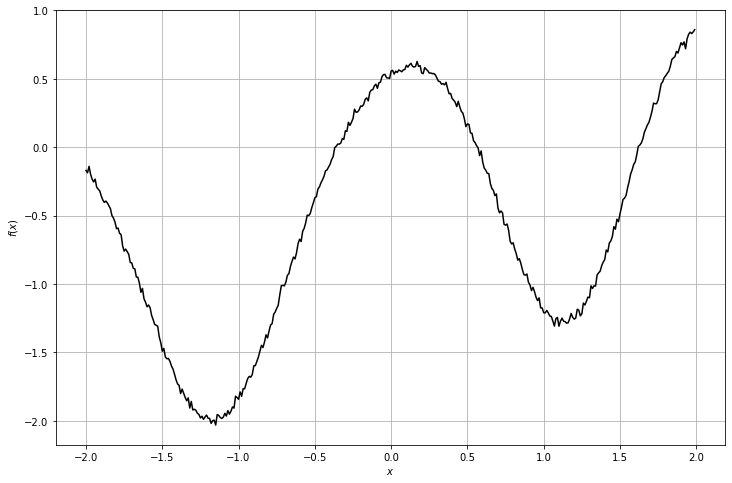

context_x =  (1, 96, 1)
context_y =  (1, 96, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


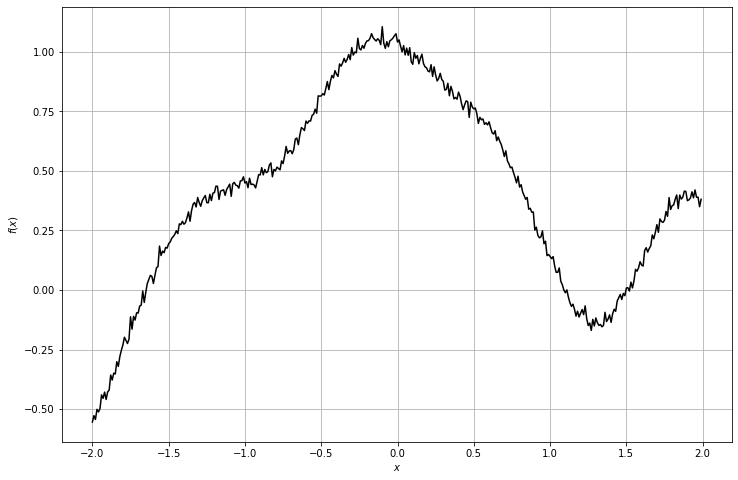

context_x =  (1, 10, 1)
context_y =  (1, 10, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


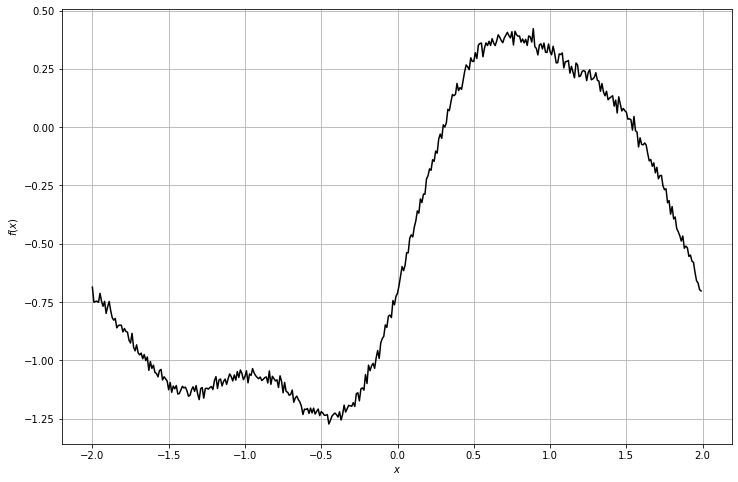

context_x =  (1, 32, 1)
context_y =  (1, 32, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


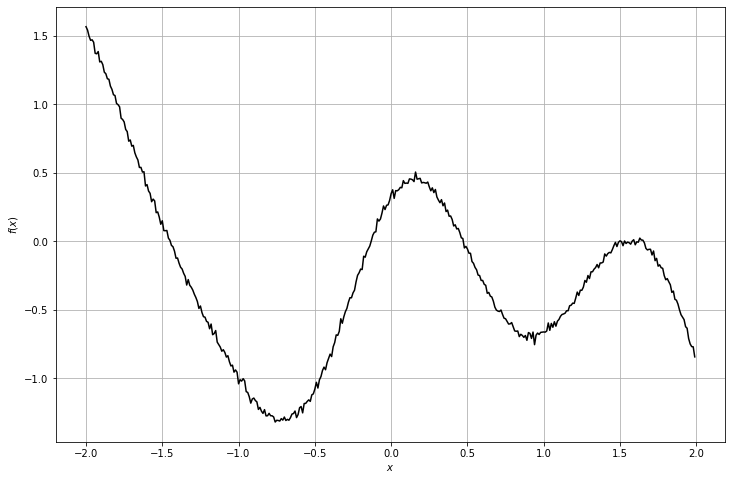

context_x =  (1, 20, 1)
context_y =  (1, 20, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


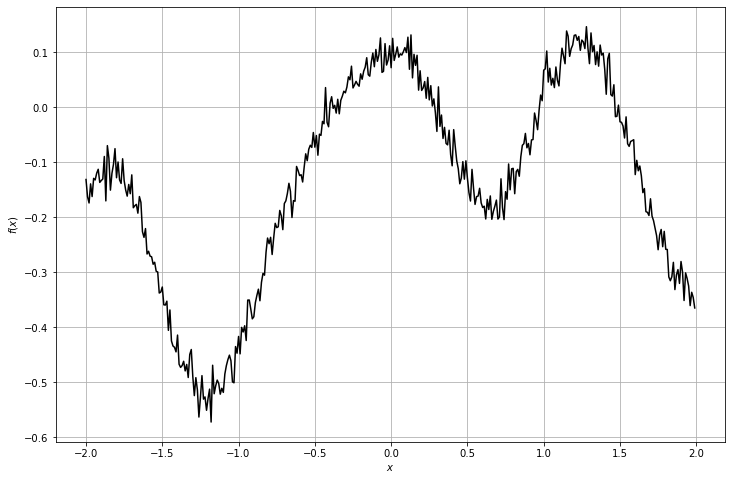

context_x =  (1, 14, 1)
context_y =  (1, 14, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


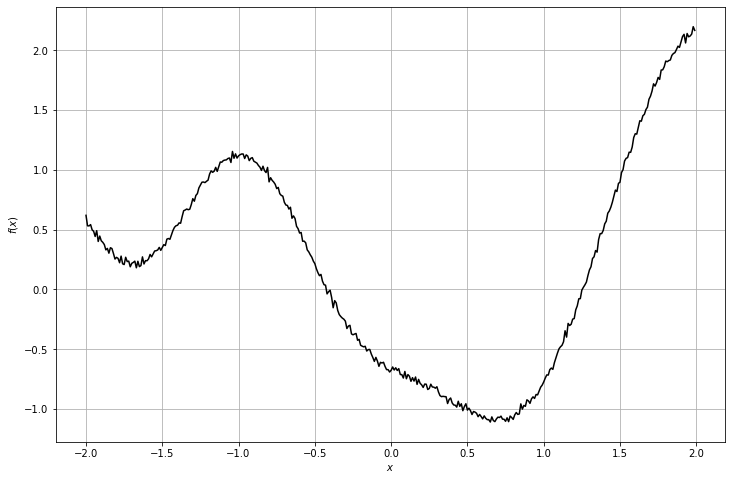

context_x =  (1, 8, 1)
context_y =  (1, 8, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


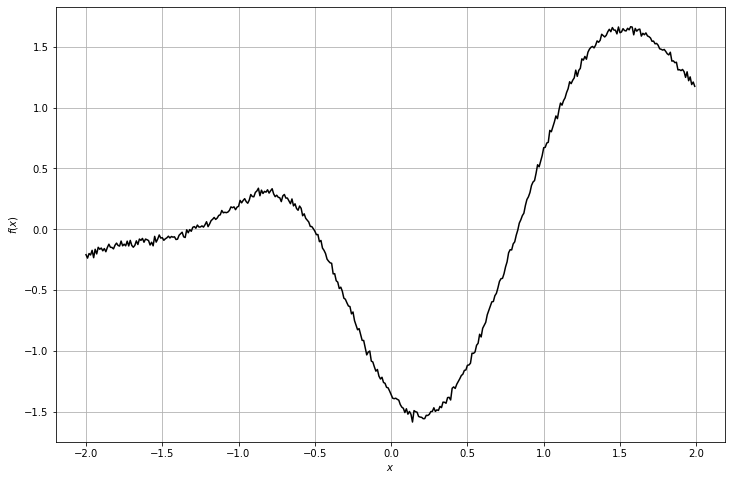

context_x =  (1, 31, 1)
context_y =  (1, 31, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


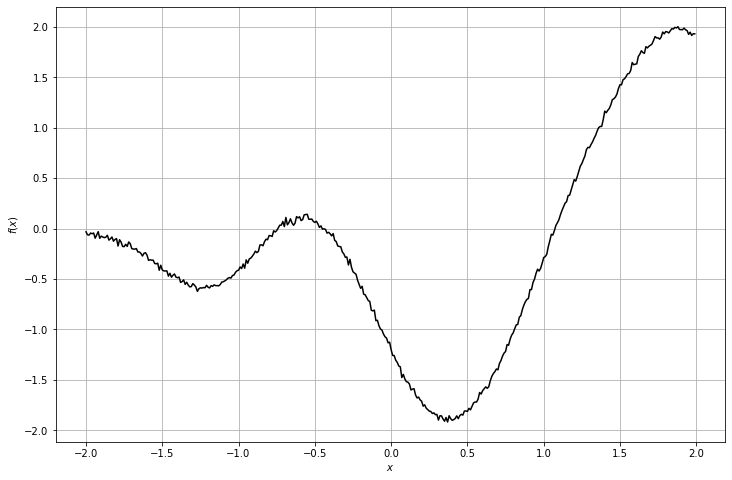

context_x =  (1, 38, 1)
context_y =  (1, 38, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


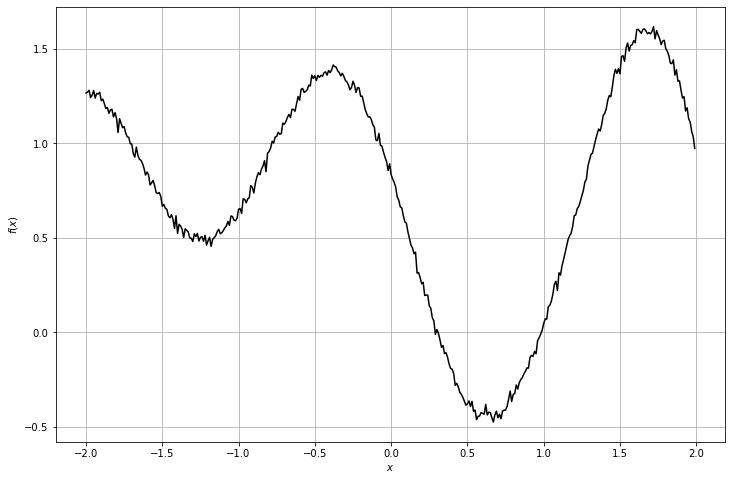

context_x =  (1, 52, 1)
context_y =  (1, 52, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


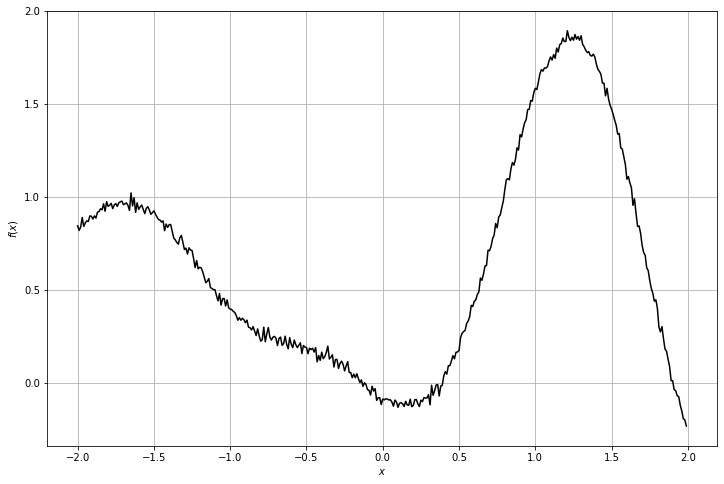

context_x =  (1, 69, 1)
context_y =  (1, 69, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


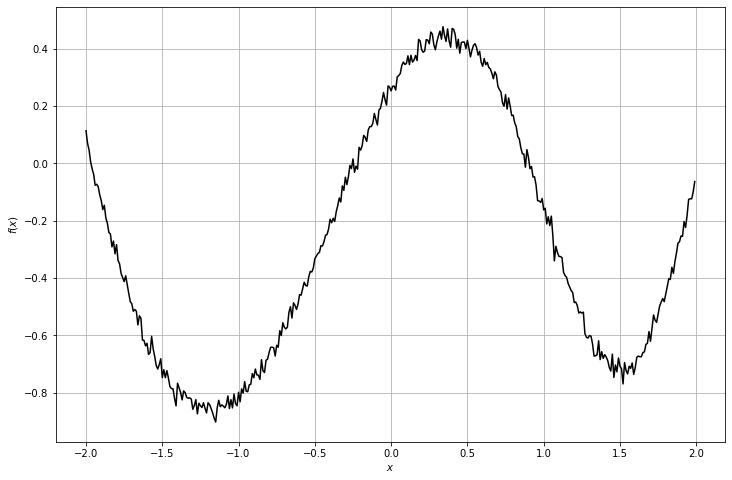

context_x =  (1, 12, 1)
context_y =  (1, 12, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


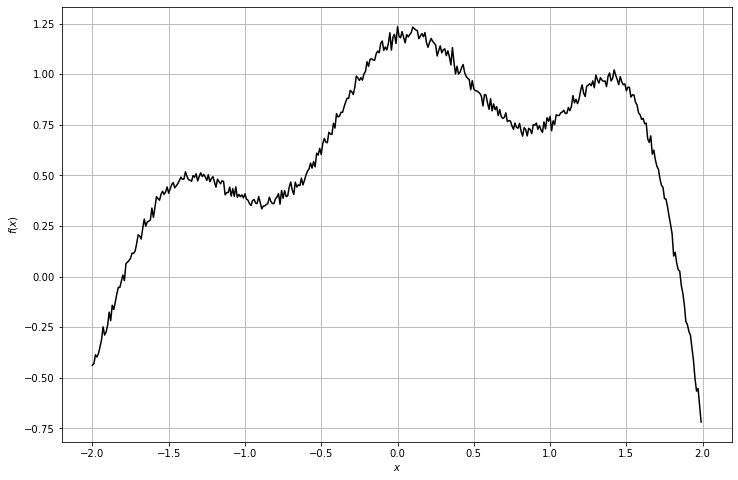

context_x =  (1, 92, 1)
context_y =  (1, 92, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


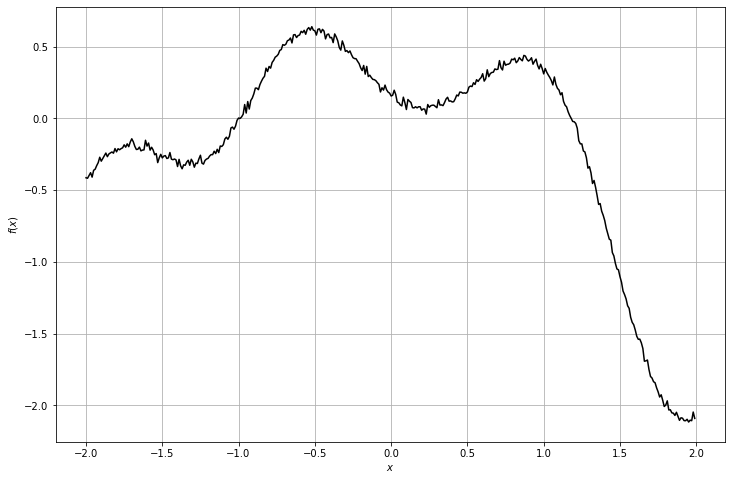

context_x =  (1, 22, 1)
context_y =  (1, 22, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


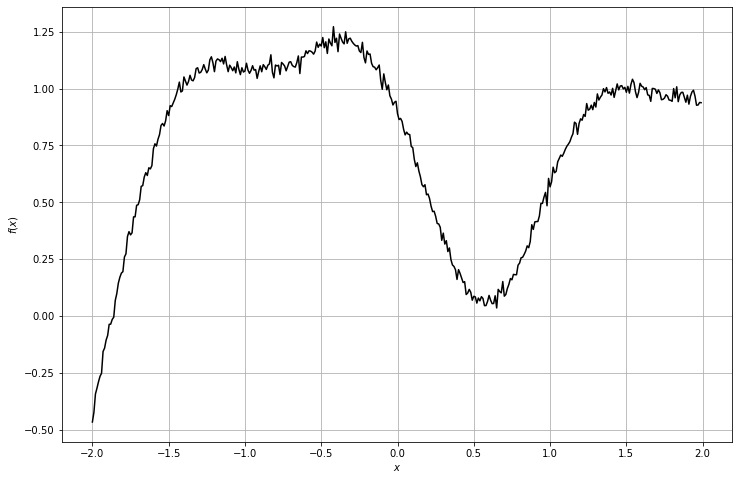

context_x =  (1, 21, 1)
context_y =  (1, 21, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


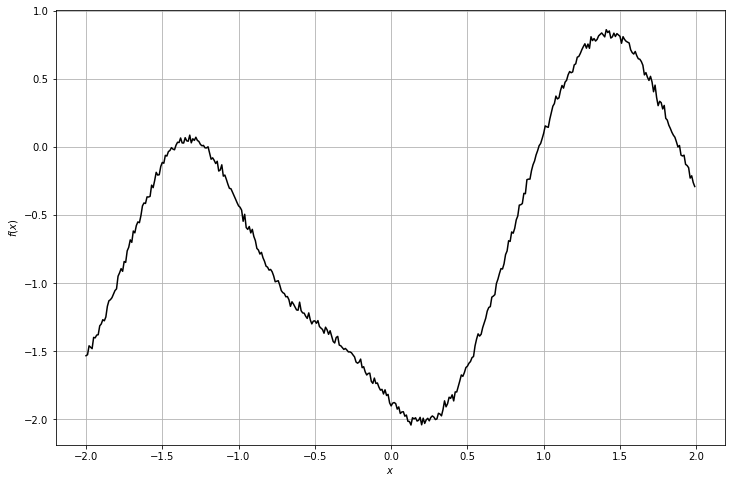

context_x =  (1, 58, 1)
context_y =  (1, 58, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


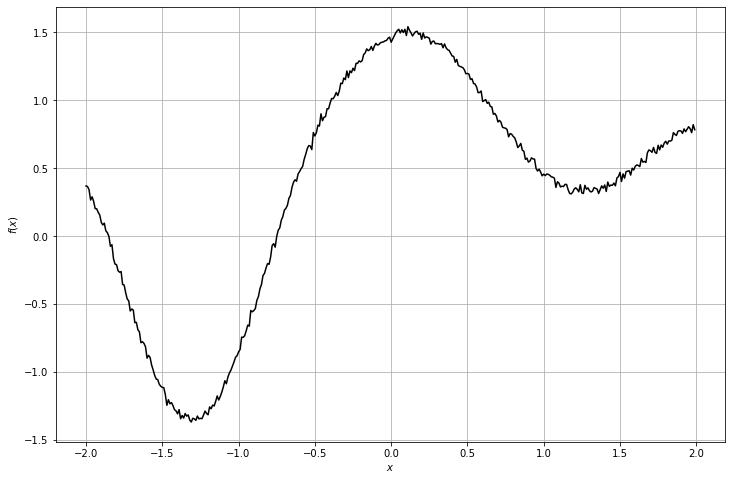

context_x =  (1, 44, 1)
context_y =  (1, 44, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


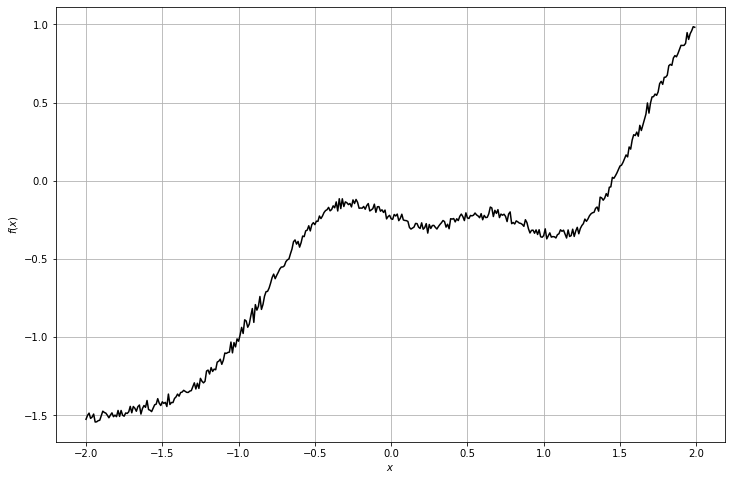

context_x =  (1, 16, 1)
context_y =  (1, 16, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


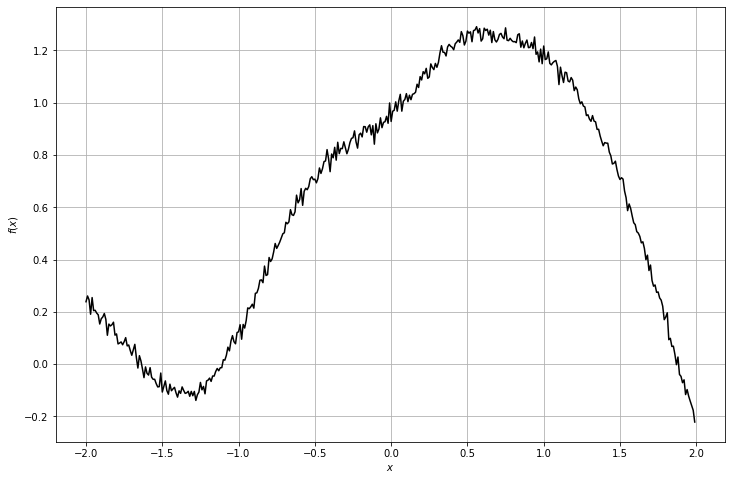

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


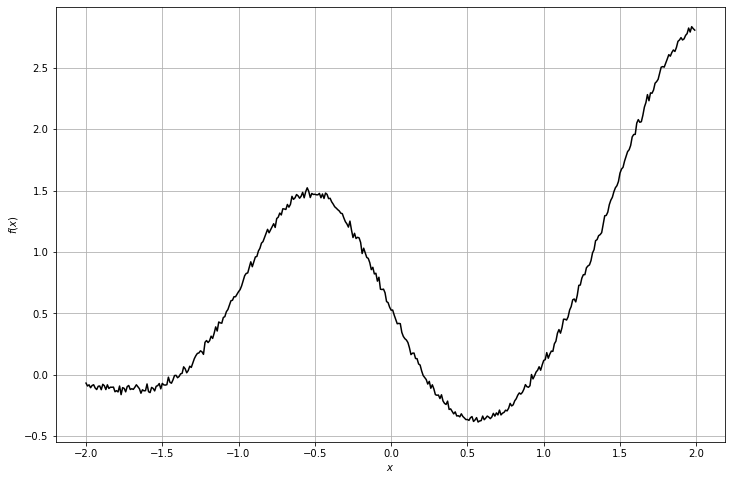

context_x =  (1, 69, 1)
context_y =  (1, 69, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


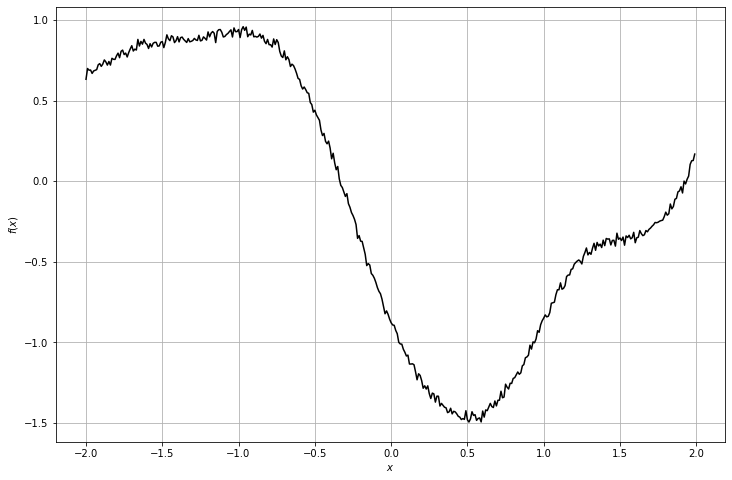

context_x =  (1, 65, 1)
context_y =  (1, 65, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


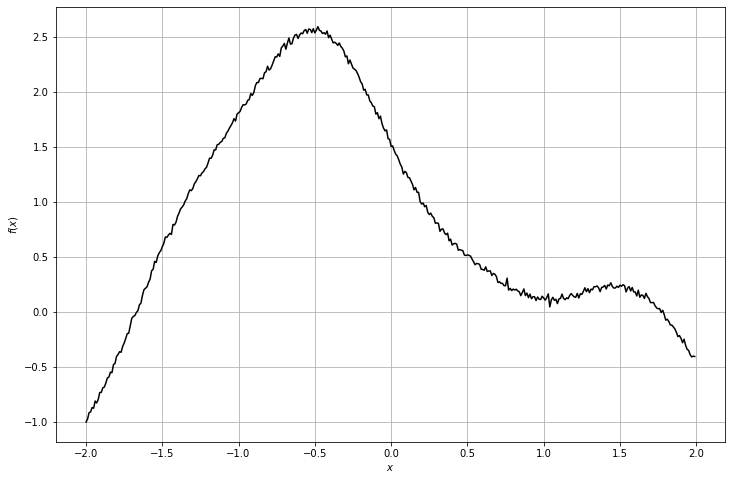

context_x =  (1, 96, 1)
context_y =  (1, 96, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


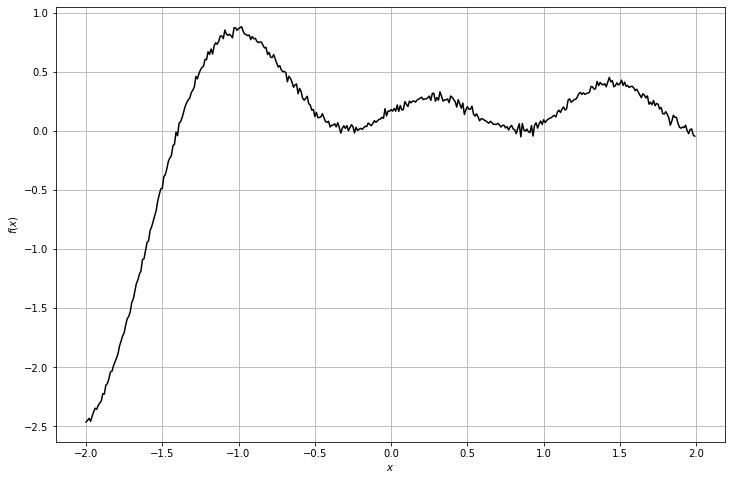

context_x =  (1, 76, 1)
context_y =  (1, 76, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


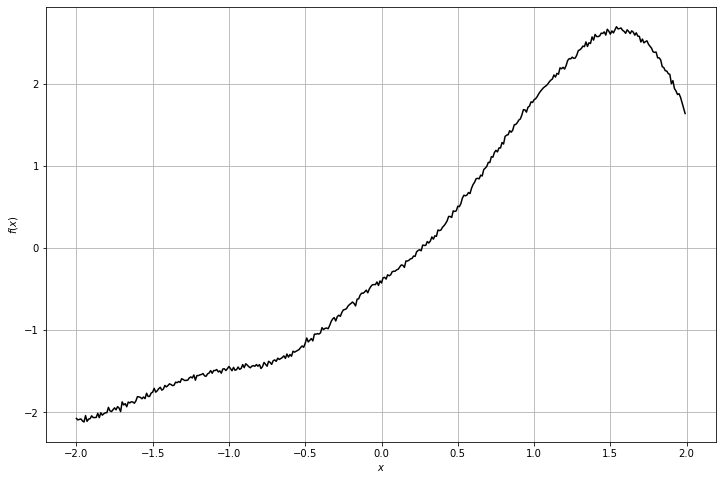

context_x =  (1, 60, 1)
context_y =  (1, 60, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


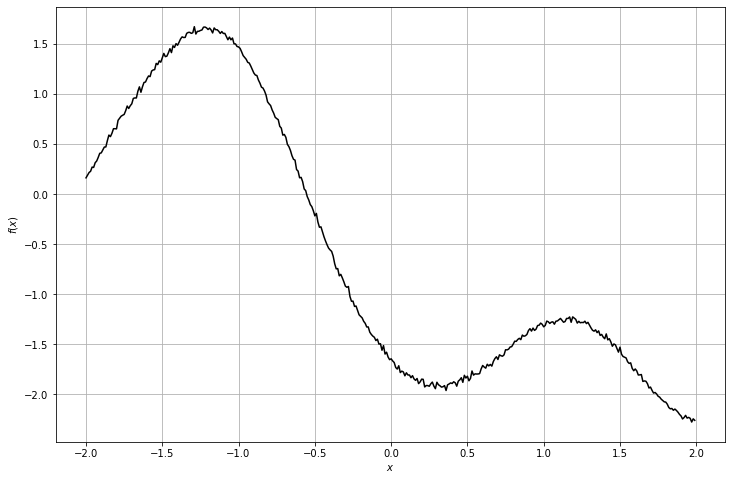

context_x =  (1, 6, 1)
context_y =  (1, 6, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


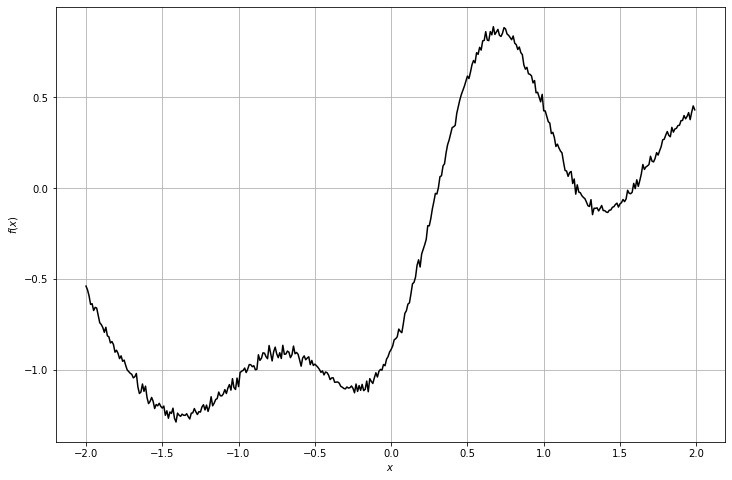

context_x =  (1, 52, 1)
context_y =  (1, 52, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


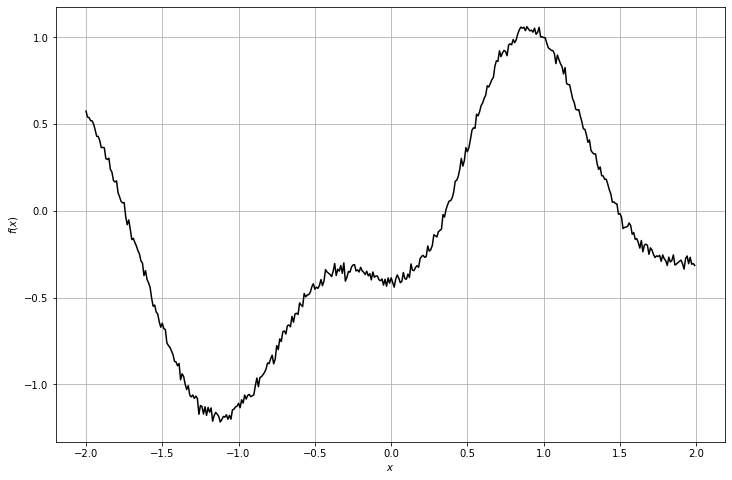

context_x =  (1, 71, 1)
context_y =  (1, 71, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


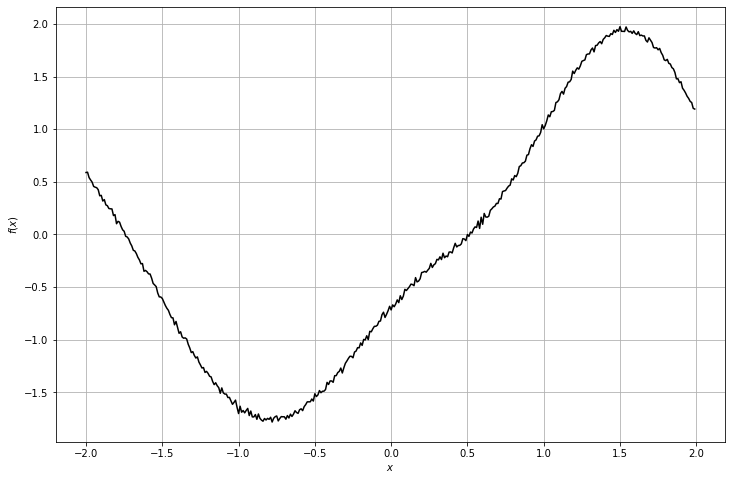

context_x =  (1, 82, 1)
context_y =  (1, 82, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


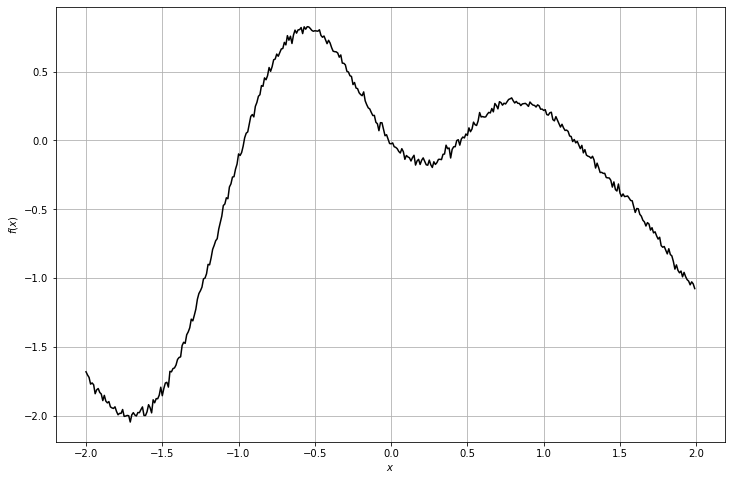

context_x =  (1, 37, 1)
context_y =  (1, 37, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


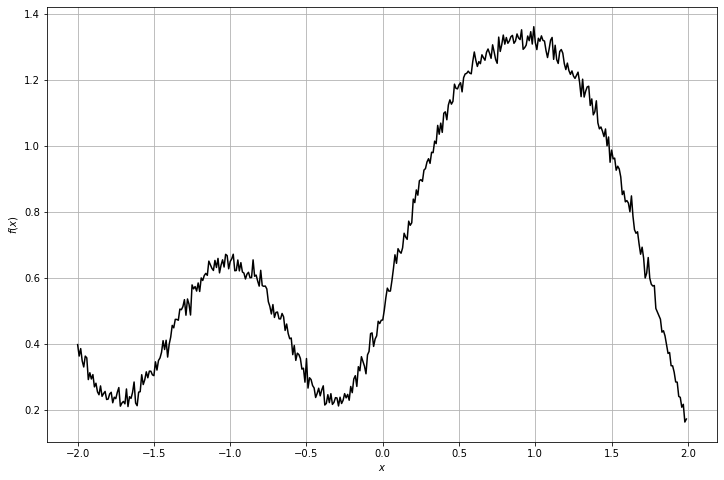

context_x =  (1, 67, 1)
context_y =  (1, 67, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


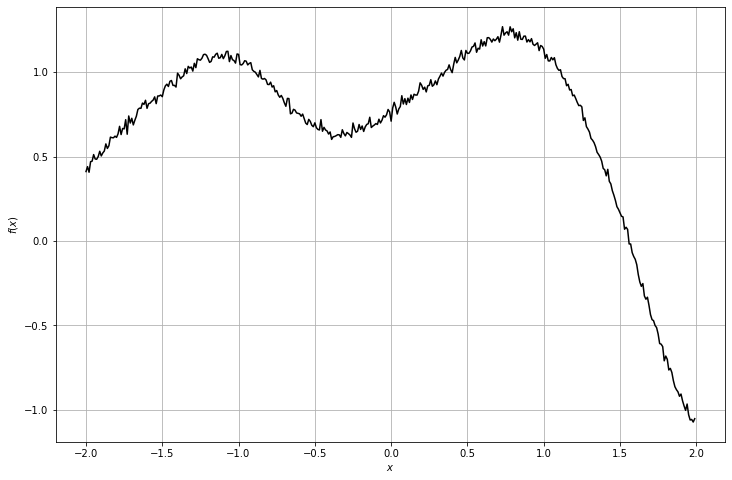

context_x =  (1, 92, 1)
context_y =  (1, 92, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


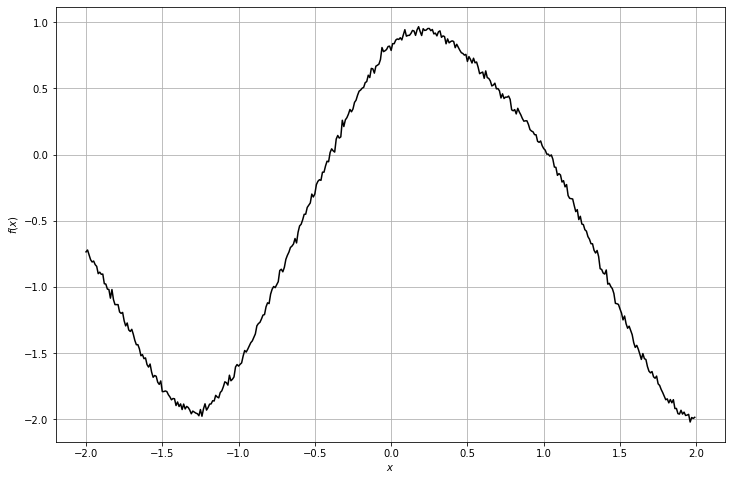

context_x =  (1, 42, 1)
context_y =  (1, 42, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


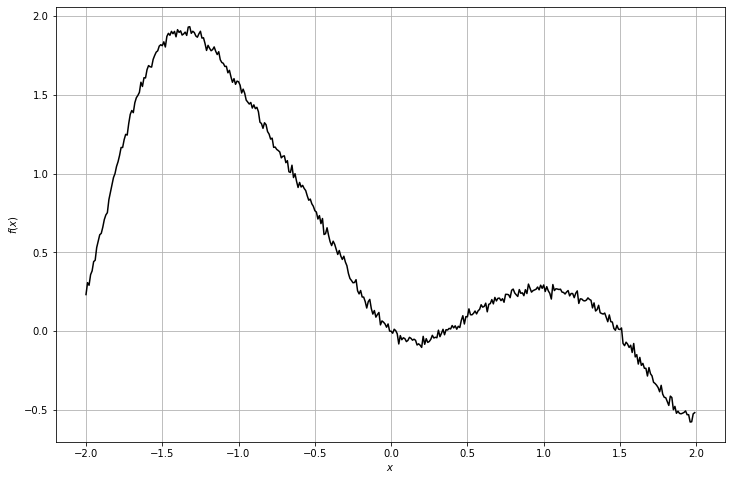

context_x =  (1, 9, 1)
context_y =  (1, 9, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


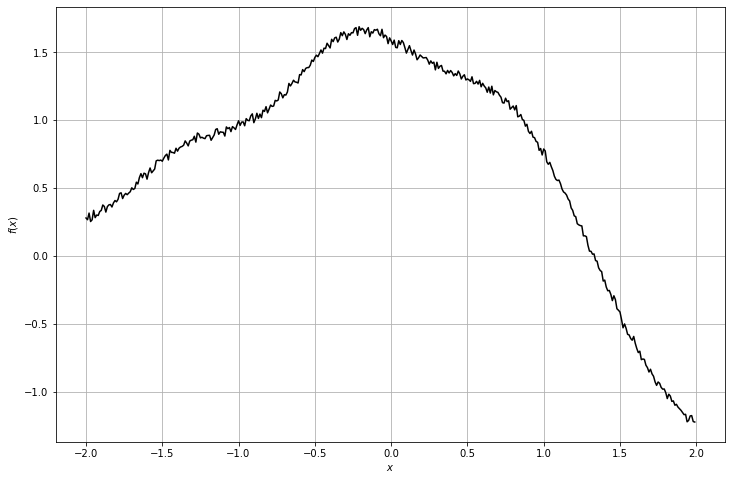

context_x =  (1, 19, 1)
context_y =  (1, 19, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


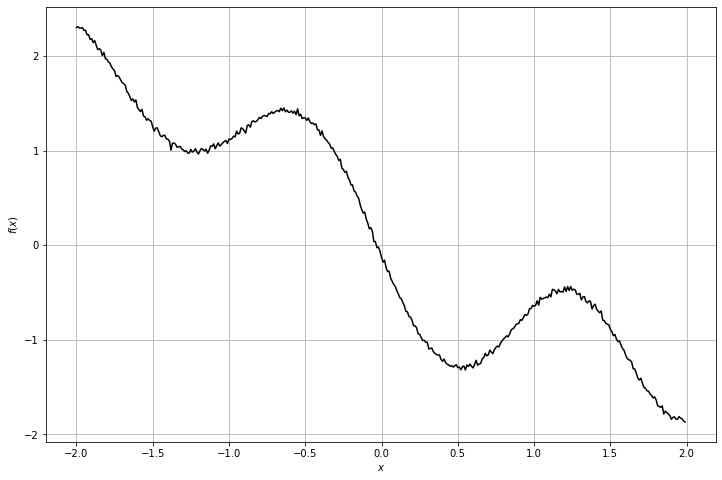

context_x =  (1, 51, 1)
context_y =  (1, 51, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


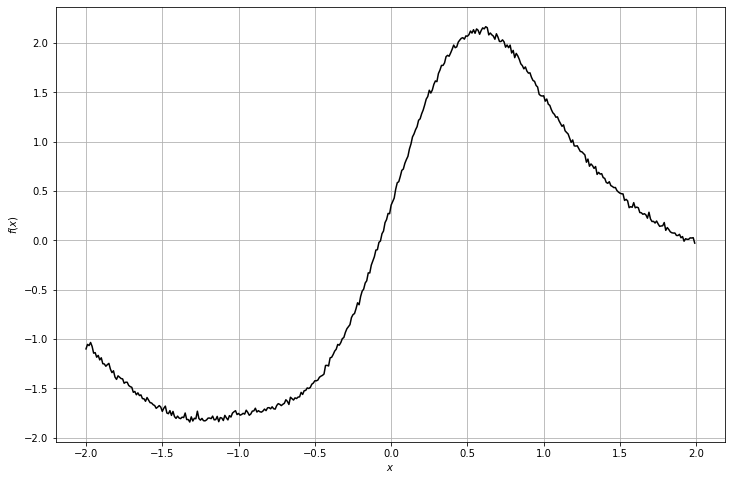

context_x =  (1, 61, 1)
context_y =  (1, 61, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


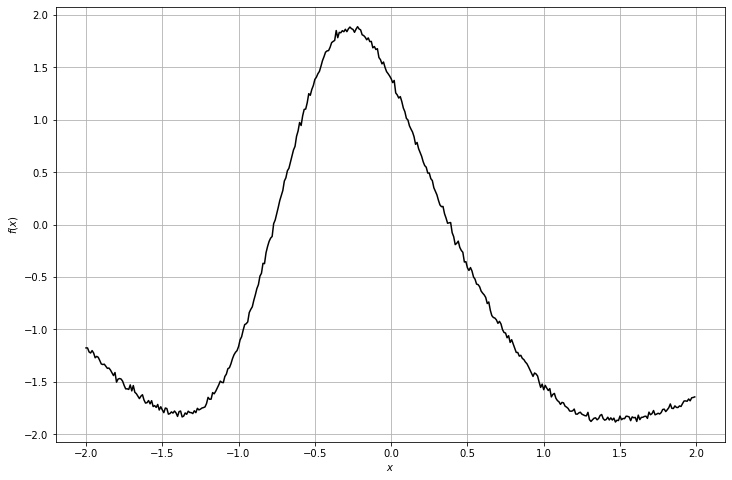

context_x =  (1, 27, 1)
context_y =  (1, 27, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


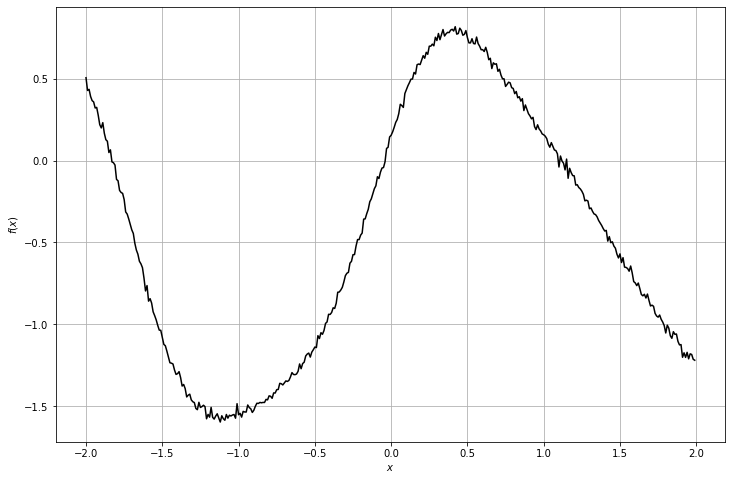

context_x =  (1, 97, 1)
context_y =  (1, 97, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


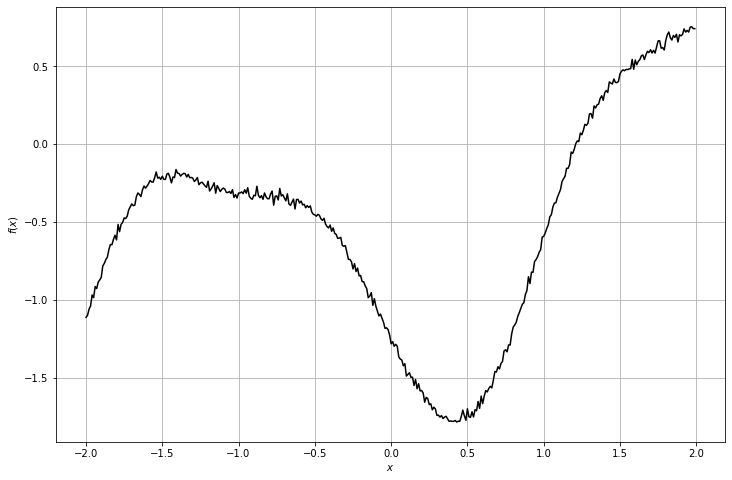

context_x =  (1, 73, 1)
context_y =  (1, 73, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


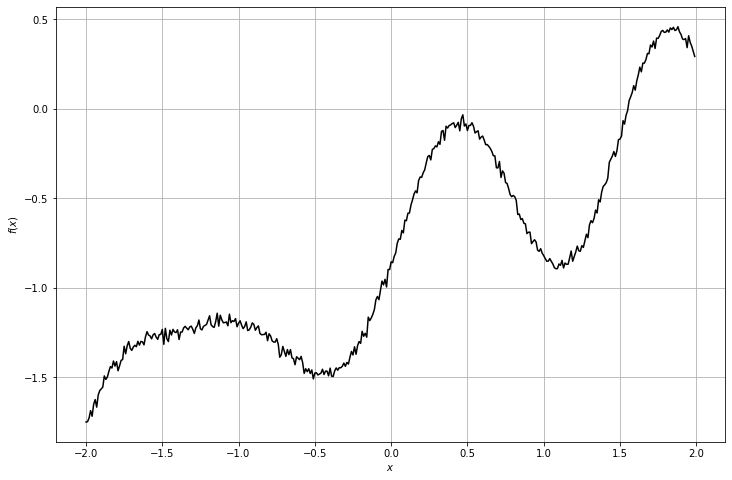

context_x =  (1, 4, 1)
context_y =  (1, 4, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


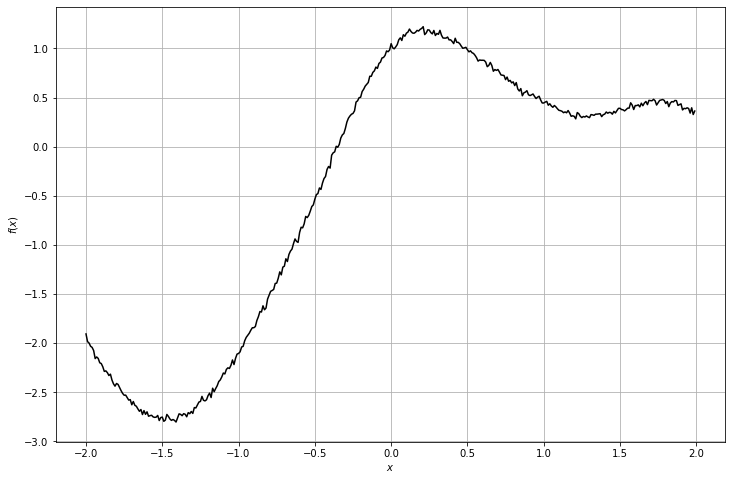

context_x =  (1, 73, 1)
context_y =  (1, 73, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


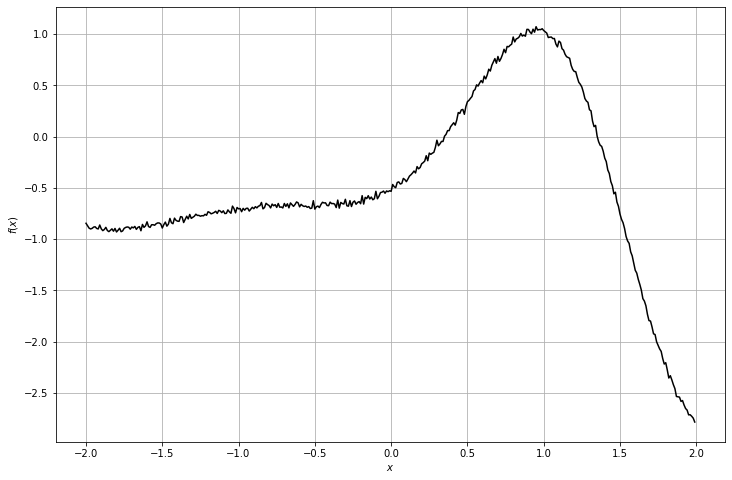

context_x =  (1, 47, 1)
context_y =  (1, 47, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


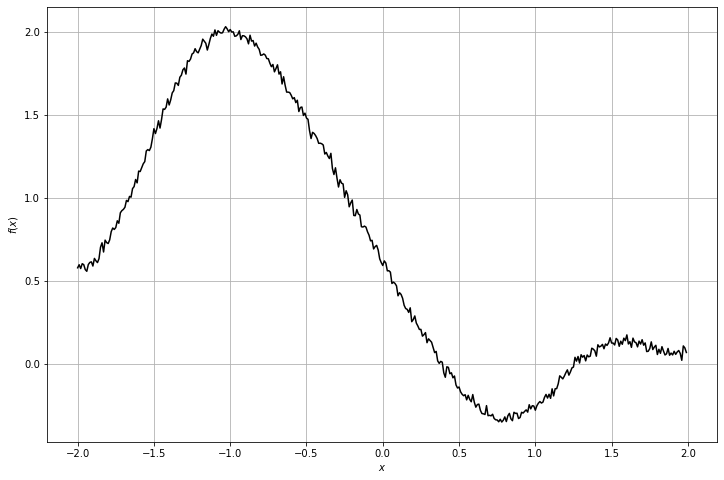

context_x =  (1, 24, 1)
context_y =  (1, 24, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


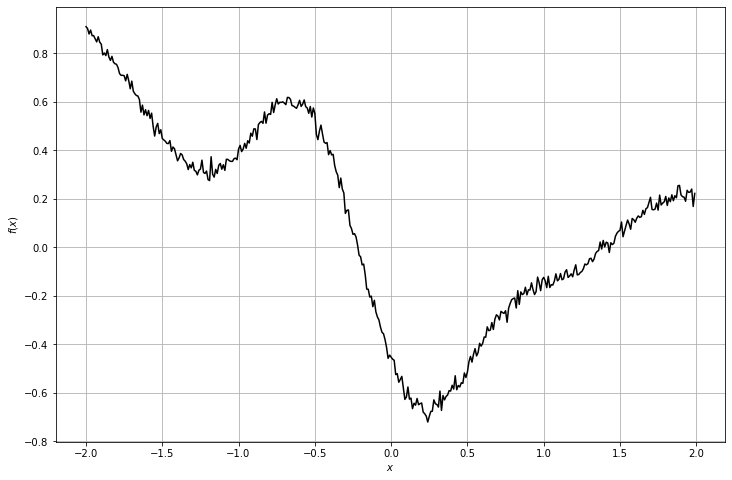

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


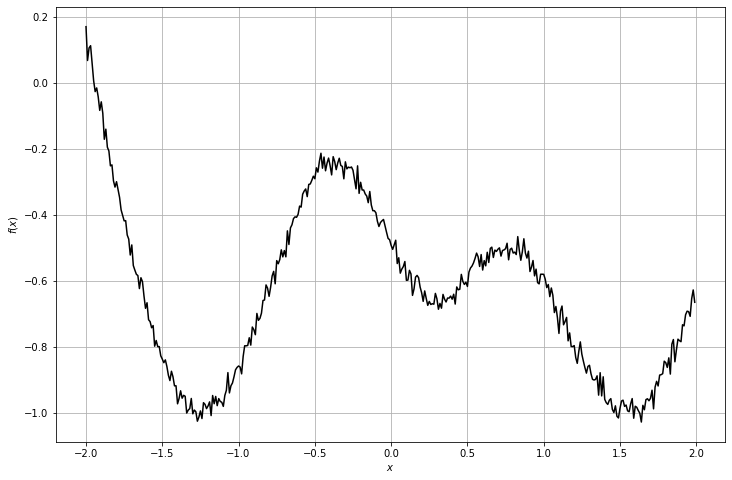

context_x =  (1, 73, 1)
context_y =  (1, 73, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


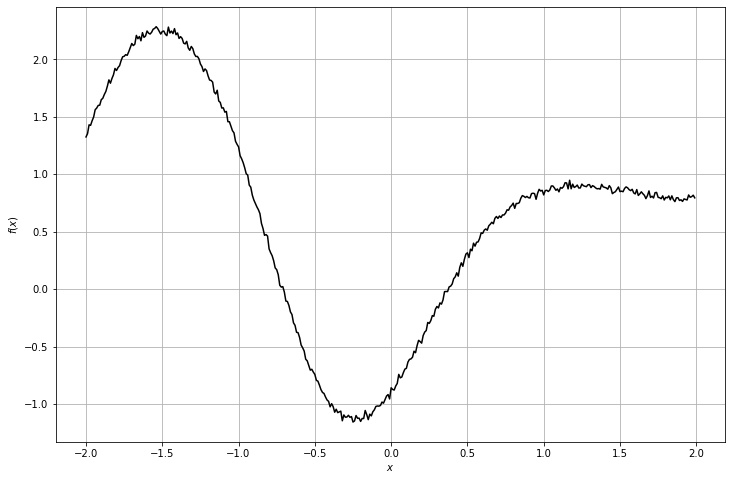

context_x =  (1, 72, 1)
context_y =  (1, 72, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


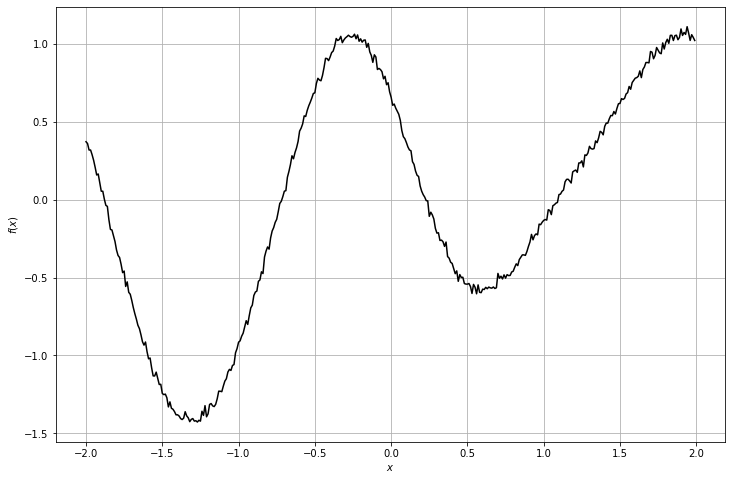

context_x =  (1, 62, 1)
context_y =  (1, 62, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


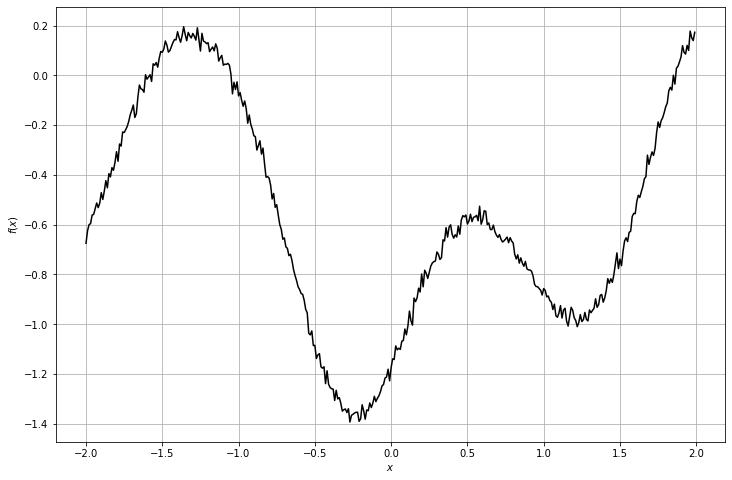

context_x =  (1, 27, 1)
context_y =  (1, 27, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


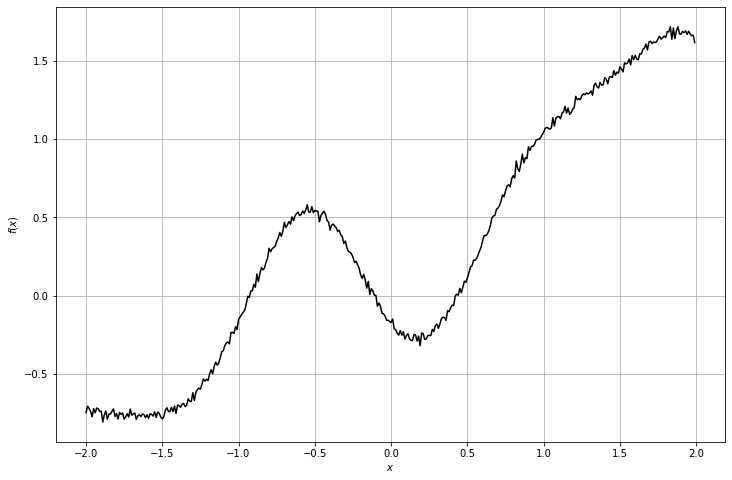

context_x =  (1, 35, 1)
context_y =  (1, 35, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


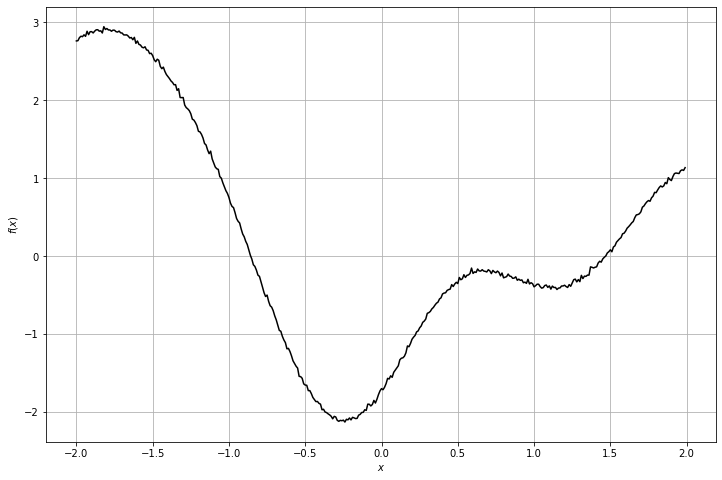

context_x =  (1, 58, 1)
context_y =  (1, 58, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


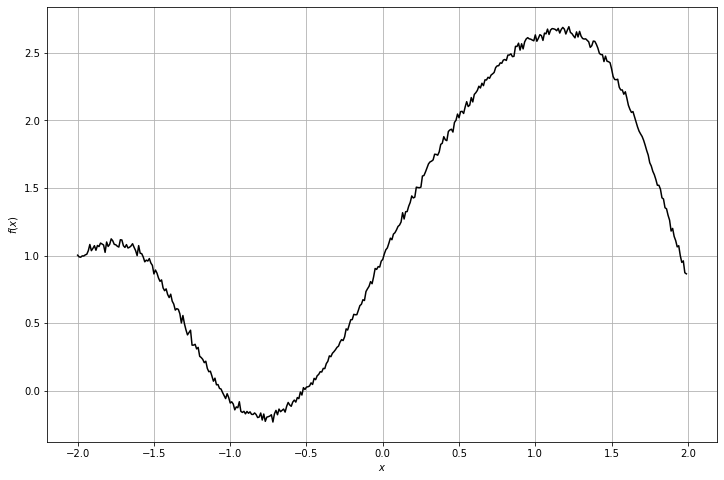

context_x =  (1, 3, 1)
context_y =  (1, 3, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


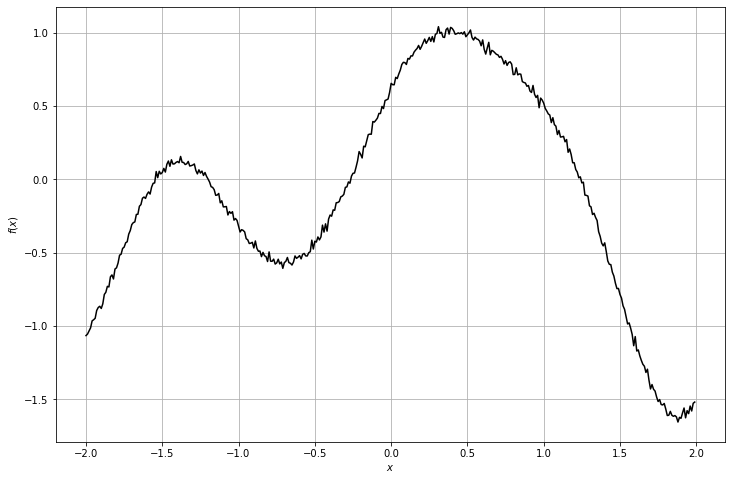

context_x =  (1, 30, 1)
context_y =  (1, 30, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


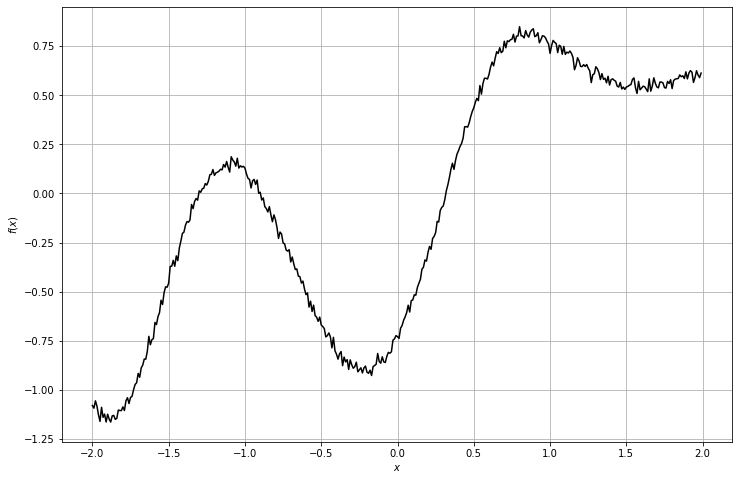

context_x =  (1, 25, 1)
context_y =  (1, 25, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


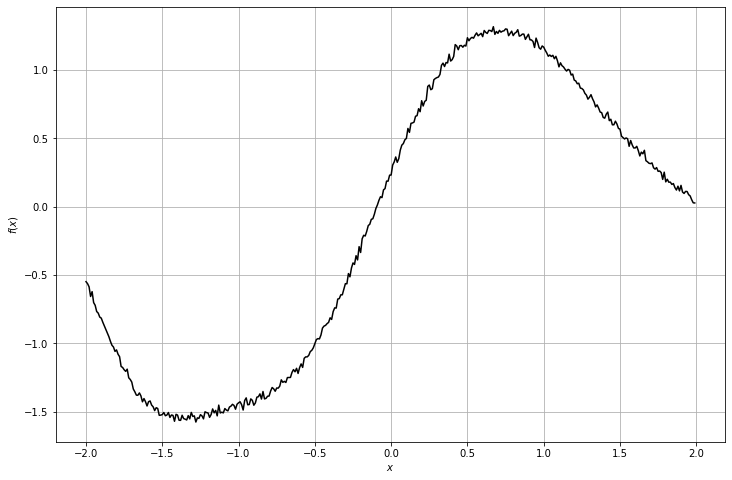

context_x =  (1, 81, 1)
context_y =  (1, 81, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


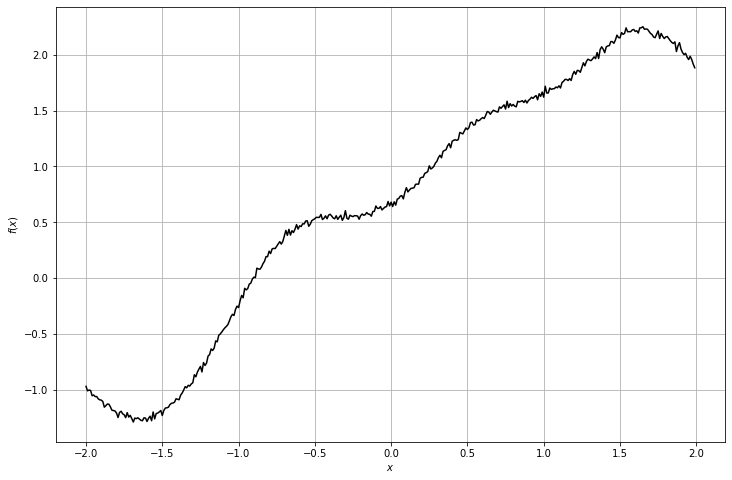

context_x =  (1, 51, 1)
context_y =  (1, 51, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


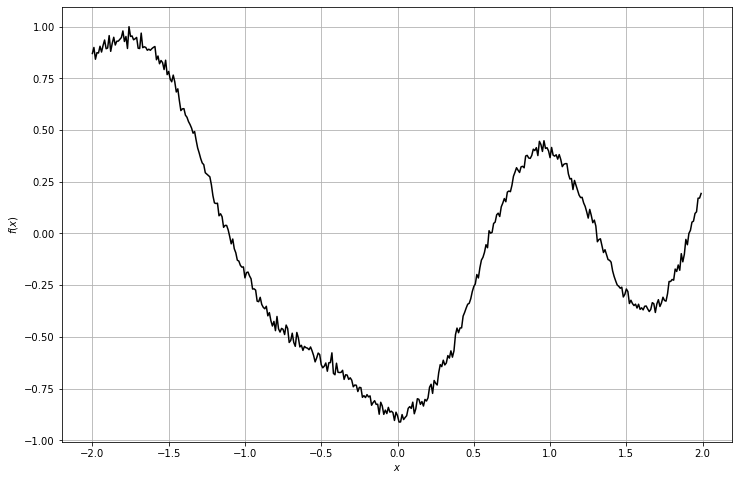

context_x =  (1, 36, 1)
context_y =  (1, 36, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


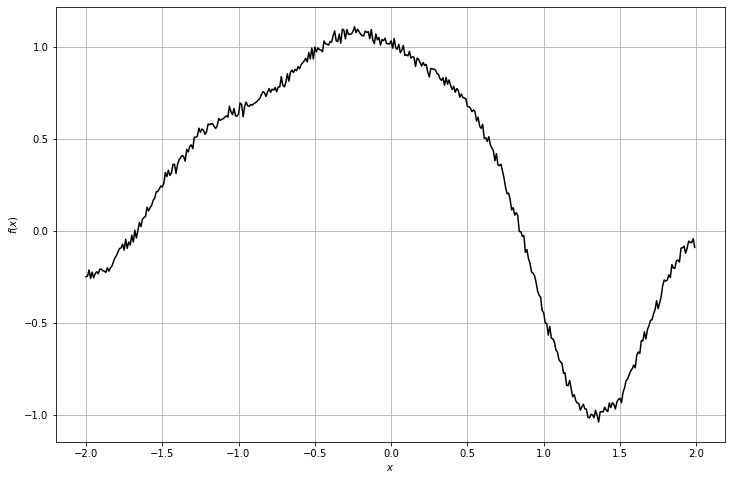

context_x =  (1, 94, 1)
context_y =  (1, 94, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


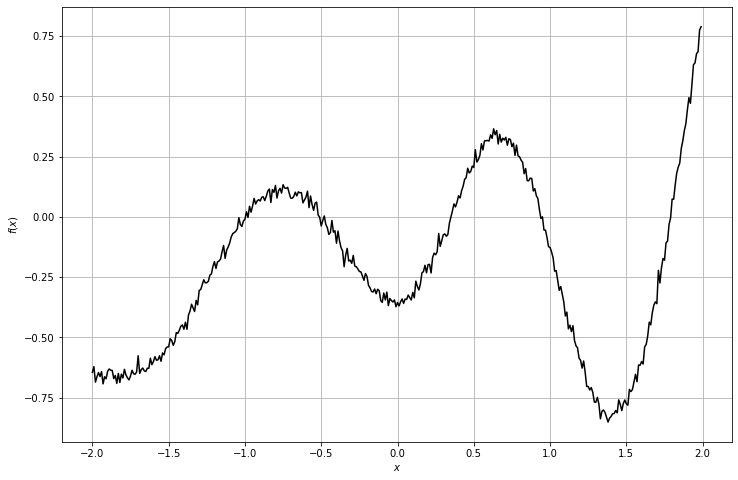

context_x =  (1, 26, 1)
context_y =  (1, 26, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


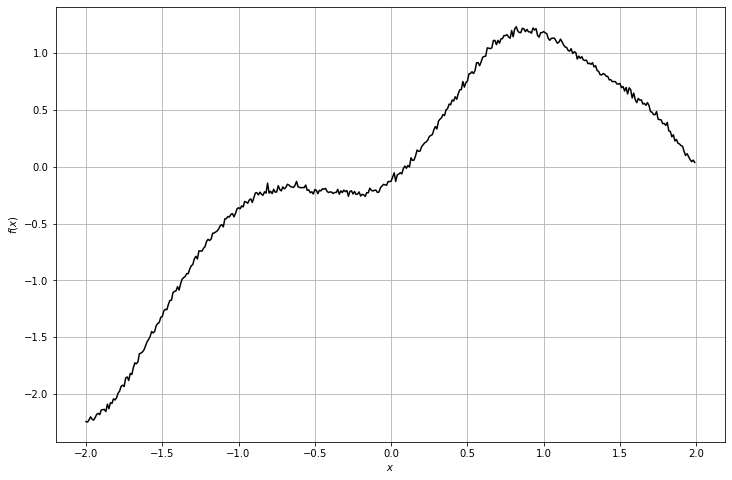

context_x =  (1, 91, 1)
context_y =  (1, 91, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


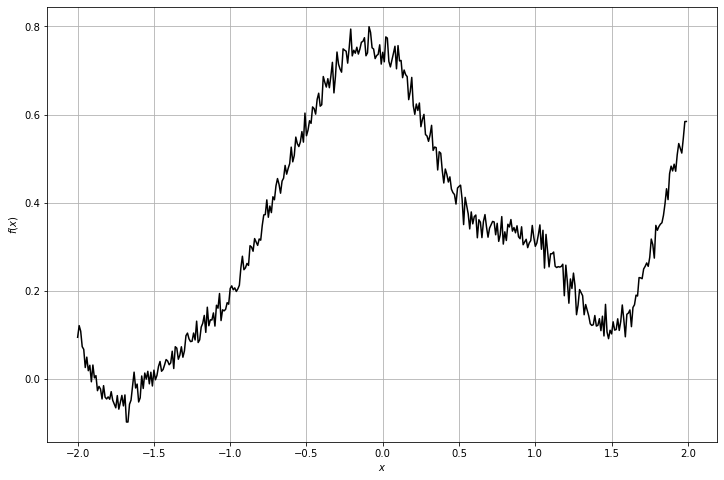

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


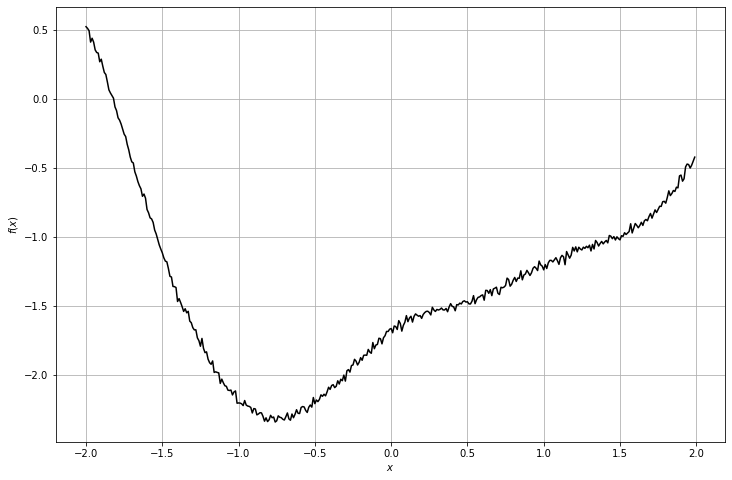

context_x =  (1, 62, 1)
context_y =  (1, 62, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


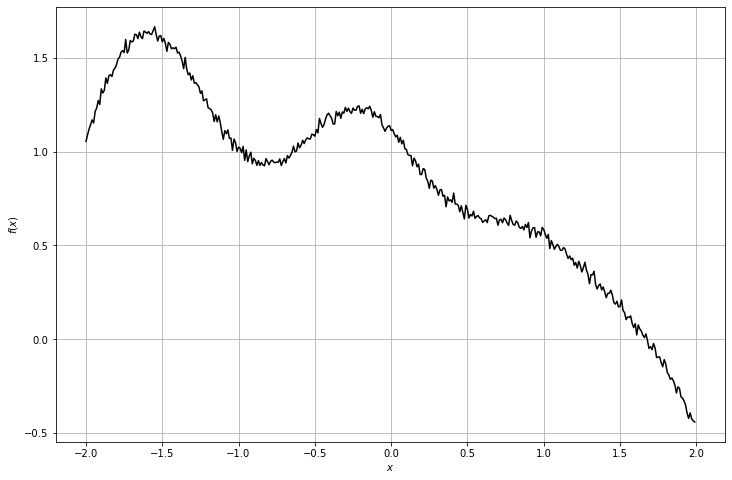

context_x =  (1, 48, 1)
context_y =  (1, 48, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


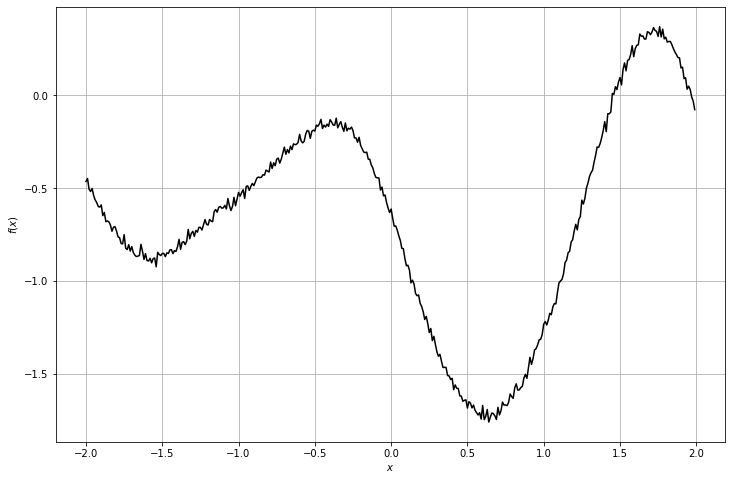

context_x =  (1, 70, 1)
context_y =  (1, 70, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


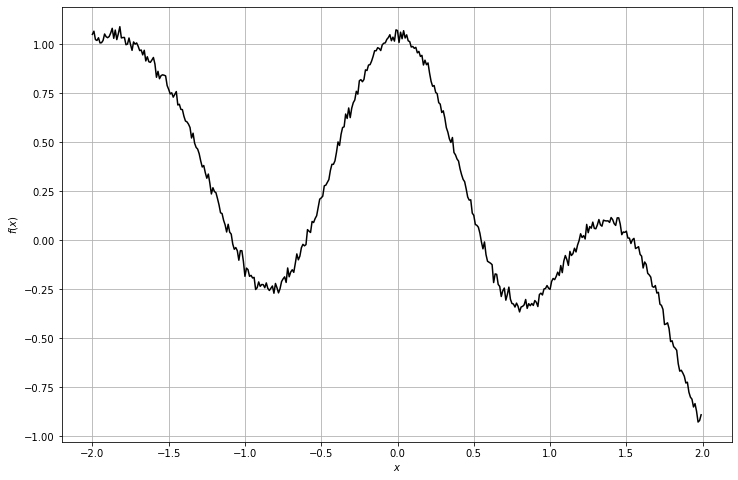

context_x =  (1, 92, 1)
context_y =  (1, 92, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


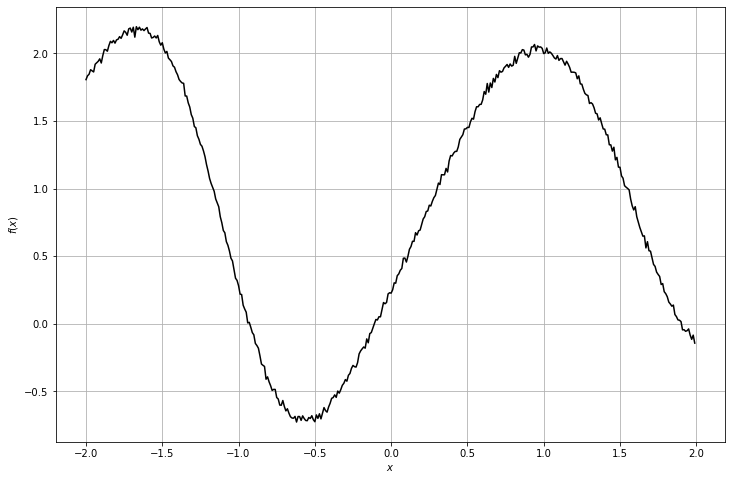

context_x =  (1, 88, 1)
context_y =  (1, 88, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


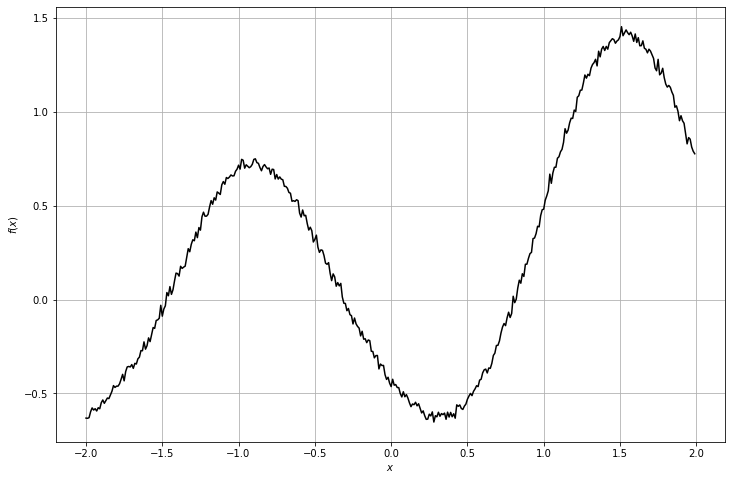

context_x =  (1, 55, 1)
context_y =  (1, 55, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


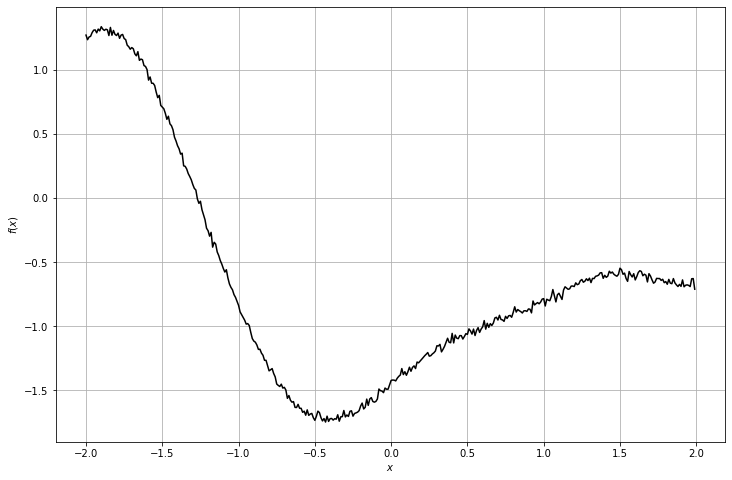

context_x =  (1, 45, 1)
context_y =  (1, 45, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


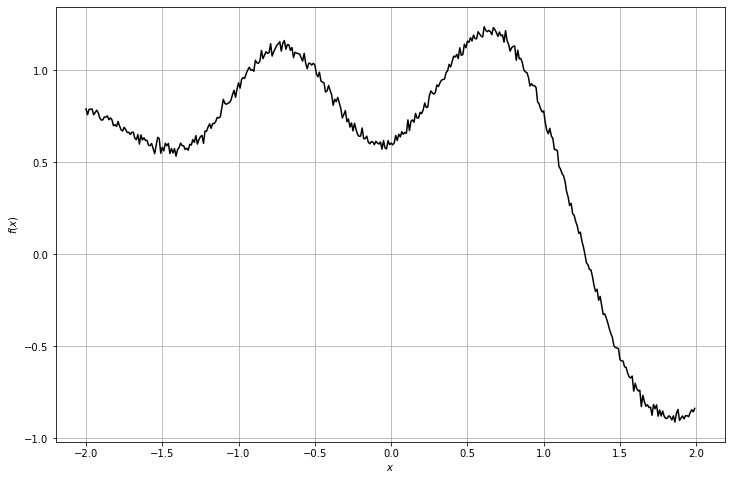

context_x =  (1, 27, 1)
context_y =  (1, 27, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


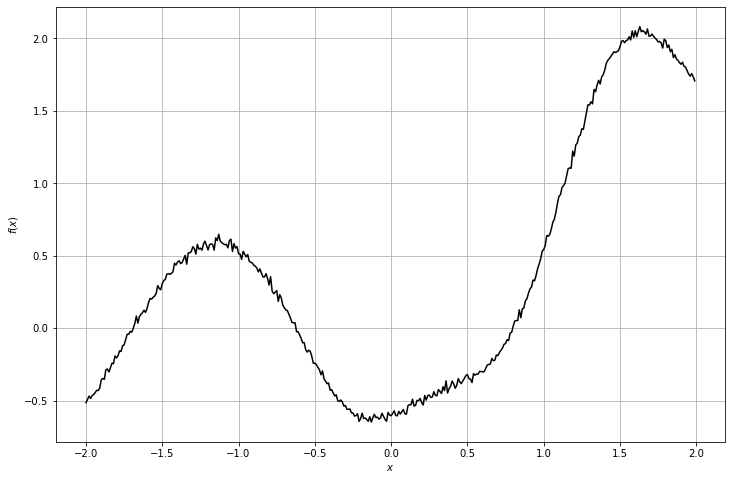

context_x =  (1, 47, 1)
context_y =  (1, 47, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


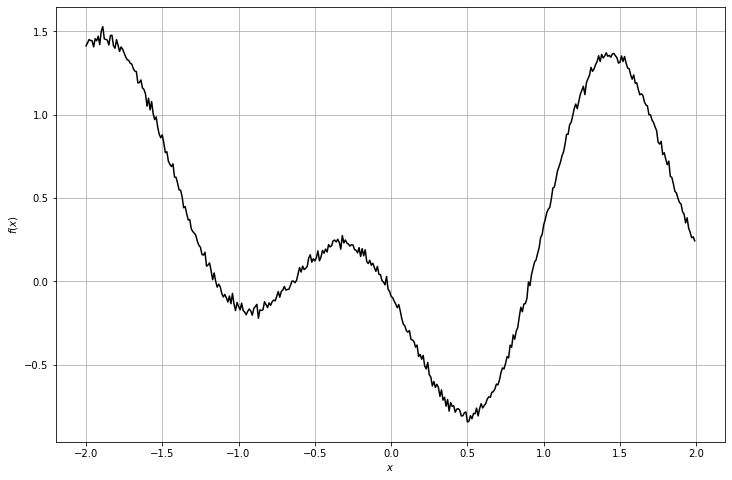

context_x =  (1, 86, 1)
context_y =  (1, 86, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


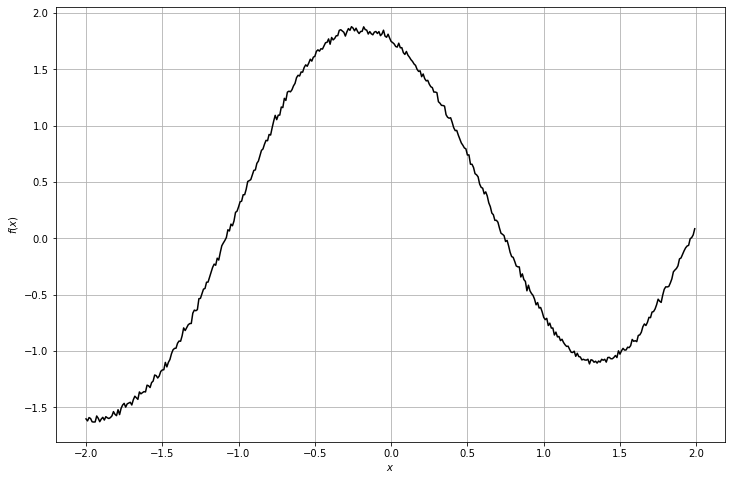

context_x =  (1, 68, 1)
context_y =  (1, 68, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


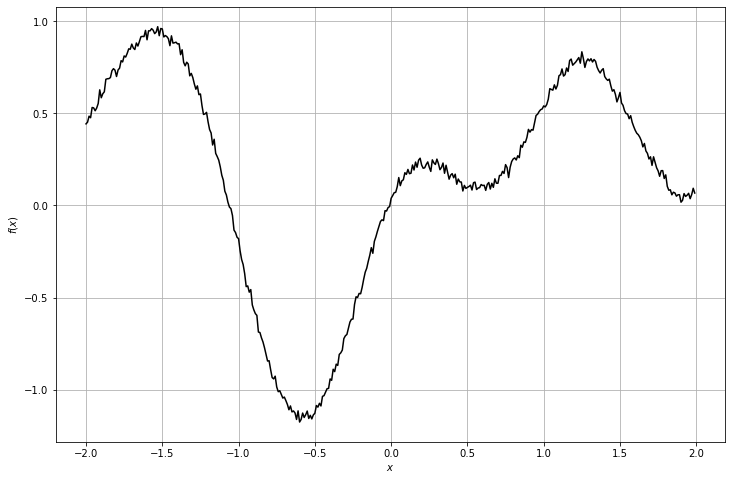

context_x =  (1, 11, 1)
context_y =  (1, 11, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


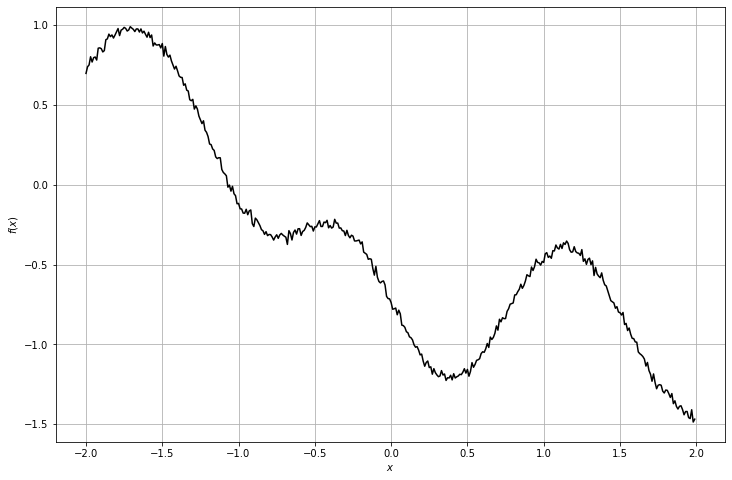

context_x =  (1, 9, 1)
context_y =  (1, 9, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


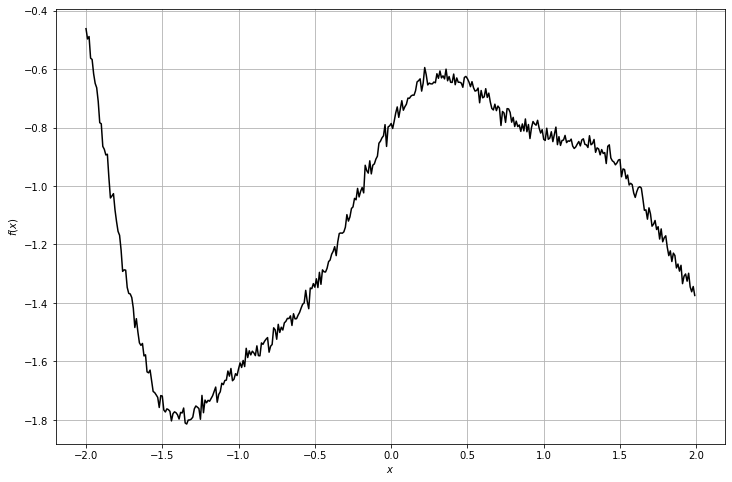

context_x =  (1, 3, 1)
context_y =  (1, 3, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


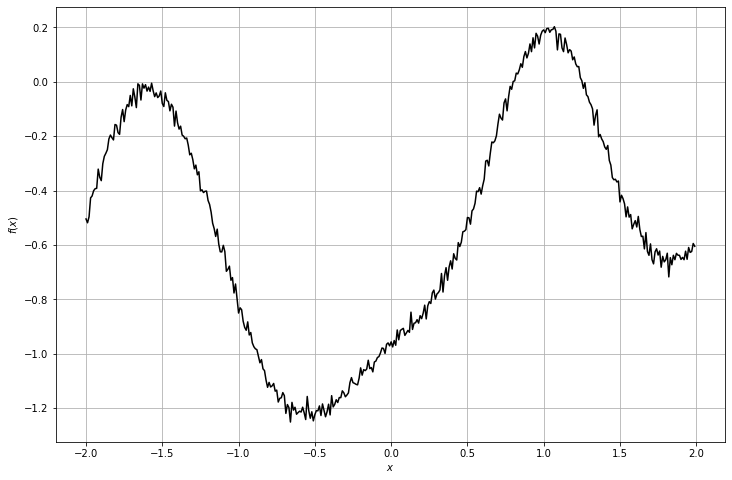

context_x =  (1, 23, 1)
context_y =  (1, 23, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


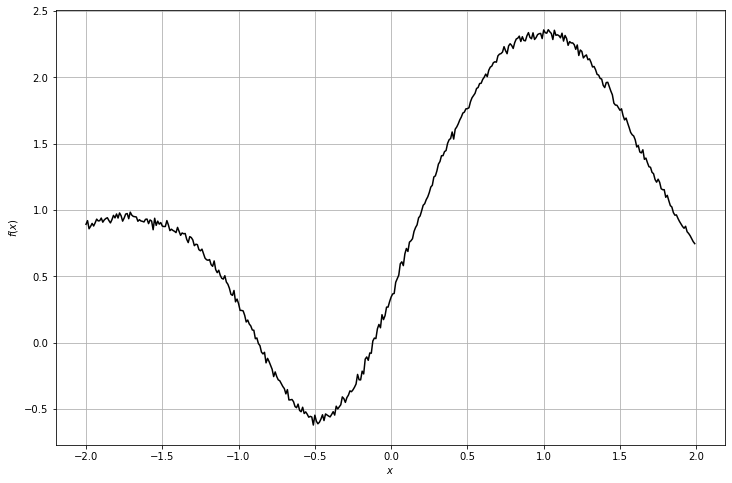

context_x =  (1, 62, 1)
context_y =  (1, 62, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


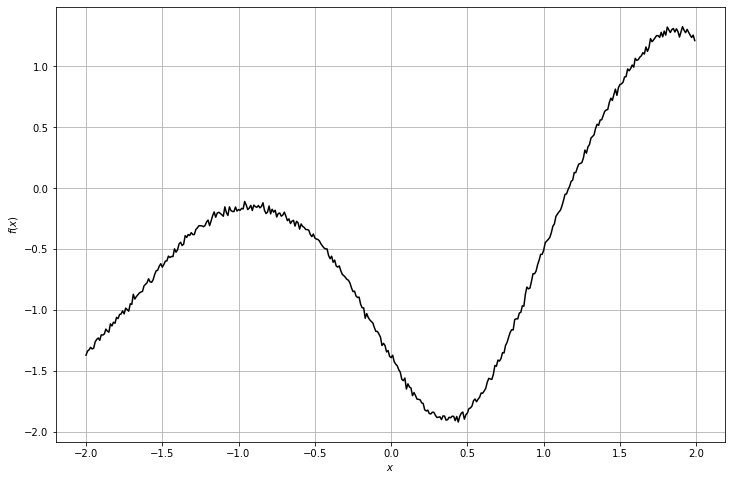

context_x =  (1, 25, 1)
context_y =  (1, 25, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


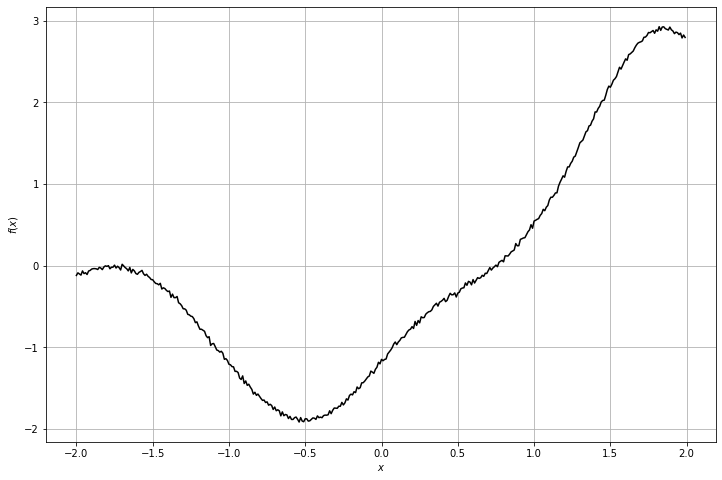

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


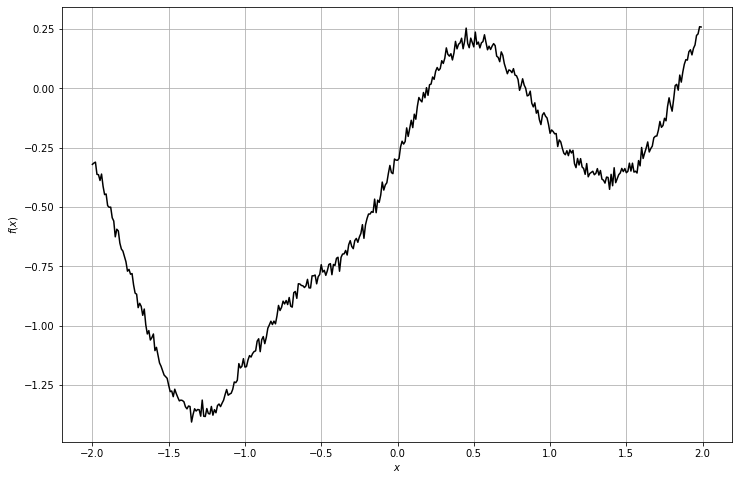

context_x =  (1, 52, 1)
context_y =  (1, 52, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


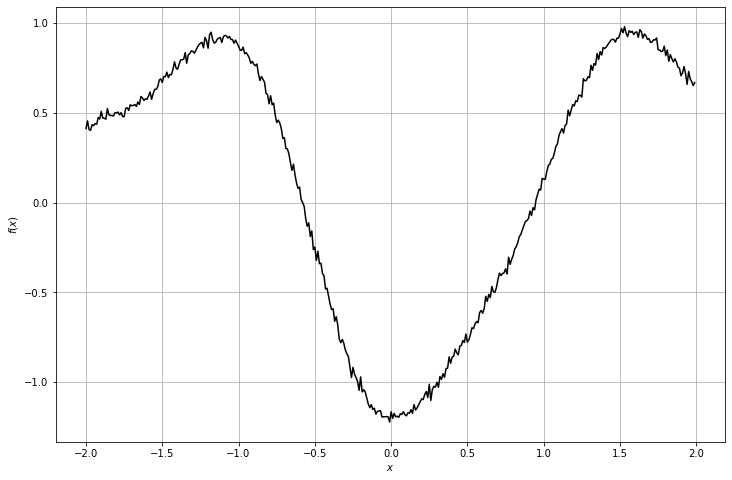

context_x =  (1, 98, 1)
context_y =  (1, 98, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


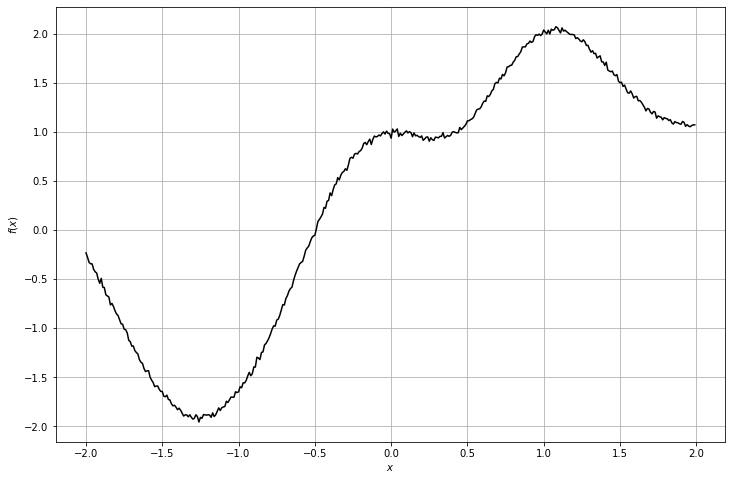

context_x =  (1, 34, 1)
context_y =  (1, 34, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


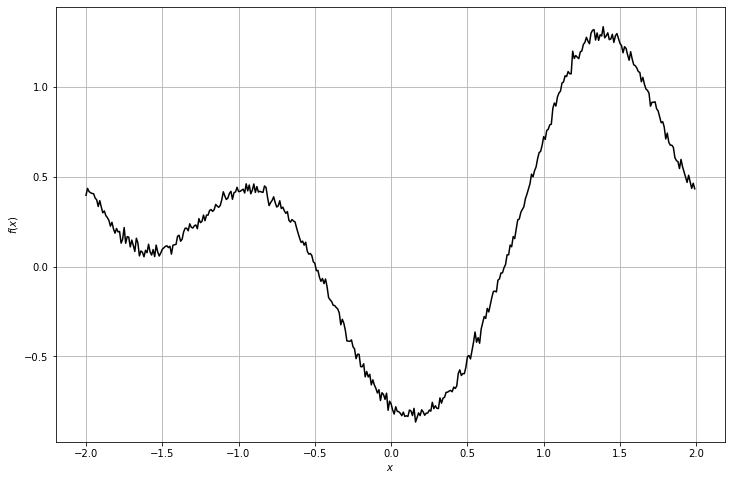

context_x =  (1, 93, 1)
context_y =  (1, 93, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


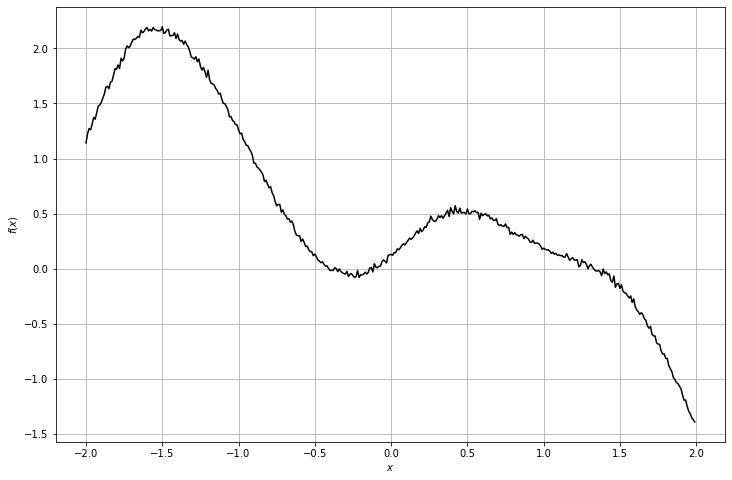

context_x =  (1, 59, 1)
context_y =  (1, 59, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


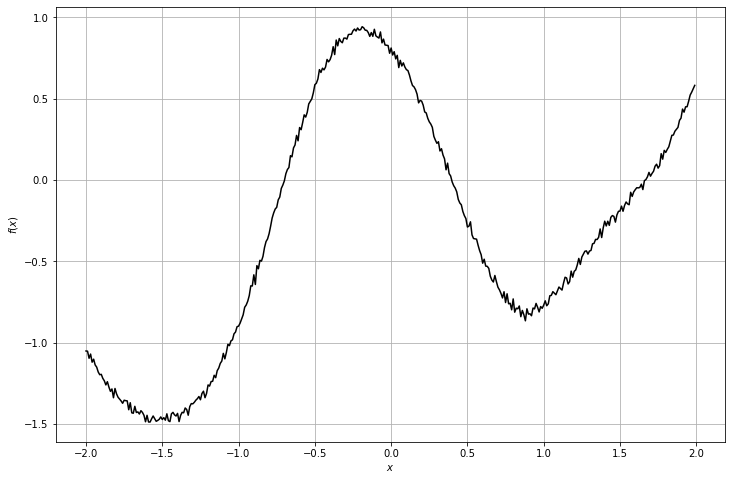

context_x =  (1, 82, 1)
context_y =  (1, 82, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


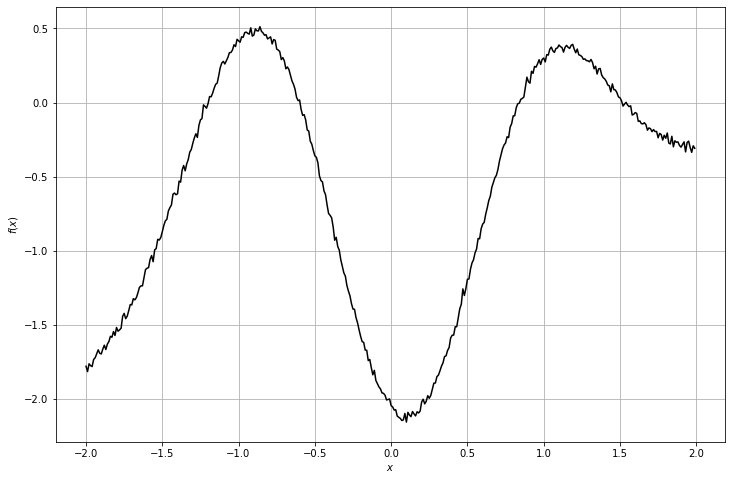

context_x =  (1, 24, 1)
context_y =  (1, 24, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


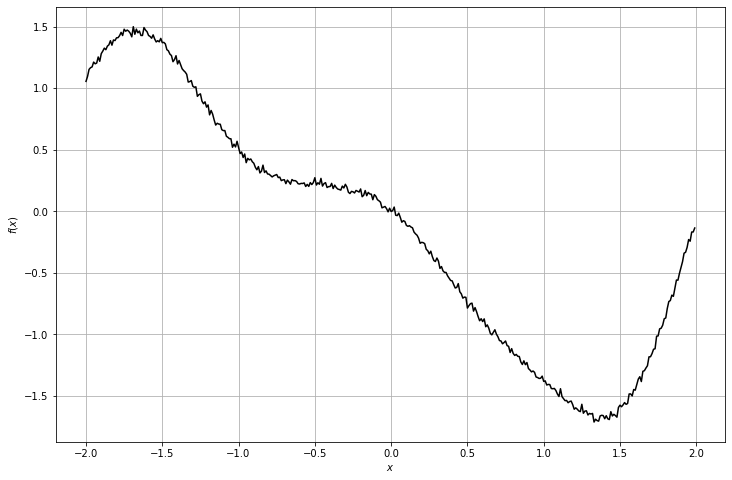

context_x =  (1, 21, 1)
context_y =  (1, 21, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


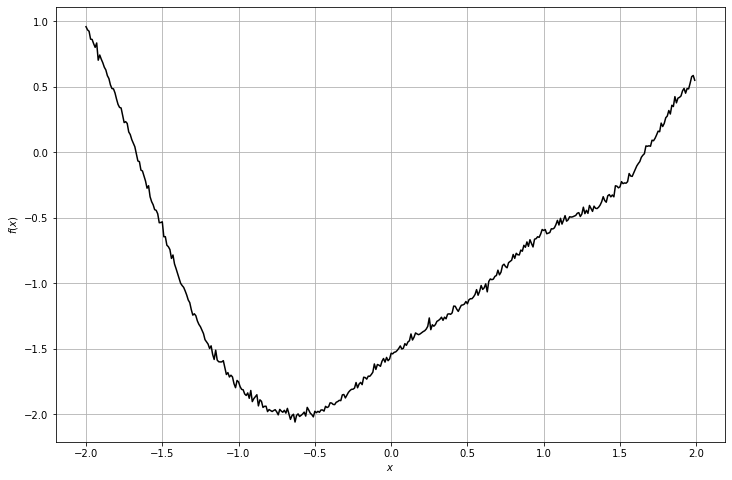

context_x =  (1, 43, 1)
context_y =  (1, 43, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


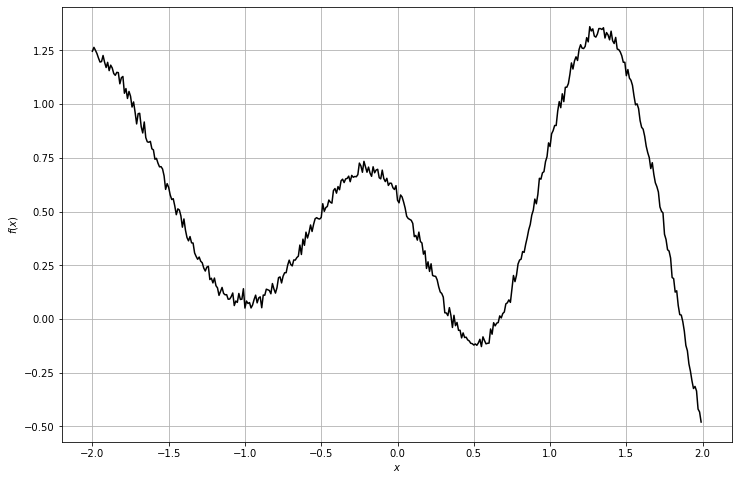

context_x =  (1, 18, 1)
context_y =  (1, 18, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


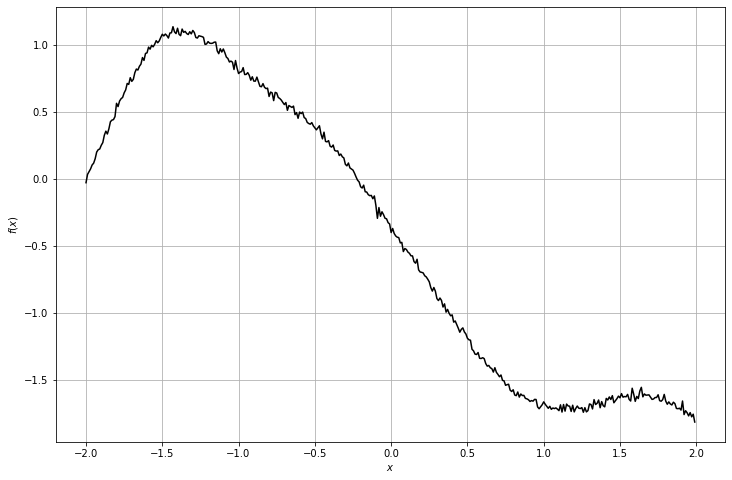

context_x =  (1, 59, 1)
context_y =  (1, 59, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


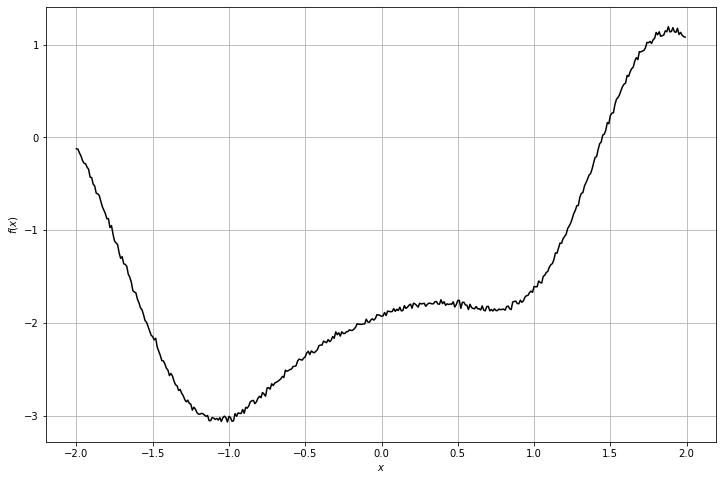

context_x =  (1, 85, 1)
context_y =  (1, 85, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


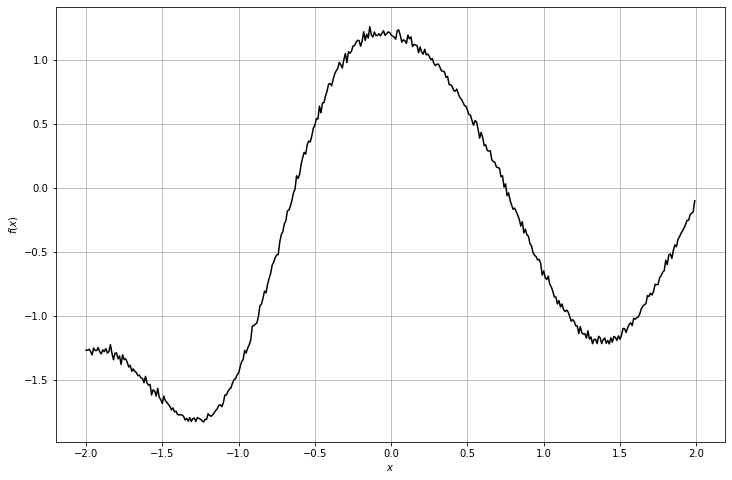

context_x =  (1, 84, 1)
context_y =  (1, 84, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


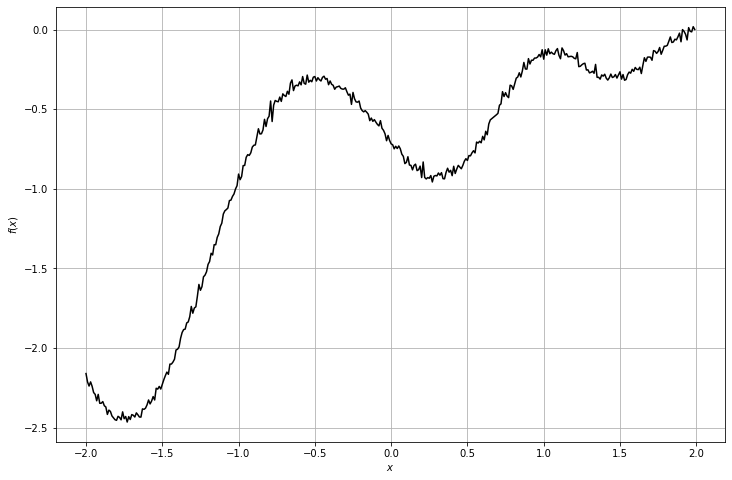

context_x =  (1, 12, 1)
context_y =  (1, 12, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


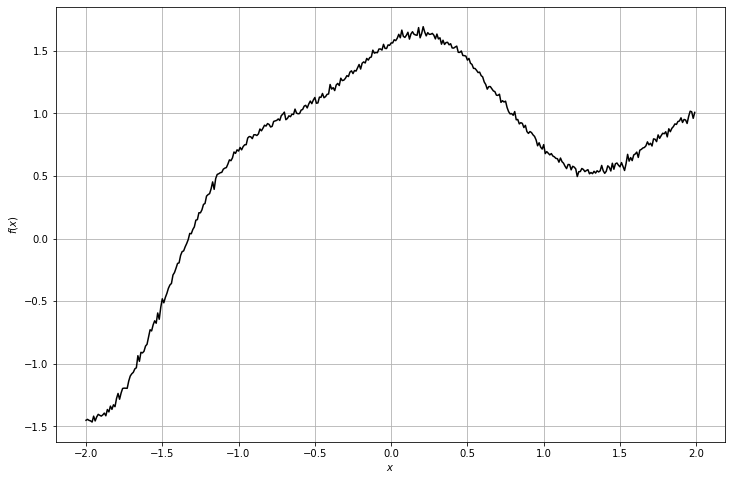

context_x =  (1, 29, 1)
context_y =  (1, 29, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


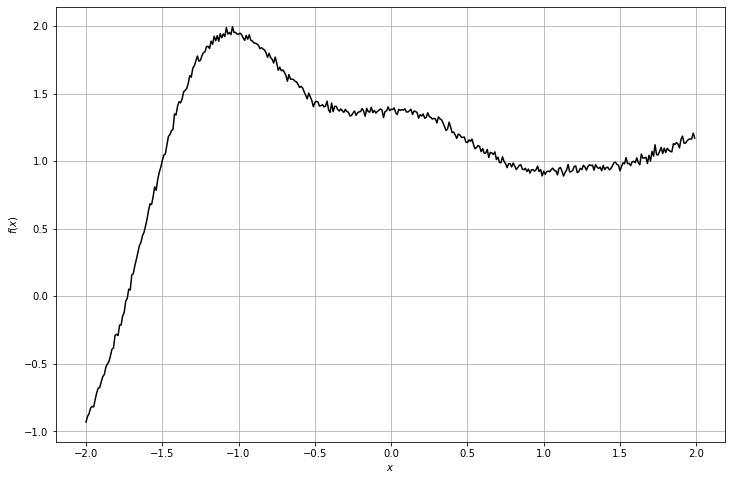

context_x =  (1, 6, 1)
context_y =  (1, 6, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


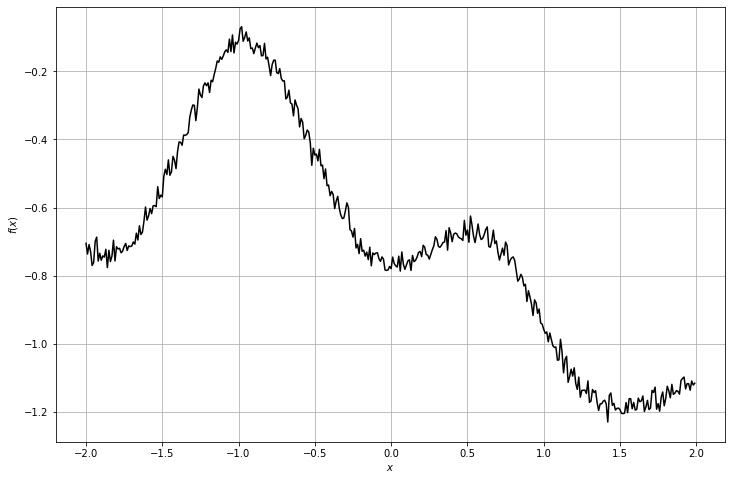

context_x =  (1, 64, 1)
context_y =  (1, 64, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


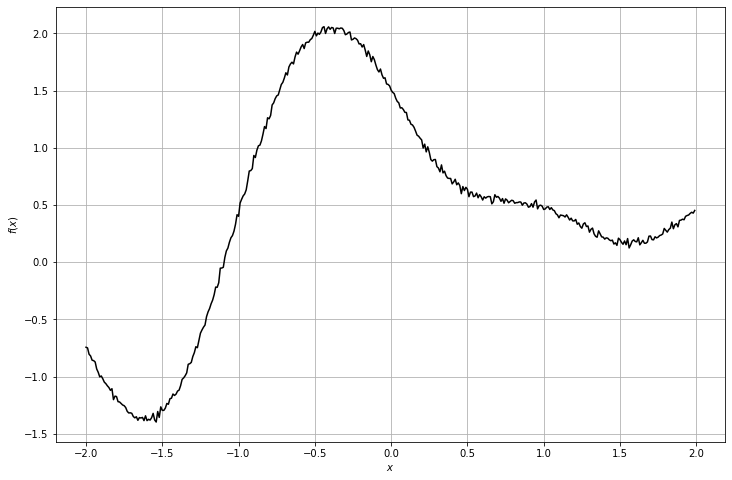

context_x =  (1, 83, 1)
context_y =  (1, 83, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


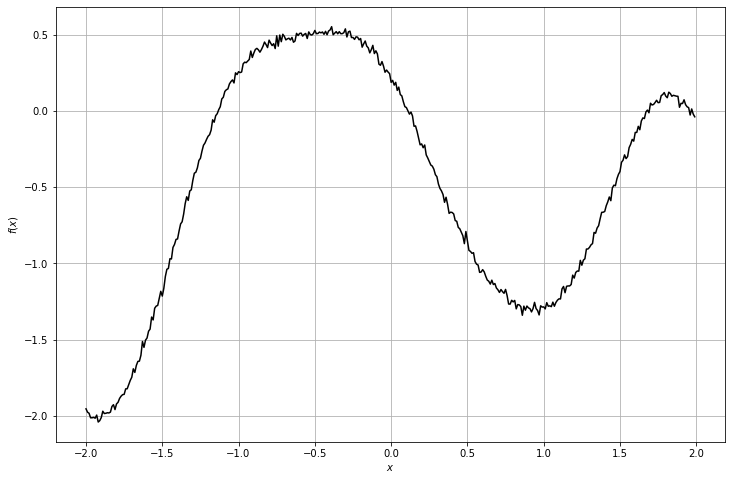

context_x =  (1, 64, 1)
context_y =  (1, 64, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


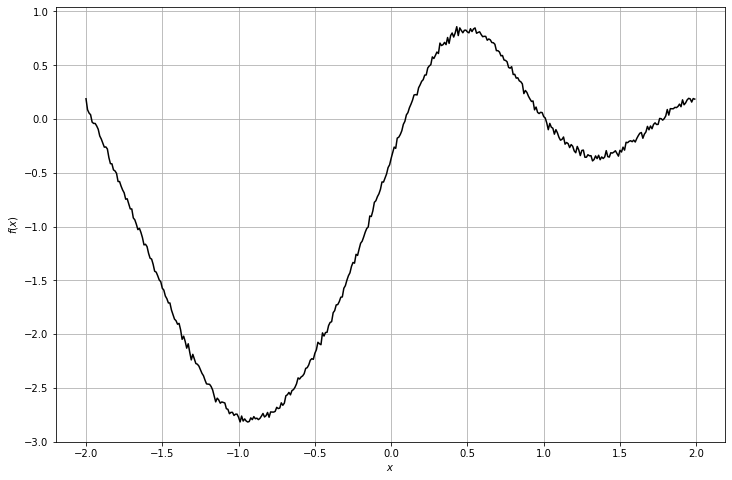

context_x =  (1, 43, 1)
context_y =  (1, 43, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


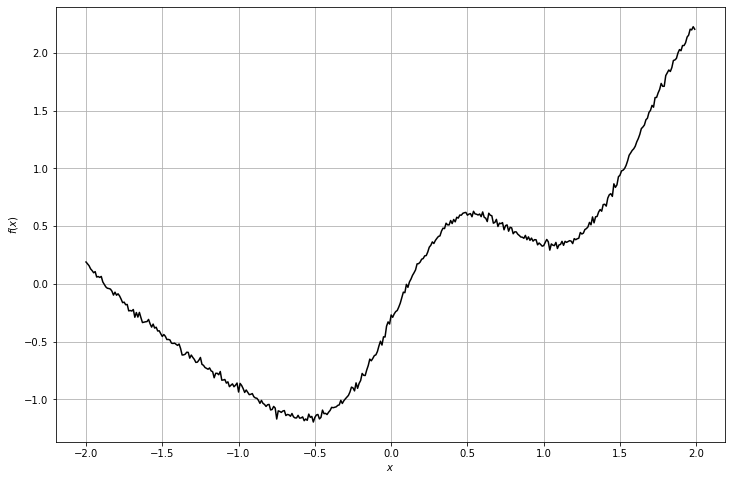

context_x =  (1, 50, 1)
context_y =  (1, 50, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


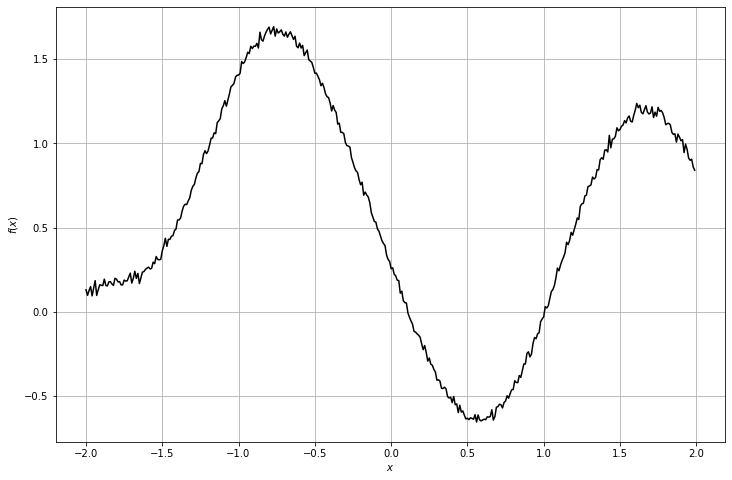

context_x =  (1, 41, 1)
context_y =  (1, 41, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


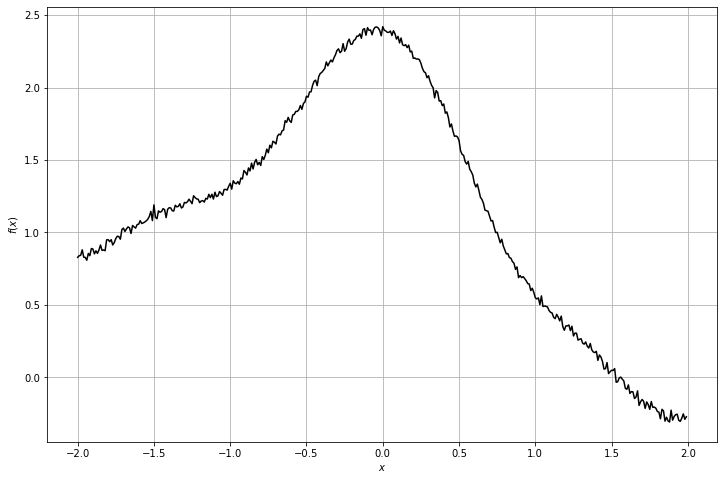

context_x =  (1, 76, 1)
context_y =  (1, 76, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


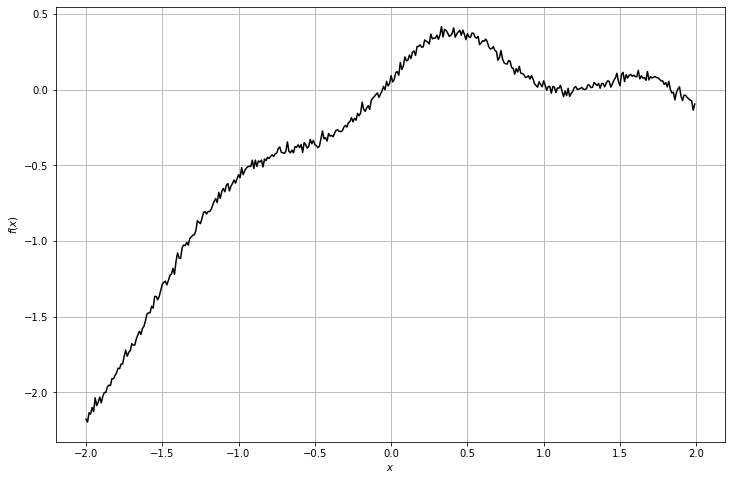

context_x =  (1, 57, 1)
context_y =  (1, 57, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


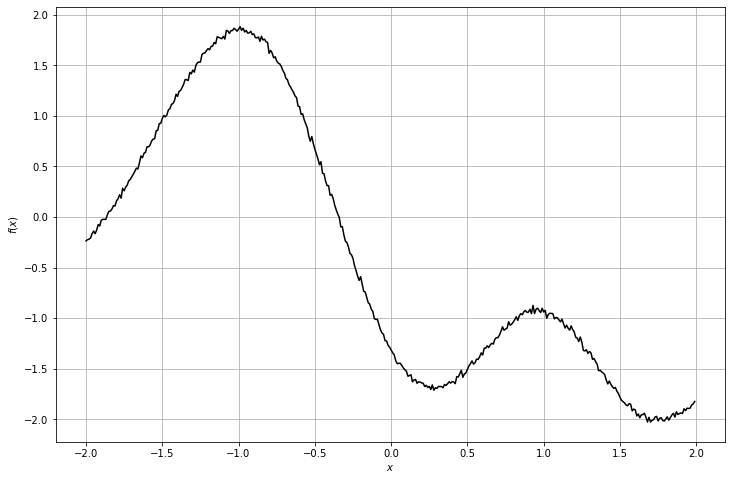

context_x =  (1, 60, 1)
context_y =  (1, 60, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


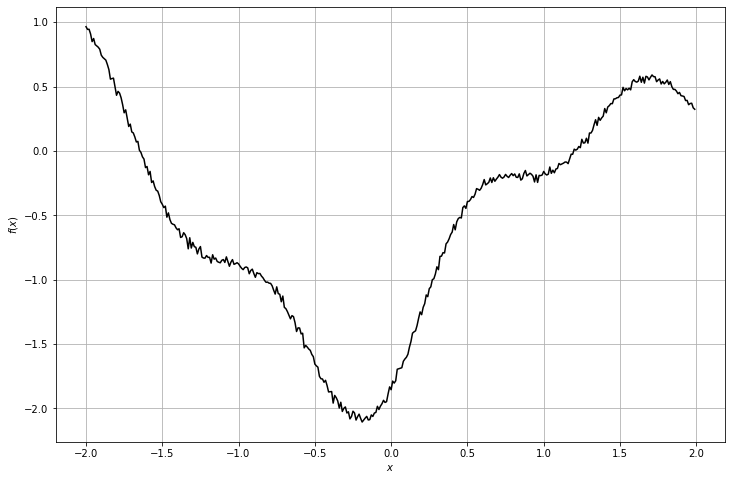

context_x =  (1, 31, 1)
context_y =  (1, 31, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


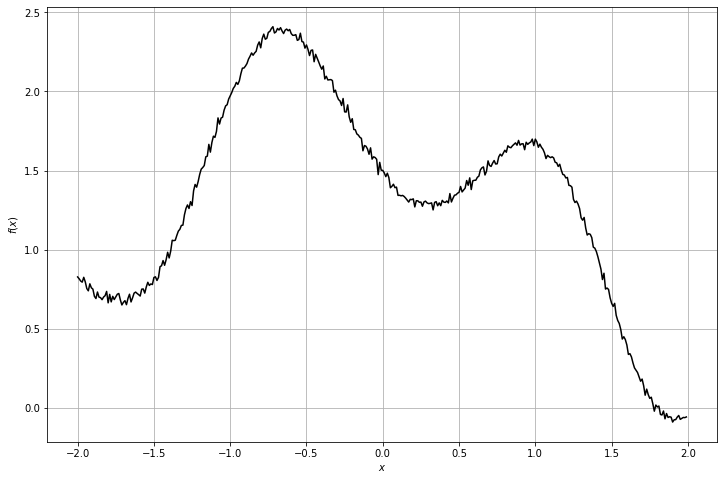

context_x =  (1, 9, 1)
context_y =  (1, 9, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


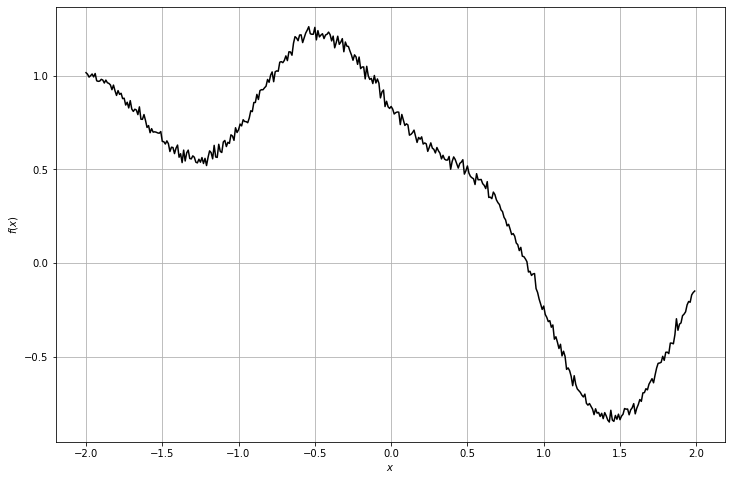

context_x =  (1, 91, 1)
context_y =  (1, 91, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


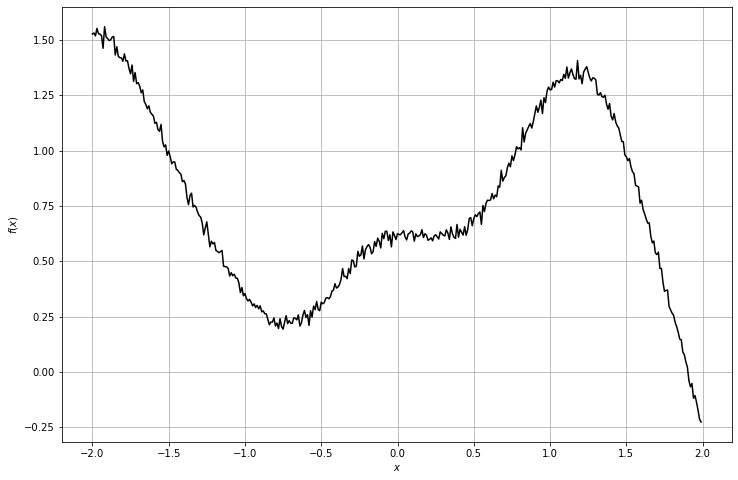

context_x =  (1, 14, 1)
context_y =  (1, 14, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


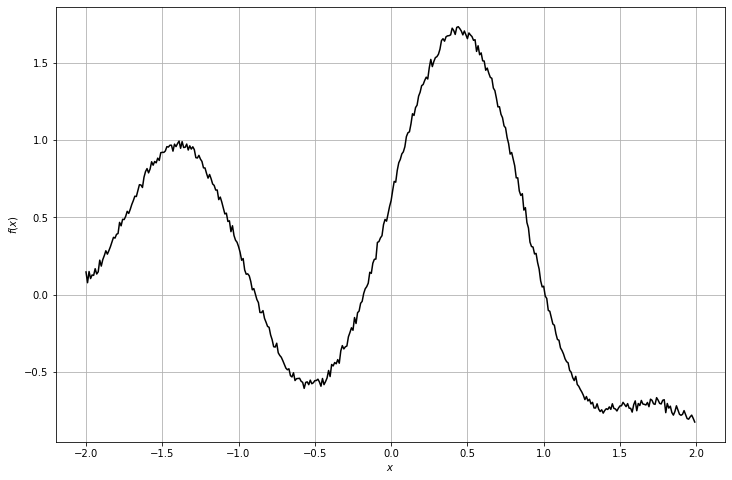

context_x =  (1, 87, 1)
context_y =  (1, 87, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


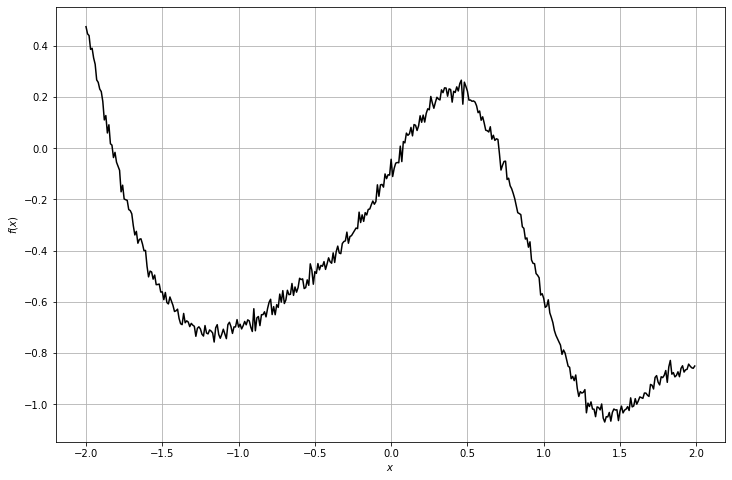

context_x =  (1, 91, 1)
context_y =  (1, 91, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


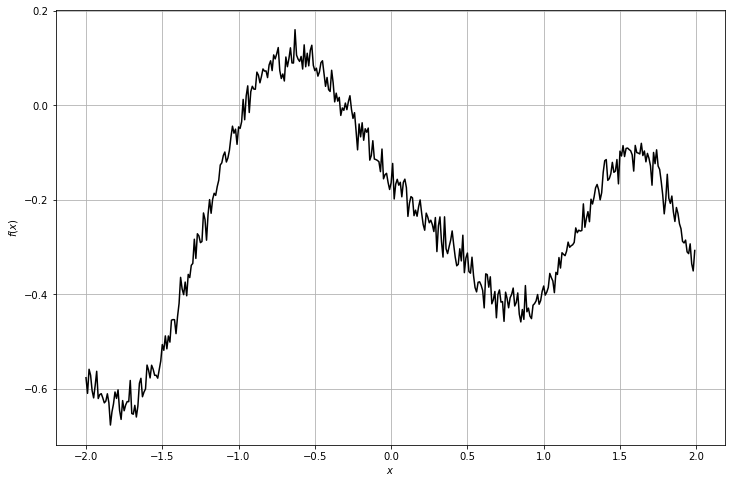

context_x =  (1, 9, 1)
context_y =  (1, 9, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


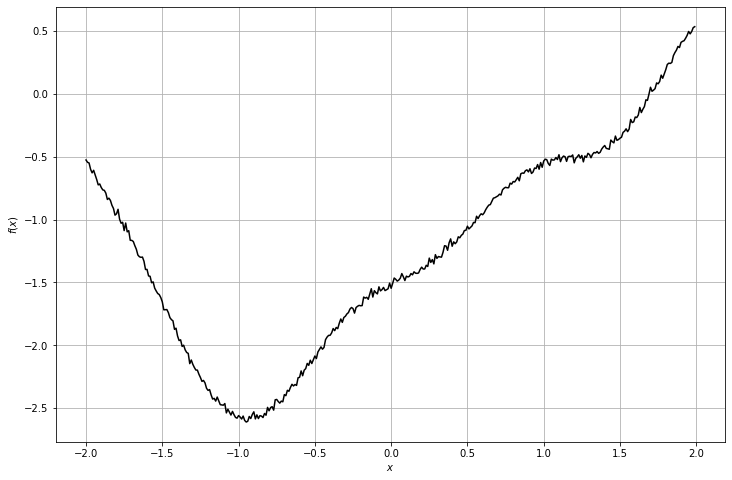

context_x =  (1, 94, 1)
context_y =  (1, 94, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


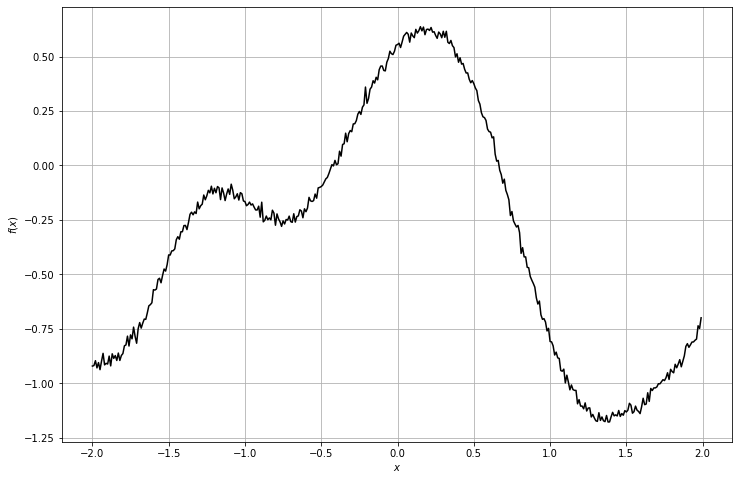

context_x =  (1, 78, 1)
context_y =  (1, 78, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


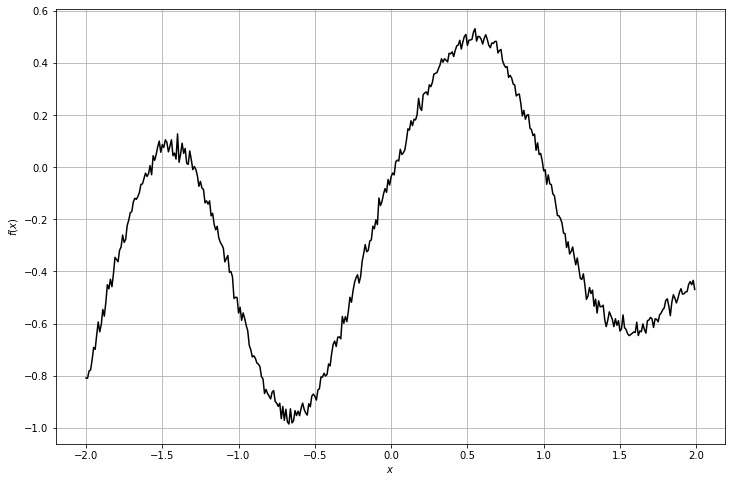

context_x =  (1, 7, 1)
context_y =  (1, 7, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


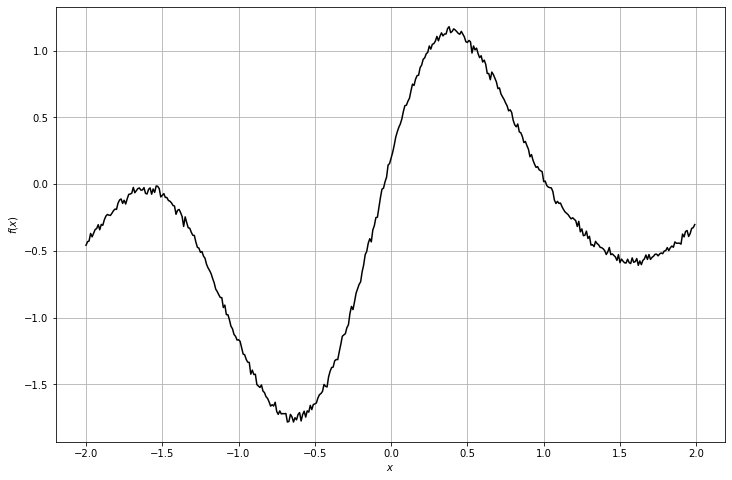

context_x =  (1, 66, 1)
context_y =  (1, 66, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


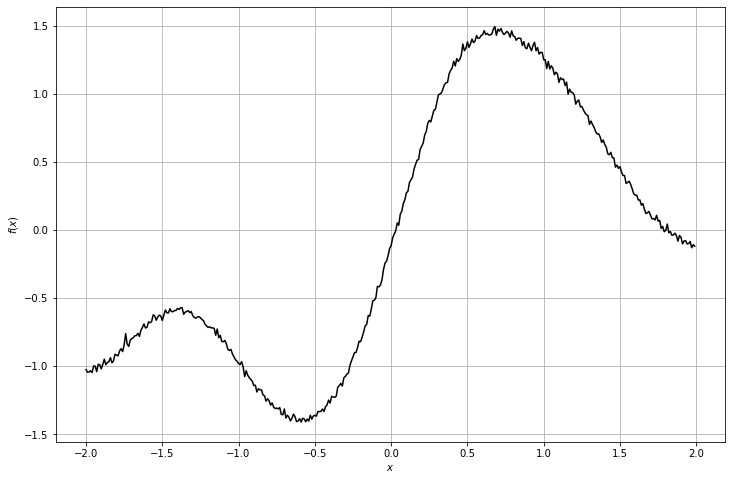

context_x =  (1, 13, 1)
context_y =  (1, 13, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


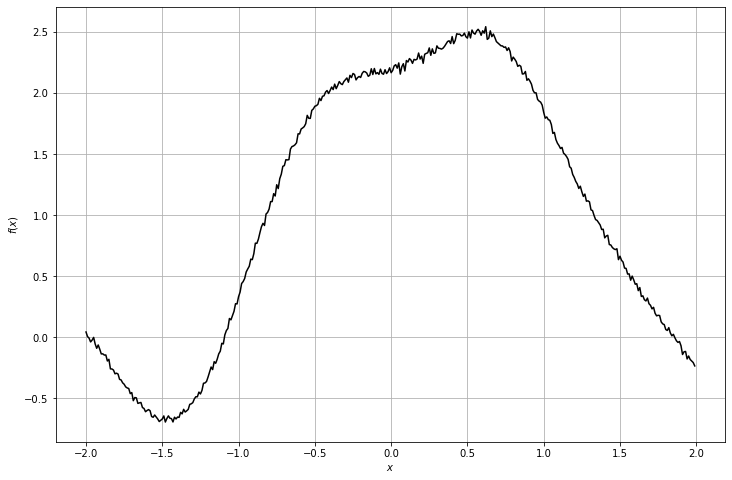

context_x =  (1, 17, 1)
context_y =  (1, 17, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


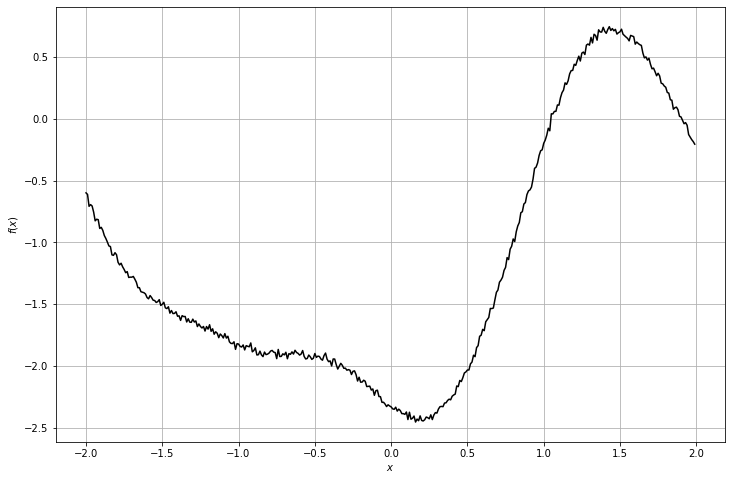

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


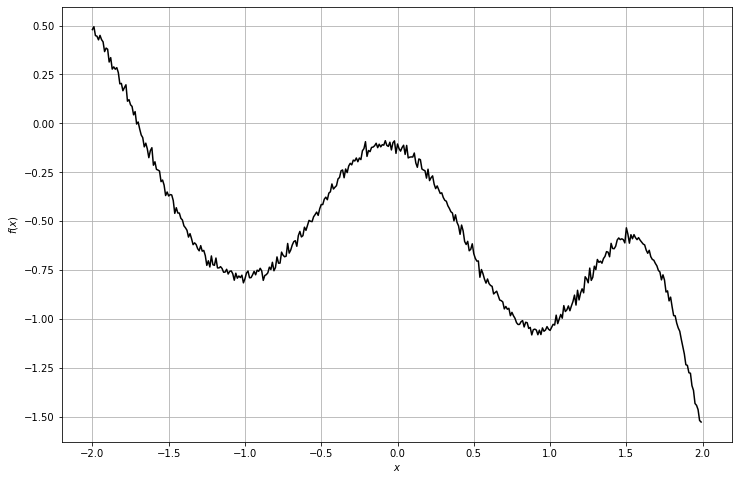

context_x =  (1, 57, 1)
context_y =  (1, 57, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


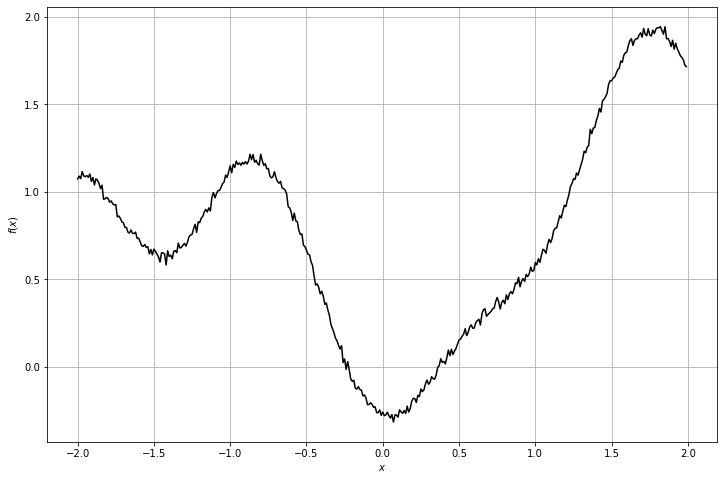

context_x =  (1, 28, 1)
context_y =  (1, 28, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


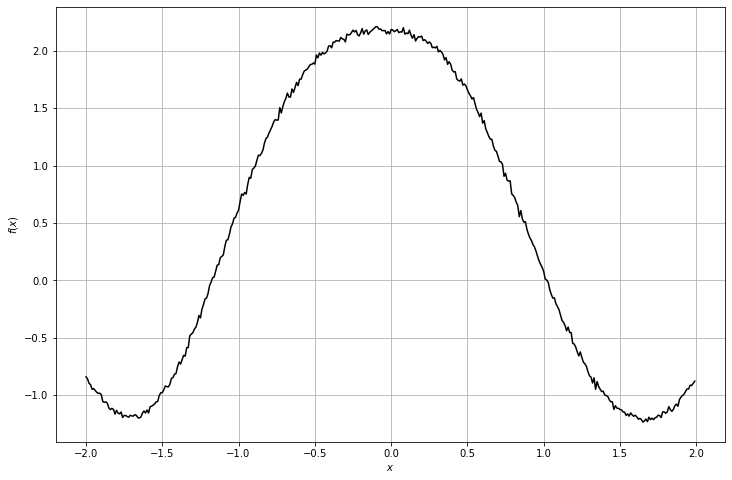

context_x =  (1, 83, 1)
context_y =  (1, 83, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


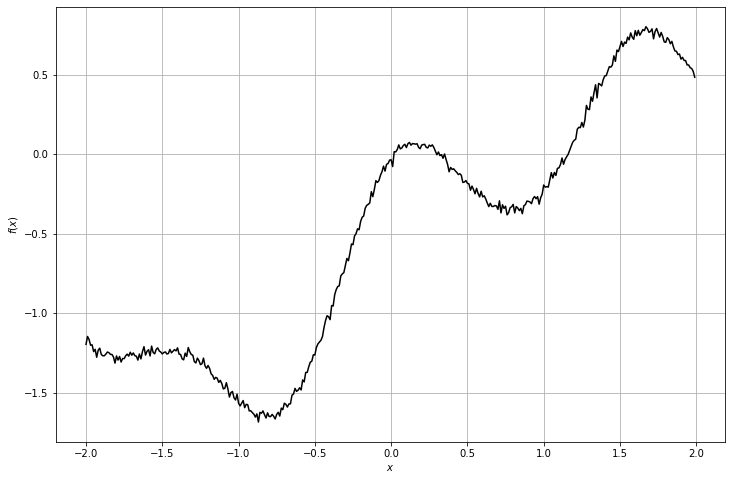

context_x =  (1, 4, 1)
context_y =  (1, 4, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


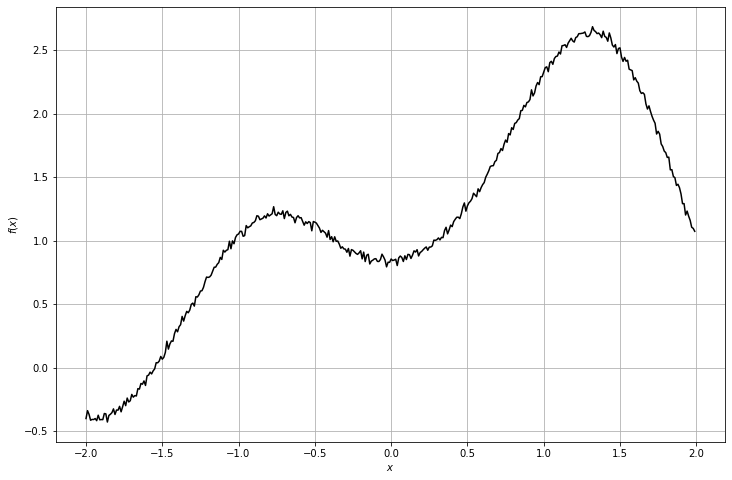

context_x =  (1, 33, 1)
context_y =  (1, 33, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


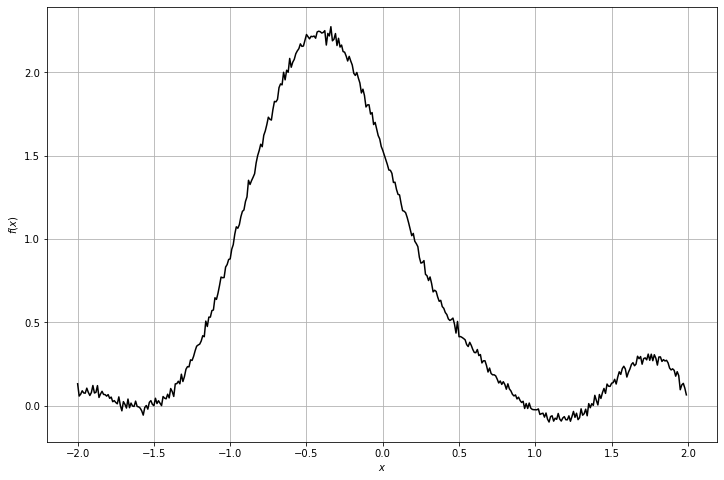

context_x =  (1, 27, 1)
context_y =  (1, 27, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


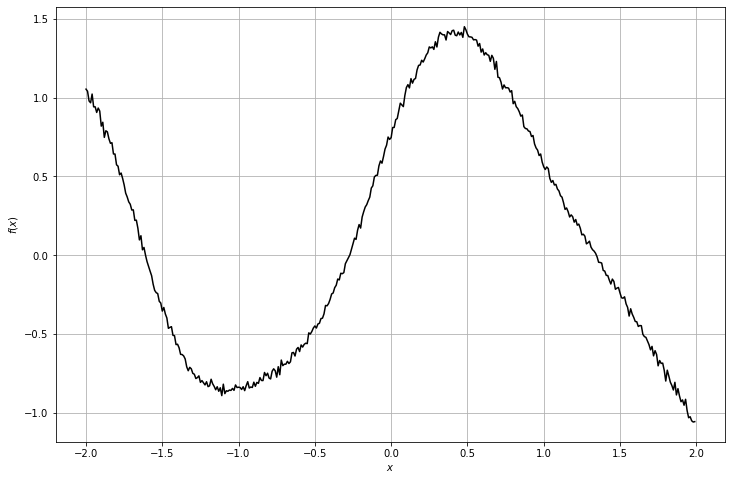

context_x =  (1, 65, 1)
context_y =  (1, 65, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


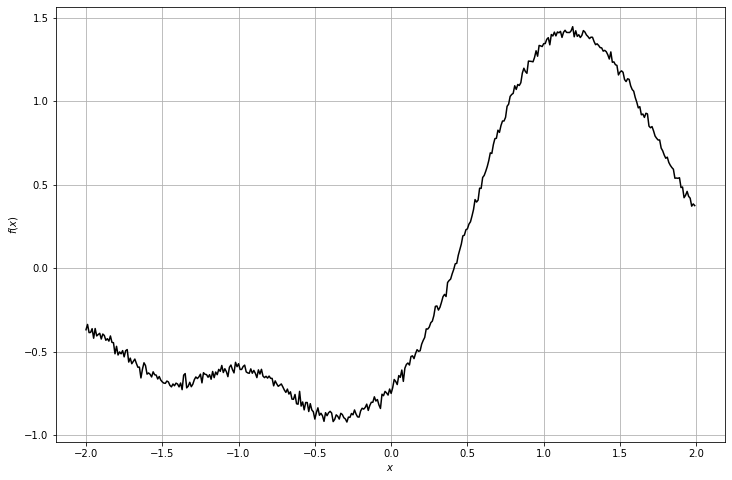

context_x =  (1, 51, 1)
context_y =  (1, 51, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


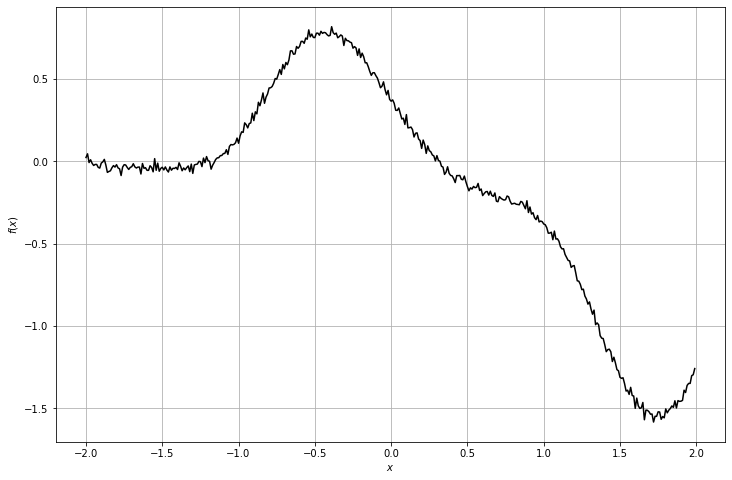

context_x =  (1, 4, 1)
context_y =  (1, 4, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


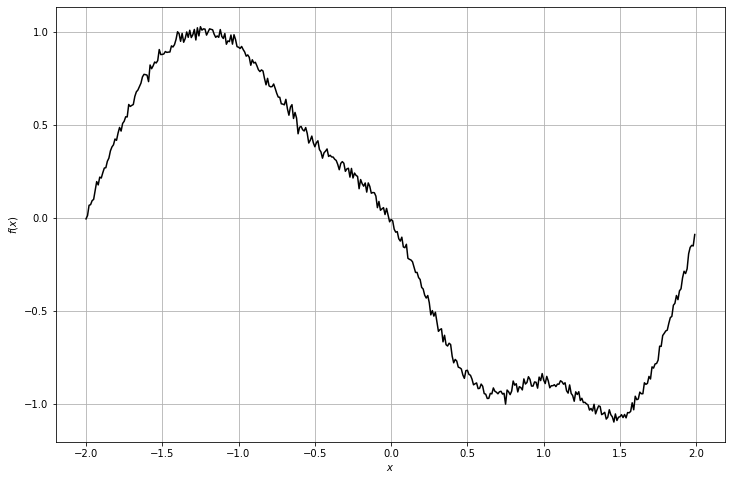

context_x =  (1, 27, 1)
context_y =  (1, 27, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


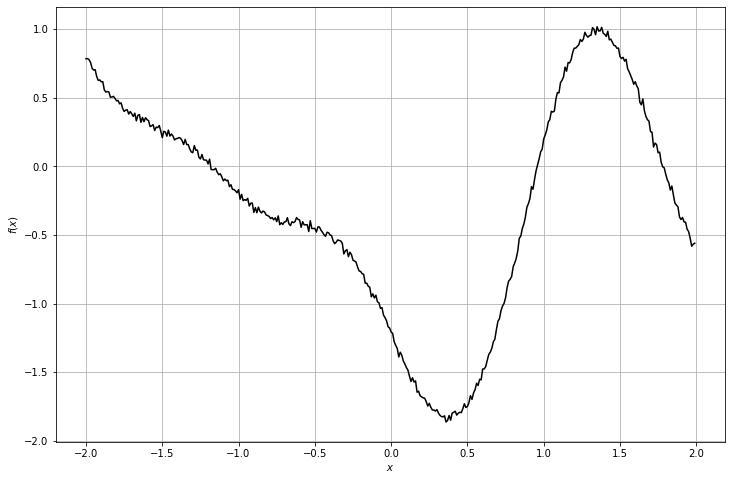

context_x =  (1, 18, 1)
context_y =  (1, 18, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


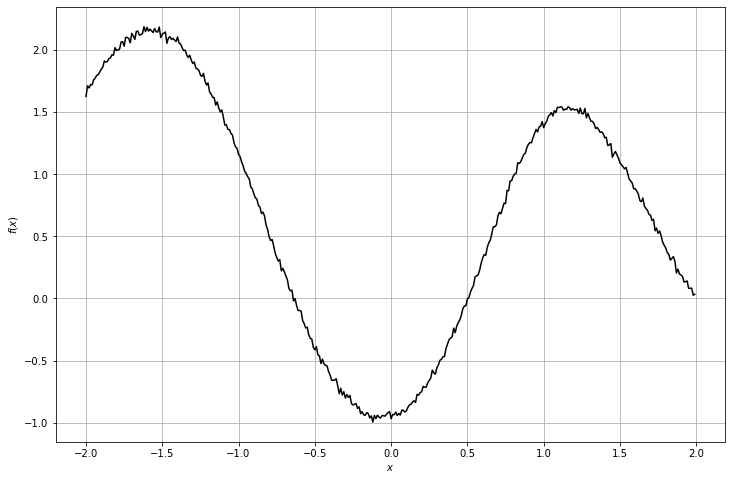

context_x =  (1, 77, 1)
context_y =  (1, 77, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


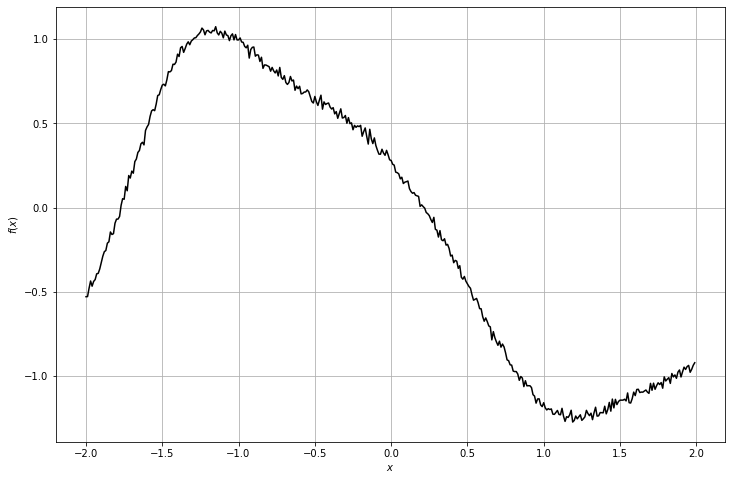

context_x =  (1, 11, 1)
context_y =  (1, 11, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


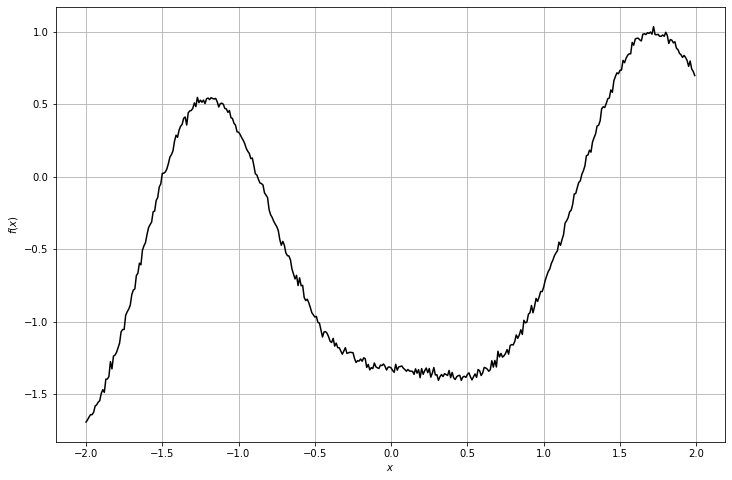

context_x =  (1, 23, 1)
context_y =  (1, 23, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


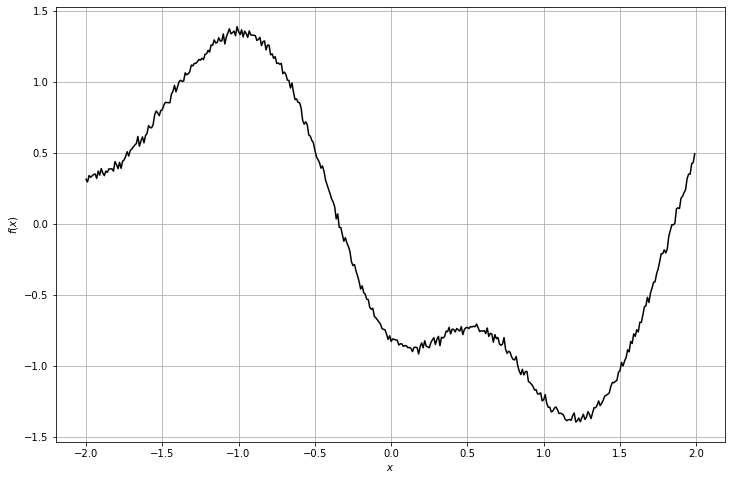

context_x =  (1, 8, 1)
context_y =  (1, 8, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


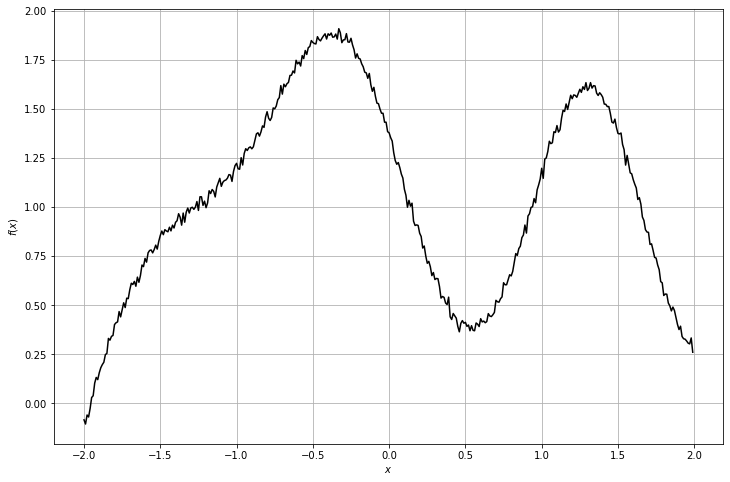

context_x =  (1, 46, 1)
context_y =  (1, 46, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


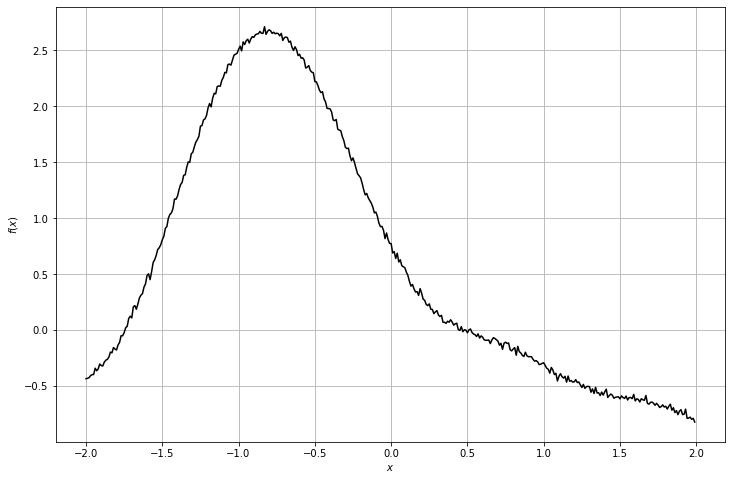

context_x =  (1, 49, 1)
context_y =  (1, 49, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


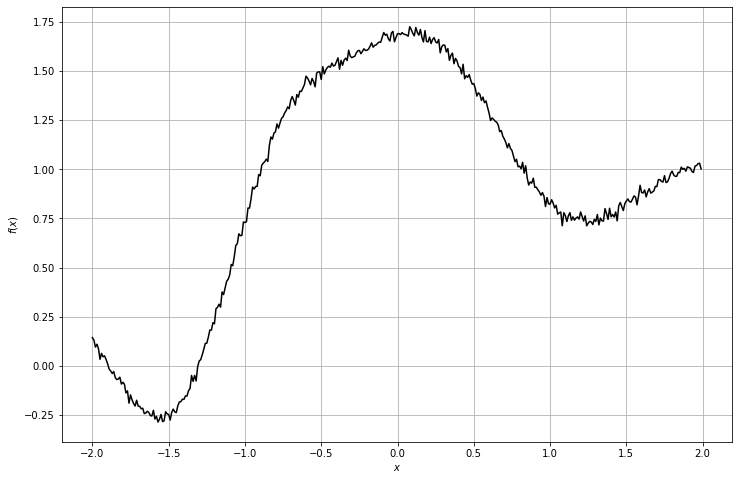

context_x =  (1, 3, 1)
context_y =  (1, 3, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


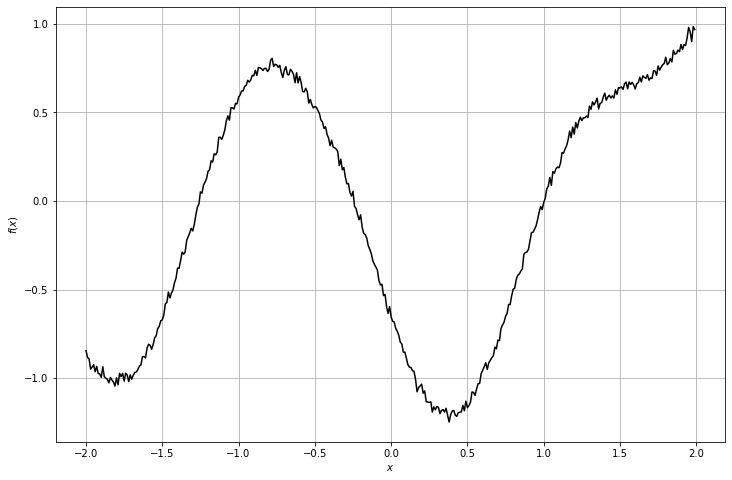

context_x =  (1, 93, 1)
context_y =  (1, 93, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


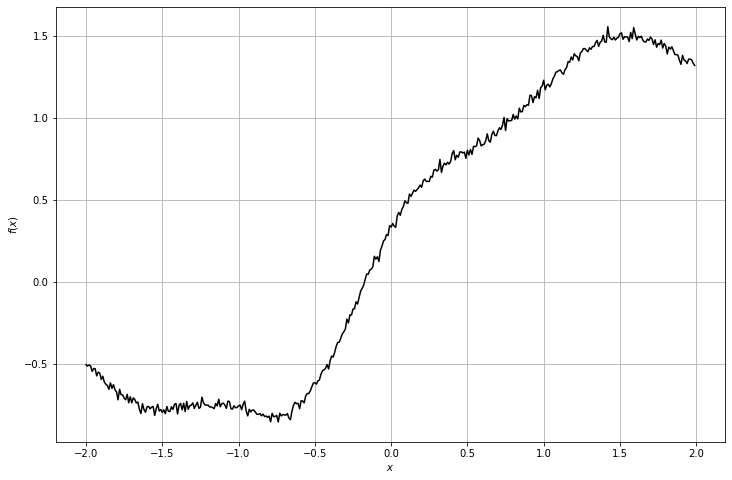

context_x =  (1, 70, 1)
context_y =  (1, 70, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


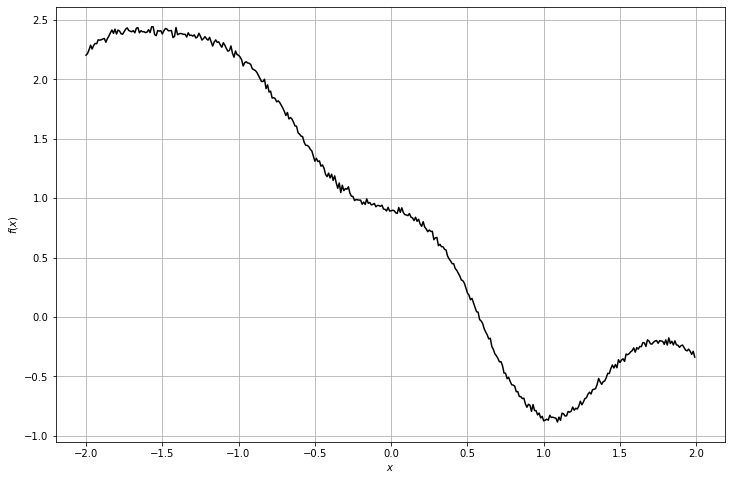

context_x =  (1, 87, 1)
context_y =  (1, 87, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


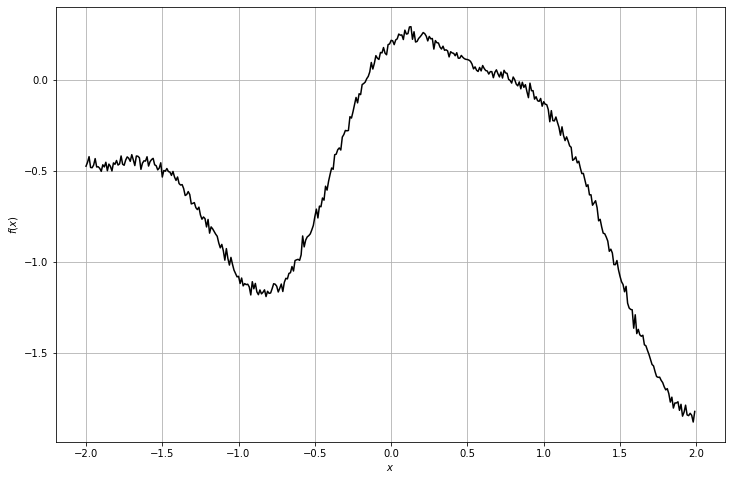

context_x =  (1, 86, 1)
context_y =  (1, 86, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


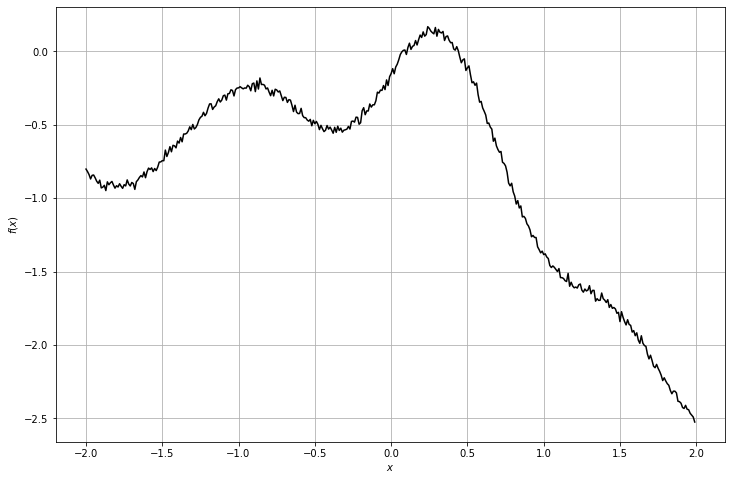

context_x =  (1, 77, 1)
context_y =  (1, 77, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


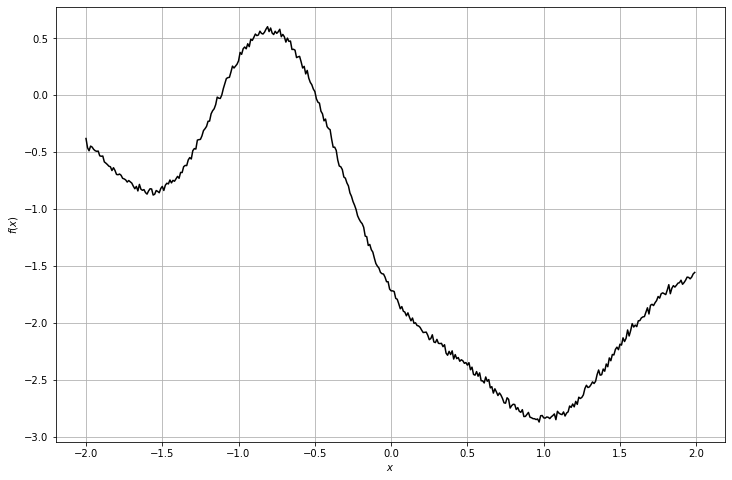

context_x =  (1, 37, 1)
context_y =  (1, 37, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


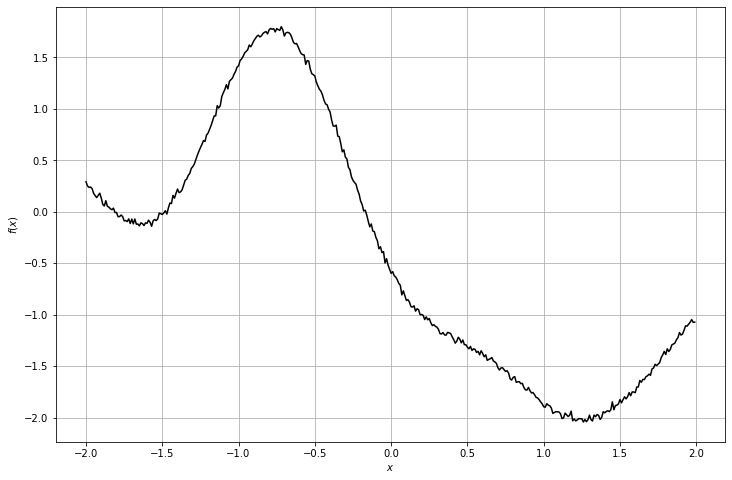

context_x =  (1, 37, 1)
context_y =  (1, 37, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


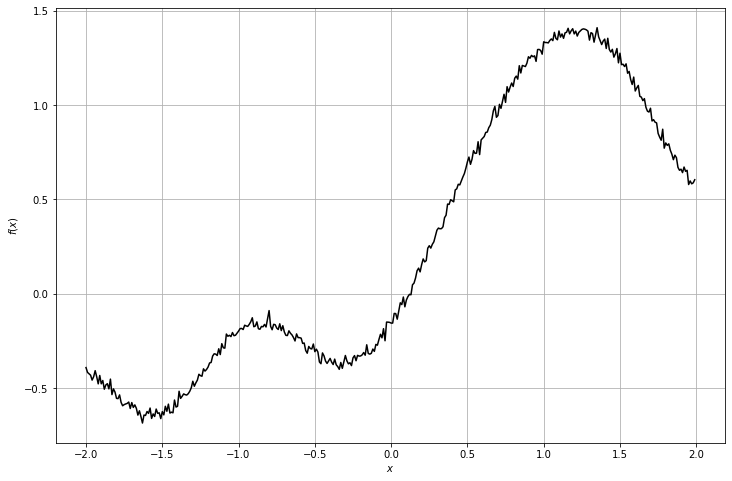

context_x =  (1, 9, 1)
context_y =  (1, 9, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


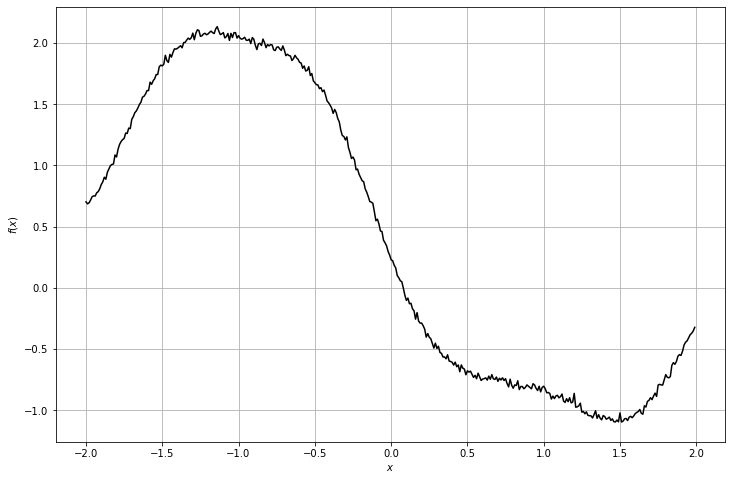

context_x =  (1, 77, 1)
context_y =  (1, 77, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


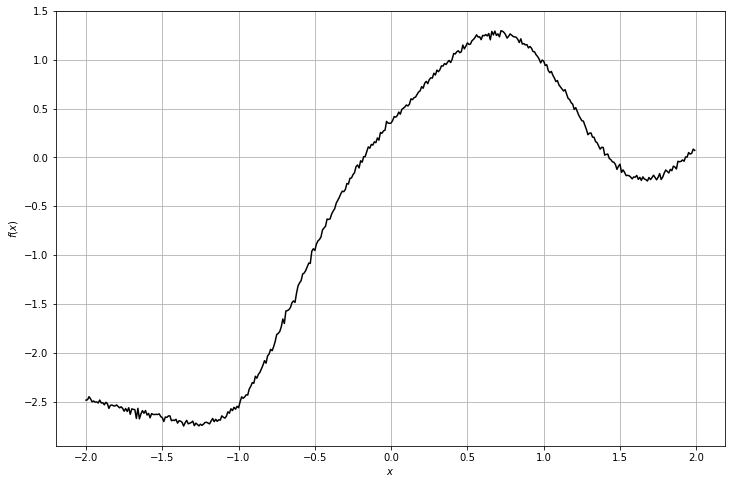

context_x =  (1, 69, 1)
context_y =  (1, 69, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


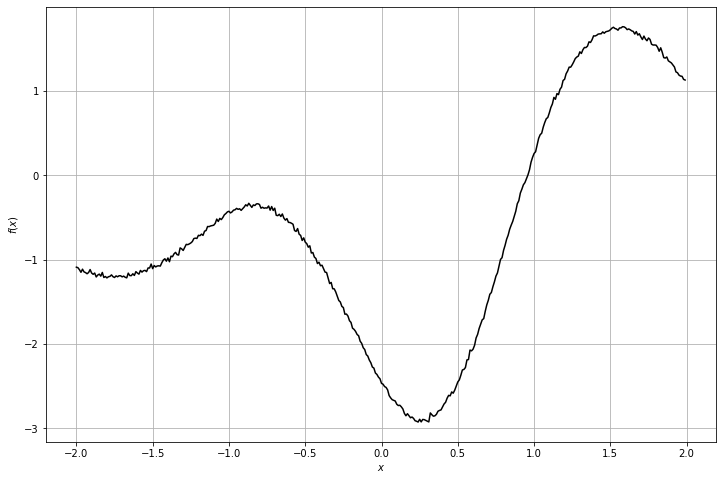

context_x =  (1, 13, 1)
context_y =  (1, 13, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


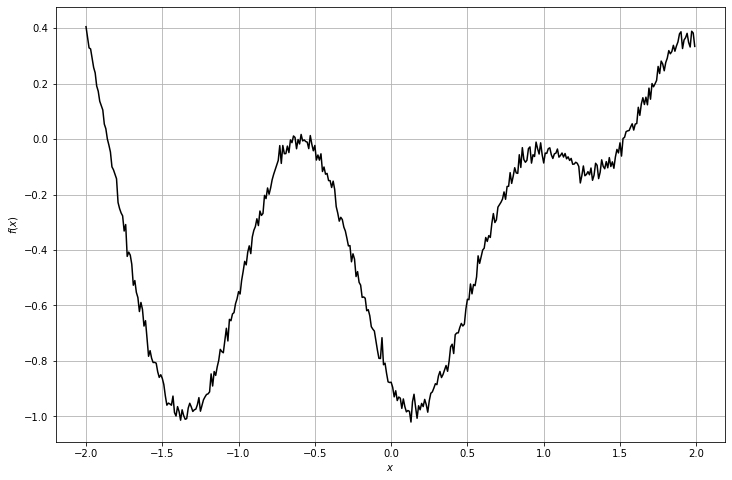

context_x =  (1, 67, 1)
context_y =  (1, 67, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


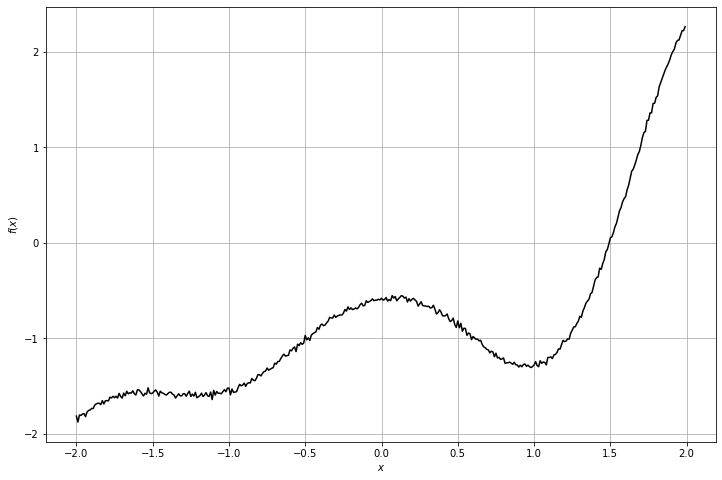

context_x =  (1, 21, 1)
context_y =  (1, 21, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


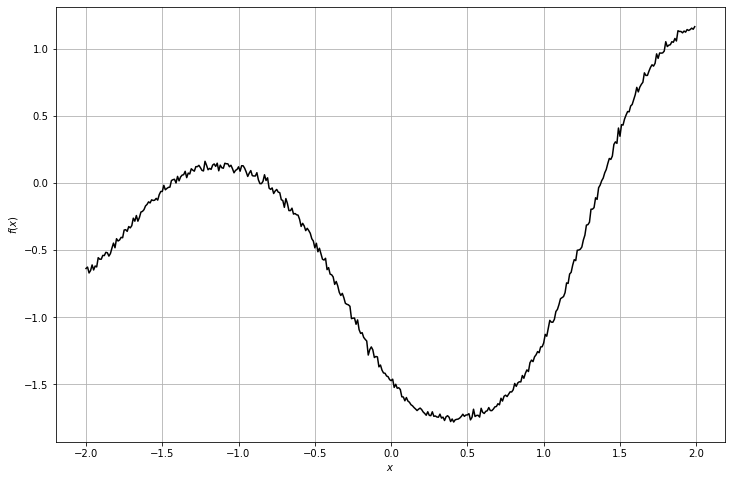

context_x =  (1, 9, 1)
context_y =  (1, 9, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


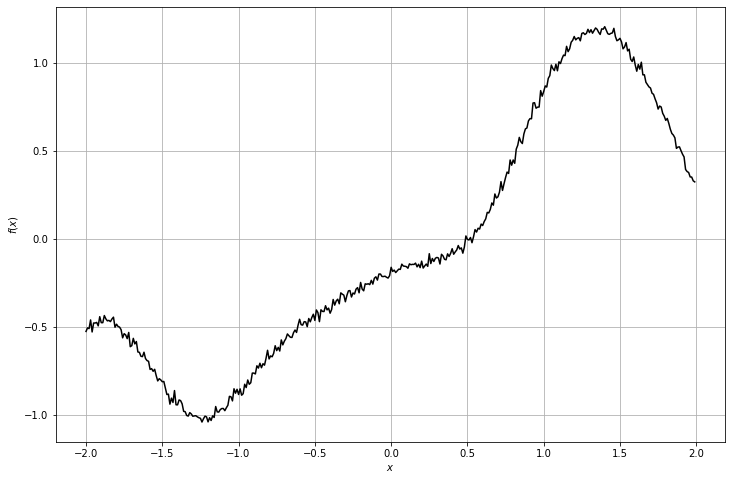

context_x =  (1, 51, 1)
context_y =  (1, 51, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


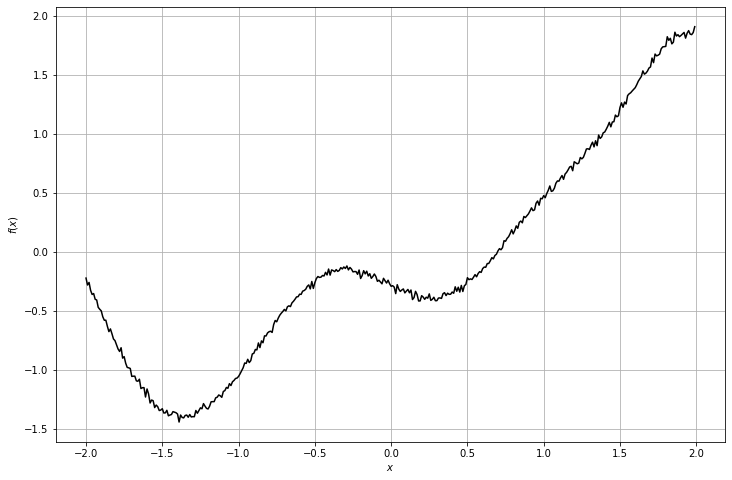

context_x =  (1, 40, 1)
context_y =  (1, 40, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


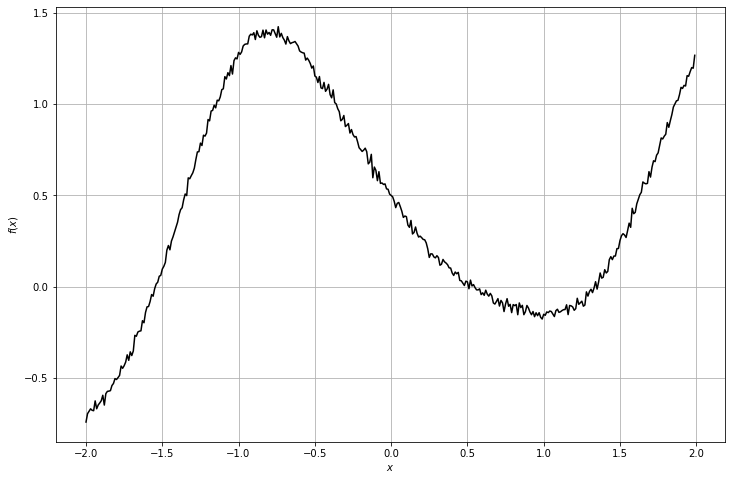

context_x =  (1, 98, 1)
context_y =  (1, 98, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


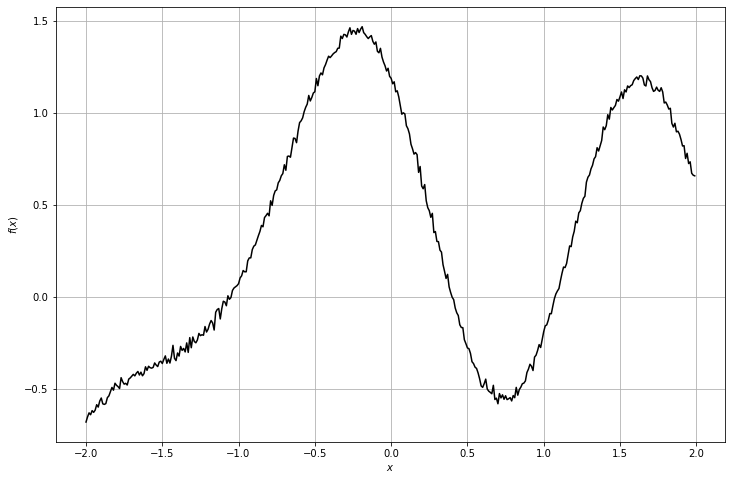

context_x =  (1, 48, 1)
context_y =  (1, 48, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


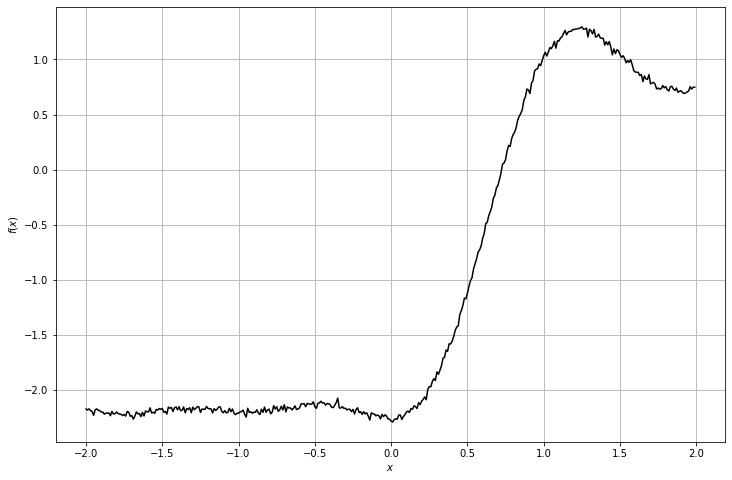

context_x =  (1, 78, 1)
context_y =  (1, 78, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


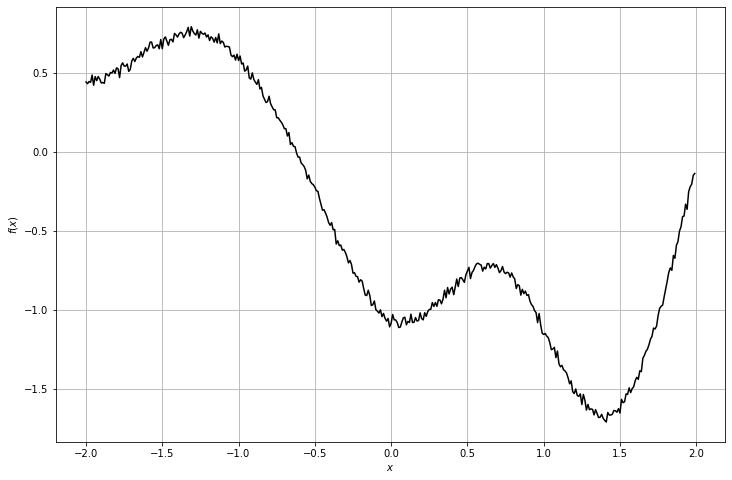

context_x =  (1, 70, 1)
context_y =  (1, 70, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


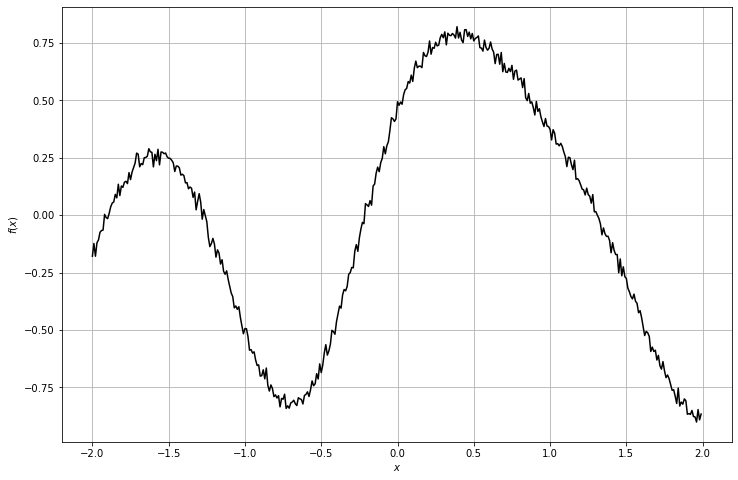

context_x =  (1, 43, 1)
context_y =  (1, 43, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


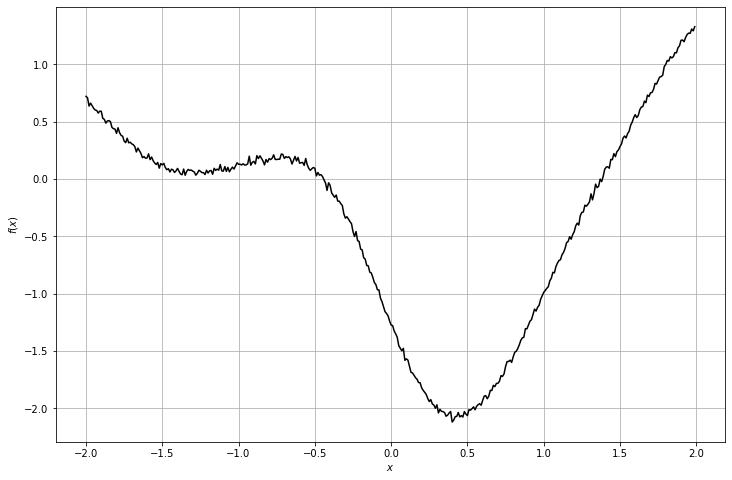

context_x =  (1, 83, 1)
context_y =  (1, 83, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


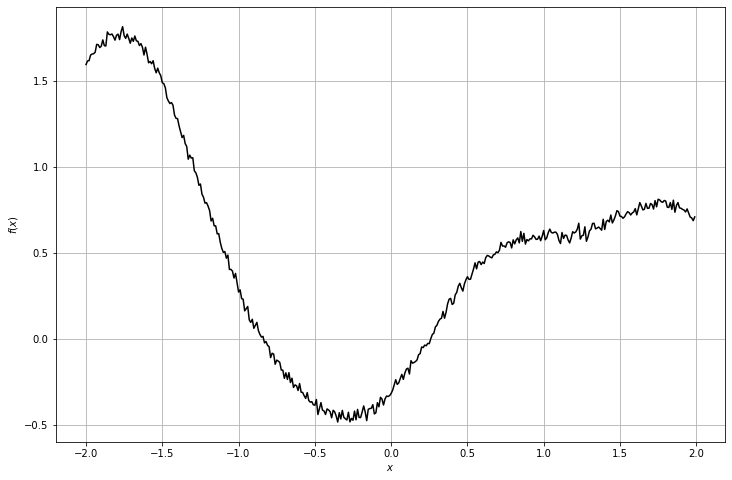

context_x =  (1, 42, 1)
context_y =  (1, 42, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


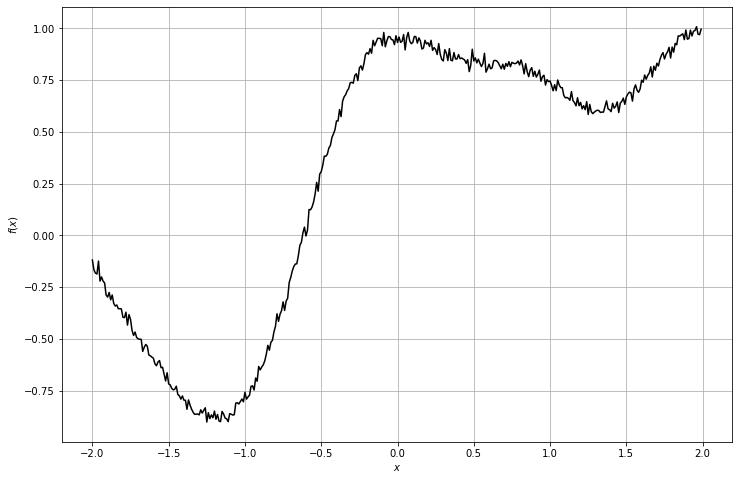

context_x =  (1, 81, 1)
context_y =  (1, 81, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


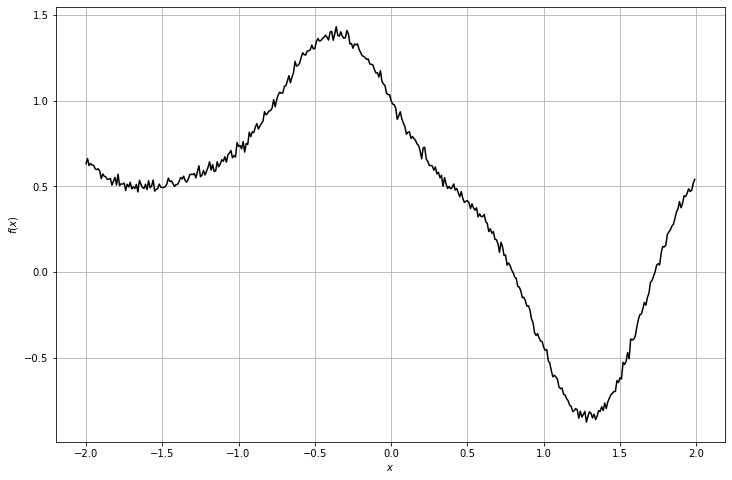

context_x =  (1, 22, 1)
context_y =  (1, 22, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


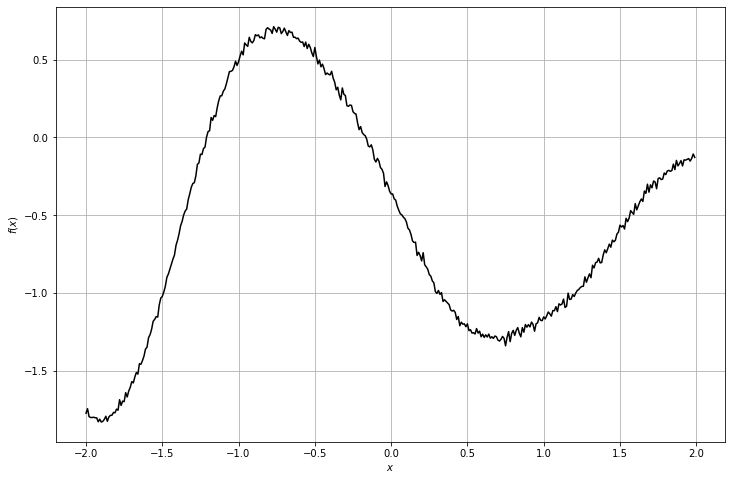

context_x =  (1, 28, 1)
context_y =  (1, 28, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


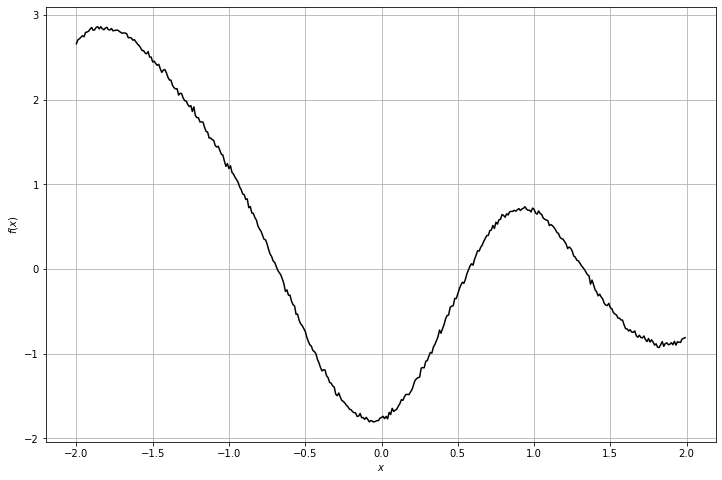

context_x =  (1, 24, 1)
context_y =  (1, 24, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


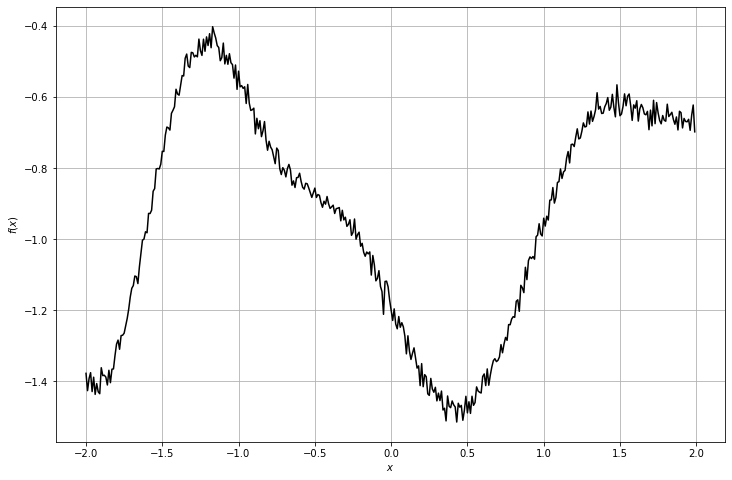

context_x =  (1, 77, 1)
context_y =  (1, 77, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


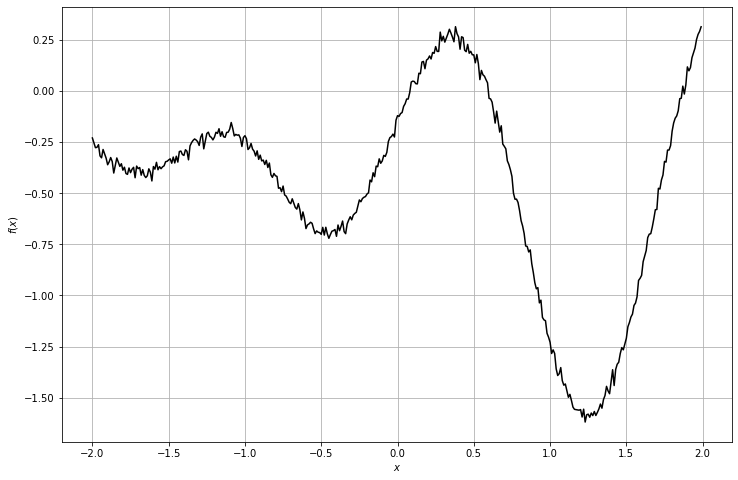

context_x =  (1, 44, 1)
context_y =  (1, 44, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


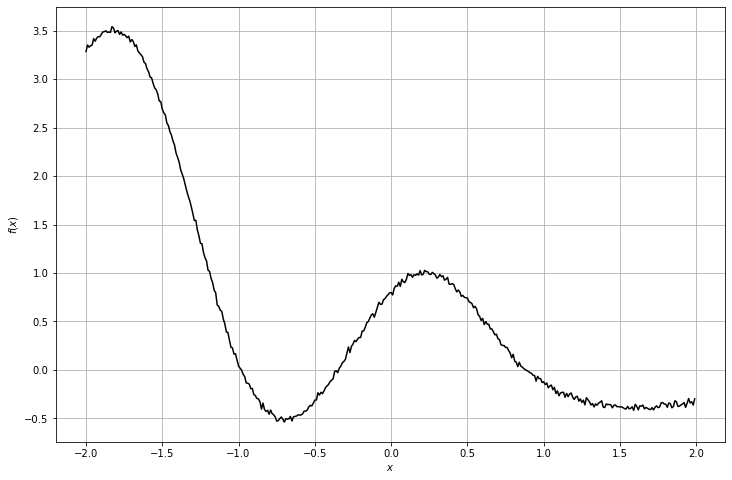

context_x =  (1, 55, 1)
context_y =  (1, 55, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


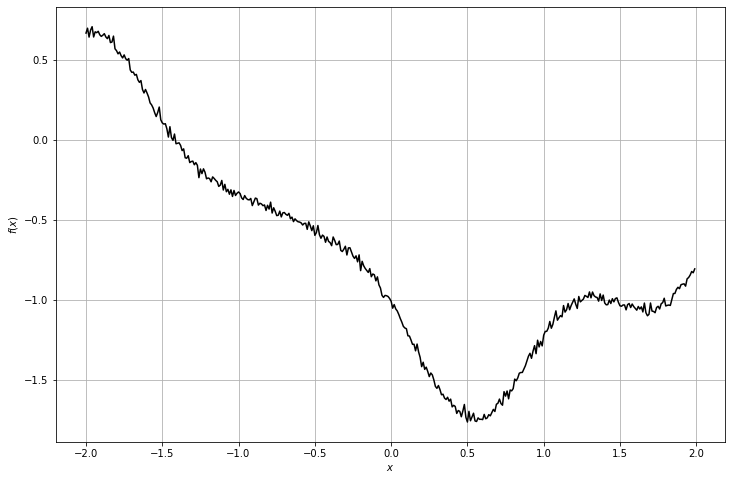

context_x =  (1, 35, 1)
context_y =  (1, 35, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


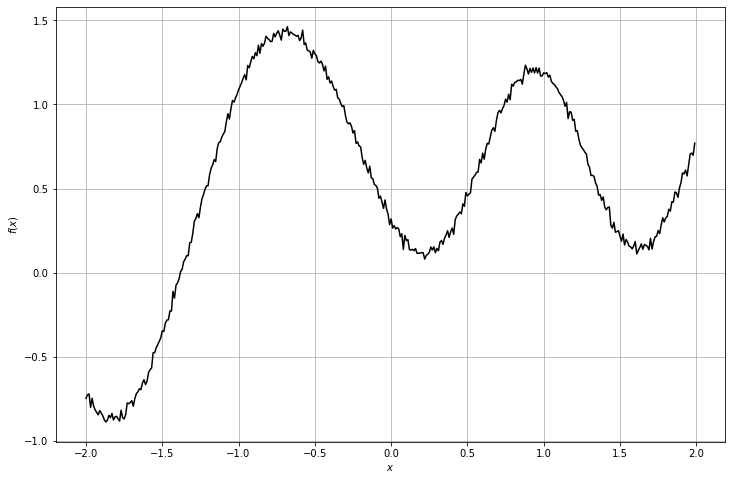

context_x =  (1, 85, 1)
context_y =  (1, 85, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


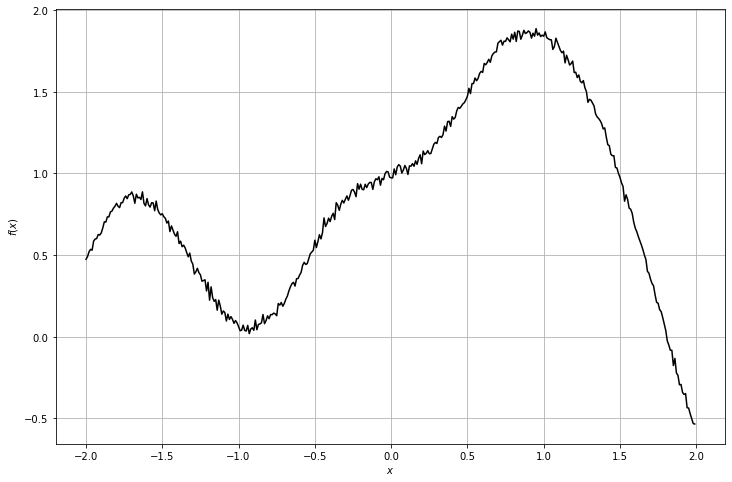

context_x =  (1, 62, 1)
context_y =  (1, 62, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


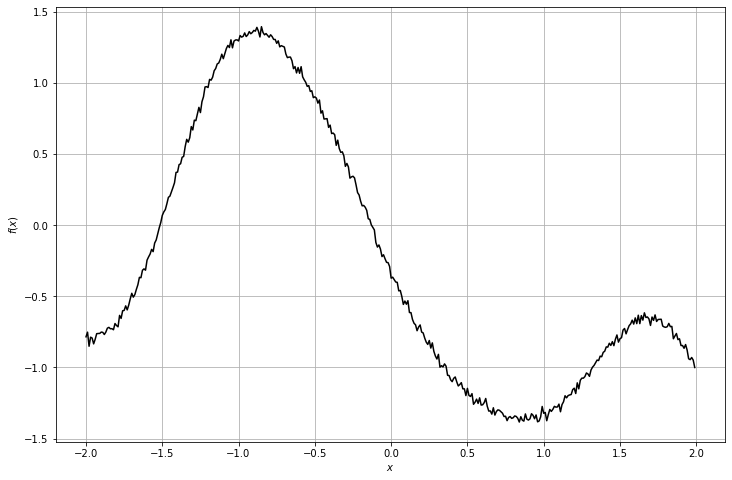

context_x =  (1, 66, 1)
context_y =  (1, 66, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


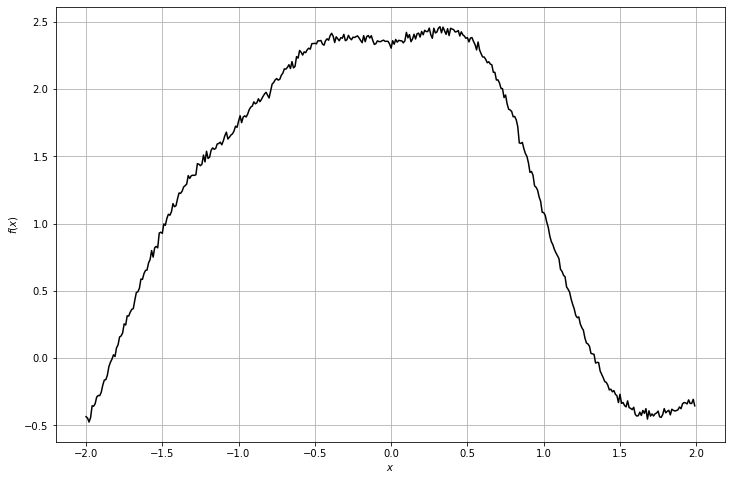

context_x =  (1, 66, 1)
context_y =  (1, 66, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


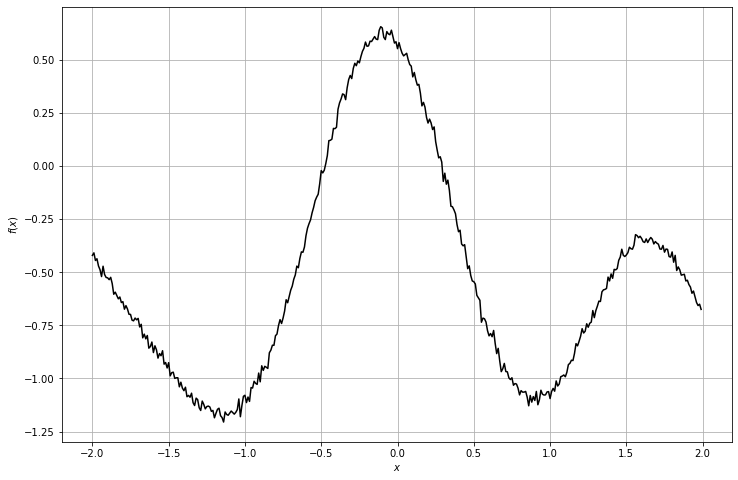

context_x =  (1, 13, 1)
context_y =  (1, 13, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


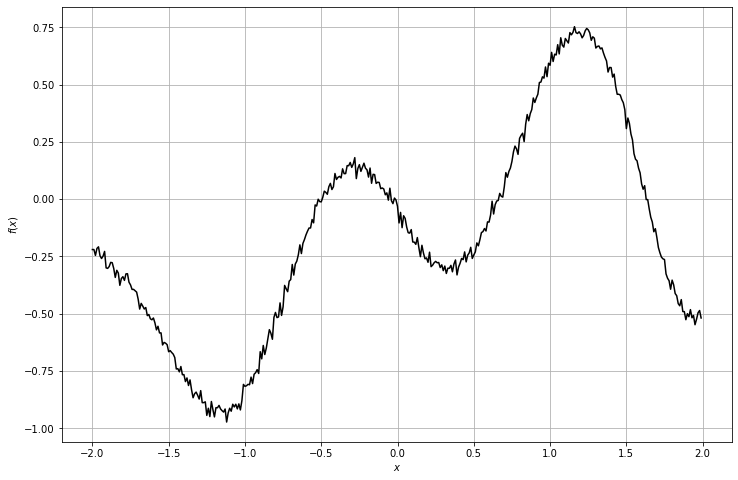

context_x =  (1, 81, 1)
context_y =  (1, 81, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


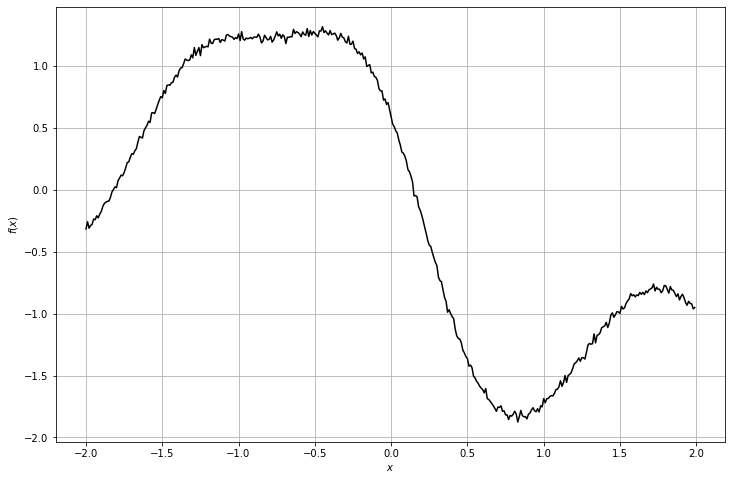

context_x =  (1, 36, 1)
context_y =  (1, 36, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


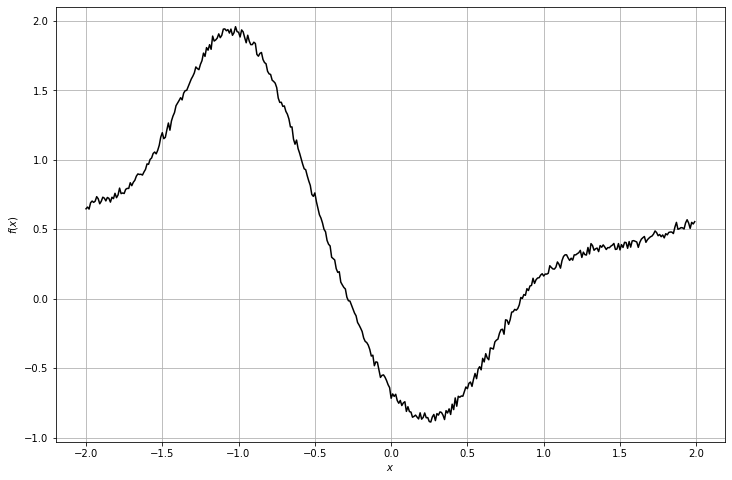

context_x =  (1, 17, 1)
context_y =  (1, 17, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


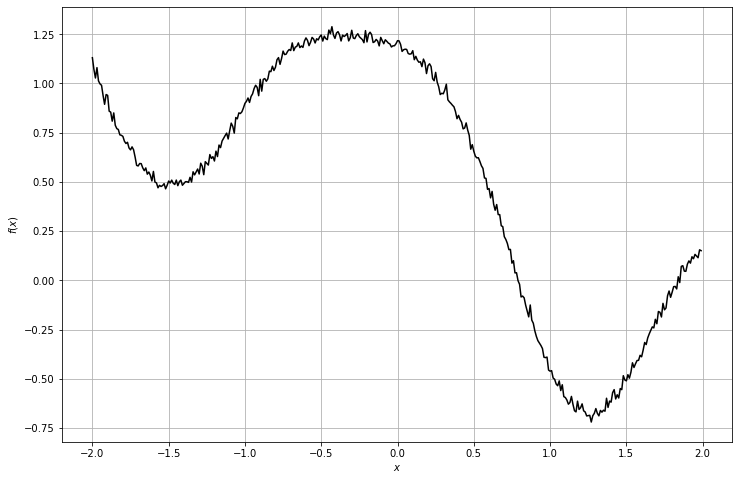

context_x =  (1, 87, 1)
context_y =  (1, 87, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


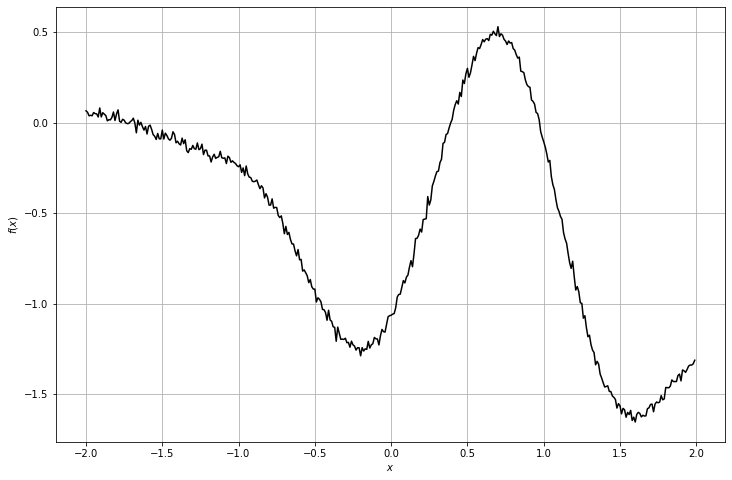

context_x =  (1, 33, 1)
context_y =  (1, 33, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


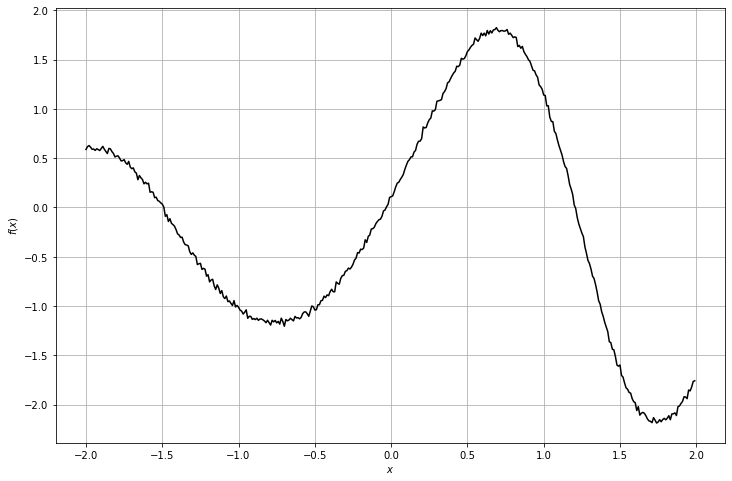

context_x =  (1, 96, 1)
context_y =  (1, 96, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


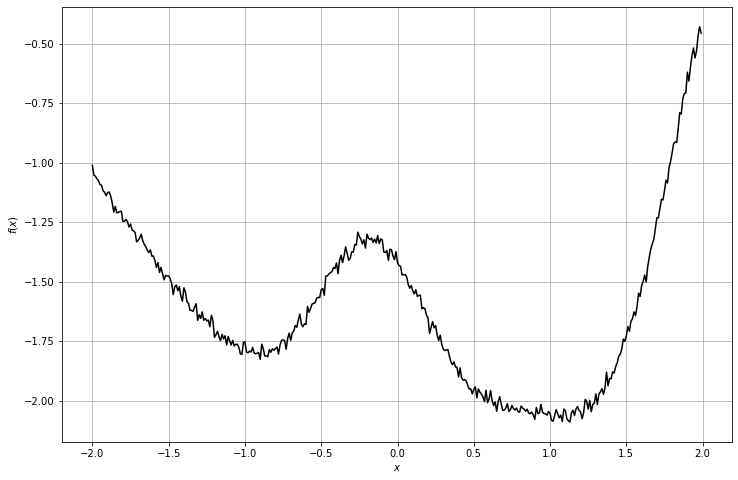

context_x =  (1, 44, 1)
context_y =  (1, 44, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


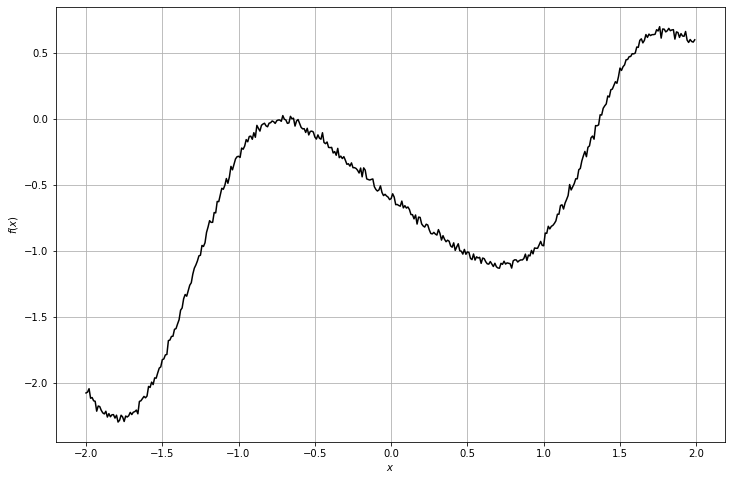

context_x =  (1, 70, 1)
context_y =  (1, 70, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


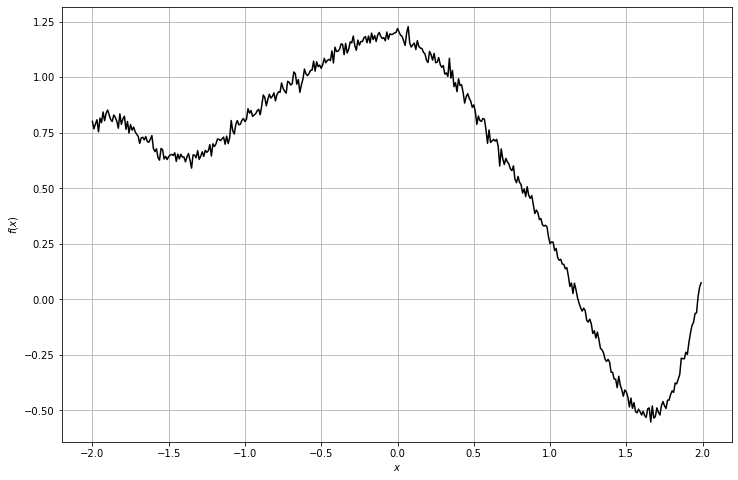

context_x =  (1, 5, 1)
context_y =  (1, 5, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


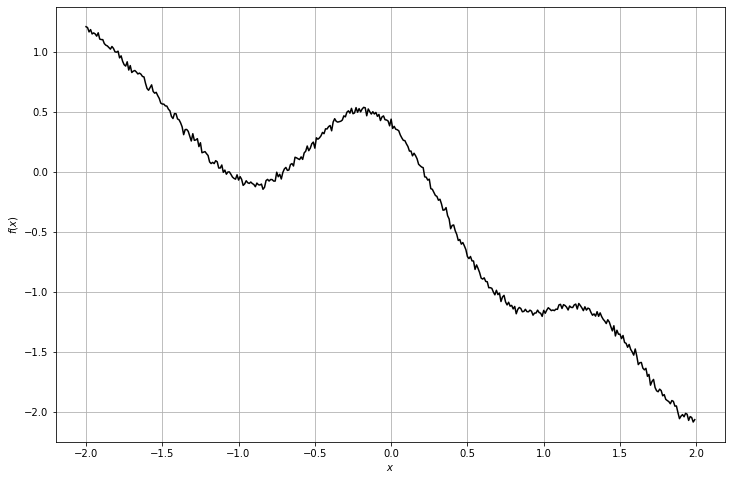

context_x =  (1, 6, 1)
context_y =  (1, 6, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


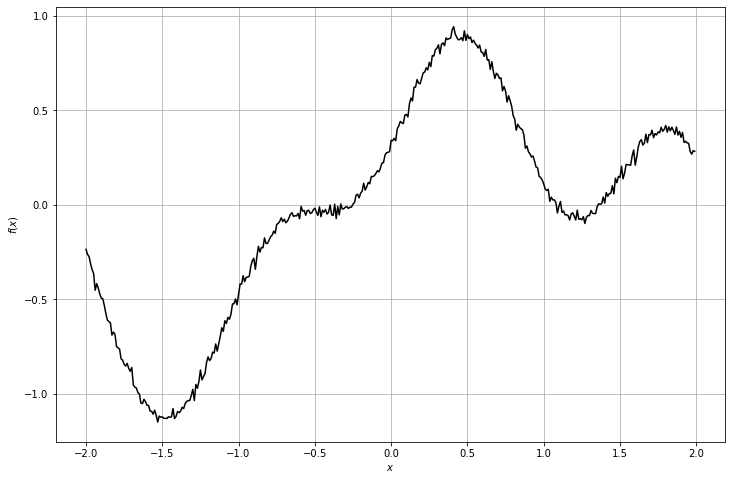

context_x =  (1, 17, 1)
context_y =  (1, 17, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


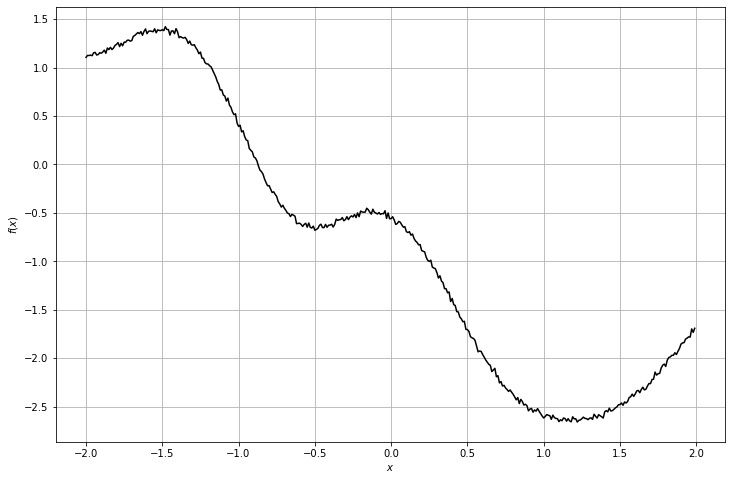

context_x =  (1, 97, 1)
context_y =  (1, 97, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


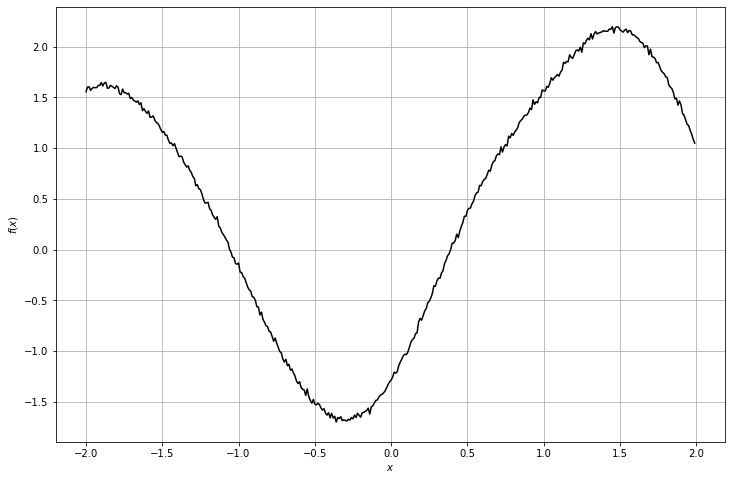

context_x =  (1, 77, 1)
context_y =  (1, 77, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


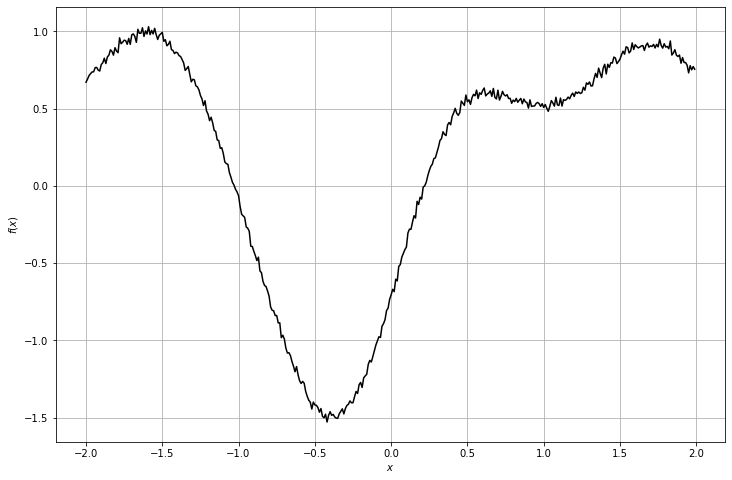

context_x =  (1, 83, 1)
context_y =  (1, 83, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


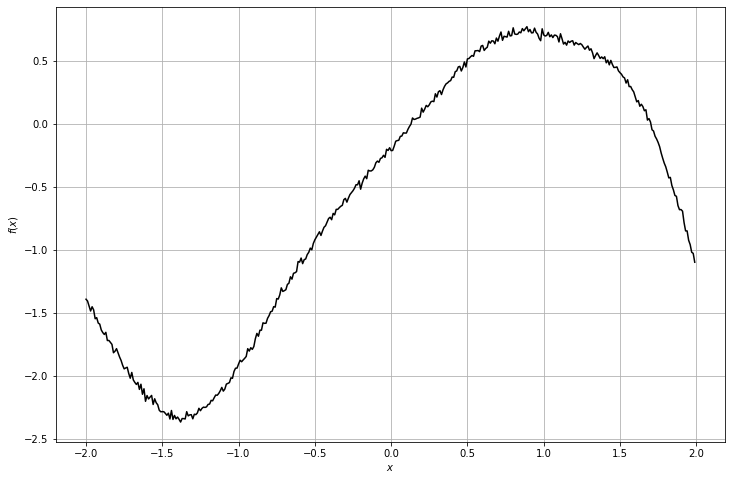

context_x =  (1, 47, 1)
context_y =  (1, 47, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


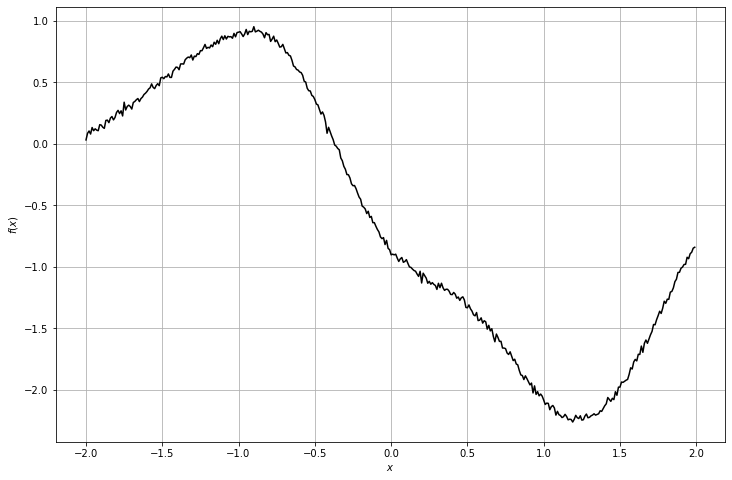

context_x =  (1, 14, 1)
context_y =  (1, 14, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


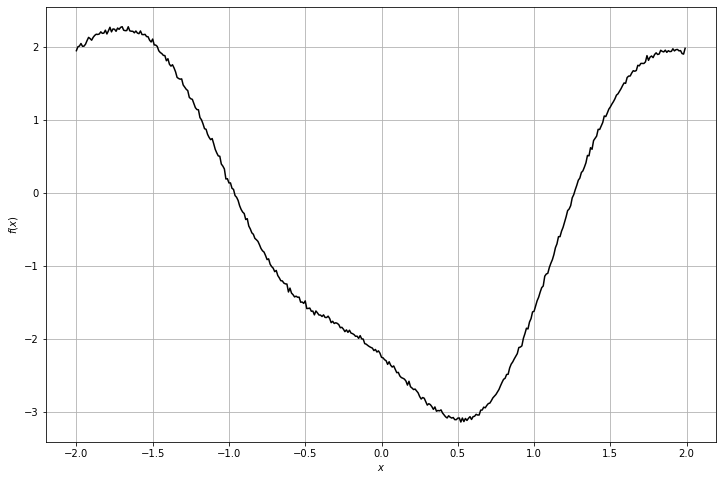

context_x =  (1, 44, 1)
context_y =  (1, 44, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


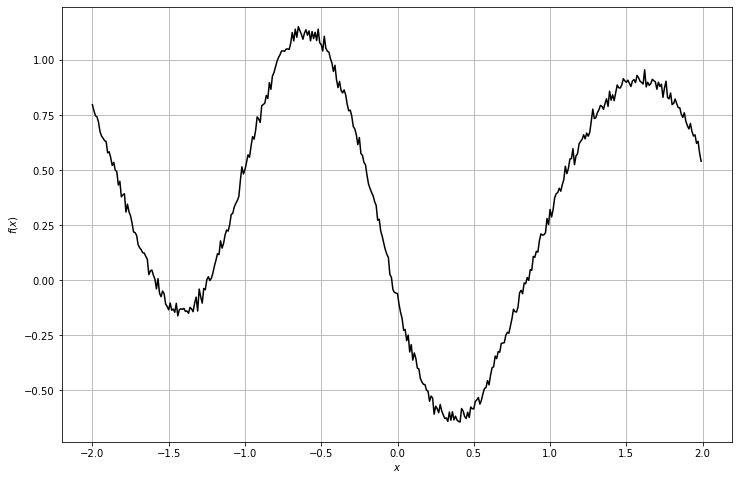

context_x =  (1, 88, 1)
context_y =  (1, 88, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


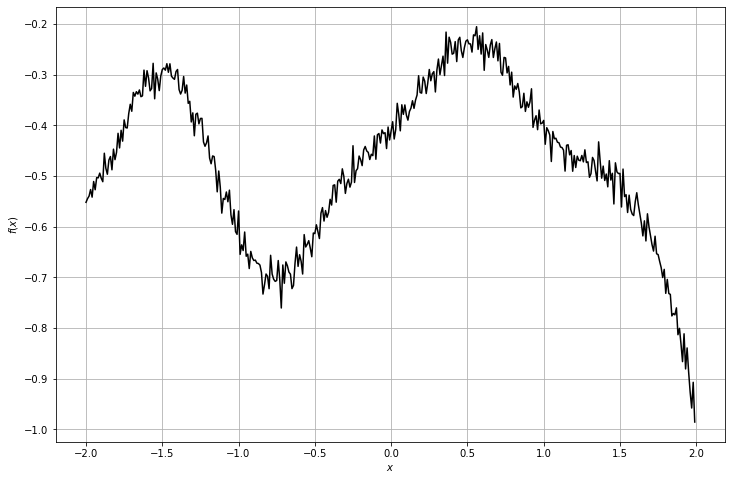

context_x =  (1, 32, 1)
context_y =  (1, 32, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


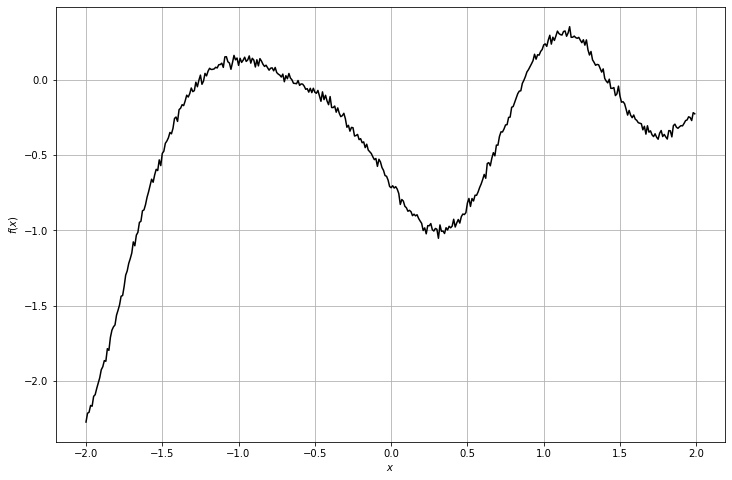

context_x =  (1, 7, 1)
context_y =  (1, 7, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


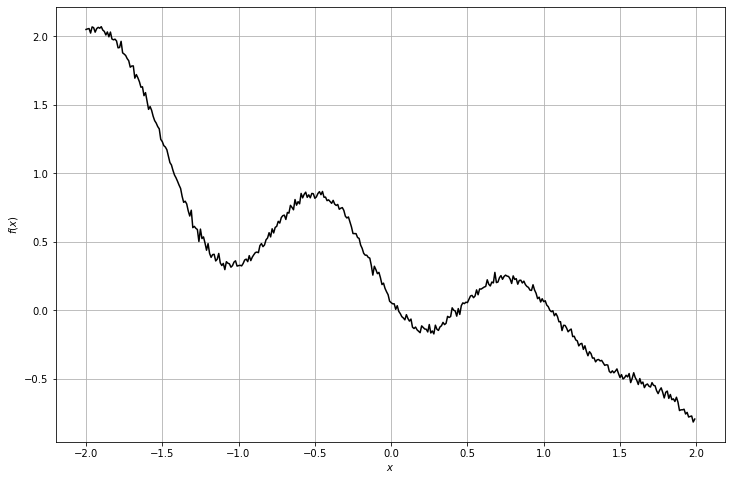

context_x =  (1, 61, 1)
context_y =  (1, 61, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


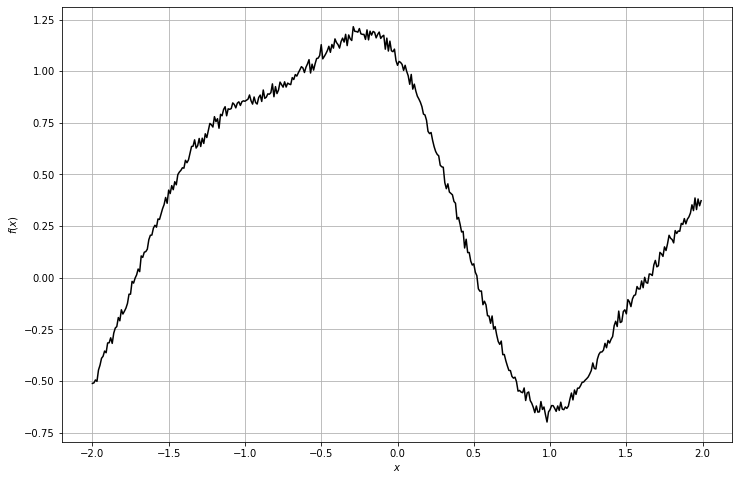

context_x =  (1, 74, 1)
context_y =  (1, 74, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


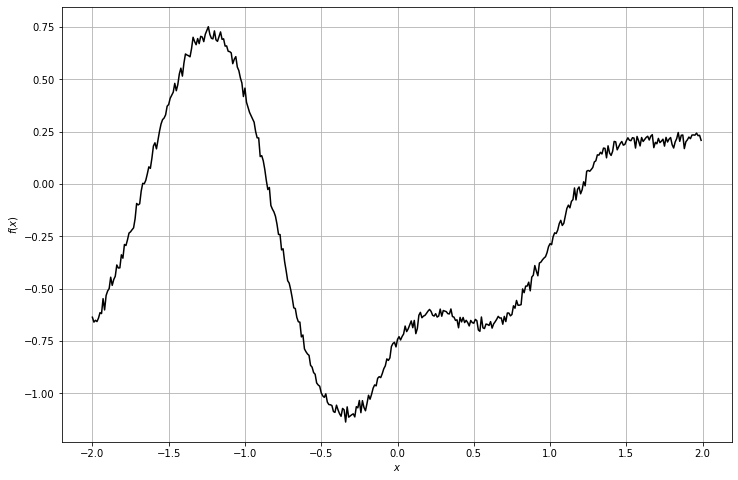

context_x =  (1, 78, 1)
context_y =  (1, 78, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


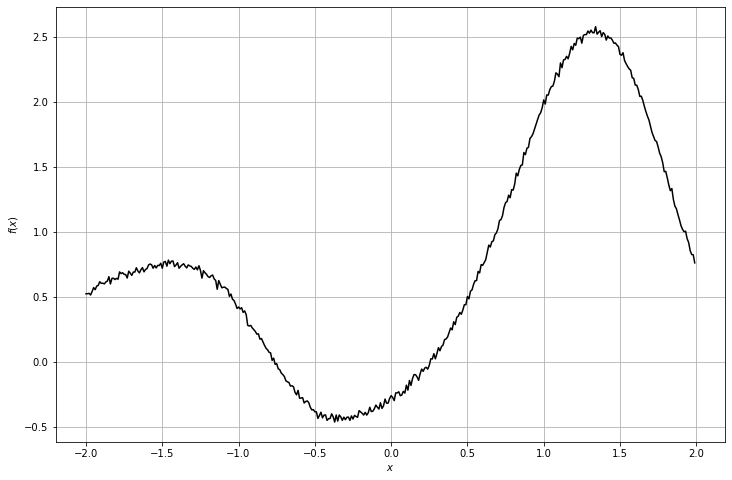

context_x =  (1, 74, 1)
context_y =  (1, 74, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


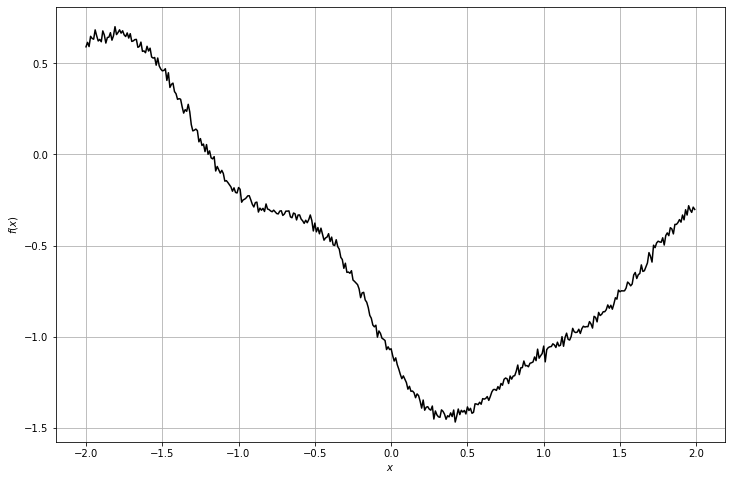

context_x =  (1, 62, 1)
context_y =  (1, 62, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


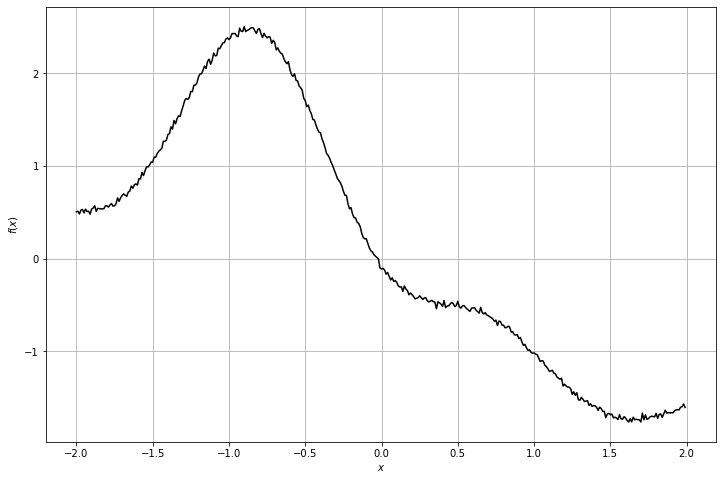

context_x =  (1, 68, 1)
context_y =  (1, 68, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


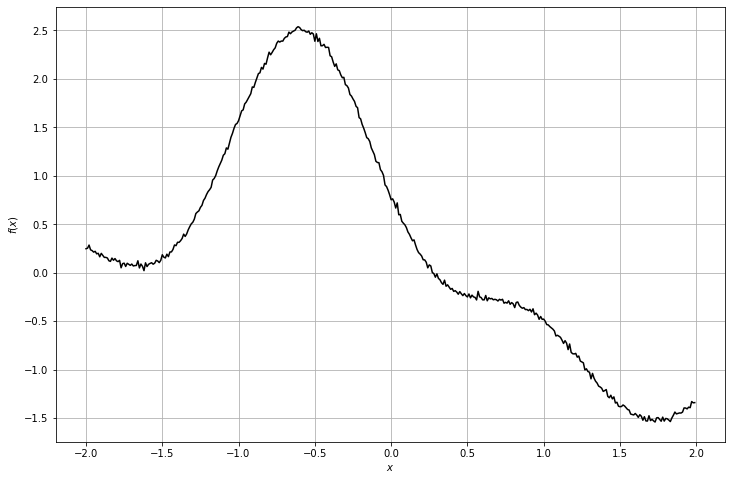

context_x =  (1, 71, 1)
context_y =  (1, 71, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


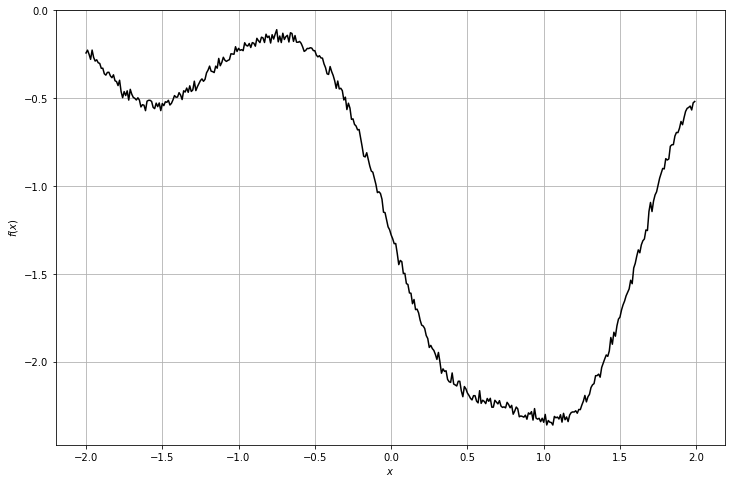

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


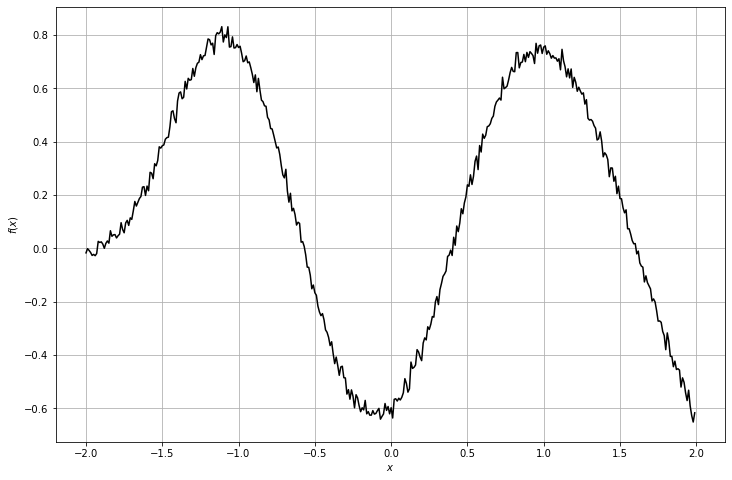

context_x =  (1, 32, 1)
context_y =  (1, 32, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


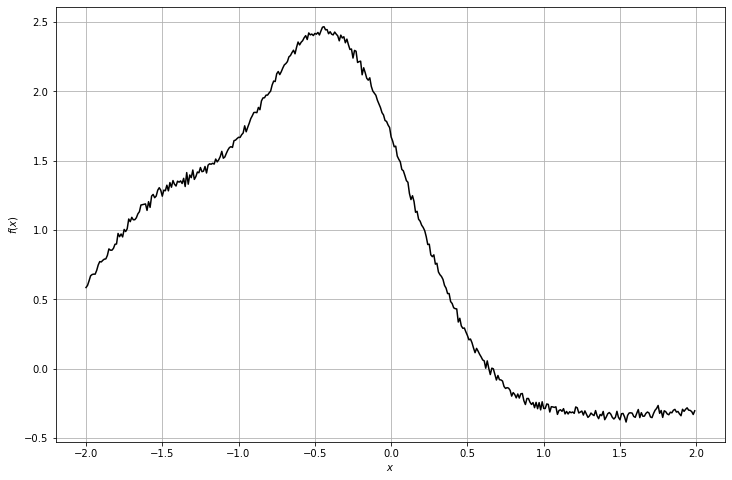

context_x =  (1, 45, 1)
context_y =  (1, 45, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


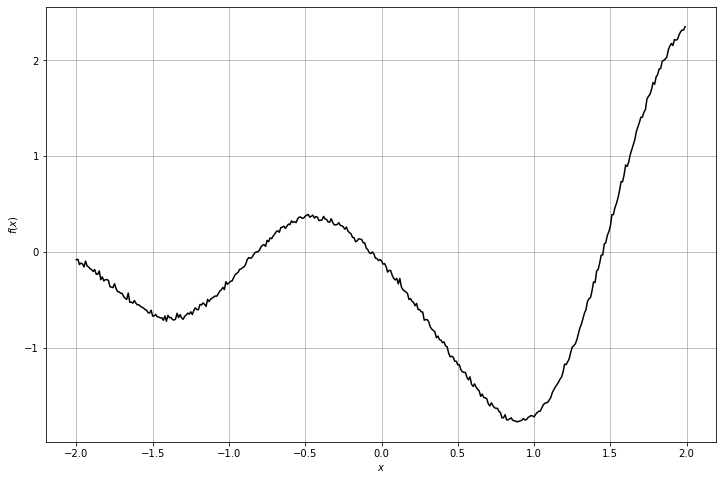

context_x =  (1, 38, 1)
context_y =  (1, 38, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


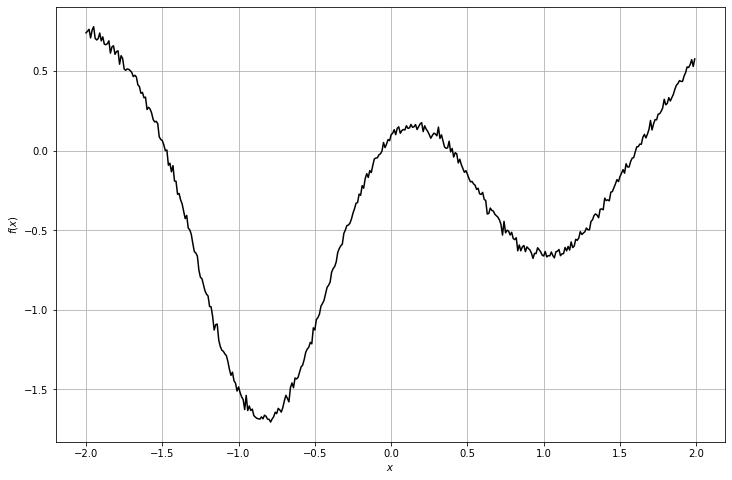

context_x =  (1, 25, 1)
context_y =  (1, 25, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


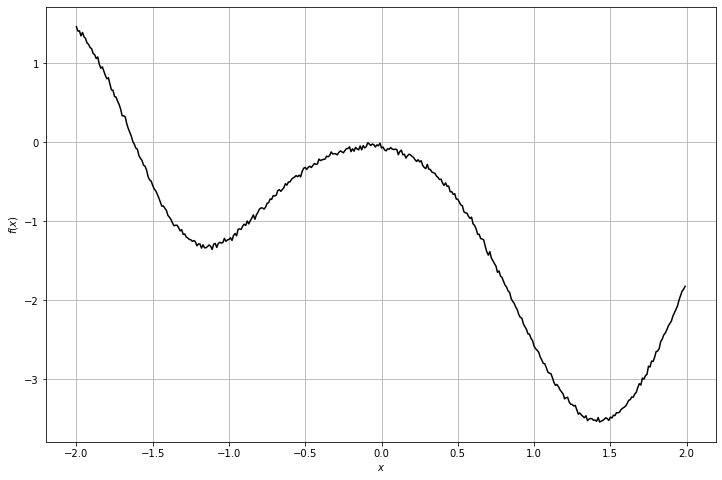

context_x =  (1, 74, 1)
context_y =  (1, 74, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


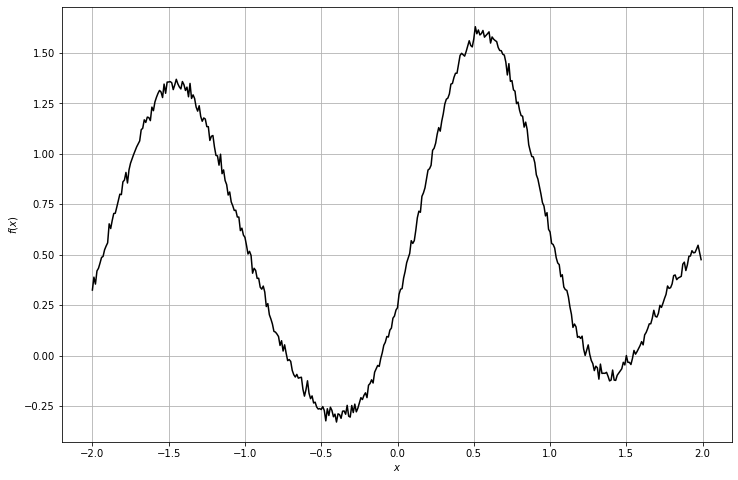

context_x =  (1, 46, 1)
context_y =  (1, 46, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


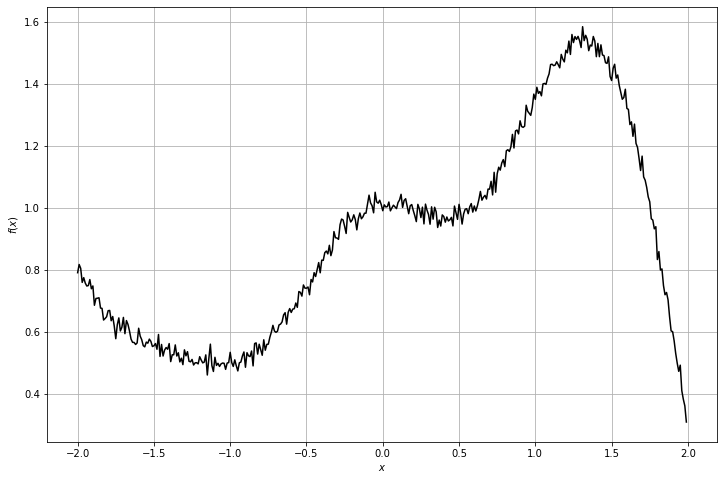

context_x =  (1, 81, 1)
context_y =  (1, 81, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


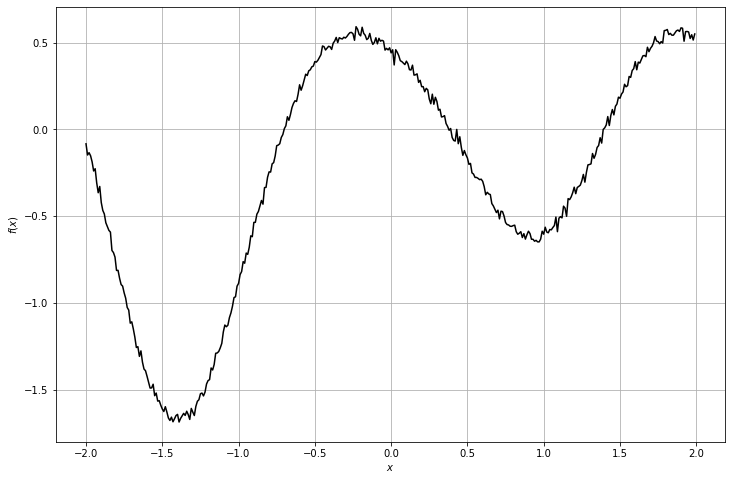

context_x =  (1, 67, 1)
context_y =  (1, 67, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


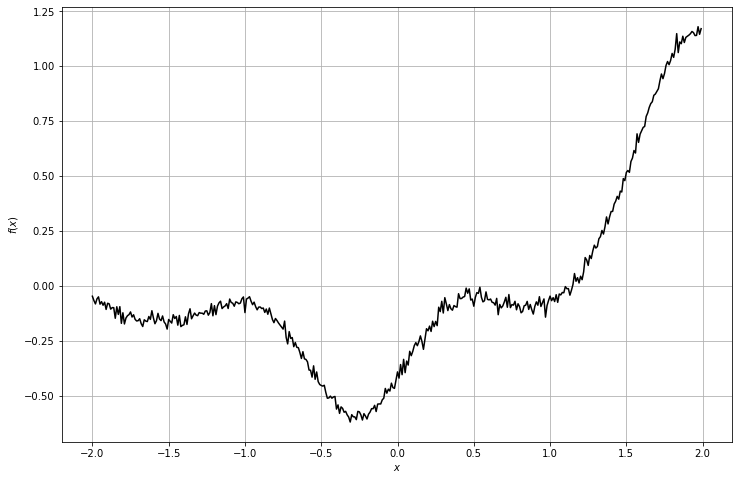

context_x =  (1, 66, 1)
context_y =  (1, 66, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


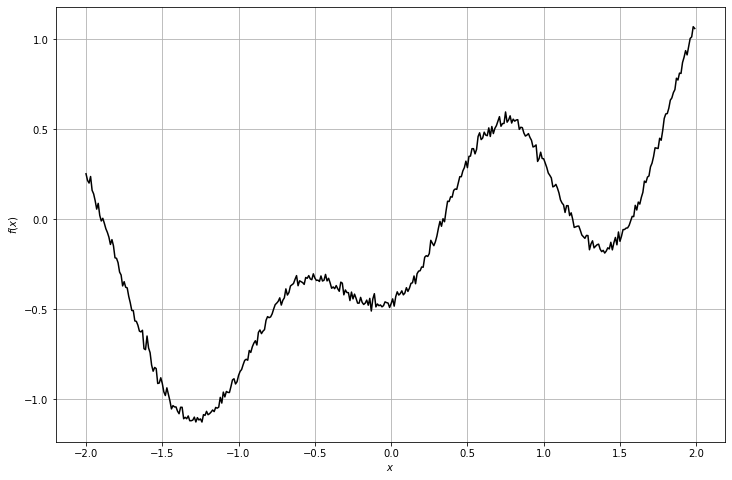

context_x =  (1, 30, 1)
context_y =  (1, 30, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


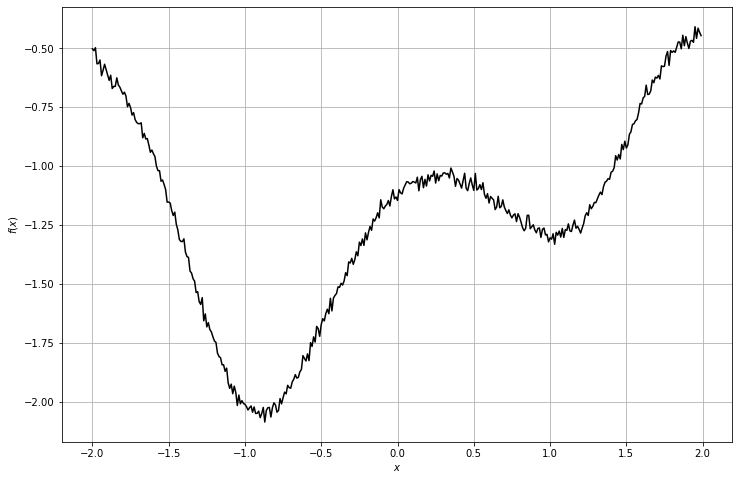

context_x =  (1, 89, 1)
context_y =  (1, 89, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


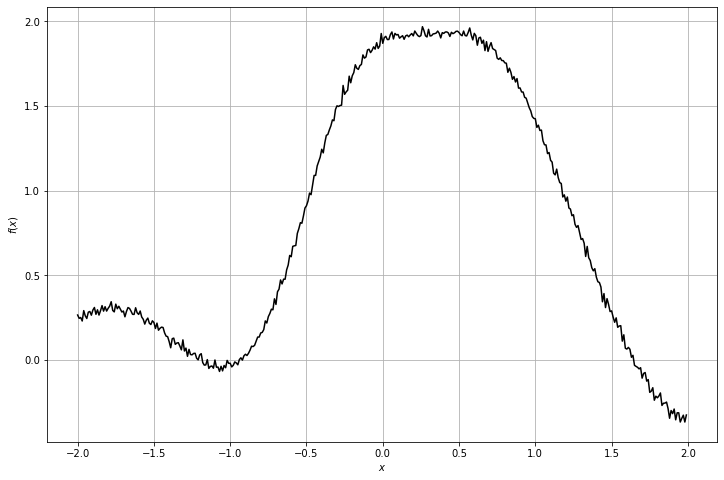

context_x =  (1, 52, 1)
context_y =  (1, 52, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


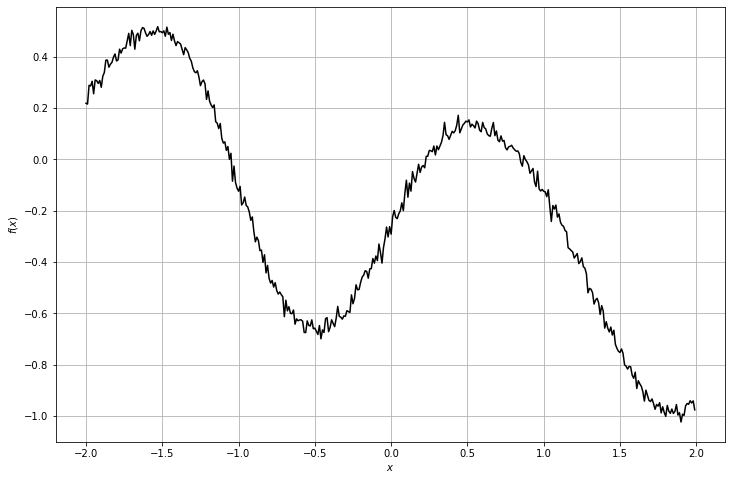

context_x =  (1, 34, 1)
context_y =  (1, 34, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


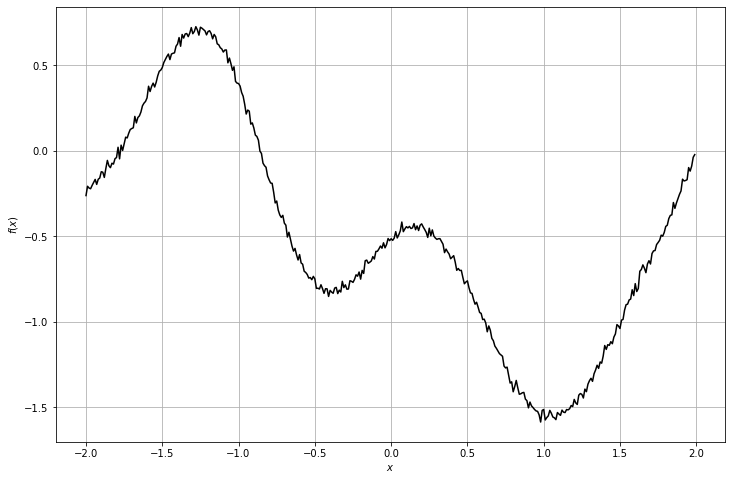

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


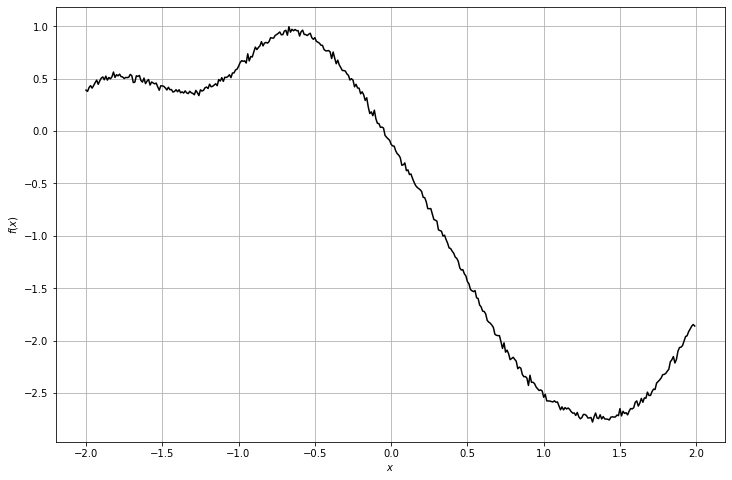

context_x =  (1, 79, 1)
context_y =  (1, 79, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


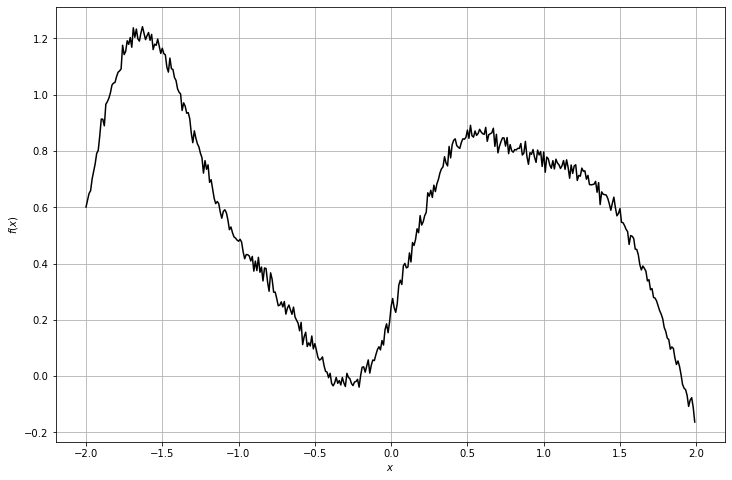

context_x =  (1, 42, 1)
context_y =  (1, 42, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


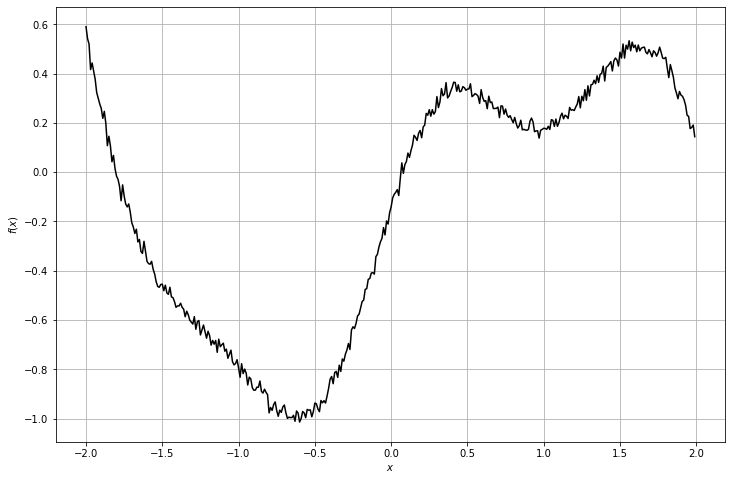

context_x =  (1, 76, 1)
context_y =  (1, 76, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


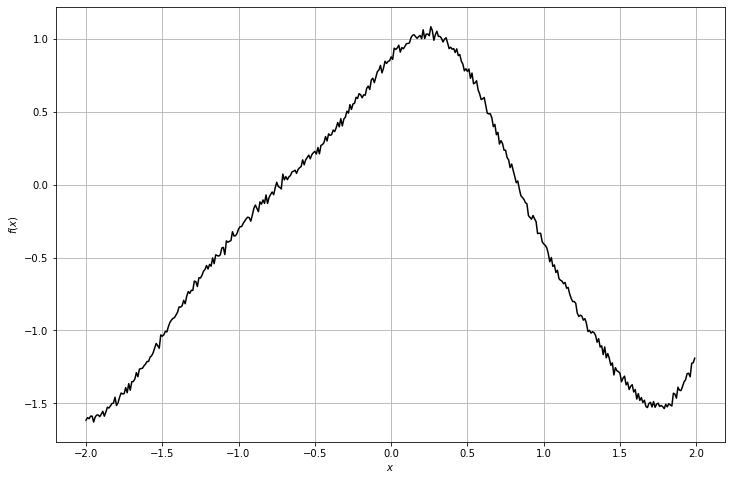

context_x =  (1, 82, 1)
context_y =  (1, 82, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


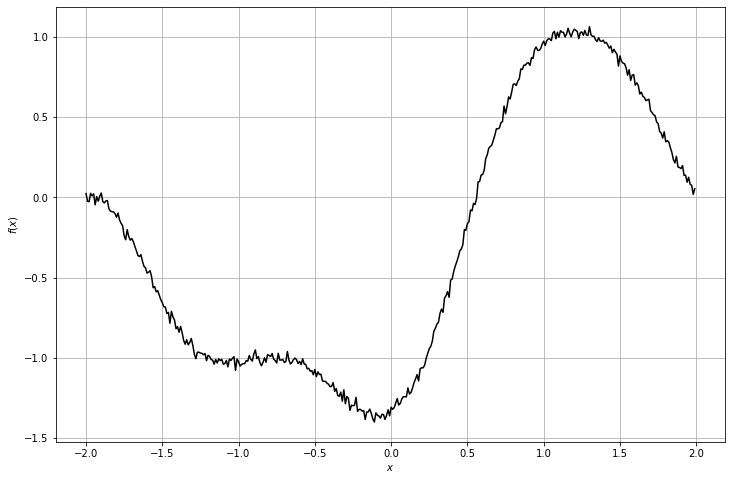

context_x =  (1, 49, 1)
context_y =  (1, 49, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


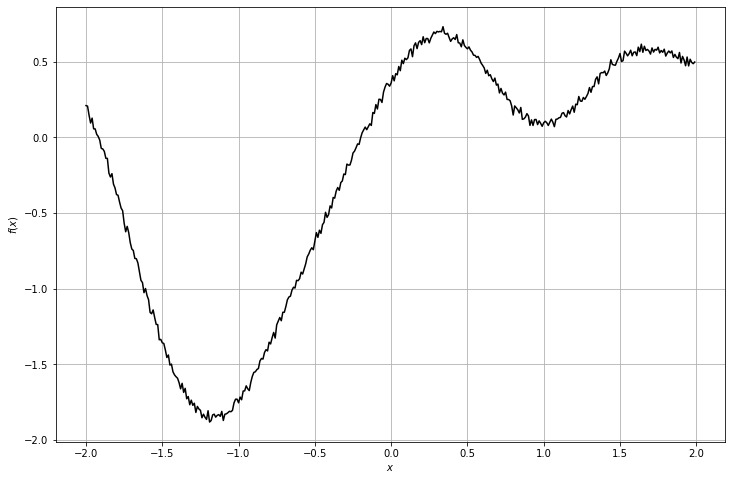

context_x =  (1, 96, 1)
context_y =  (1, 96, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


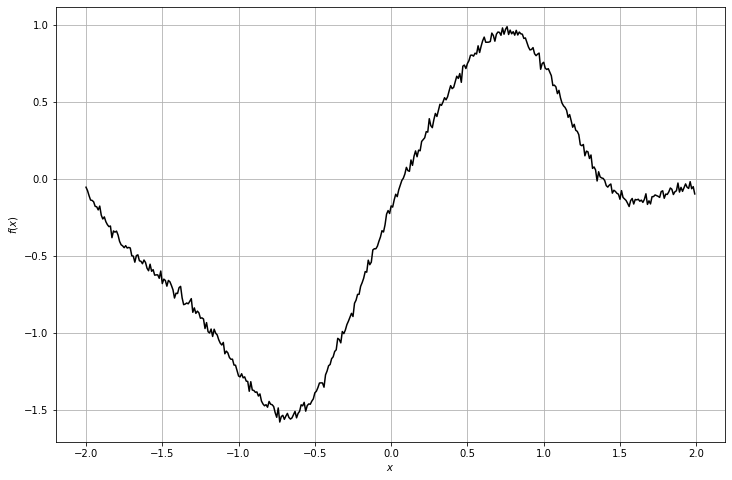

context_x =  (1, 20, 1)
context_y =  (1, 20, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


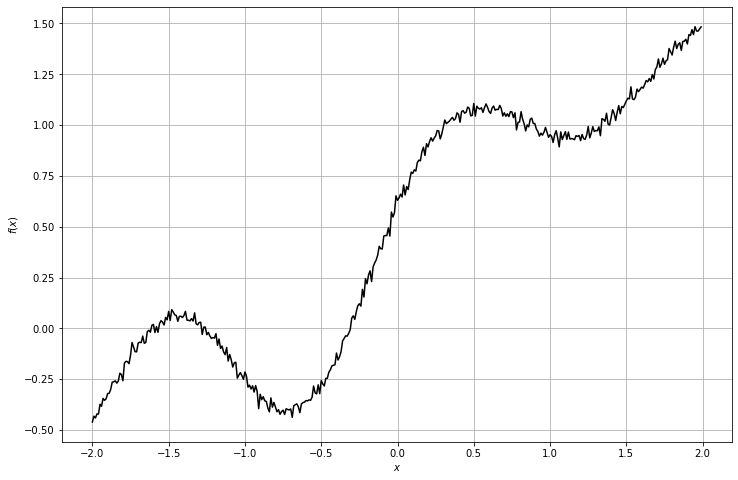

context_x =  (1, 78, 1)
context_y =  (1, 78, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


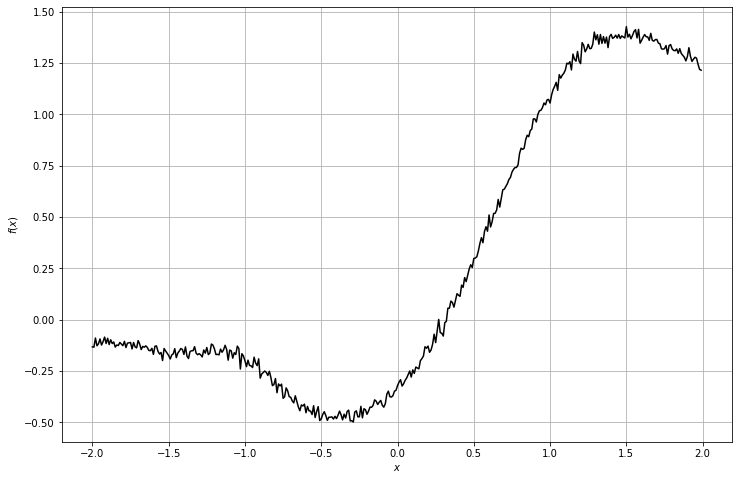

context_x =  (1, 51, 1)
context_y =  (1, 51, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


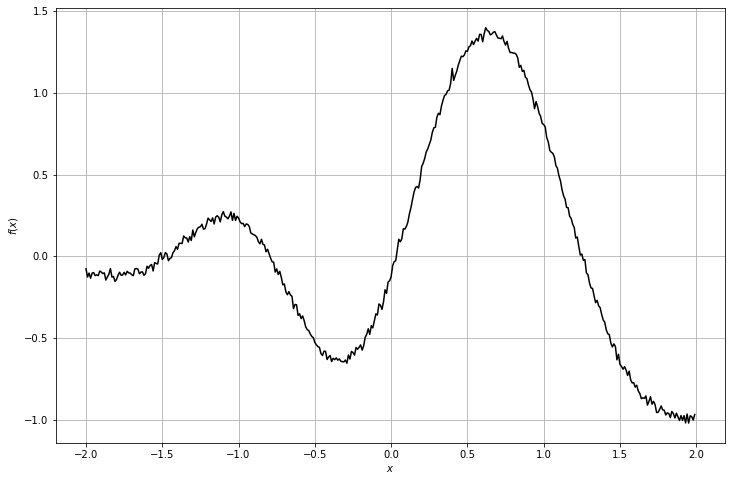

context_x =  (1, 68, 1)
context_y =  (1, 68, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


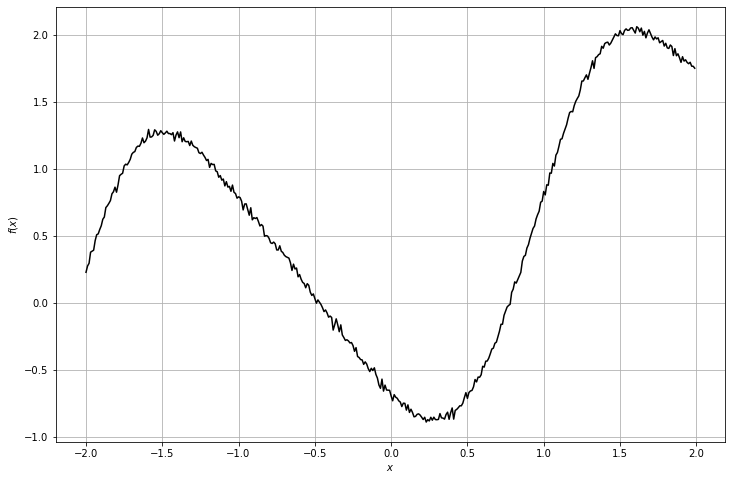

context_x =  (1, 94, 1)
context_y =  (1, 94, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


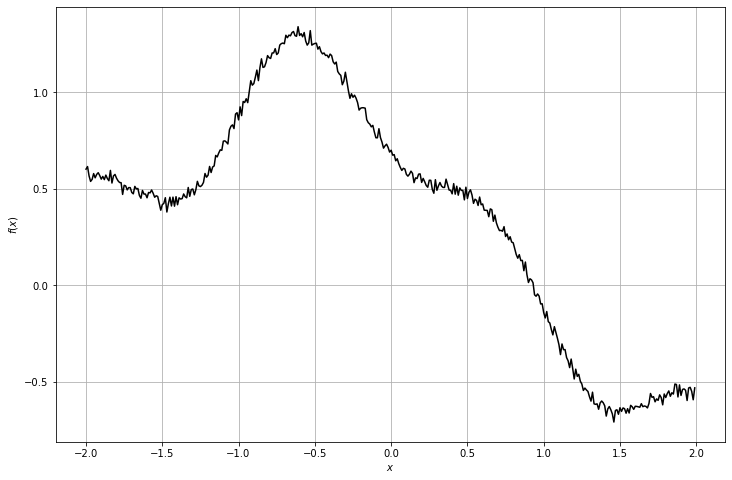

context_x =  (1, 68, 1)
context_y =  (1, 68, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


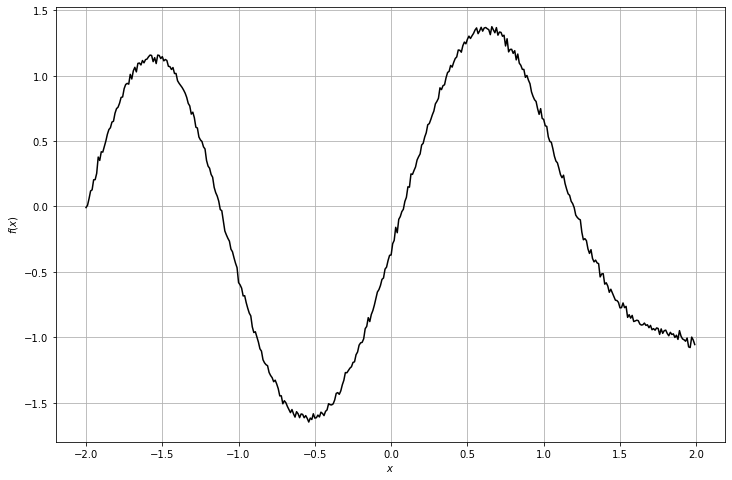

context_x =  (1, 43, 1)
context_y =  (1, 43, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


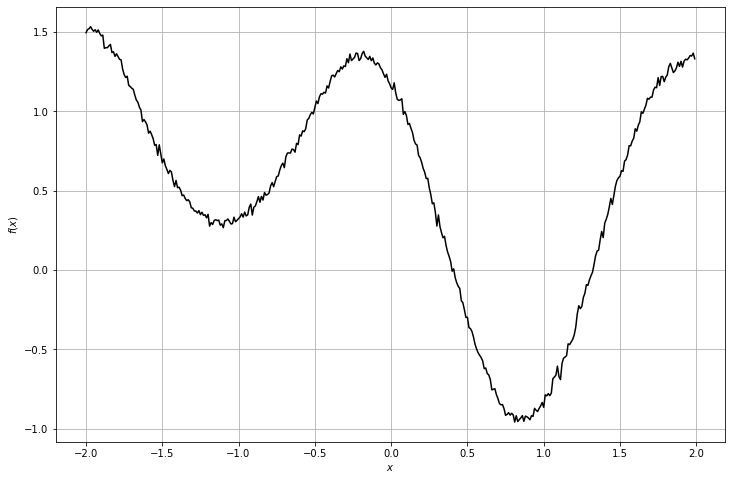

context_x =  (1, 89, 1)
context_y =  (1, 89, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


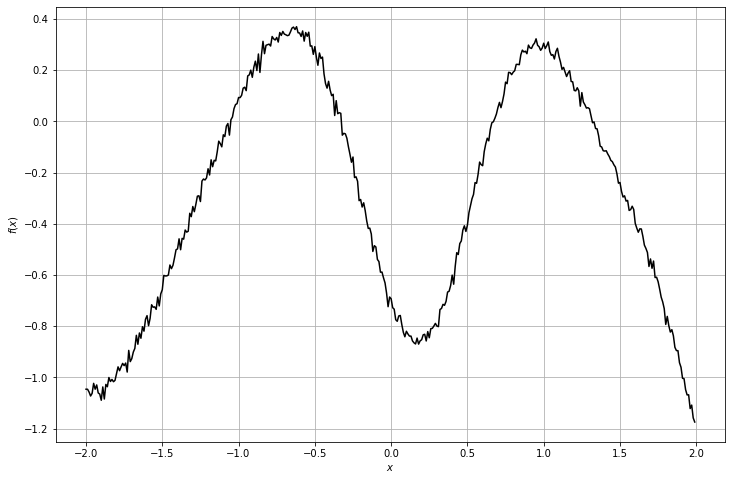

context_x =  (1, 70, 1)
context_y =  (1, 70, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


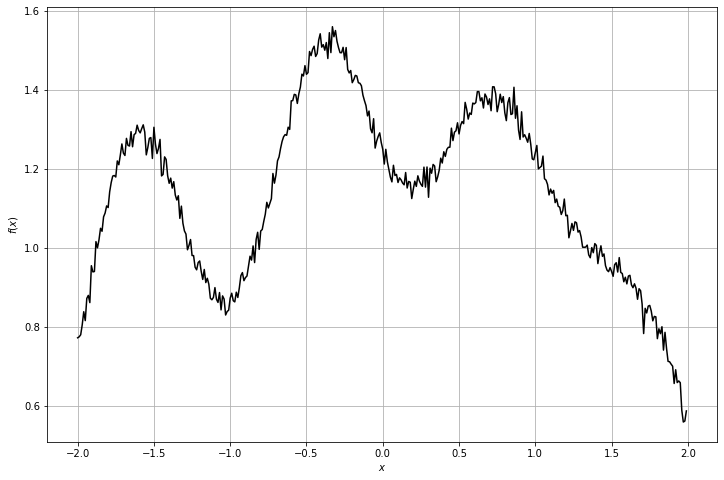

context_x =  (1, 24, 1)
context_y =  (1, 24, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


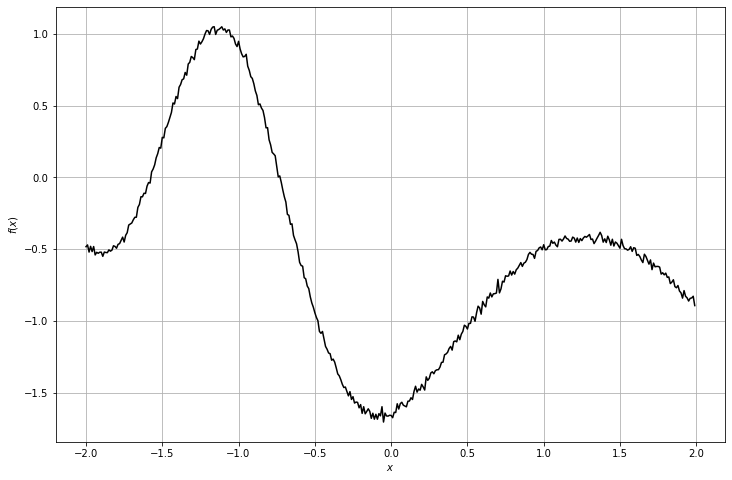

context_x =  (1, 69, 1)
context_y =  (1, 69, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


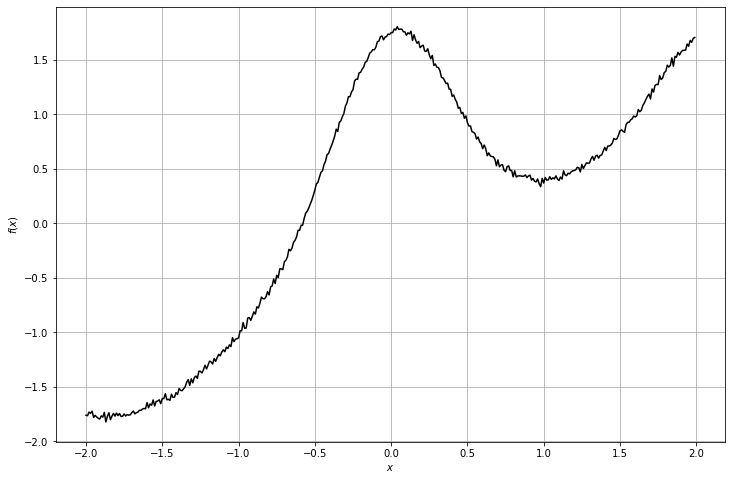

context_x =  (1, 49, 1)
context_y =  (1, 49, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


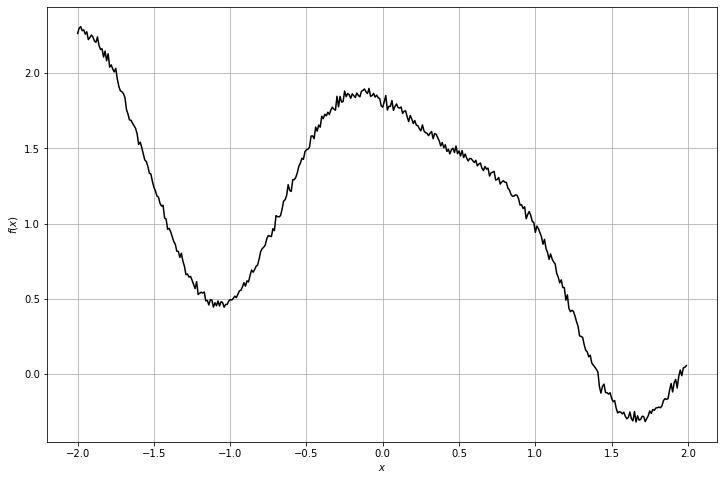

context_x =  (1, 17, 1)
context_y =  (1, 17, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


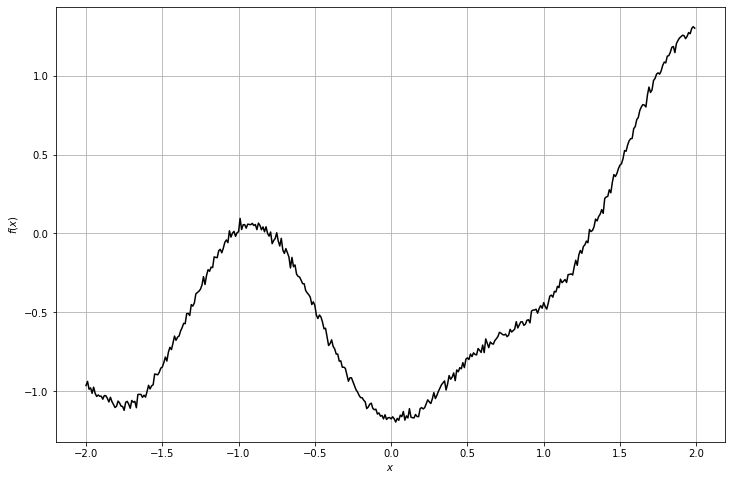

context_x =  (1, 84, 1)
context_y =  (1, 84, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


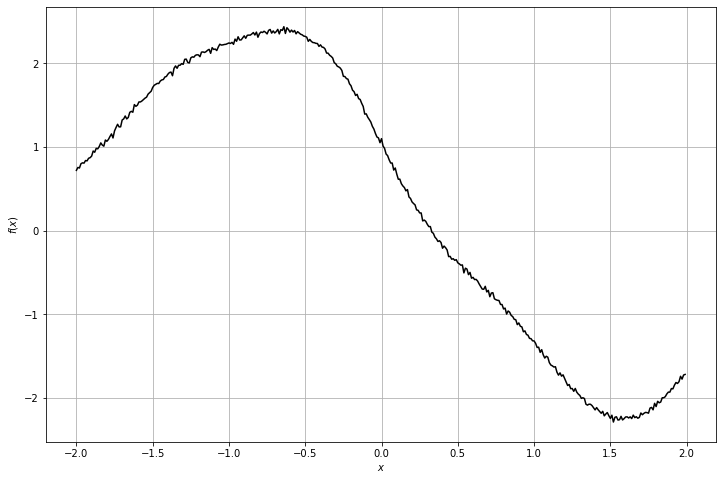

context_x =  (1, 66, 1)
context_y =  (1, 66, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


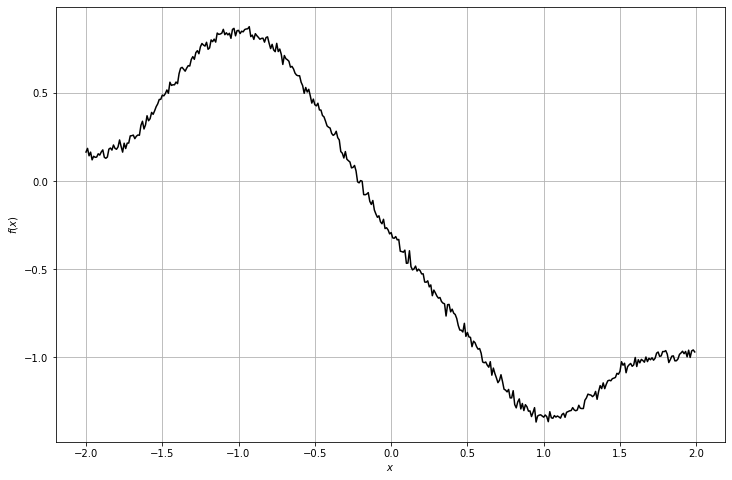

context_x =  (1, 46, 1)
context_y =  (1, 46, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


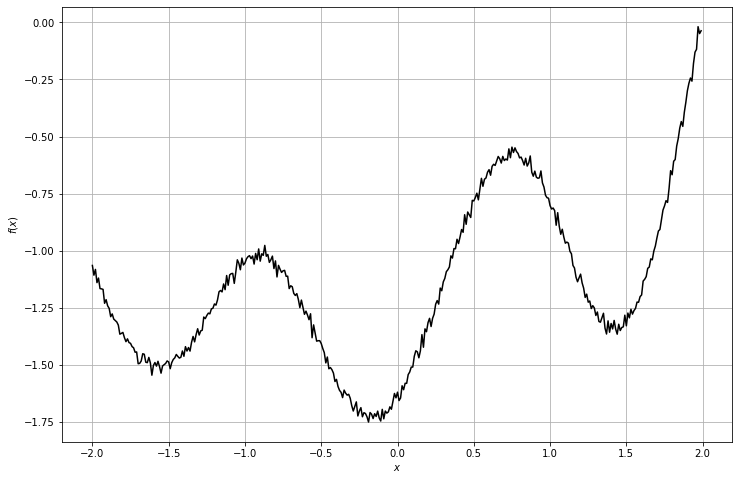

context_x =  (1, 89, 1)
context_y =  (1, 89, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


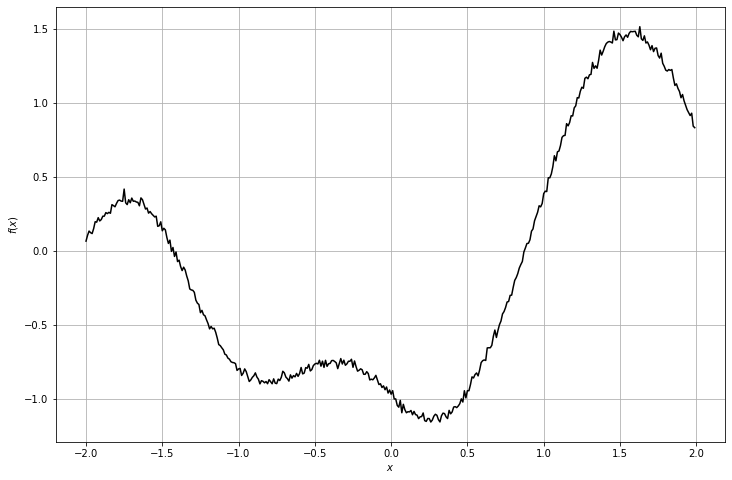

context_x =  (1, 31, 1)
context_y =  (1, 31, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


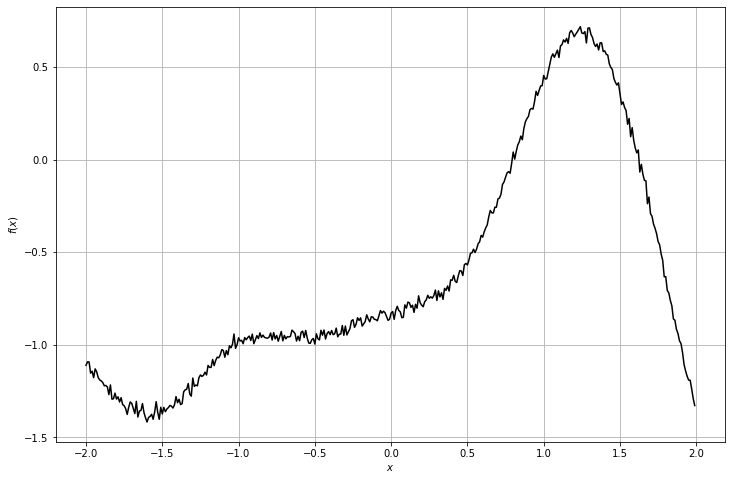

context_x =  (1, 24, 1)
context_y =  (1, 24, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


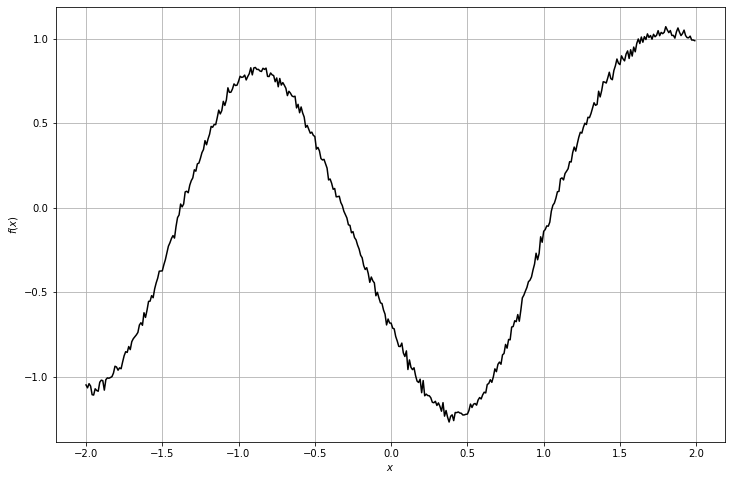

context_x =  (1, 78, 1)
context_y =  (1, 78, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


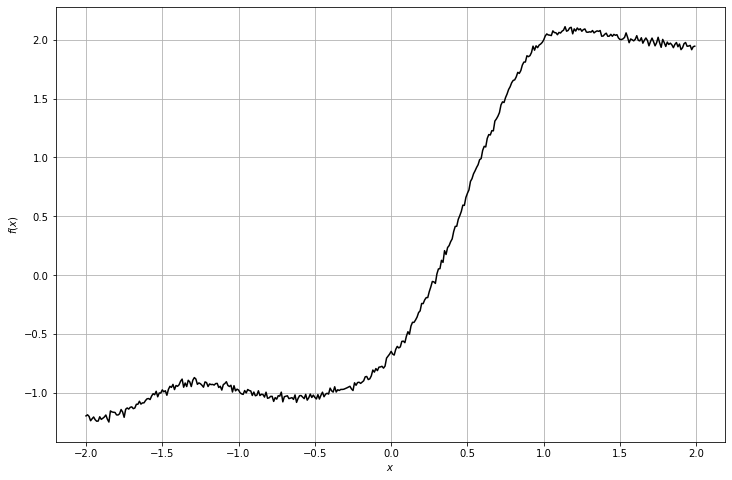

context_x =  (1, 40, 1)
context_y =  (1, 40, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


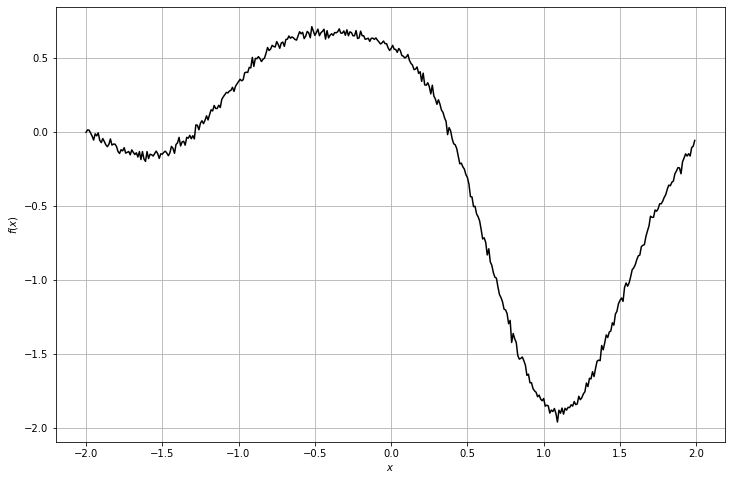

context_x =  (1, 21, 1)
context_y =  (1, 21, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


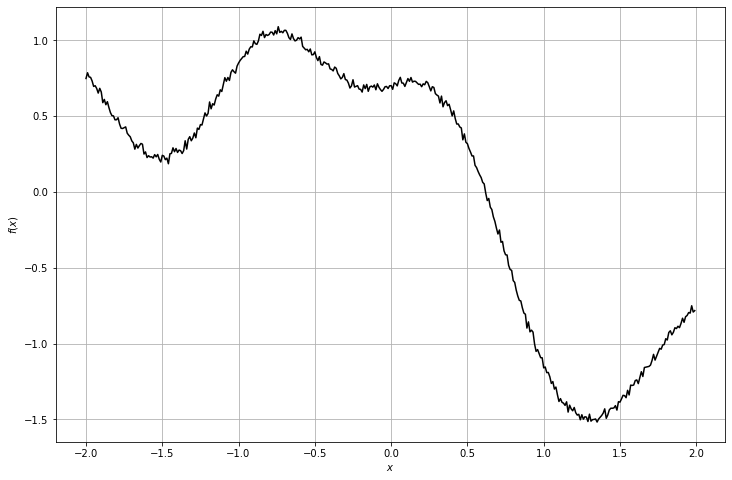

context_x =  (1, 14, 1)
context_y =  (1, 14, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


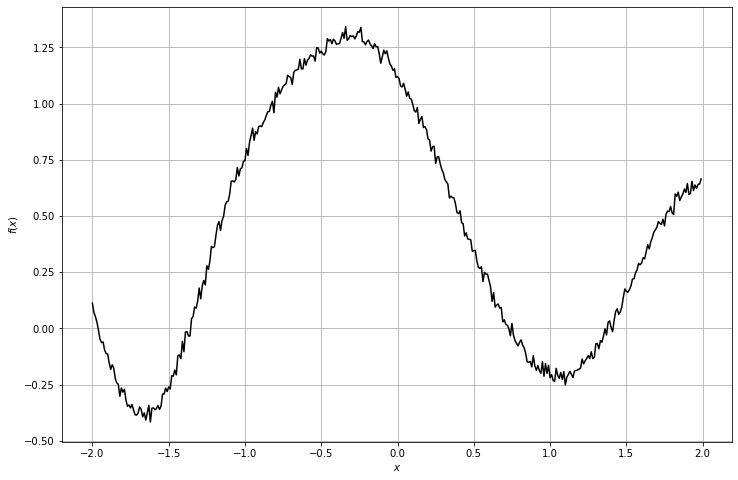

context_x =  (1, 13, 1)
context_y =  (1, 13, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


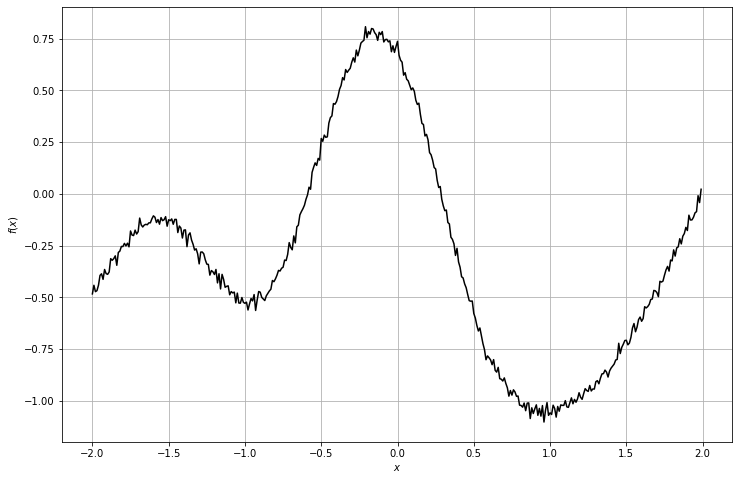

context_x =  (1, 91, 1)
context_y =  (1, 91, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


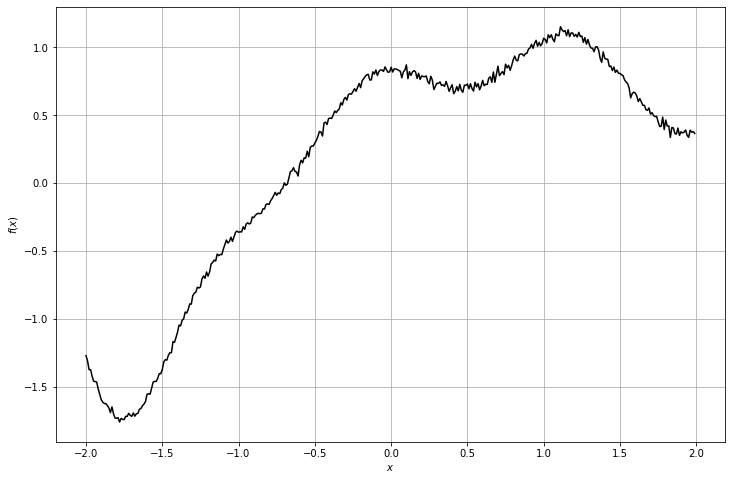

context_x =  (1, 39, 1)
context_y =  (1, 39, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


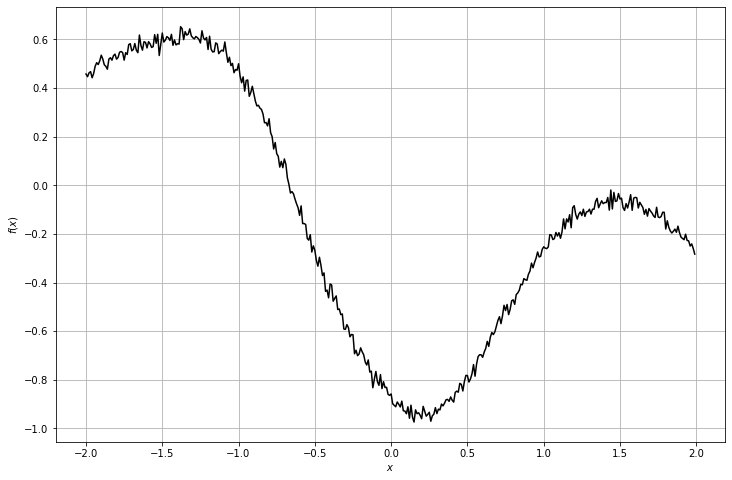

context_x =  (1, 99, 1)
context_y =  (1, 99, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


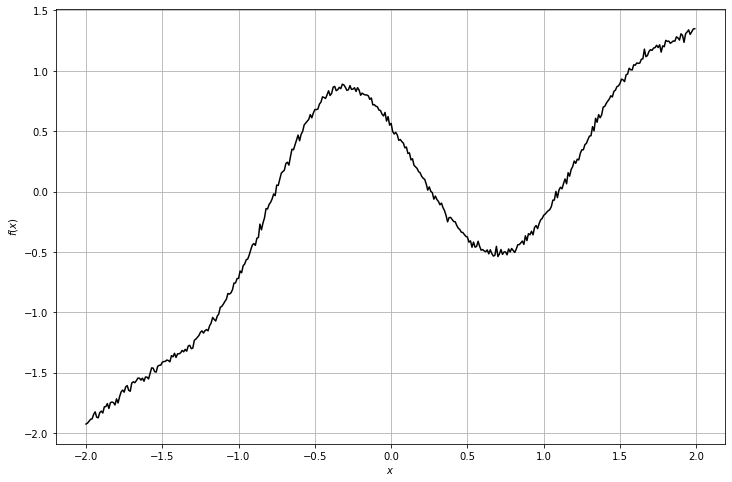

context_x =  (1, 28, 1)
context_y =  (1, 28, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


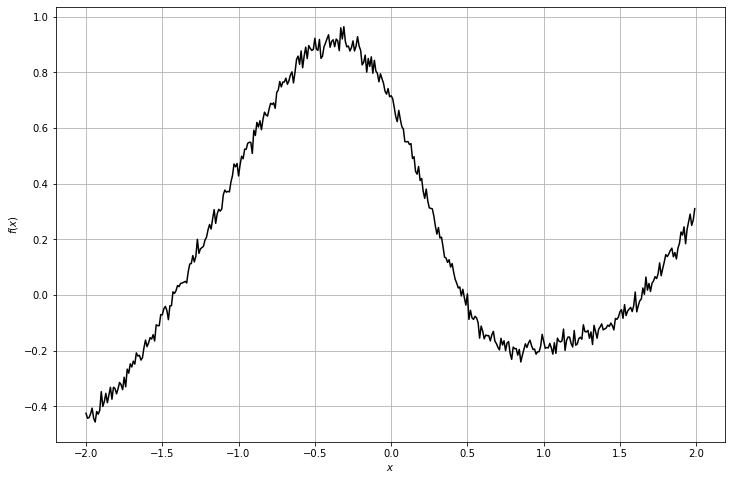

context_x =  (1, 72, 1)
context_y =  (1, 72, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


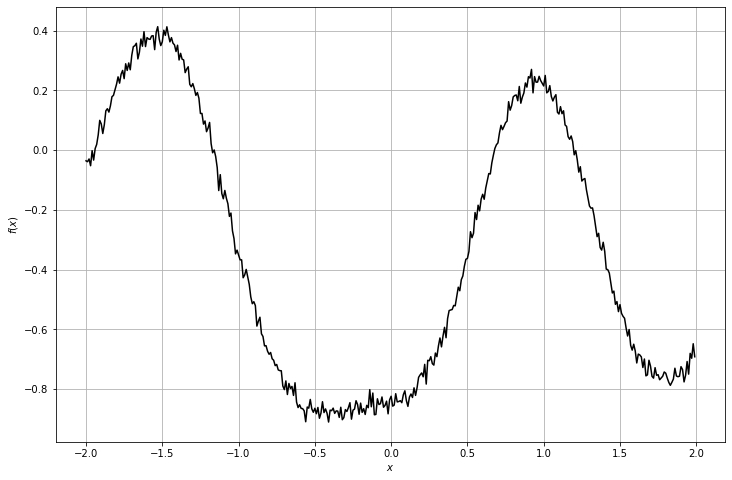

context_x =  (1, 74, 1)
context_y =  (1, 74, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


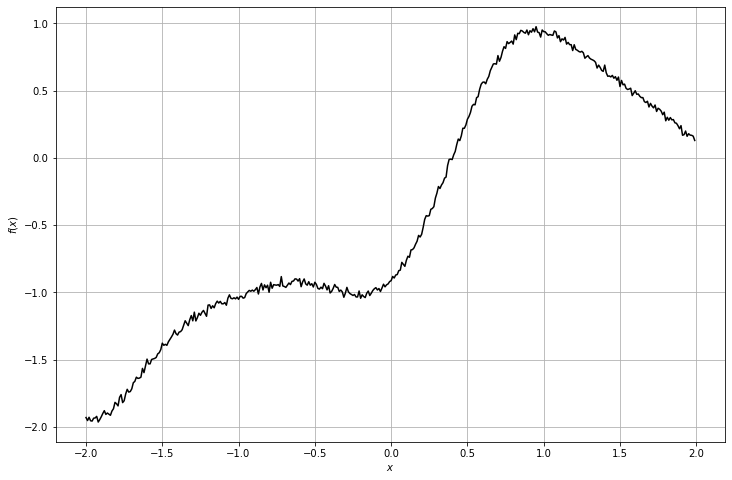

context_x =  (1, 49, 1)
context_y =  (1, 49, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


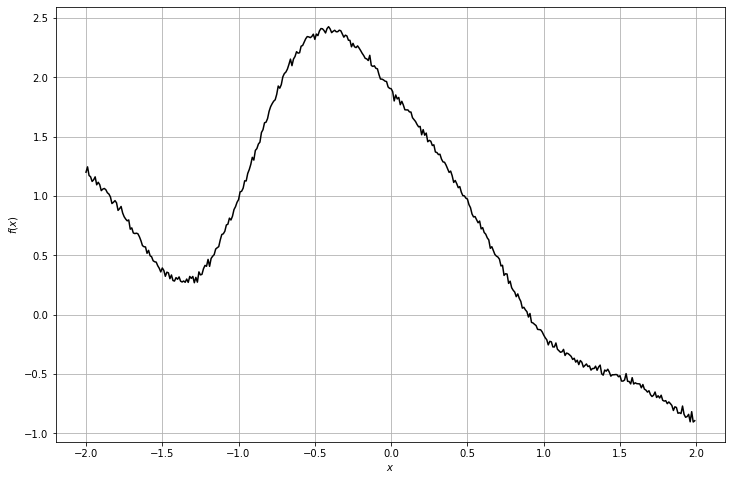

context_x =  (1, 78, 1)
context_y =  (1, 78, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


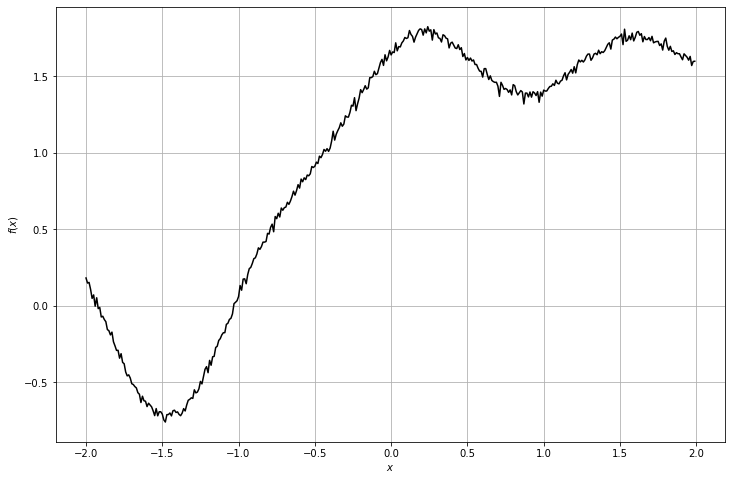

context_x =  (1, 29, 1)
context_y =  (1, 29, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


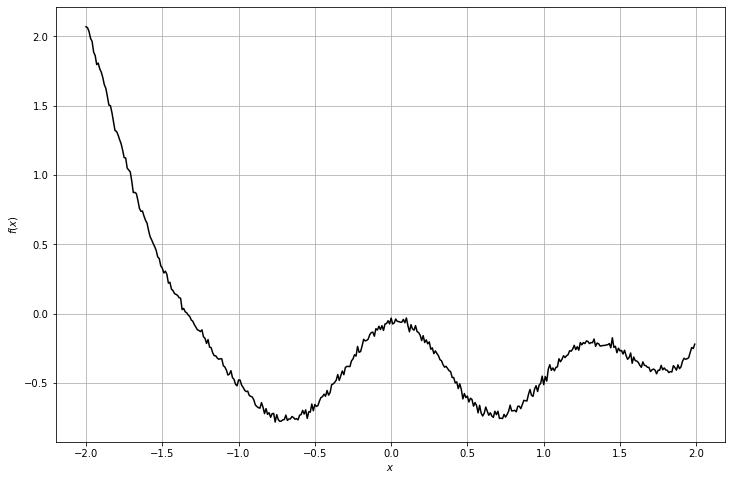

context_x =  (1, 50, 1)
context_y =  (1, 50, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


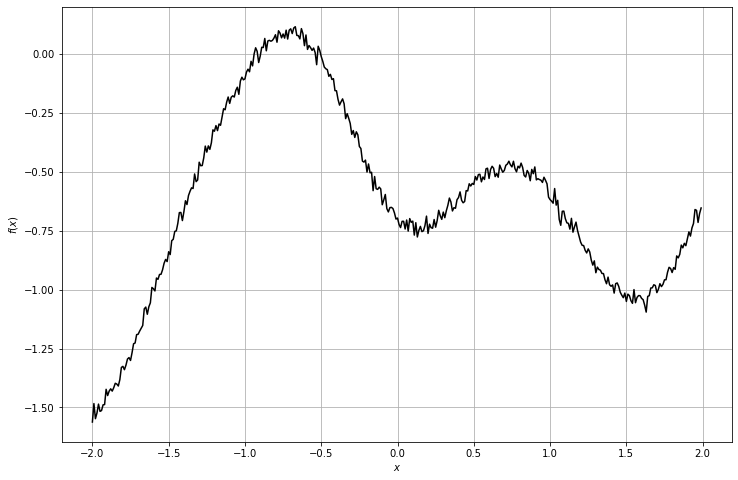

context_x =  (1, 72, 1)
context_y =  (1, 72, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


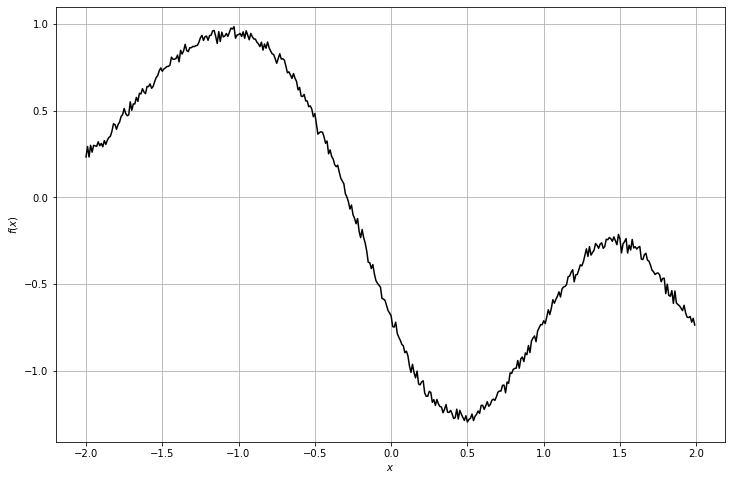

context_x =  (1, 66, 1)
context_y =  (1, 66, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


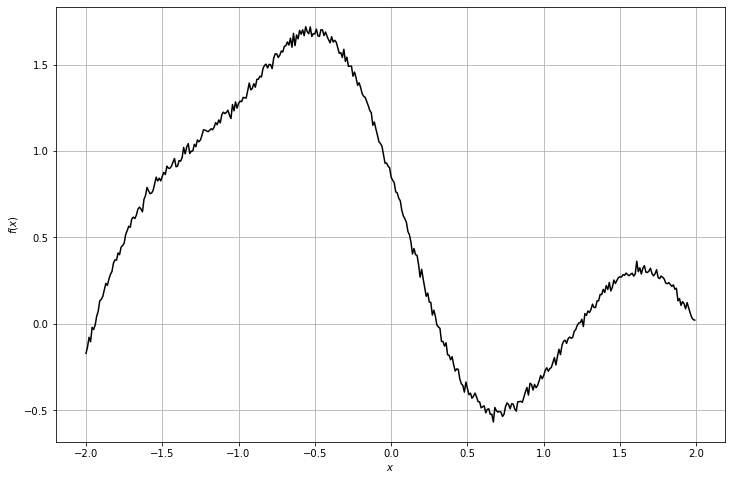

context_x =  (1, 9, 1)
context_y =  (1, 9, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


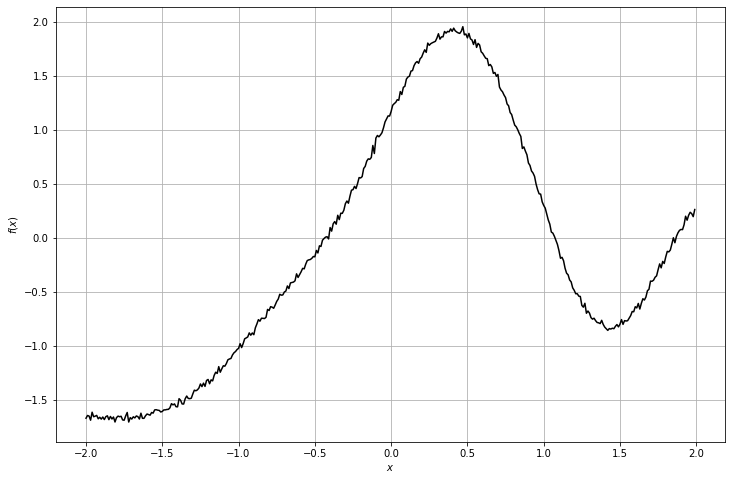

context_x =  (1, 68, 1)
context_y =  (1, 68, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


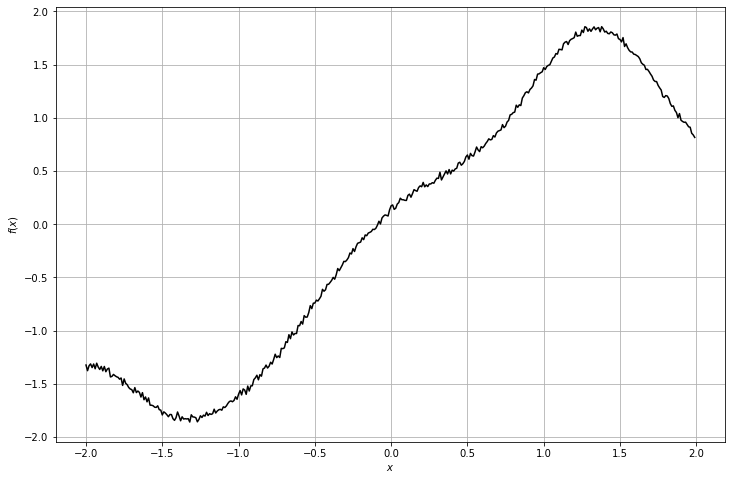

context_x =  (1, 97, 1)
context_y =  (1, 97, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


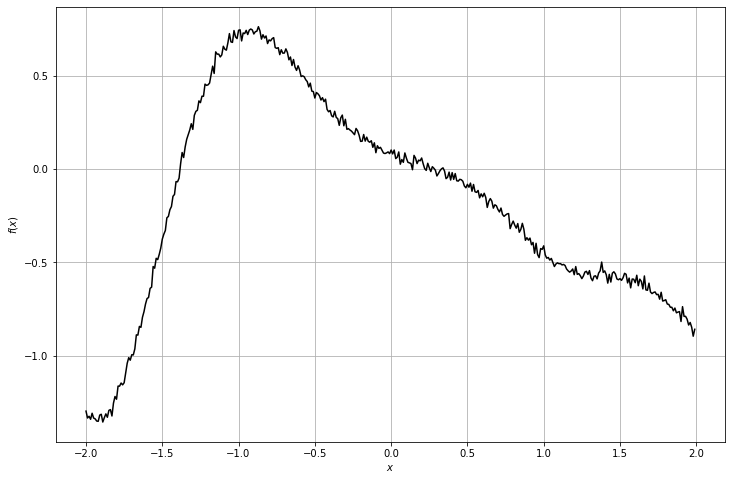

context_x =  (1, 25, 1)
context_y =  (1, 25, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


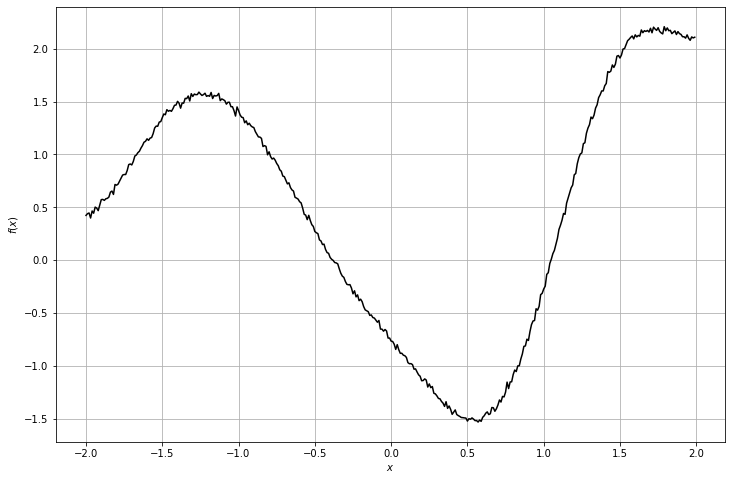

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


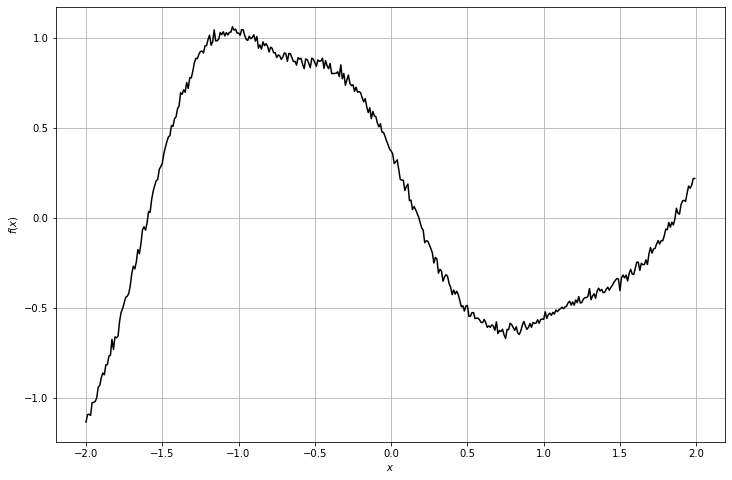

context_x =  (1, 42, 1)
context_y =  (1, 42, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


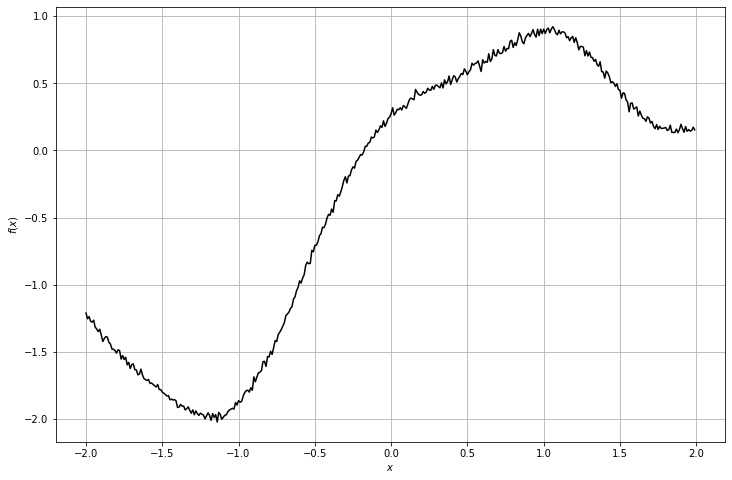

context_x =  (1, 29, 1)
context_y =  (1, 29, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


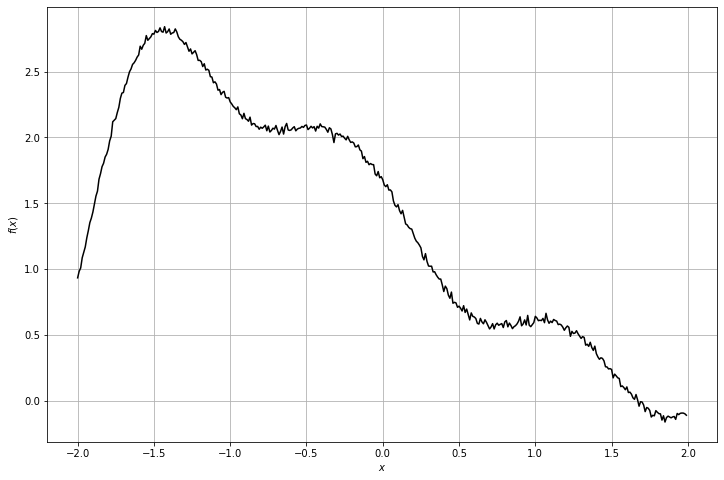

context_x =  (1, 90, 1)
context_y =  (1, 90, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


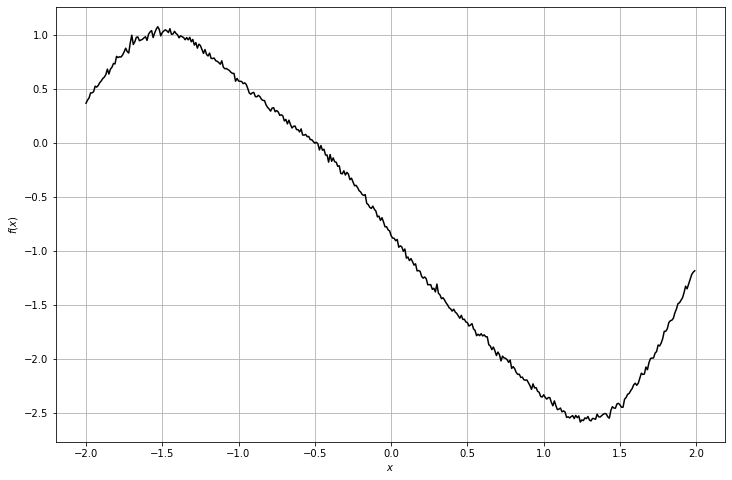

context_x =  (1, 28, 1)
context_y =  (1, 28, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


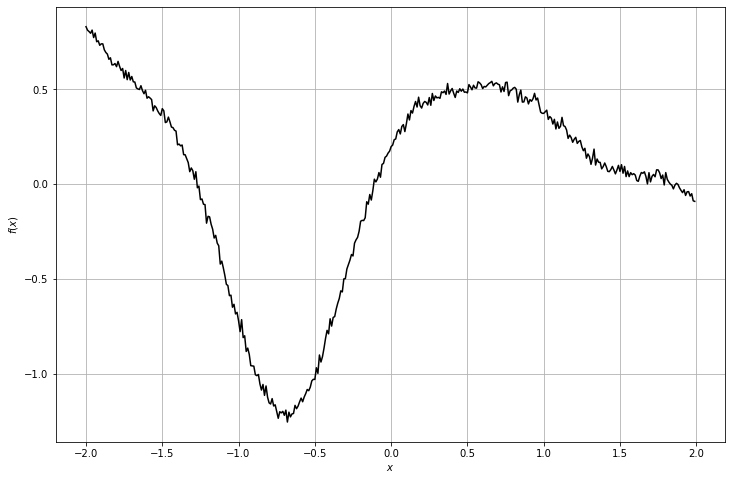

context_x =  (1, 68, 1)
context_y =  (1, 68, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


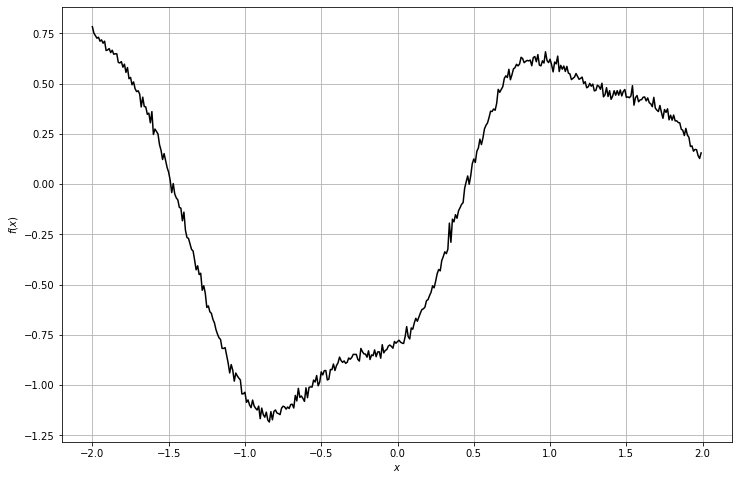

context_x =  (1, 3, 1)
context_y =  (1, 3, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


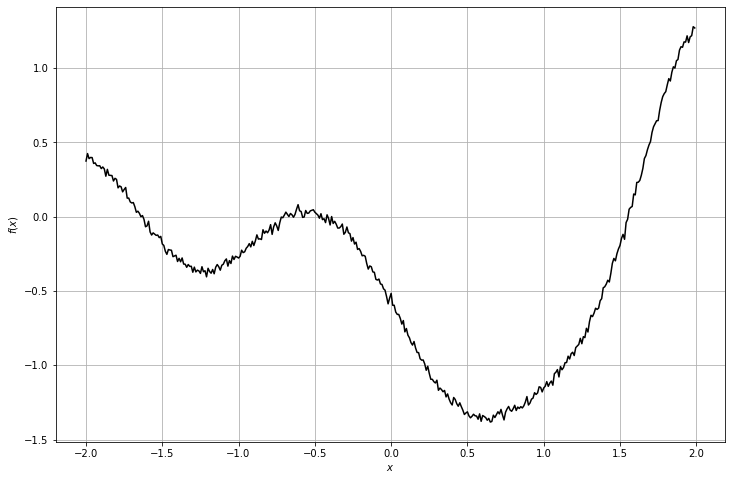

context_x =  (1, 63, 1)
context_y =  (1, 63, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


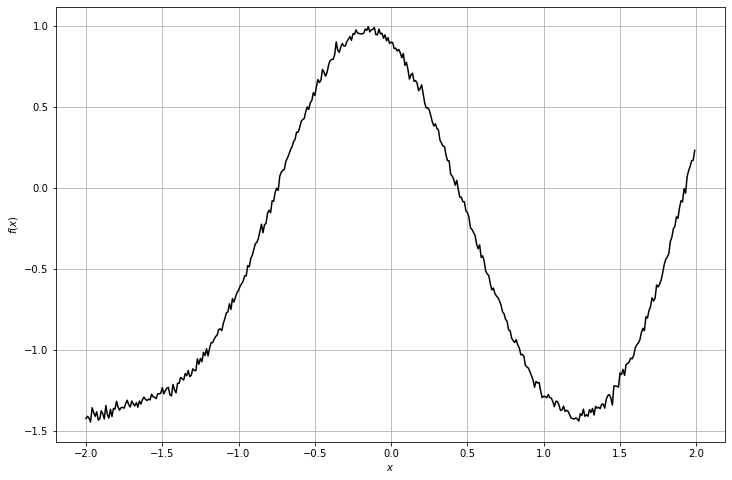

context_x =  (1, 36, 1)
context_y =  (1, 36, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


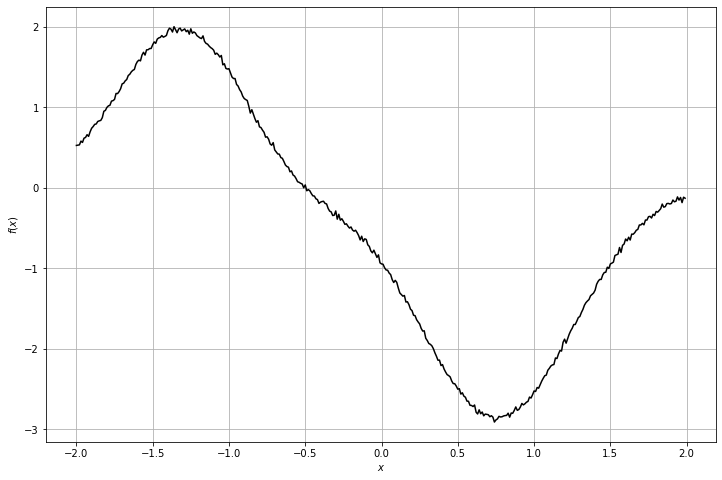

context_x =  (1, 21, 1)
context_y =  (1, 21, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


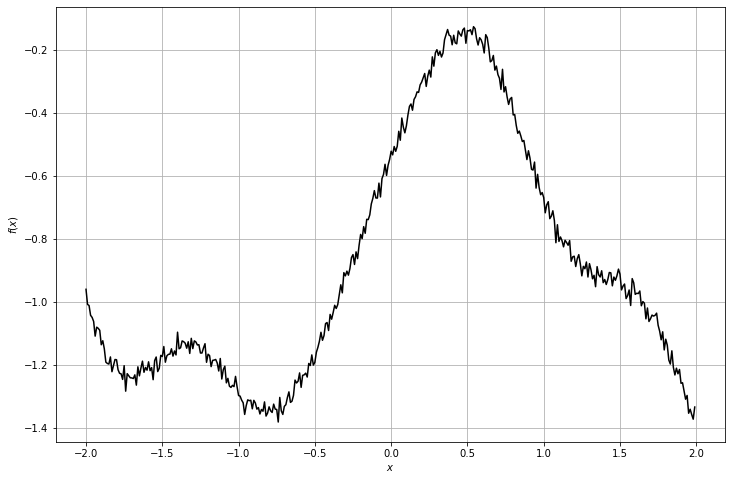

context_x =  (1, 95, 1)
context_y =  (1, 95, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


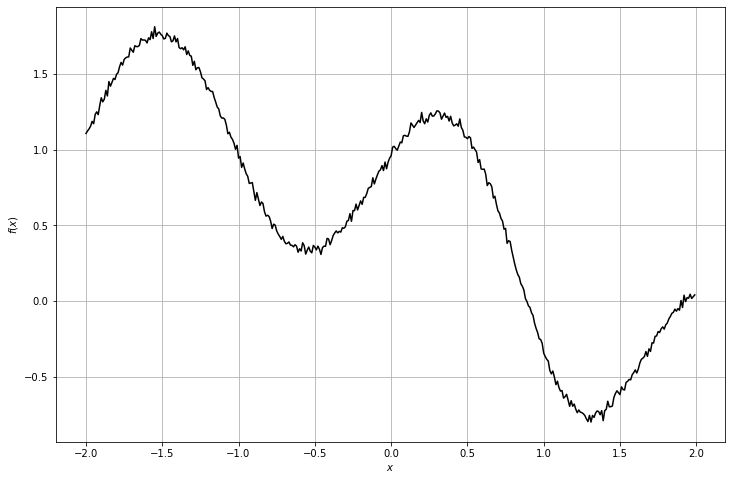

context_x =  (1, 99, 1)
context_y =  (1, 99, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


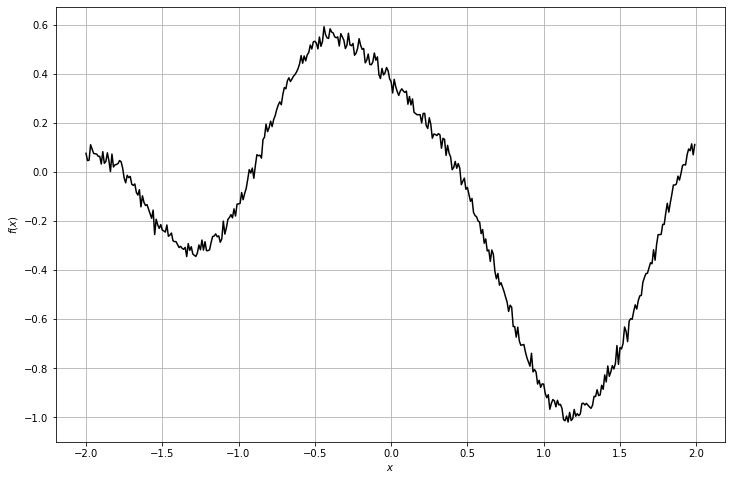

context_x =  (1, 4, 1)
context_y =  (1, 4, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


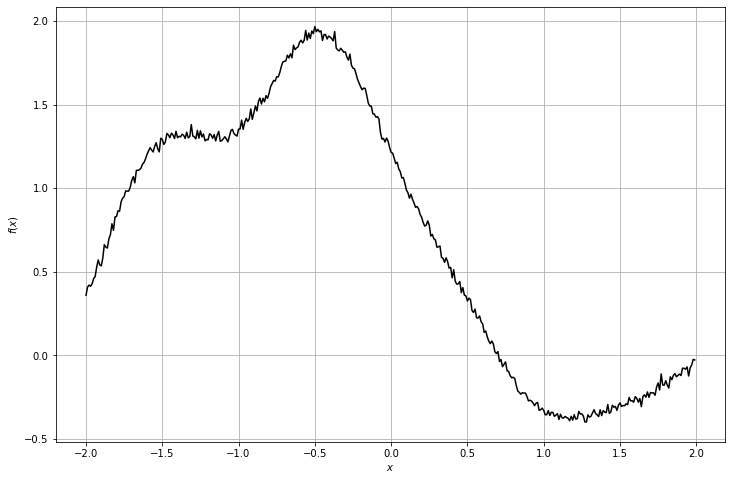

context_x =  (1, 75, 1)
context_y =  (1, 75, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


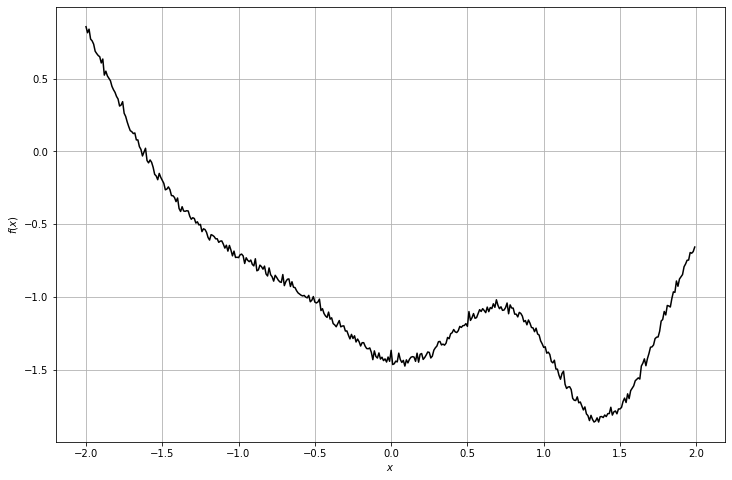

context_x =  (1, 88, 1)
context_y =  (1, 88, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


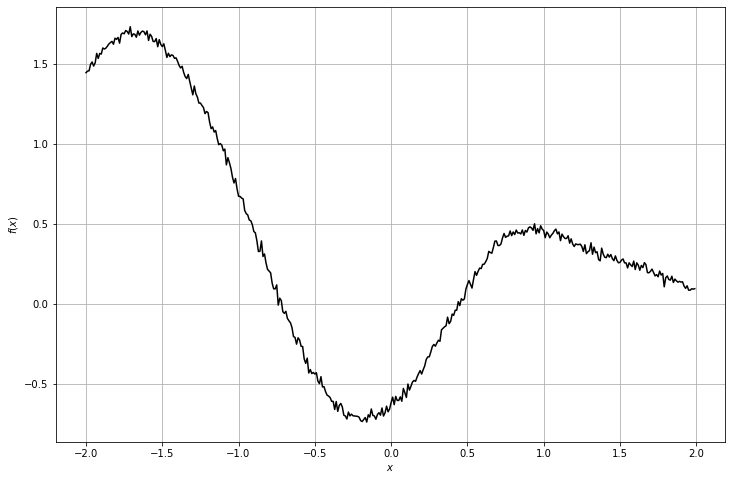

context_x =  (1, 65, 1)
context_y =  (1, 65, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


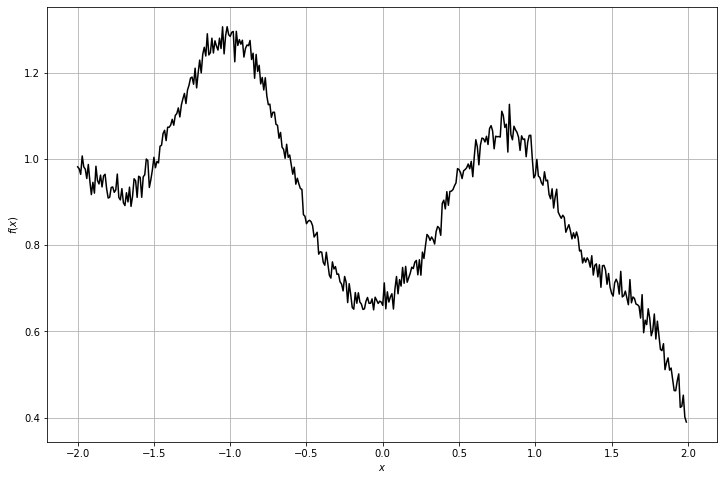

context_x =  (1, 57, 1)
context_y =  (1, 57, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


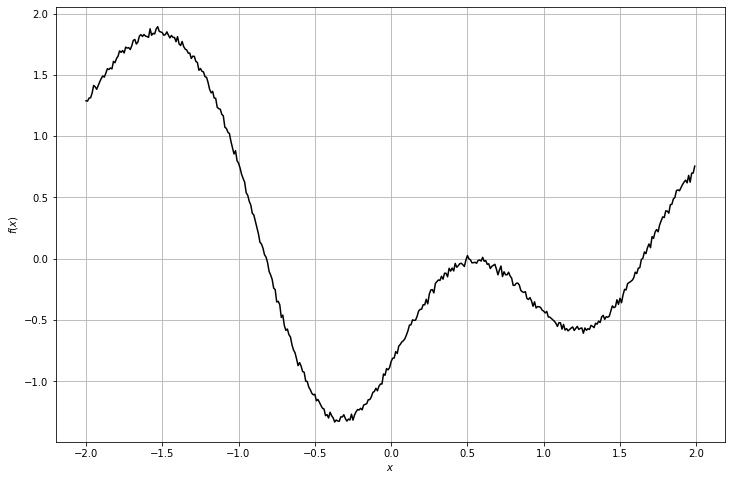

context_x =  (1, 15, 1)
context_y =  (1, 15, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


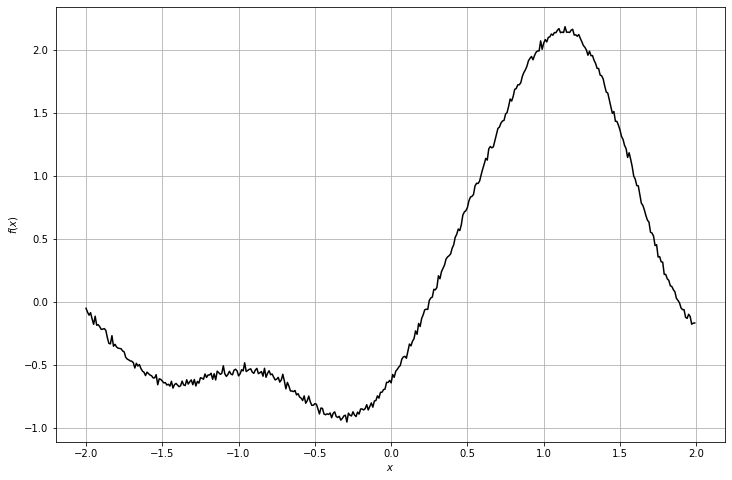

context_x =  (1, 40, 1)
context_y =  (1, 40, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


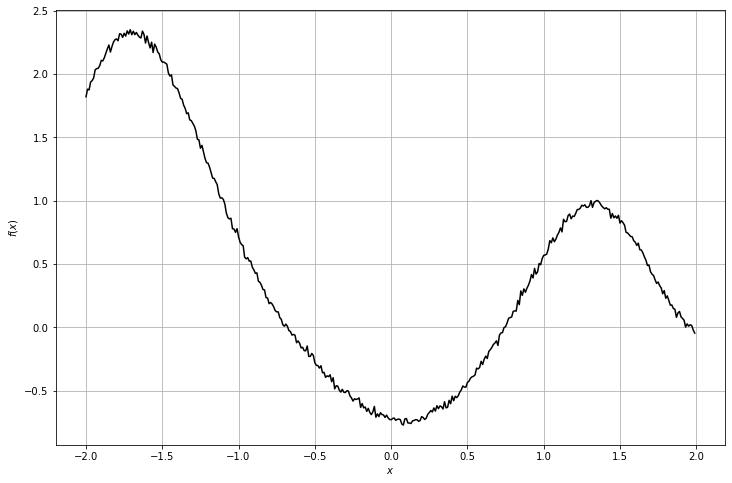

context_x =  (1, 14, 1)
context_y =  (1, 14, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


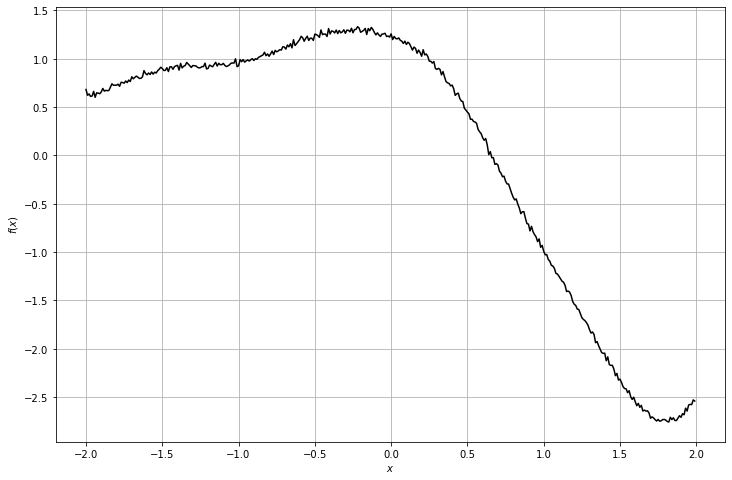

context_x =  (1, 90, 1)
context_y =  (1, 90, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


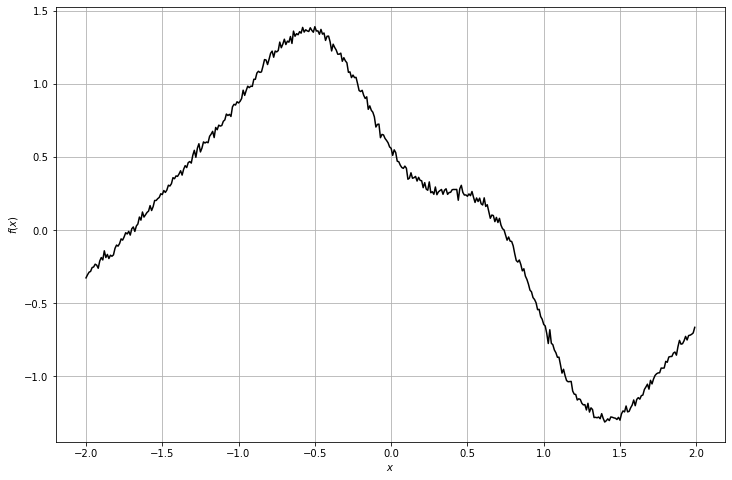

context_x =  (1, 76, 1)
context_y =  (1, 76, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


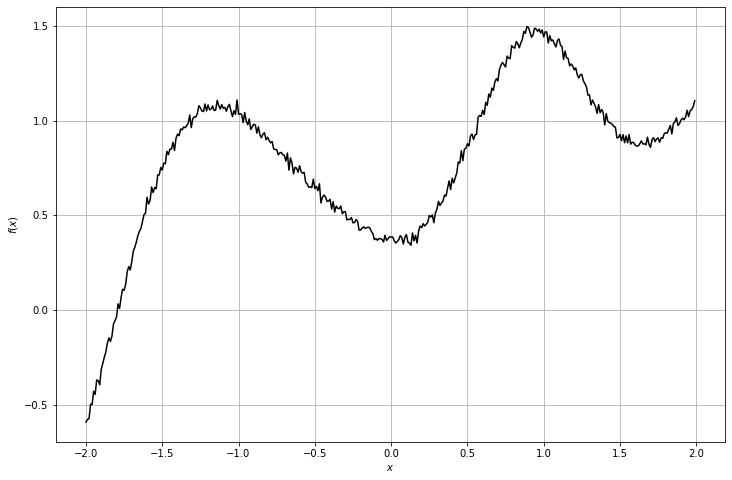

context_x =  (1, 54, 1)
context_y =  (1, 54, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


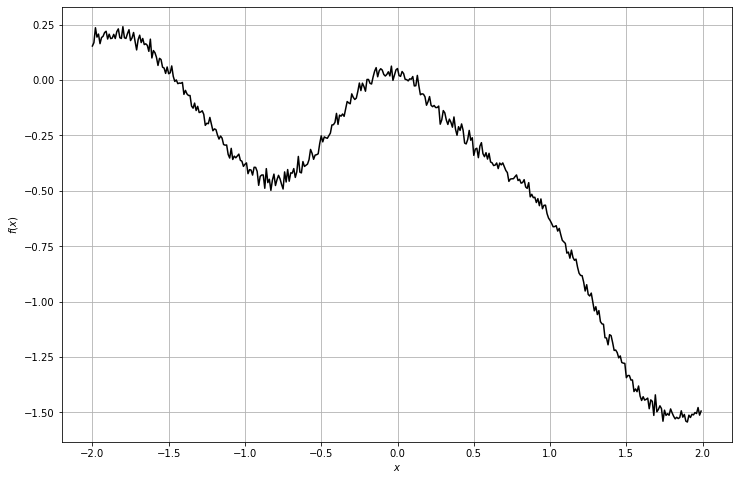

context_x =  (1, 75, 1)
context_y =  (1, 75, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


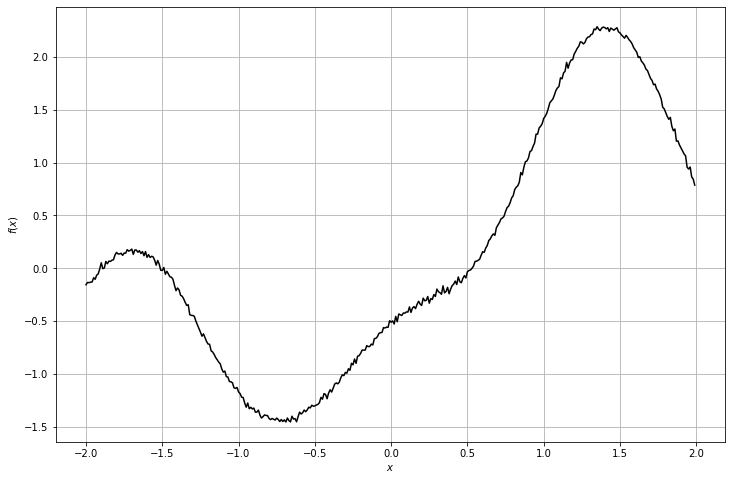

context_x =  (1, 25, 1)
context_y =  (1, 25, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


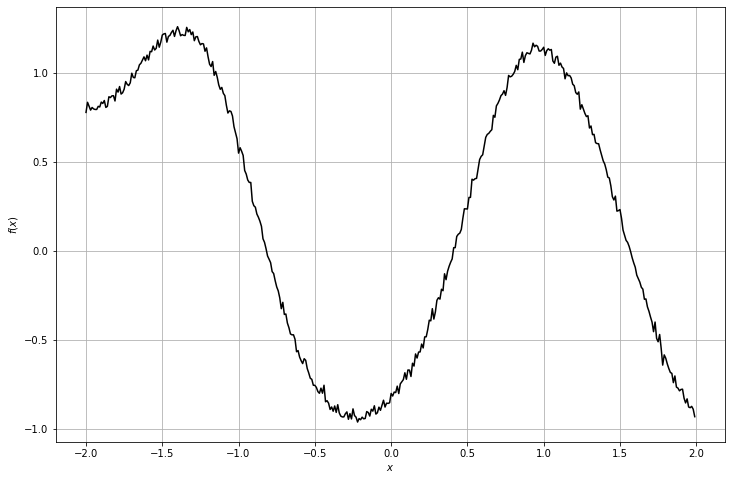

context_x =  (1, 57, 1)
context_y =  (1, 57, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


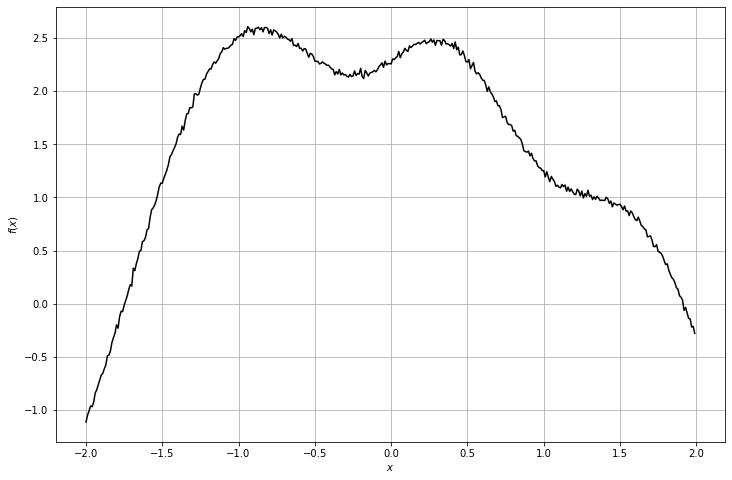

context_x =  (1, 40, 1)
context_y =  (1, 40, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


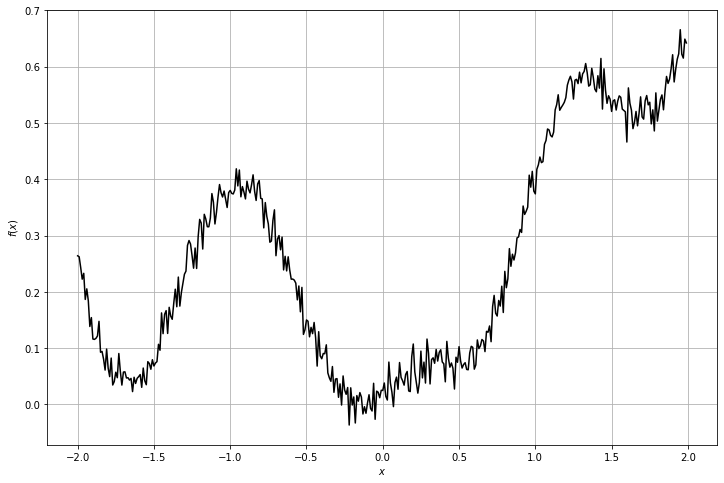

context_x =  (1, 12, 1)
context_y =  (1, 12, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


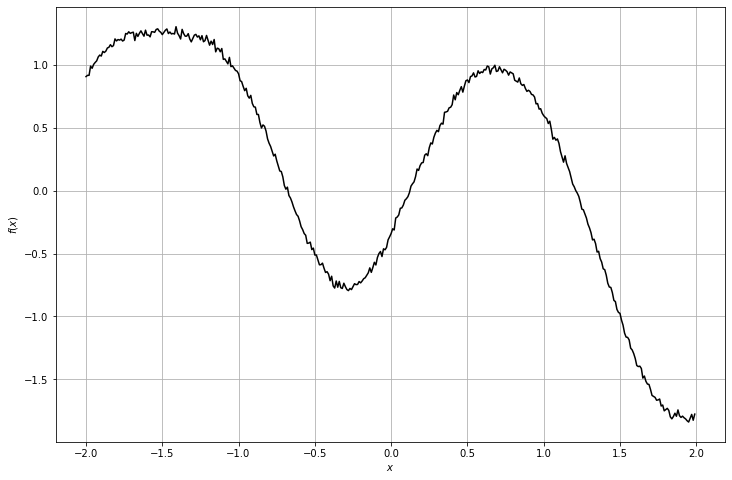

context_x =  (1, 7, 1)
context_y =  (1, 7, 1)
x_RBF =  (400, 1)
y_RBF =  (400, 1)
l1_now =  0.6
sigma_f =  1.0


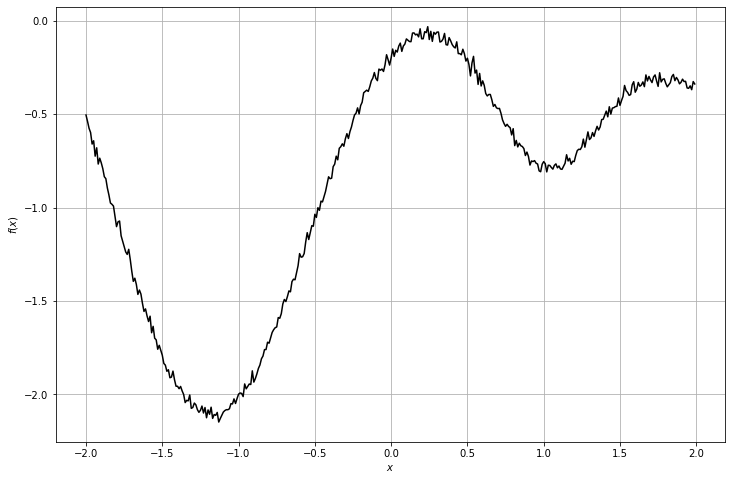

In [5]:
trueF_list = []
target_x_list = []
target_y_list = []
context_x_list = []
context_y_list = []
l1_list = []
sigma_f_list = []

sess = tf.Session()

for i in range(TRUEF_NUM) : 
    whole_query, target_y, l1_value, sigma_f_value = sess.run([data_test.query, data_test.target_y, data_test.l1, data_test.sigma_f])
    (context_x, context_y), target_x = whole_query
    context_x_list.append(context_x)
    context_y_list.append(context_y)
    
    print('context_x = ', context_x.shape)
    print('context_y = ', context_y.shape)
    
    x_RBF = np.squeeze(target_x, axis=0)
    y_RBF = np.squeeze(target_y, axis=0)
    
    print('x_RBF = ', x_RBF.shape)
    print('y_RBF = ', y_RBF.shape)
    
    target_x_list.append(target_x)
    target_y_list.append(target_y)
    print('l1_now = ', l1_value[0][0][0])
    l1_list.append(l1_value[0][0][0])
    print('sigma_f = ', sigma_f_value[0][0])
    sigma_f_list.append(sigma_f_value[0][0])
    
    plt.figure(figsize=(12, 8))
    plt.plot(x_RBF, y_RBF, "k")
    plt.xlabel(r"$x$")
    plt.ylabel(r"$f(x)$")
    plt.grid(True)
    plt.show()
    
    

In [8]:
### move these files to the path you need and rename these files to what you need. ###
np.save('./true_functions/trueF_list_from_NP_l1_6e-1_RBF_'+str(TRUEF_NUM), trueF_list)
np.save('./true_functions/target_y_from_NP_l1_6e-1_RBF_'+str(TRUEF_NUM), target_y_list)
np.save('./true_functions/target_x_from_NP_l1_6e-1_RBF_'+str(TRUEF_NUM), target_x_list)